# Sea ice extent variability in the Arctic
___

The Polar Regions are becoming more important for transportation and resources exploitation. But traveling to the Arctic or Antarctic requires information on the sea ice situation and planning becomes uncertain without having any idea about sea ice evolution in the desired period. Hence, in order to ease planning of any activity in near furture, an easy to handle short-term sea-ice extent forecast has been developed. Sea-ice prediction to go, so to speak.

**Project goals**
* identify major drivers for sea ice extent changes (in individual sectors)
* build model to predict near-future sea ice extent (SIE)

**Steakholders to be addressed**
  * Shipping companies: having a model easy to use helping with ship route planning
  * climate researchers/modellers: increased understanding on dependencies in the climate system

# Data Mining 
___

In [1]:
# https://towardsdatascience.com/the-complete-guide-to-time-series-analysis-and-forecasting-70d476bfe775

## Data description

In [2]:
# Schöne Tabelle machen: Name, Zeitraum, datentyp, Quelle?

**Sea ice**


|Variable | Abbreviations| Description
|:----------|:------------------|:------------------
|**Sea ice extent**| SIE | Area up to the ice edges (including open water, in sqkm)
|**Ice covered area**| ICA | Area actually covered by ice (excluding open water, in sqkm)
|suffix | N | Northern hemisphere variable
|suffix | S | Sorthern hemisphere variable
|**Datetime** | Datetime | time stamp in pandas timestamp format
|Date | yyyy.dddd  | time stamp format year.julian day
|**Ocean basin area** | OceanArea | Area of individaul Arctic sectors (SIE can max be OceanArea)


**Meteorological Data**

|Variable | Abbreviations| Description
|:----------|:------------------|:------------------
|**Air temperature**| Tair | surface level
|**Sea level pressure**| SLP | surface level
|**Zonal wind component** | UWND | east/west wind, surface level
|**Zonal wind component**| VWND | north/south wind, surface level
|Latitude| lat | north/south position
|Longitude | lon | east/west position
|Date| time | timestamp in seconds since ...
|**Land Temperature** | LandAvgTemp | globally averaged temperature over land
|**Overall global Temperature**| LandAndOceanAvgTemp | globally averaged land and ocean temperature
|**Ocean Temparature**| OceanTemp_proxy | calculated averaged ocean temperature
| | | 
 

**Carbon Dioxide**

|Variable | Abbreviations| Description
|:----------|:------------------|:------------------
|**Carbon dioxide in ppm**| CO2_(ppm) | Monthly mean amount of carbon dioxide in the atmosphere





**Climate Indices**

|Variable | Abbreviations| Description
|:----------|:------------------|:------------------
|**Arctic Oscillation Index**| AOI | 
|**North Atlantic Oscillation**| NAO | 
|**Antarctic Oscillation Pattern** | AAO | 
|**Pacific/North American Pattern**| PNA | 
|**Scandinavian Pattern** | SCAND | 

## Load data

In [3]:
# import packages
import warnings                                  # `do not disturbe` mode
warnings.filterwarnings('ignore')

import pandas as pd
from pandas.plotting import autocorrelation_plot
import numpy as np
from numpy import median

import seaborn as sn
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm

import datetime as dt
import scipy.stats as scs
from scipy.stats import boxcox
from scipy.optimize import minimize

from netCDF4 import Dataset
import ncdump as ncd                     # a function not provided by anaconda
from functools import reduce
from dateutil.relativedelta import relativedelta # working with dates with style

from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.gofplots import qqplot

import tensorflow as tf
from itertools import product                    # some useful functions
from tqdm import tqdm_notebook

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import TimeSeriesSplit

# import models
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# scores
from sklearn.model_selection import cross_val_predict, cross_val_score, cross_validate
from sklearn.metrics import roc_curve, confusion_matrix, accuracy_score, recall_score, precision_score
from sklearn.metrics import classification_report, confusion_matrix, make_scorer,mean_squared_error 
from sklearn.metrics import r2_score, median_absolute_error,mean_absolute_error
from sklearn.metrics import mean_squared_error, mean_squared_log_error

from dm_test import dm_test

%matplotlib inline
plt.style.use('seaborn')
RSEED = 42

#general plot settings
font = {'weight' : 'bold',
        'size'   : 14}
matplotlib.rc('font', **font)
matplotlib.rc('figure',figsize=(16, 9)) 
plt.rcParams['axes.labelweight'] = 'bold'


In [4]:
def mean_absolute_percentage_error(y_true,y_pred):
    return np.mean(np.abs((y_true-y_pred)/y_true))*100


In [5]:
def moving_average(series,n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])

In [6]:
# conversion from polar stereographic NSIDC grid to geographical coordinates
# code from https://github.com/nsidc/polar_stereo provided by NSIDC
# https://nsidc.org/data/polar-stereo/ps_grids.html
def polar_xy_to_lonlat(x, y, true_scale_lat, re, e, hemisphere):
    """Convert from Polar Stereographic (x, y) coordinates to
    geodetic longitude and latitude.
    Args:
        x (float): X coordinate(s) in km
        y (float): Y coordinate(s) in km
        true_scale_lat (float): true-scale latitude in degrees
        hemisphere (1 or -1): 1 for Northern hemisphere, -1 for Southern
        re (float): Earth radius in km
        e (float): Earth eccentricity
    Returns:
        If x and y are scalars then the result is a
        two-element list containing [longitude, latitude].
        If x and y are numpy arrays then the result will be a two-element
        list where the first element is a numpy array containing
        the longitudes and the second element is a numpy array containing
        the latitudes.
    """

    e2 = e * e
    slat = true_scale_lat * np.pi / 180
    rho = np.sqrt(x ** 2 + y ** 2)
    
    if abs(true_scale_lat - 90.) < 1e-5:
        t = rho * np.sqrt((1 + e) ** (1 + e) * (1 - e) ** (1 - e)) / (2 * re)
    else:
        cm = np.cos(slat) / np.sqrt(1 - e2 * (np.sin(slat) ** 2))
        t = np.tan((np.pi / 4) - (slat / 2)) / \
            ((1 - e * np.sin(slat)) / (1 + e * np.sin(slat))) ** (e / 2)
        t = rho * t / (re * cm) 

    chi = (np.pi / 2) - 2 * np.arctan(t)
    lat = chi + \
        ((e2 / 2) + (5 * e2 ** 2 / 24) + (e2 ** 3 / 12)) * np.sin(2 * chi) + \
        ((7 * e2 ** 2 / 48) + (29 * e2 ** 3 / 240)) * np.sin(4 * chi) + \
        (7 * e2 ** 3 / 120) * np.sin(6 * chi)
    lat = hemisphere * lat * 180 / np.pi
    lon = np.arctan2(hemisphere * x, -hemisphere * y)
    lon = hemisphere * lon * 180 / np.pi
    lon = lon + np.less(lon, 0) * 360
    if hemisphere == 1:
        lon = lon-45
    else:
        lon = lon#-180
    
    return [lon, lat]


### Sea ice extent

#### Low resolution data

**Monthly data**

In [7]:
# There are also shape files!!!!

In [8]:
# NSIDC monthly Sea ice extent, 25 km resolution, Northern and Southern hemisphere
# Read Northern and Southern Hemisphere data in two individual data frames, unsorted
# data order: All years Jan, all years Feb, all years Mar etc
datapathA     = 'ftp://sidads.colorado.edu/DATASETS/NOAA/G02135/north/monthly/data/'
datapathAA    = 'ftp://sidads.colorado.edu/DATASETS/NOAA/G02135/south/monthly/data/'
comlete_csvA  = []
comlete_csvAA = []

for i in range(1,13):
    filenameA  = datapathA + 'N_' + "%2.2d"%i + '_extent_v3.0.csv'
    filenameAA = datapathAA + 'S_' + "%2.2d"%i + '_extent_v3.0.csv'
    comlete_csvA.append(pd.read_csv(filenameA,encoding='utf-8'))
    comlete_csvAA.append(pd.read_csv(filenameAA,encoding='utf-8'))
    
SIE_A_Mon  = pd.concat(comlete_csvA, ignore_index = True)
SIE_AA_Mon = pd.concat(comlete_csvAA, ignore_index = True)
SIE_A_Mon.head()

,year,mo,data-type,region,extent,area
0,1979,1,Goddard,N,15.41,12.41
1,1980,1,Goddard,N,14.86,11.94
2,1981,1,Goddard,N,14.91,11.91
3,1982,1,Goddard,N,15.18,12.19
4,1983,1,Goddard,N,14.94,12.01


In [9]:
SIE_A_Mon.tail()

,year,mo,data-type,region,extent,area
496,2015,12,Goddard,N,12.04,10.64
497,2016,12,Goddard,N,11.46,9.62
498,2017,12,Goddard,N,11.74,10.26
499,2018,12,Goddard,N,11.86,10.45
500,2019,12,Goddard,N,11.90,10.52


In [10]:
SIE_A_Mon.columns = SIE_A_Mon.columns.str.lstrip()
SIE_AA_Mon.columns = SIE_AA_Mon.columns.str.lstrip()
SIE_A_Mon.columns

Index(['year', 'mo', 'data-type', 'region', 'extent', 'area'], dtype='object')

In [11]:
SIE_A_Mon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 501 entries, 0 to 500
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   year       501 non-null    int64  
 1   mo         501 non-null    int64  
 2   data-type  501 non-null    object 
 3   region     501 non-null    object 
 4   extent     501 non-null    float64
 5   area       501 non-null    float64
dtypes: float64(2), int64(2), object(2)
memory usage: 23.6+ KB


In [12]:
SIE_A_Mon.rename(columns={'mo':'Month'},inplace=True);
SIE_AA_Mon.rename(columns={'mo':'Month'},inplace=True);

# sort data in order to create proper timeseries for both hemispheres
SIE_A_Mon['Day']      = 1
SIE_A_Mon['Datetime'] = pd.to_datetime(SIE_A_Mon[['year','Month','Day']])
SIE_AA_Mon['Day']      = 1
SIE_AA_Mon['Datetime'] = pd.to_datetime(SIE_AA_Mon[['year','Month','Day']])
SIE_A_Mon.head()

,year,Month,data-type,region,extent,area,Day,Datetime
0,1979,1,Goddard,N,15.41,12.41,1,1979-01-01
1,1980,1,Goddard,N,14.86,11.94,1,1980-01-01
2,1981,1,Goddard,N,14.91,11.91,1,1981-01-01
3,1982,1,Goddard,N,15.18,12.19,1,1982-01-01
4,1983,1,Goddard,N,14.94,12.01,1,1983-01-01


In [13]:
SIE_A_Mon.sort_values(by='Datetime',ascending=True,axis=0,inplace = True)
SIE_AA_Mon.sort_values(by='Datetime',ascending=True,axis=0,inplace = True)
SIE_A_Mon.head()

,year,Month,data-type,region,extent,area,Day,Datetime
417,1978,11,Goddard,N,11.65,9.04,1,1978-11-01
459,1978,12,Goddard,N,13.67,10.90,1,1978-12-01
0,1979,1,Goddard,N,15.41,12.41,1,1979-01-01
42,1979,2,Goddard,N,16.18,13.18,1,1979-02-01
84,1979,3,Goddard,N,16.34,13.21,1,1979-03-01


In [14]:
# create a dictionary containing all data with firstentry and lastentry date
tsdates = {'25km SIE N':[SIE_A_Mon.Datetime.iloc[0],SIE_A_Mon.Datetime.iloc[-1]],\
           '25km SIE S':[SIE_AA_Mon.Datetime.iloc[0],SIE_AA_Mon.Datetime.iloc[-1]]}
tsdates

{'25km SIE N': [Timestamp('1978-11-01 00:00:00'),
  Timestamp('2020-07-01 00:00:00')],
 '25km SIE S': [Timestamp('1978-11-01 00:00:00'),
  Timestamp('2020-07-01 00:00:00')]}

In [15]:
# Drop Day-columns, is not needed anymore
SIE_A_Mon.drop(['Day','region'],axis=1, inplace = True)
SIE_AA_Mon.drop(['Day','region'],axis=1, inplace = True)

# Rename columns to distingiush northern and southern variables 
SIE_A_Mon.rename(columns={'extent':'Extent_N','area':'Area_N','data-type':'data-type_N'},inplace=True)
SIE_AA_Mon.rename(columns={'extent':'Extent_S','area':'Area_S','data-type':'data-type_S'},inplace=True)

In [16]:
# Merge Northern and Southern Hemisphere data to a single data frame
SIE_Mon = pd.merge(SIE_A_Mon,SIE_AA_Mon, on=['year','Month','Datetime'])
SIE_Mon.head()

,year,Month,data-type_N,Extent_N,Area_N,Datetime,data-type_S,Extent_S,Area_S
0,1978,11,Goddard,11.65,9.04,1978-11-01,Goddard,15.90,11.69
1,1978,12,Goddard,13.67,10.90,1978-12-01,Goddard,10.40,6.97
2,1979,1,Goddard,15.41,12.41,1979-01-01,Goddard,5.40,3.47
3,1979,2,Goddard,16.18,13.18,1979-02-01,Goddard,3.14,2.11
4,1979,3,Goddard,16.34,13.21,1979-03-01,Goddard,4.00,2.66


In [17]:
SIE_Mon['data-type_N'] = SIE_Mon['data-type_N'].str.lstrip()
SIE_Mon['data-type_S'] = SIE_Mon['data-type_S'].str.lstrip()
SIE_Mon['data-type_N'].unique()

array(['Goddard', '-9999', 'NRTSI-G'], dtype=object)

In [18]:
SIE_Mon[SIE_Mon['data-type_N']!=SIE_Mon['data-type_S']]

,year,Month,data-type_N,Extent_N,Area_N,Datetime,data-type_S,Extent_S,Area_S


In [19]:
SIE_Mon.drop('data-type_S',axis=1,inplace=True)
SIE_Mon['data-type_N'][SIE_Mon['data-type_N']=='Goddard'] = 1
SIE_Mon['data-type_N'][SIE_Mon['data-type_N']=='NRTSI-G'] = 2
SIE_Mon['data-type_N'].unique()

array([1, '-9999', 2], dtype=object)

In [20]:
SIE_Mon.replace('-9999', 0,inplace=True)
SIE_Mon.replace(-9999, np.NaN,inplace=True)
SIE_Mon[SIE_Mon['Area_N'].isnull()== True]

,year,Month,data-type_N,Extent_N,Area_N,Datetime,Extent_S,Area_S
105,1987,8,1,7.63,NaN,1987-08-01,17.6,14.02
109,1987,12,0,NaN,NaN,1987-12-01,NaN,NaN
110,1988,1,0,NaN,NaN,1988-01-01,NaN,NaN


In [21]:
SIE_Mon.describe()

,year,Month,data-type_N,Extent_N,Area_N,Extent_S,Area_S
count,501.000000,501.000000,501.000000,499.000000,498.000000,499.000000,499.000000
mean,1999.209581,6.485030,1.009980,11.443747,9.321124,11.560842,8.771122
std,12.068719,3.459809,0.133792,3.226169,3.218953,5.578456,4.586709
min,1978.000000,1.000000,0.000000,3.570000,2.410000,2.290000,1.370000
25%,1989.000000,3.000000,1.000000,8.655000,6.302500,5.855000,4.090000
50%,1999.000000,6.000000,1.000000,12.150000,10.060000,11.980000,9.210000
75%,2010.000000,9.000000,1.000000,14.325000,12.300000,16.895000,13.360000
max,2020.000000,12.000000,2.000000,16.340000,13.900000,19.760000,15.750000


#### High resolution data

**Daily Data**

In [22]:
# MASIE SIE northern Hemisphere sectors
# data source: here kaggle
# actual data can be obtained from 
# ftp://sidads.colorado.edu/DATASETS/NOAA/G02186/masie_4km_allyears_extent_sqkm.csv and
# ftp://sidads.colorado.edu/DATASETS/NOAA/G02186/masie_1km_allyears_extent_sqkm.csv
# but some other data reading is necessary (header=1, column names with numbers in front: (0) Northern_hemisphere)
# solve when is time and read directly from server with most actual data
df_sie_1km    = pd.read_csv('data/MASIE_SIE/masie_1km_allyears_extent_sqkm.csv')
df_sie_4km    = pd.read_csv('data/MASIE_SIE/masie_4km_allyears_extent_sqkm.csv')
print(df_sie_1km.shape)
print(df_sie_4km.shape)

(2010, 18)
(5228, 18)


In [23]:
# convert data in pandas datetime and reorder frames
df_sie_4km['Datetime'] = pd.to_datetime(df_sie_4km.yyyyddd,format='%Y%j')
df_sie_1km['Datetime'] = pd.to_datetime(df_sie_1km.yyyyddd,format='%Y%j')

# reorder columns
column_names = ['yyyyddd', 'Datetime','Northern_Hemisphere', 'Beaufort_Sea',\
                'Chukchi_Sea','East_Siberian_Sea', 'Laptev_Sea', 'Kara_Sea', \
                'Barents_Sea','Greenland_Sea', 'Baffin_Bay_Gulf_of_St._Lawrence',\
                'Canadian_Archipelago', 'Hudson_Bay', 'Central_Arctic', 'Bering_Sea',\
                'Baltic_Sea', 'Sea_of_Okhotsk', 'Yellow_Sea', 'Cook_Inlet']
df_sie_4km   = df_sie_4km.reindex(columns=column_names)
df_sie_1km   = df_sie_1km.reindex(columns=column_names)

df_sie_4km.head()

,yyyyddd,Datetime,Northern_Hemisphere,Beaufort_Sea,Chukchi_Sea,East_Siberian_Sea,Laptev_Sea,Kara_Sea,Barents_Sea,Greenland_Sea,Baffin_Bay_Gulf_of_St._Lawrence,Canadian_Archipelago,Hudson_Bay,Central_Arctic,Bering_Sea,Baltic_Sea,Sea_of_Okhotsk,Yellow_Sea,Cook_Inlet
0,2006001,2006-01-01,13034723.95,1069710.81,966006.16,1087102.72,897773.37,901663.34,432629.77,550158.41,831365.98,852715.31,1260715.19,3225371.74,639590.07,11408.53,287369.54,12152.54,6420.96
1,2006002,2006-01-02,13034723.95,1069710.81,966006.16,1087102.72,897773.37,901663.34,432629.77,550158.41,831365.98,852715.31,1260715.19,3225371.74,639590.07,11408.53,287369.54,12152.54,6420.96
2,2006003,2006-01-03,13170663.24,1069710.81,966006.16,1087102.72,897773.37,901663.34,432629.77,595342.42,855907.47,852715.31,1260779.00,3240507.71,666030.40,11408.53,311943.21,12152.54,6420.96
3,2006004,2006-01-04,13409715.53,1069710.81,966006.16,1087102.72,897773.37,906439.04,458823.88,605747.86,980253.85,852715.31,1260779.00,3240326.47,683780.08,11408.53,372868.02,6989.96,6420.96
4,2006005,2006-01-05,13416779.12,1069710.81,966006.16,1087102.72,897773.37,908697.29,474574.82,600826.71,970631.09,852715.31,1260779.00,3240326.47,683795.38,21311.46,363515.34,8240.73,8202.95


In [24]:
df_sie_4km.tail()

,yyyyddd,Datetime,Northern_Hemisphere,Beaufort_Sea,Chukchi_Sea,East_Siberian_Sea,Laptev_Sea,Kara_Sea,Barents_Sea,Greenland_Sea,Baffin_Bay_Gulf_of_St._Lawrence,Canadian_Archipelago,Hudson_Bay,Central_Arctic,Bering_Sea,Baltic_Sea,Sea_of_Okhotsk,Yellow_Sea,Cook_Inlet
5223,2020154,2020-06-02,11131775.25,1040342.90,844190.88,1028388.94,829341.58,653632.74,259734.66,567191.72,773887.88,809641.45,1025628.37,3225547.28,42404.59,0.0,30684.18,0.0,16.06
5224,2020155,2020-06-03,11077668.70,1040486.27,834569.89,1025227.87,822888.21,653705.01,261800.85,567938.29,747473.13,806696.37,1021014.77,3224802.26,40190.85,0.0,29716.82,0.0,16.06
5225,2020156,2020-06-04,11066236.72,1034991.58,828236.90,1022452.39,826396.15,645918.79,239360.56,590869.29,720949.47,809980.21,1054601.98,3216617.33,41067.72,0.0,33636.24,0.0,16.06
5226,2020157,2020-06-05,10938386.73,1029353.31,832822.46,1023802.20,819979.81,631486.19,228942.94,536002.44,674803.73,806915.78,1048525.02,3217977.48,44777.99,0.0,41839.29,0.0,16.06
5227,2020158,2020-06-06,10718955.65,1016442.86,804309.25,1007274.75,784485.25,598396.86,224217.99,524540.72,658149.57,806267.48,990369.02,3225055.03,42737.67,0.0,35551.11,0.0,16.06


In [25]:
df_sie_1km.head()

,yyyyddd,Datetime,Northern_Hemisphere,Beaufort_Sea,Chukchi_Sea,East_Siberian_Sea,Laptev_Sea,Kara_Sea,Barents_Sea,Greenland_Sea,Baffin_Bay_Gulf_of_St._Lawrence,Canadian_Archipelago,Hudson_Bay,Central_Arctic,Bering_Sea,Baltic_Sea,Sea_of_Okhotsk,Yellow_Sea,Cook_Inlet
0,2014336,2014-12-02,11668882.57,1074998.39,696800.69,1072850.49,894771.33,928366.76,473499.76,523489.08,647878.33,853656.72,1095308.55,3242883.17,84132.41,0.0,76064.99,0.00,0.00
1,2014337,2014-12-03,11644559.04,1074998.39,691507.68,1075410.13,894771.33,917976.29,498064.36,514114.24,644850.83,853656.72,1099930.07,3243635.30,78690.08,0.0,49021.60,19.63,0.00
2,2014338,2014-12-04,11773402.40,1074998.39,691904.35,1075410.13,894771.33,917976.29,498064.36,514114.24,717017.10,853656.72,1154631.23,3243635.30,80269.35,0.0,49021.60,19.63,0.00
3,2014339,2014-12-05,11824301.51,1074998.39,727577.81,1074766.79,894771.33,922995.95,516174.81,476639.62,689476.51,853656.72,1192514.58,3224472.44,87371.03,0.0,79844.65,981.50,146.98
4,2014340,2014-12-06,11910804.51,1074998.39,754188.65,1077288.07,894771.33,928106.53,558577.77,476854.30,693781.64,853656.72,1199696.54,3225152.02,84829.12,0.0,79844.65,981.50,146.98


In [26]:
df_sie_4km.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5228 entries, 0 to 5227
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   yyyyddd                          5228 non-null   int64         
 1   Datetime                         5228 non-null   datetime64[ns]
 2   Northern_Hemisphere              5228 non-null   float64       
 3   Beaufort_Sea                     5228 non-null   float64       
 4   Chukchi_Sea                      5228 non-null   float64       
 5   East_Siberian_Sea                5228 non-null   float64       
 6   Laptev_Sea                       5228 non-null   float64       
 7   Kara_Sea                         5228 non-null   float64       
 8   Barents_Sea                      5228 non-null   float64       
 9   Greenland_Sea                    5228 non-null   float64       
 10  Baffin_Bay_Gulf_of_St._Lawrence  5228 non-null   float64    

In [27]:
df_sie_1km.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2010 entries, 0 to 2009
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   yyyyddd                          2010 non-null   int64         
 1   Datetime                         2010 non-null   datetime64[ns]
 2   Northern_Hemisphere              2010 non-null   float64       
 3   Beaufort_Sea                     2010 non-null   float64       
 4   Chukchi_Sea                      2010 non-null   float64       
 5   East_Siberian_Sea                2010 non-null   float64       
 6   Laptev_Sea                       2010 non-null   float64       
 7   Kara_Sea                         2010 non-null   float64       
 8   Barents_Sea                      2010 non-null   float64       
 9   Greenland_Sea                    2010 non-null   float64       
 10  Baffin_Bay_Gulf_of_St._Lawrence  2010 non-null   float64    

In [28]:
df_sie_4km.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
yyyyddd,5228.0,2.012925e+06,4.171137e+03,2006001.00,2.009235e+06,2.013092e+06,2.016310e+06,2020158.00
Northern_Hemisphere,5228.0,1.077319e+07,3.506788e+06,3368882.08,7.776474e+06,1.155189e+07,1.396438e+07,15821891.32
Beaufort_Sea,5228.0,9.316928e+05,2.076349e+05,173466.99,8.217469e+05,1.065792e+06,1.070445e+06,1070654.85
Chukchi_Sea,5228.0,7.243485e+05,2.861873e+05,51.08,5.114743e+05,8.744206e+05,9.659891e+05,966006.16
East_Siberian_Sea,5228.0,9.223855e+05,2.861618e+05,35.05,9.001969e+05,1.082846e+06,1.087137e+06,1087137.23
Laptev_Sea,5228.0,7.166124e+05,2.805853e+05,887.00,6.186979e+05,8.964551e+05,8.978448e+05,897844.80
Kara_Sea,5228.0,6.292946e+05,3.519400e+05,0.00,2.572583e+05,8.318226e+05,9.216421e+05,935023.26
Barents_Sea,5228.0,3.063228e+05,2.551396e+05,0.00,4.835950e+04,2.758163e+05,5.271003e+05,936263.42
Greenland_Sea,5228.0,4.893531e+05,1.652465e+05,55818.35,3.688619e+05,5.382891e+05,6.152129e+05,866528.47
Baffin_Bay_Gulf_of_St._Lawrence,5228.0,7.691650e+05,5.510472e+05,2329.95,1.991106e+05,7.928670e+05,1.216682e+06,1997627.73


**Monthly data**  
Monthly values must be derived from daily values as a monthly product is not available  


In [29]:
# calculate monthly mean values from daily data
df_sie_4km_Mon = df_sie_4km.groupby(pd.Grouper(key='Datetime', freq='1M')).mean().reset_index()
df_sie_1km_Mon = df_sie_1km.groupby(pd.Grouper(key='Datetime', freq='1M')).mean().reset_index()

In [30]:
df_sie_4km_Mon['Datetime'] = df_sie_4km_Mon['Datetime'] + pd.offsets.Day() - pd.offsets.MonthBegin()
df_sie_1km_Mon['Datetime'] = df_sie_1km_Mon['Datetime'] + pd.offsets.Day() - pd.offsets.MonthBegin()
df_sie_4km_Mon.head()

,Datetime,yyyyddd,Northern_Hemisphere,Beaufort_Sea,Chukchi_Sea,East_Siberian_Sea,Laptev_Sea,Kara_Sea,Barents_Sea,Greenland_Sea,Baffin_Bay_Gulf_of_St._Lawrence,Canadian_Archipelago,Hudson_Bay,Central_Arctic,Bering_Sea,Baltic_Sea,Sea_of_Okhotsk,Yellow_Sea,Cook_Inlet
0,2006-01-01,2006016.0,1.347697e+07,1.069711e+06,966006.160000,1.087103e+06,897773.370000,914213.721613,387260.425484,564104.102903,1.030959e+06,852715.310000,1.260775e+06,3.188713e+06,753161.689677,30734.568065,433881.107742,12692.165806,8306.441613
1,2006-02-01,2006045.5,1.425050e+07,1.069711e+06,963153.596429,1.086877e+06,897773.370000,918538.611429,486994.851786,583864.143929,1.261754e+06,852715.310000,1.258036e+06,3.190598e+06,763445.835714,81808.585714,754421.181786,15069.310000,7983.287143
2,2006-03-01,2006075.0,1.432544e+07,1.069334e+06,962628.774516,1.085832e+06,897773.370000,922408.818710,638770.857097,621167.343226,1.142959e+06,852457.329677,1.240272e+06,3.240802e+06,671021.211290,139209.723226,795021.644194,3579.910323,5673.052581
3,2006-04-01,2006105.5,1.363197e+07,1.068511e+06,962734.245333,1.083360e+06,896488.400000,915834.552000,530480.820333,596417.644333,1.048169e+06,849888.577667,1.229156e+06,3.185823e+06,661025.891333,84828.084667,510972.706000,106.730000,3393.193000
4,2006-05-01,2006136.0,1.215317e+07,1.062253e+06,949676.378387,1.079680e+06,882955.662258,860040.409032,207743.688387,518021.643226,8.977642e+05,823066.069355,1.073563e+06,3.153358e+06,431471.885161,12672.149032,196972.454516,0.000000,541.624194


In [31]:
tsdates['4km SIE N'] = [df_sie_4km_Mon.Datetime.iloc[0],df_sie_4km_Mon.Datetime.iloc[-1]]
tsdates['1km SIE N'] = [df_sie_1km_Mon.Datetime.iloc[0],df_sie_1km_Mon.Datetime.iloc[-1]]
tsdates

{'25km SIE N': [Timestamp('1978-11-01 00:00:00'),
  Timestamp('2020-07-01 00:00:00')],
 '25km SIE S': [Timestamp('1978-11-01 00:00:00'),
  Timestamp('2020-07-01 00:00:00')],
 '4km SIE N': [Timestamp('2006-01-01 00:00:00'),
  Timestamp('2020-06-01 00:00:00')],
 '1km SIE N': [Timestamp('2014-12-01 00:00:00'),
  Timestamp('2020-06-01 00:00:00')]}

In [32]:
df_sie_4km_Mon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174 entries, 0 to 173
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Datetime                         174 non-null    datetime64[ns]
 1   yyyyddd                          174 non-null    float64       
 2   Northern_Hemisphere              174 non-null    float64       
 3   Beaufort_Sea                     174 non-null    float64       
 4   Chukchi_Sea                      174 non-null    float64       
 5   East_Siberian_Sea                174 non-null    float64       
 6   Laptev_Sea                       174 non-null    float64       
 7   Kara_Sea                         174 non-null    float64       
 8   Barents_Sea                      174 non-null    float64       
 9   Greenland_Sea                    174 non-null    float64       
 10  Baffin_Bay_Gulf_of_St._Lawrence  174 non-null    float64      

In [33]:
df_sie_4km_Mon.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
yyyyddd,174.0,2.012938e+06,4.198621e+03,2.006016e+06,2.009235e+06,2.013090e+06,2.016313e+06,2.020156e+06
Northern_Hemisphere,174.0,1.080062e+07,3.463614e+06,3.621125e+06,7.983911e+06,1.184621e+07,1.394089e+07,1.555148e+07
Beaufort_Sea,174.0,9.330724e+05,2.011290e+05,2.132291e+05,8.203510e+05,1.059543e+06,1.070251e+06,1.070655e+06
Chukchi_Sea,174.0,7.261358e+05,2.798810e+05,5.260440e+04,5.178745e+05,8.626168e+05,9.654109e+05,9.660062e+05
East_Siberian_Sea,174.0,9.237921e+05,2.736883e+05,1.246924e+03,9.030119e+05,1.077593e+06,1.087121e+06,1.087137e+06
Laptev_Sea,174.0,7.182922e+05,2.678137e+05,4.589861e+03,5.754198e+05,8.911770e+05,8.978448e+05,8.978448e+05
Kara_Sea,174.0,6.317481e+05,3.435673e+05,2.352800e+02,2.848421e+05,8.263944e+05,9.157154e+05,9.350233e+05
Barents_Sea,174.0,3.085829e+05,2.502531e+05,0.000000e+00,5.673684e+04,2.643956e+05,5.304978e+05,8.341219e+05
Greenland_Sea,174.0,4.905873e+05,1.596550e+05,9.974380e+04,3.749989e+05,5.384561e+05,6.157747e+05,7.395580e+05
Baffin_Bay_Gulf_of_St._Lawrence,174.0,7.736026e+05,5.447377e+05,1.534274e+04,2.132831e+05,8.146460e+05,1.206957e+06,1.864465e+06


In [34]:
df_sie_4km_Mon.columns

Index(['Datetime', 'yyyyddd', 'Northern_Hemisphere', 'Beaufort_Sea',
       'Chukchi_Sea', 'East_Siberian_Sea', 'Laptev_Sea', 'Kara_Sea',
       'Barents_Sea', 'Greenland_Sea', 'Baffin_Bay_Gulf_of_St._Lawrence',
       'Canadian_Archipelago', 'Hudson_Bay', 'Central_Arctic', 'Bering_Sea',
       'Baltic_Sea', 'Sea_of_Okhotsk', 'Yellow_Sea', 'Cook_Inlet'],
      dtype='object')

**Notes:**
    
    averages of monthly averages seem to be slightly higher -> check + think about how to proceed!

**Ocean areas for this data set**

In [35]:
# Shapes for individual regions. Improve reading in!
text =  pd.read_excel('ftp://sidads.colorado.edu/DATASETS/NOAA/G02186/ancillary/MASIE_regions_polygon_vertices.xls')

In [36]:
text.head()

,Unnamed: 0,Unnamed: 1,Vertices,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23
0,Region Number Identifier,Name,Lat1,Lon1,Lat2,Lon2,Lat3,Lon3,Lat4,Lon4,...,Lat7,Lon7,Lat8,Lon8,Lat9,Lon9,Lat10,Lon10,Lat11,Lon11
1,1,Beaufort Sea,65.3735,-156.645,80,-156.479,77.69,-112.34,75.67,-124.575,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Chukchi Sea,65.3735,-156.645,66,-180,80,-180,80,-156.479,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,East Siberian Sea,65,145,80,145,80,-180,66,-180,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Laptev Sea,65,100,78.273,99.887,81.078,94.953,80,145,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
# Ocean areas for individual sectors (direct download does not work for some reason, create a new file manually)
filename = 'data/MASIE_SIE/OceanAreas.csv'
OceanAreas = pd.read_csv(filename,delimiter=',')
OceanAreas

,Region No.,Region Name,1 km Grid Cell Size(col x row),4 km Grid Cell Size (col x row),Byte Value,Area of Ocean Pixels (km2)
0,0,Northern Hemisphere,24576 x 24576,6144 x 6144,NaN,129153320
1,1,Beaufort Sea,1917 x 1730,497 x 449,1.0,1069711
2,2,Chukchi Sea,1591 x 1114,416 x 297,2.0,966006
3,3,East Siberian Sea,1832 x 1760,476 x 457,3.0,1087137
4,4,Laptev Sea,2024 x 1979,524 x 513,4.0,897845
5,5,Kara Sea,1588 x 2017,415 x 523,5.0,935023
6,6,Barents Sea,2376 x 2063,612 x 533,6.0,1646235
7,7,Greenland Sea,2255 x 3328,582 x 850,7.0,3382641
8,8,Baffin Bay/Gulf of St. Lawrence,3156 x 4956,807 x 1257,8.0,3982776
9,9,Canadian Archipelago,2052 x 2184,531 x 564,9.0,852767


In [38]:
# Ocean Area in km^2
OceanAreas.rename(columns={'Area of Ocean Pixels (km2)':'OceanArea'},inplace=True)
OceanAreas.head(0)

,Region No.,Region Name,1 km Grid Cell Size(col x row),4 km Grid Cell Size (col x row),Byte Value,OceanArea


In [39]:
OceanAreas.columns

Index(['Region No.', 'Region Name', '1 km Grid Cell Size(col x row)',
       '4 km Grid Cell Size (col x row)', 'Byte Value', 'OceanArea'],
      dtype='object')

**To do:**
* reshape shape files for individual regions
* solve issues with downloading ocean areas directly

### Meteorological data (Temperatur, Wind, Pressure, Radiation)

| Variable | level
|:----------|:------------------
| Temperature | surface level data 
|  Pressure | sea level pressure
| Wind | surface level data

2-m air temperature has another grid than the others. Later, however, it may be more useful than surface data. **Check this**

In [40]:
# try Arctic/Antarctic wide middle temperatures etc. north/south of 60°C (or other lats)

**Monthly data**

In [41]:
variabs = ['airMonMean','slpMonMean','uwndMonMean','vwndMonMean']#,

for i in variabs:
    filename = 'data/NCEP/'+i+'_all.nc'
    nc_fid   = Dataset(filename,'r')
    #nc_attrs,nc_dims,nc_vars = ncd.ncdump(nc_fid)       # Activate to see attributes!
    
    if i == 'airMonMean':
        timeM    = np.array(nc_fid.variables['time'][:]) # float64 (26480,)
        latM     = np.array(nc_fid.variables['lat'][0:15])  # float32 (15,)
        lonM     = np.array(nc_fid.variables['lon'][:])  # float32 (144,)
        TairM    = np.array(nc_fid.variables['air'][0:, 0:15, 0:])  # is already in deg Celsius
        
        # Antarctic
        latMAA     = np.array(nc_fid.variables['lat'][58:])  # float32 (15,)
        TairMAA    = np.array(nc_fid.variables['air'][0:, 58:, 0:])  # is already in deg Celsius
        
    elif i == 'slpMonMean':
        SLPM    = np.array(nc_fid.variables['slp'][0:, 0:15, 0:])   # millibars 
        SLPMAA  = np.array(nc_fid.variables['slp'][0:, 58:, 0:])   # millibars 
        
    elif i == 'uwndMonMean':
        UWNDM   = np.array(nc_fid.variables['uwnd'][0:, 0:15, 0:])  # float ('time', 'lat', 'lon')
        UWNDMAA = np.array(nc_fid.variables['uwnd'][0:, 58:, 0:])  # float ('time', 'lat', 'lon')
        
    elif i == 'vwndMonMean':
        VWNDM   = np.array(nc_fid.variables['vwnd'][0:, 0:15, 0:])  # float ('time', 'lat', 'lon')    
        VWNDMAA = np.array(nc_fid.variables['vwnd'][0:, 58:, 0:])  # float ('time', 'lat', 'lon')
    else:
        print('Meteorological dataset not yet defined!')

In [42]:
print('Northern Hemisphere Latitudes: ',latM)
print('Southern Hemisphere Latitudes: ',latMAA)

Northern Hemisphere Latitudes:  [90.  87.5 85.  82.5 80.  77.5 75.  72.5 70.  67.5 65.  62.5 60.  57.5
 55. ]
Southern Hemisphere Latitudes:  [-55.  -57.5 -60.  -62.5 -65.  -67.5 -70.  -72.5 -75.  -77.5 -80.  -82.5
 -85.  -87.5 -90. ]


In [43]:
TairM.shape

(870, 15, 144)

In [44]:
# some statistics from the data
print('Northern Hemisphere weather statistics: ')
print('Air Temperature: \n',TairM.min(),TairM.mean(),TairM.max())
print('Sea level pressure: \n', SLPM.min(),SLPM.mean(),SLPM.max())
print('zonal wind: \n', UWNDM.min(),UWNDM.mean(),UWNDM.max())
print('meridional wind: \n', VWNDM.min(),VWNDM.mean(),VWNDM.max())

Northern Hemisphere weather statistics: 
Air Temperature: 
 -47.998062 -9.548236 26.586773
Sea level pressure: 
 973.0037 1012.8424 1049.5536
zonal wind: 
 -14.173212 0.26765168 14.220001
meridional wind: 
 -15.435159 0.046002373 12.742498


In [45]:
# some statistics from the data
print('Southern Hemisphere weather statistics: ')
print('Air Temperature: \n',TairMAA.min(),TairMAA.mean(),TairMAA.max())
print('Sea level pressure: \n', SLPMAA.min(),SLPMAA.mean(),SLPMAA.max())
print('zonal wind: \n', UWNDMAA.min(),UWNDMAA.mean(),UWNDMAA.max())
print('meridional wind: \n', VWNDMAA.min(),VWNDMAA.mean(),VWNDMAA.max())

Southern Hemisphere weather statistics: 
Air Temperature: 
 -73.78001 -21.368803 11.364836
Sea level pressure: 
 955.56085 1001.7245 1082.5582
zonal wind: 
 -18.839352 0.50322783 18.805805
meridional wind: 
 -13.284677 0.6320641 19.79167


* Air temperatures are generally lower in the Southern Ocean
* Also sea level pressure is generally lower in the Southern Ocean
* zonal wind has higher extrema in the Southern Ocean, on average it has a higher eastward component
* meridional wind has a lower southward minimum but a higher northward component in the Southern Ocean. On average, meridional wind is stronger (northward) than in the Southern Ocean compared to the Arctic

### Global Land and Ocean Temperatures
* monthly averages 
* original data set very interesting but exploration etc seems to be very time consuming -> outlook

In [46]:
# lead globally averaged temperatures for land and Ocean
global_LaOT = pd.read_csv('data/MeteoData/datasets_29_2150_GlobalTemperatures.csv')

In [47]:
# create datetime in pandas datetime format
global_LaOT['Datetime'] = pd.to_datetime(global_LaOT.dt,format='%Y-%m-%d')

In [48]:
# rename colums (shorten names) and reorder data
global_LaOT.rename(columns=lambda x: x.replace('Average','Avg'), inplace=True)
global_LaOT.rename(columns=lambda x: x.replace('Temperature','Temp'), inplace=True)
global_LaOT.rename(columns=lambda x: x.replace('Uncertainty','Sdev'), inplace=True)

column_names = ['dt', 'Datetime', 'LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp','LandMaxTempSdev', \
               'LandMinTemp', 'LandMinTempSdev','LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev']
global_LaOT  = global_LaOT.reindex(columns=column_names)

In [49]:
global_LaOT.head()

,dt,Datetime,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev
0,1750-01-01,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN
1,1750-02-01,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN
2,1750-03-01,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN
3,1750-04-01,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN
4,1750-05-01,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
global_LaOT.tail()

,dt,Datetime,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev
3187,2015-08-01,2015-08-01,14.755,0.072,20.699,0.110,9.005,0.170,17.589,0.057
3188,2015-09-01,2015-09-01,12.999,0.079,18.845,0.088,7.199,0.229,17.049,0.058
3189,2015-10-01,2015-10-01,10.801,0.102,16.450,0.059,5.232,0.115,16.290,0.062
3190,2015-11-01,2015-11-01,7.433,0.119,12.892,0.093,2.157,0.106,15.252,0.063
3191,2015-12-01,2015-12-01,5.518,0.100,10.725,0.154,0.287,0.099,14.774,0.062


In [51]:
# add start and end date to tsdates
tsdates['Global Land-Ocean Temp'] = [global_LaOT.Datetime.iloc[0],global_LaOT.Datetime.iloc[-1]]

In [52]:
global_LaOT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3192 entries, 0 to 3191
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   dt                       3192 non-null   object        
 1   Datetime                 3192 non-null   datetime64[ns]
 2   LandAvgTemp              3180 non-null   float64       
 3   LandAvgTempSdev          3180 non-null   float64       
 4   LandMaxTemp              1992 non-null   float64       
 5   LandMaxTempSdev          1992 non-null   float64       
 6   LandMinTemp              1992 non-null   float64       
 7   LandMinTempSdev          1992 non-null   float64       
 8   LandAndOceanAvgTemp      1992 non-null   float64       
 9   LandAndOceanAvgTempSdev  1992 non-null   float64       
dtypes: datetime64[ns](1), float64(8), object(1)
memory usage: 249.5+ KB


In [53]:
# create anomalies
start      = pd.to_datetime('1981/1/1')
end        = pd.to_datetime('2010/12/1')
GMet_columns = ['LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp','LandMaxTempSdev', 'LandMinTemp', \
               'LandMinTempSdev','LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev']

GMetDataClim          = global_LaOT.copy()
GMetDataClim['Month'] = pd.to_numeric(GMetDataClim['Datetime'].dt.strftime('%m'))
GMetDataClimAvg       = GMetDataClim.groupby('Month').mean()
global_LaOT['Month']  = pd.to_numeric(global_LaOT['Datetime'].dt.strftime('%m'))

for i in GMet_columns: 
    nvar = i +'_anom'
    global_LaOT[nvar] = 0
    print(i)       
    for t in range(1,13):
        global_LaOT[nvar][global_LaOT.Month==t] = global_LaOT[i][global_LaOT.Month==t]-GMetDataClimAvg[i][t]


LandAvgTemp
LandAvgTempSdev
LandMaxTemp
LandMaxTempSdev
LandMinTemp
LandMinTempSdev
LandAndOceanAvgTemp
LandAndOceanAvgTempSdev


In [54]:
global_LaOT.head()

,dt,Datetime,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev,Month,LandAvgTemp_anom,LandAvgTempSdev_anom,LandMaxTemp_anom,LandMaxTempSdev_anom,LandMinTemp_anom,LandMinTempSdev_anom,LandAndOceanAvgTemp_anom,LandAndOceanAvgTempSdev_anom
0,1750-01-01,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN,1,0.758789,2.264571,NaN,NaN,NaN,NaN,NaN,NaN
1,1750-02-01,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN,2,0.121479,2.412611,NaN,NaN,NaN,NaN,NaN,NaN
2,1750-03-01,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN,3,0.669128,2.042387,NaN,NaN,NaN,NaN,NaN,NaN
3,1750-04-01,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN,4,0.241312,1.573929,NaN,NaN,NaN,NaN,NaN,NaN
4,1750-05-01,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN,5,0.419947,1.252606,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
global_LaOT.tail()

,dt,Datetime,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev,Month,LandAvgTemp_anom,LandAvgTempSdev_anom,LandMaxTemp_anom,LandMaxTempSdev_anom,LandMinTemp_anom,LandMinTempSdev_anom,LandAndOceanAvgTemp_anom,LandAndOceanAvgTempSdev_anom
3187,2015-08-01,2015-08-01,14.755,0.072,20.699,0.110,9.005,0.170,17.589,0.057,8,0.994936,-0.706060,1.052108,-0.325440,1.044066,-0.219127,0.779590,-0.071367
3188,2015-09-01,2015-09-01,12.999,0.079,18.845,0.088,7.199,0.229,17.049,0.058,9,1.275830,-0.683015,1.013380,-0.322880,1.060699,-0.159373,0.836886,-0.064139
3189,2015-10-01,2015-10-01,10.801,0.102,16.450,0.059,5.232,0.115,16.290,0.062,10,1.916057,-0.696498,1.332205,-0.369675,1.688157,-0.296506,0.959428,-0.057922
3190,2015-11-01,2015-11-01,7.433,0.119,12.892,0.093,2.157,0.106,15.252,0.063,11,1.690595,-0.843277,1.300663,-0.381229,1.779880,-0.325343,0.941578,-0.060602
3191,2015-12-01,2015-12-01,5.518,0.100,10.725,0.154,0.287,0.099,14.774,0.062,12,2.319023,-0.971936,1.663608,-0.360590,2.168699,-0.385542,1.119102,-0.070313


### Carbon Dioxide

**Global carbon from Hawaii**  
Monthly values only

In [56]:
#global_carbon = pd.read_csv('data/Carbon/CarbonAtmo_Hawaii.csv')
global_carbon = pd.read_csv('https://scrippsco2.ucsd.edu/assets/data/atmospheric/stations/in_situ_co2/monthly/monthly_in_situ_co2_mlo.csv',\
                            header=56,names=['Year','Month','Date2del','Decimal_Date','CO2_(ppm)',\
                                             'SeasAdjstd_CO2_(ppm)','CO2_Fit_(ppm)','SeasAdjstd_CO2_Fit_(ppm)',
                                             'CO2_(ppm)_filled','SeasAdjstd_CO2_(ppm)_filled'])

In [57]:
global_carbon.drop('Date2del',axis=1,inplace=True)
global_carbon.shape

(756, 9)

In [58]:
global_carbon.head()

,Year,Month,Decimal_Date,CO2_(ppm),SeasAdjstd_CO2_(ppm),CO2_Fit_(ppm),SeasAdjstd_CO2_Fit_(ppm),CO2_(ppm)_filled,SeasAdjstd_CO2_(ppm)_filled
0,1958,1,1958.0411,-99.99,-99.99,-99.99,-99.99,-99.99,-99.99
1,1958,2,1958.1260,-99.99,-99.99,-99.99,-99.99,-99.99,-99.99
2,1958,3,1958.2027,315.70,314.44,316.19,314.91,315.70,314.44
3,1958,4,1958.2877,317.45,315.16,317.30,314.99,317.45,315.16
4,1958,5,1958.3699,317.51,314.71,317.86,315.06,317.51,314.71


In [59]:
global_carbon.columns

Index(['Year', 'Month', 'Decimal_Date', 'CO2_(ppm)', 'SeasAdjstd_CO2_(ppm)',
       'CO2_Fit_(ppm)', 'SeasAdjstd_CO2_Fit_(ppm)', 'CO2_(ppm)_filled',
       'SeasAdjstd_CO2_(ppm)_filled'],
      dtype='object')

In [60]:
# create date
global_carbon['day'] = 1
global_carbon['Datetime'] = pd.to_datetime(global_carbon[['Year','Month','day']])
global_carbon.drop('day',inplace=True,axis=1)

column_names = ['Year', 'Month', 'Decimal_Date', 'Datetime', 'CO2_(ppm)', 'SeasAdjstd_CO2_(ppm)',\
                'CO2_Fit_(ppm)', 'SeasAdjstd_CO2_Fit_(ppm)','CO2_(ppm)_filled','SeasAdjstd_CO2_(ppm)_filled']
global_carbon = global_carbon.reindex(columns=column_names)

In [61]:
global_carbon.replace(-99.99, np.nan,inplace=True)

In [62]:
global_carbon.tail(10)

,Year,Month,Decimal_Date,Datetime,CO2_(ppm),SeasAdjstd_CO2_(ppm),CO2_Fit_(ppm),SeasAdjstd_CO2_Fit_(ppm),CO2_(ppm)_filled,SeasAdjstd_CO2_(ppm)_filled
746,2020,3,2020.2049,2020-03-01,414.51,412.94,414.84,413.24,414.51,412.94
747,2020,4,2020.2896,2020-04-01,416.18,413.35,416.28,413.43,416.18,413.35
748,2020,5,2020.3716,2020-05-01,417.17,413.75,417.01,413.60,417.17,413.75
749,2020,6,2020.4563,2020-06-01,416.30,413.75,416.31,413.77,416.30,413.75
750,2020,7,2020.5383,2020-07-01,414.49,413.70,414.69,413.94,414.49,413.70
751,2020,8,2020.6230,2020-08-01,NaN,NaN,NaN,NaN,NaN,NaN
752,2020,9,2020.7077,2020-09-01,NaN,NaN,NaN,NaN,NaN,NaN
753,2020,10,2020.7896,2020-10-01,NaN,NaN,NaN,NaN,NaN,NaN
754,2020,11,2020.8743,2020-11-01,NaN,NaN,NaN,NaN,NaN,NaN
755,2020,12,2020.9563,2020-12-01,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
global_carbon.drop(global_carbon.index[-7:],inplace=True,axis=0)

In [64]:
global_carbon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 749 entries, 0 to 748
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Year                         749 non-null    int64         
 1   Month                        749 non-null    int64         
 2   Decimal_Date                 749 non-null    float64       
 3   Datetime                     749 non-null    datetime64[ns]
 4   CO2_(ppm)                    742 non-null    float64       
 5   SeasAdjstd_CO2_(ppm)         742 non-null    float64       
 6   CO2_Fit_(ppm)                747 non-null    float64       
 7   SeasAdjstd_CO2_Fit_(ppm)     747 non-null    float64       
 8   CO2_(ppm)_filled             747 non-null    float64       
 9   SeasAdjstd_CO2_(ppm)_filled  747 non-null    float64       
dtypes: datetime64[ns](1), float64(7), int64(2)
memory usage: 64.4 KB


In [65]:
# add start and end date to tsdates
tsdates['Global CO2'] = [global_carbon.Datetime.iloc[0],global_carbon.Datetime.iloc[-1]]

### Climate indices (Arctic Oscillation Index, North Atlantic Oscillation Index)


#### Arctic Oscillation Index (AOI)
**Monthly values**

In [66]:
datapath = 'https://www.cpc.ncep.noaa.gov/products/precip/CWlink/daily_ao_index/monthly.ao.index.b50.current.ascii'
df_AOI_Mon = pd.read_csv(datapath, sep=' ', header=None, skipinitialspace=True,names=['Year','Month','AOI'])
df_AOI_Mon.shape

(847, 3)

In [67]:
df_AOI_Mon.head(1)

,Year,Month,AOI
0,1950,1,-0.06031


In [68]:
df_AOI_Mon.Month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

#### North Atlantic Oscillation Index (NAO)
**Monthly data**

In [69]:
datapath = 'https://www.cpc.ncep.noaa.gov/products/precip/CWlink/pna/norm.nao.monthly.b5001.current.ascii'
df_NAO_Mon   = pd.read_csv(datapath, sep=' ', header=None, skipinitialspace=True,names=['Year','Month','NAO'])
df_NAO_Mon.shape

(847, 3)

In [70]:
df_NAO_Mon.head(1)

,Year,Month,NAO
0,1950,1,0.92


In [71]:
df_NAO_Mon.Month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

#### Pacific/North American Pattern Index
**Monthly data**

In [72]:
datapath = 'https://www.cpc.ncep.noaa.gov/products/precip/CWlink/pna/norm.pna.monthly.b5001.current.ascii'
df_PNA_Mon = pd.read_csv(datapath, sep=' ', header=None, skipinitialspace=True,names=['Year','Month','PNA'])
df_PNA_Mon.shape

(847, 3)

In [73]:
df_PNA_Mon.head(1)

,Year,Month,PNA
0,1950,1,-2.34


In [74]:
df_PNA_Mon.Month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

#### Antarctic Oscillation Index (AAO)
**Monthly data**

In [75]:
datapath = 'https://www.cpc.ncep.noaa.gov/products/precip/CWlink/daily_ao_index/aao/monthly.aao.index.b79.current.ascii'
df_AAO_Mon = pd.read_csv(datapath, sep=' ', header=None, skipinitialspace=True,names=['Year','Month','AAO'])
df_AAO_Mon.shape

(499, 3)

In [76]:
df_AAO_Mon.head(1)

,Year,Month,AAO
0,1979,1,0.20876


In [77]:
df_AAO_Mon.Month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [78]:
df_AAO_Mon['Day'] = 1
Datetime_AAO = pd.to_datetime(df_AAO_Mon[['Year','Month','Day']])

In [79]:
df_AAO_Mon.drop('Day',inplace=True,axis=1)

In [80]:
# add start and end date to tsdates
tsdates['Climate Indices - AAO'] = [Datetime_AAO.iloc[0],Datetime_AAO.iloc[-1]]
tsdates

{'25km SIE N': [Timestamp('1978-11-01 00:00:00'),
  Timestamp('2020-07-01 00:00:00')],
 '25km SIE S': [Timestamp('1978-11-01 00:00:00'),
  Timestamp('2020-07-01 00:00:00')],
 '4km SIE N': [Timestamp('2006-01-01 00:00:00'),
  Timestamp('2020-06-01 00:00:00')],
 '1km SIE N': [Timestamp('2014-12-01 00:00:00'),
  Timestamp('2020-06-01 00:00:00')],
 'Global Land-Ocean Temp': [Timestamp('1750-01-01 00:00:00'),
  Timestamp('2015-12-01 00:00:00')],
 'Global CO2': [Timestamp('1958-01-01 00:00:00'),
  Timestamp('2020-05-01 00:00:00')],
 'Climate Indices - AAO': [Timestamp('1979-01-01 00:00:00'),
  Timestamp('2020-07-01 00:00:00')]}

#### Scandinavian Pattern
**Only monthly data available**

In [81]:
# Monthly data
datapath = 'ftp://ftp.cpc.ncep.noaa.gov/wd52dg/data/indices/scand_index.tim'
df_SCAND = pd.read_csv(datapath, sep=' ', header=5, skipinitialspace=True,names=['Year','Month','SCAND'])
df_SCAND.shape

(847, 3)

In [82]:
df_SCAND.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 847 entries, 0 to 846
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    847 non-null    int64  
 1   Month   847 non-null    int64  
 2   SCAND   847 non-null    float64
dtypes: float64(1), int64(2)
memory usage: 20.0 KB


In [83]:
df_SCAND.head(1)

,Year,Month,SCAND
0,1950,1,0.78


#### Merging index data
**Monthly indices**

In [84]:
clim_indices1_Mon = pd.merge(df_AOI_Mon,df_NAO_Mon,how='outer', on=['Year', 'Month'])
clim_indices2_Mon = pd.merge(df_PNA_Mon,df_AAO_Mon, how='outer',on=['Year', 'Month'])
clim_indices_Mon = pd.merge(clim_indices1_Mon,clim_indices2_Mon,how='outer', on=['Year', 'Month'])
clim_indices_Mon  = pd.merge(clim_indices_Mon,df_SCAND,how='outer', on=['Year', 'Month'])

clim_indices_Mon['Day'] = 1

# Add a date according to pd datetime
clim_indices_Mon['Datetime'] = pd.to_datetime(clim_indices_Mon[['Year','Month','Day']])
clim_indices_Mon.drop('Day',inplace=True,axis=1)
column_names_Mon  = ['Year', 'Month','Datetime','AOI', 'NAO', 'PNA', 'AAO','SCAND']
clim_indices_Mon  = clim_indices_Mon.reindex(columns=column_names_Mon)

clim_indices_Mon.shape

(847, 8)

In [85]:
clim_indices_Mon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 847 entries, 0 to 846
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Year      847 non-null    int64         
 1   Month     847 non-null    int64         
 2   Datetime  847 non-null    datetime64[ns]
 3   AOI       847 non-null    float64       
 4   NAO       847 non-null    float64       
 5   PNA       847 non-null    float64       
 6   AAO       499 non-null    float64       
 7   SCAND     847 non-null    float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 59.6 KB


In [86]:
# add start and end date to tsdates
tsdates['Climate Indices'] = [clim_indices_Mon.Datetime.iloc[0],clim_indices_Mon.Datetime.iloc[-1]]

### CMIP5 Model predictions

**RCP2.6 scenario**

In [87]:
# grid resolution 2.5x2°
# need to calculate area based on latitude
filename = 'data/CMIP/sic_OImon_GISS-E2-H_rcp26_r1i1p1_200601-205012.nc'
nc_fid   = Dataset(filename,'r')
#nc_attrs,nc_dims,nc_vars = ncd.ncdump(nc_fid)       # Activate to see attributes!
timeRCP26    = np.array(nc_fid.variables['time'][:]) # 
latRCP26     = np.array(nc_fid.variables['lat'][:])  # 
lonRCP26     = np.array(nc_fid.variables['lon'][:])  # 
IceRCP26     = np.array(nc_fid.variables['sic'][0:, 0:, 0:])  #('time', 'lat', 'lon')

In [88]:
latRCP26

array([-89., -87., -85., -83., -81., -79., -77., -75., -73., -71., -69.,
       -67., -65., -63., -61., -59., -57., -55., -53., -51., -49., -47.,
       -45., -43., -41., -39., -37., -35., -33., -31., -29., -27., -25.,
       -23., -21., -19., -17., -15., -13., -11.,  -9.,  -7.,  -5.,  -3.,
        -1.,   1.,   3.,   5.,   7.,   9.,  11.,  13.,  15.,  17.,  19.,
        21.,  23.,  25.,  27.,  29.,  31.,  33.,  35.,  37.,  39.,  41.,
        43.,  45.,  47.,  49.,  51.,  53.,  55.,  57.,  59.,  61.,  63.,
        65.,  67.,  69.,  71.,  73.,  75.,  77.,  79.,  81.,  83.,  85.,
        87.,  89.])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


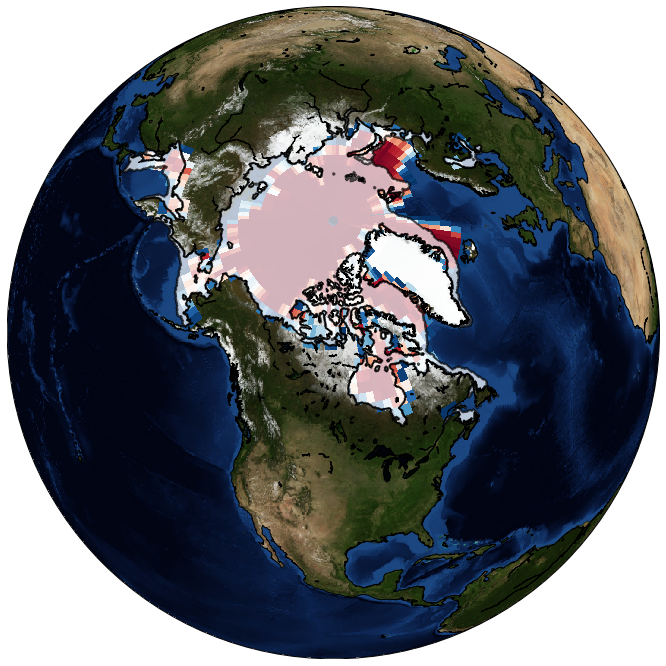

In [89]:
from mpl_toolkits.basemap import Basemap
from matplotlib.collections import LineCollection
import shapefile

fig,ax   = plt.subplots(figsize=(12,12))
xs, ys   = np.meshgrid(lonRCP26,latRCP26)
IceRCP26plot = IceRCP26.copy()
IceRCP26plot[IceRCP26plot==0] =np.nan

maps = Basemap(projection='ortho',lat_0=70,lon_0=-100, resolution = 'l')  


#add shapefile from March 2006 from NSIDC data
datapathN = '/Users/sandra/Documents/materials/bckup/shapes/North/extent_N_200603_polygon_v3.0/extent_N_200603_polygon_v3.0.shp'
r = shapefile.Reader(datapathN)
shapes = r.shapes()
records = r.records()

for record, shape in zip(records,shapes):
    lons,lats = zip(*shape.points)
    lons = np.array([i/1000 for i in lons])
    lats = np.array([i/1000 for i in lats])
    lon,lat = polar_xy_to_lonlat(lons,lats,70,6378.273,0.081816153,1)
    data = np.array(maps(lon, lat)).T
    
    if len(shape.parts) == 1:
        segs = [data,]
    else:
        segs = []
        for i in range(1,len(shape.parts)):
            index = shape.parts[i-1]
            index2 = shape.parts[i]
            segs.append(data[index:index2])
        segs.append(data[index2:])

    lines = LineCollection(segs,antialiaseds=(1,))
    lines.set_facecolors('w')
    lines.set_alpha(0.7)
    lines.set_edgecolors('k')
    lines.set_linewidth(2)
    ax.add_collection(lines)

#add RCP2.6 2006 data
maps.bluemarble(scale=0.5)
CS = maps.pcolormesh(xs,ys, IceRCP26plot[2][:][:],latlon=True, cmap='RdBu_r')
maps.drawcoastlines()
plt.show()

* projection of CMIP5 data slightly shifted...
* However,CMIP5 fits NSIDC SIE quite good
* looks like CMIP5 is slightly overestimating NSIDC SIE

In [90]:
#a) wie berechne ich am einfachsten für jeden Zeitschritt summe aus lon,lat zellen? for schleife?
#b) wie bekomme ich am besten die einzelnen gitterflächen hin? -> neue Variablen regareaN/S, gleiches Gitter
# brauche ein array bei dem für alle i der gleiche Wert eingetragen wird
gridArea     = np.zeros((len(latRCP26),len(lonRCP26)))
SIERCP26_N   = np.zeros(len(timeRCP26))
SIERCP26_S   = np.zeros(len(timeRCP26))
ICARCP26_N   = np.zeros(len(timeRCP26))
ICARCP26_S   = np.zeros(len(timeRCP26))

for i in range(len(lonRCP26)):
    for j in range(len(latRCP26)):
            gridArea[j,i] = (2*111.20)*(2.5*111.20*abs(np.cos(latRCP26[j]*np.pi/180))) #in km^2

gridArea_N  = gridArea[45:, 0:].copy()
gridArea_S  = gridArea[0:44, 0:].copy()

for t in range(len(timeRCP26)):
    ICARCP26_S[t] = np.sum(IceRCP26[t, 0:44, 0:]/100*gridArea[0:44, 0:])/1000000 # convert to mio sqkm
    ICARCP26_N[t] = np.sum(IceRCP26[t, 45:, 0:]/100*gridArea[45:, 0:])/1000000
    
    SIERCP26_S[t] = np.sum(gridArea_S[IceRCP26[t, 0:44, 0:]>0])/1000000 # convert to mio sqkm
    SIERCP26_N[t] = np.sum(gridArea_N[IceRCP26[t, 45:, 0:]>0])/1000000
    
print('NSIDC Area: ',SIE_Mon.Area_N[(SIE_Mon.year==2006)&(SIE_Mon.Month==3)])
print('CMIP RCP2.6 Area: ',ICARCP26_N[2])  
print('\n***********************************\n')
print('NSIDC Extent: ',SIE_Mon.Extent_N[(SIE_Mon.year==2006)&(SIE_Mon.Month==3)])
print('CMIP RCP2.6 Extent: ',SIERCP26_N[2]) 

NSIDC Area:  328    12.52
Name: Area_N, dtype: float64
CMIP RCP2.6 Area:  12.76913260270685

***********************************

NSIDC Extent:  328    14.42
Name: Extent_N, dtype: float64
CMIP RCP2.6 Extent:  18.502825212621556


In [91]:
np.sum(gridArea).round(0)
#Area of Earth 510.100.000 km²

510136916.0

In [92]:
DatetimeCMIP = []                           
for i in range(len(timeRCP26)):
    DatetimeCMIP.append(dt.date(2006, 1, 1) + dt.timedelta(days=timeRCP26[i]))
    

# convert mape,rmse to data frame
df_dictCMIP = {'Datetime':DatetimeCMIP,'RCP26_Extent_N':SIERCP26_N,'RCP26_Extent_S':SIERCP26_S,
               'RCP26_Area_N':ICARCP26_N,'RCP26_Area_S':ICARCP26_S}

CMIP5 = pd.DataFrame(df_dictCMIP, \
                     columns=['Datetime','RCP26_Extent_N','RCP26_Extent_S','RCP26_Area_N','RCP26_Area_S'])    


In [93]:
CMIP5.head()

,Datetime,RCP26_Extent_N,RCP26_Extent_S,RCP26_Area_N,RCP26_Area_S
0,2006-01-16,17.604259,4.303563,11.753409,0.609833
1,2006-02-15,18.459357,1.791499,12.525612,0.234497
2,2006-03-16,18.502825,2.134153,12.769133,0.405251
3,2006-04-16,18.684389,3.668531,12.717996,1.214974
4,2006-05-16,18.200305,5.661457,12.233762,2.564099


In [94]:
CMIP5.tail()

,Datetime,RCP26_Extent_N,RCP26_Extent_S,RCP26_Area_N,RCP26_Area_S
535,2050-08-05,7.241589,10.594613,0.328624,6.057799
536,2050-09-05,2.135689,11.617995,0.098542,6.631662
537,2050-10-05,8.228608,12.014944,2.072121,6.625901
538,2050-11-05,11.405909,11.038692,6.192114,5.521457
539,2050-12-05,13.845052,9.108969,8.622732,2.889823


In [95]:
CMIP5.describe()

,RCP26_Extent_N,RCP26_Extent_S,RCP26_Area_N,RCP26_Area_S
count,540.000000,540.000000,540.000000,540.000000
mean,13.869794,7.379021,8.056266,3.350610
std,4.587596,3.852207,4.296306,2.428505
min,1.503194,1.229482,0.074484,0.133359
25%,11.264589,3.832550,4.571234,0.833769
50%,15.905276,8.235965,9.798330,3.104986
75%,17.546213,10.960844,11.851940,5.689448
max,18.783498,14.363074,12.949930,7.860456


* Total, global, area is slightly to large, corresponds to ~2.8 sqkm per grid cell -> is small
* As it looked in the map plot, CMIP5 2.6 model run has higher SIE (and ICA) than NSIDC satellite-derived value for March 2006
* Reasons may be:
    * a different land masks -> there is ice on land areas, which results in higher SIE, ICA is certainliy not affected
    * edge cells size is used completely for SIE -> satellite derived values may be more accurate than model results can be (sat data resolution is 25x25 km, model resolution is 2x2.5 degree, i.e. ~222.4x111.2 km 
    
**=> For comparison, area is a better mean. Also SIE residuals may be good enough, trends certainly as well**

# Data Cleaning
___

OVERVIEW DATA FRAMES

|Variable | dataframe 1 | dataframe2
|:----------|:------------------|:------------------
|**Sea ice extent**| | 
|Low Res Monthly| SIE_Mon | 
|Hig Res Monthly| df_sie_4km_Mon | df_sie_1km_Mon
|Ocean Areas |OceanAreas |
|**Meteorological data**| | 
|Reanalysis| |
|Global| global_LaOT | 
|**Carbon data**| | 
|Global | global_carbon |
|Emissions |CO_emis |
|**Climate Indices**| | 
| monthly | clim_indices_Mon |


## Missing Values

### Sea ice
**25 km resolution data**

In [96]:
# monthly low resolution data 
missing = pd.DataFrame(SIE_Mon.isnull().sum(),columns=['Number'])
print('Missing values for low resolution (25km) sea ice extent data, monthly: ')
missing[missing.Number!=0].transpose()

Missing values for low resolution (25km) sea ice extent data, monthly: 


,Extent_N,Area_N,Extent_S,Area_S
Number,2,3,2,2


In [97]:
SIE_Mon[SIE_Mon.Area_N.isnull()]

,year,Month,data-type_N,Extent_N,Area_N,Datetime,Extent_S,Area_S
105,1987,8,1,7.63,NaN,1987-08-01,17.6,14.02
109,1987,12,0,NaN,NaN,1987-12-01,NaN,NaN
110,1988,1,0,NaN,NaN,1988-01-01,NaN,NaN


Monthly mean low resolution sea ice extent has 2-3 missing values end 1987, beginning 1988. If I remember right, the satellite was failing over these two months. Options to fill the missing values: Either
* fill with 1981-2010 monthly average 
* fill with average over entire season
* (linear/spline) interpolation
* fill with median

**Decision: Use monthly median**
* median is well between 1981-2010 average and entire ts average
* spline interpolation resulted in unrealistig values

In [98]:
# Attention: although it is called AVG, median ist used
Monthly_AVG = SIE_Mon.groupby('Month').median()
Monthly_AVG

,year,data-type_N,Extent_N,Area_N,Extent_S,Area_S
Month,,,,,,
1,1999.5,1.0,14.270,12.170,4.780,3.210
2,1999.5,1.0,15.220,12.970,2.980,1.905
3,1999.5,1.0,15.375,13.120,3.980,2.650
4,1999.5,1.0,14.560,12.440,6.825,5.080
5,1999.5,1.0,13.120,11.030,10.210,7.910
6,1999.5,1.0,11.620,9.070,13.300,10.525
7,1999.5,1.0,9.340,6.295,15.940,12.640
8,1999.0,1.0,7.170,4.675,17.740,14.040
9,1999.0,1.0,6.140,4.300,18.540,14.540


In [99]:
# fill NaNs with climatologic monthly values
cols = ['Extent_N','Area_N','Extent_S','Area_S']
SIE_Mon = SIE_Mon.set_index(['Month'])

for i in cols:
    SIE_Mon[i] = SIE_Mon[i].fillna(Monthly_AVG[i])
    
SIE_Mon = SIE_Mon.reset_index()

In [100]:
SIE_Mon[SIE_Mon.Area_N.isnull()]

,Month,year,data-type_N,Extent_N,Area_N,Datetime,Extent_S,Area_S


**High resolution data**

In [101]:
# daily high resolution data (4km)
missing = pd.DataFrame(df_sie_4km.isnull().sum(),columns=['Number'])
print('Missing values for high resolution (4km) sea ice extent data, monthly: ')
missing[missing.Number!=0].transpose()

Missing values for high resolution (4km) sea ice extent data, monthly: 


""
Number


In [102]:
# daily high resolution data (1km)
missing = pd.DataFrame(df_sie_1km.isnull().sum(),columns=['Number'])
print('Missing values for high resolution (1km) sea ice extent data, monthly: ')
missing[missing.Number!=0].transpose()

Missing values for high resolution (1km) sea ice extent data, monthly: 


""
Number


There are no missing values for daily data in the high resolution data set. Hence, monthly values, which have been derived from daily data, do also not have missing values.

### Meteorological data

In [103]:
# missing values in NCEP Reanalysis data are marked with -9.96921e+36
# monthly data
# Arctic
print(len(TairM[TairM==(-9.96921e+36)]))
print(len(SLPM[SLPM==(-9.96921e+36)]))
print(len(UWNDM[UWNDM==(-9.96921e+36)]))
print(len(VWNDM[VWNDM==(-9.96921e+36)]))

0
0
0
0


In [104]:
# missing values in NCEP Reanalysis data are marked with -9.96921e+36
# monthly data
# Antarctic
print(len(TairMAA[TairMAA==(-9.96921e+36)]))
print(len(SLPMAA[SLPMAA==(-9.96921e+36)]))
print(len(UWNDMAA[UWNDMAA==(-9.96921e+36)]))
print(len(VWNDMAA[VWNDMAA==(-9.96921e+36)]))

0
0
0
0


**Summary:**
* NCEP data do not have any missing values
* no filling needed

### Global land and Ocean Data

In [105]:
missing = pd.DataFrame(global_LaOT.isnull().sum(),columns=['Number'])
print('Missing values for global Land and Ocean data, monthly: ')
missing[missing.Number!=0]

Missing values for global Land and Ocean data, monthly: 


,Number
LandAvgTemp,12
LandAvgTempSdev,12
LandMaxTemp,1200
LandMaxTempSdev,1200
LandMinTemp,1200
LandMinTempSdev,1200
LandAndOceanAvgTemp,1200
LandAndOceanAvgTempSdev,1200
LandAvgTemp_anom,12
LandAvgTempSdev_anom,12


In [106]:
global_LaOT[global_LaOT.LandAvgTemp.isnull()].tail()

,dt,Datetime,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev,Month,LandAvgTemp_anom,LandAvgTempSdev_anom,LandMaxTemp_anom,LandMaxTempSdev_anom,LandMinTemp_anom,LandMinTempSdev_anom,LandAndOceanAvgTemp_anom,LandAndOceanAvgTempSdev_anom
28,1752-05-01,1752-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29,1752-06-01,1752-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30,1752-07-01,1752-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,1752-08-01,1752-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32,1752-09-01,1752-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [107]:
global_LaOT[global_LaOT.LandAndOceanAvgTemp.isnull()].tail()

,dt,Datetime,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev,Month,LandAvgTemp_anom,LandAvgTempSdev_anom,LandMaxTemp_anom,LandMaxTempSdev_anom,LandMinTemp_anom,LandMinTempSdev_anom,LandAndOceanAvgTemp_anom,LandAndOceanAvgTempSdev_anom
1195,1849-08-01,1849-08-01,13.603,0.902,NaN,NaN,NaN,NaN,NaN,NaN,8,-0.157064,0.123940,NaN,NaN,NaN,NaN,NaN,NaN
1196,1849-09-01,1849-09-01,11.093,0.568,NaN,NaN,NaN,NaN,NaN,NaN,9,-0.630170,-0.194015,NaN,NaN,NaN,NaN,NaN,NaN
1197,1849-10-01,1849-10-01,8.890,0.733,NaN,NaN,NaN,NaN,NaN,NaN,10,0.005057,-0.065498,NaN,NaN,NaN,NaN,NaN,NaN
1198,1849-11-01,1849-11-01,5.778,1.313,NaN,NaN,NaN,NaN,NaN,NaN,11,0.035595,0.350723,NaN,NaN,NaN,NaN,NaN,NaN
1199,1849-12-01,1849-12-01,1.923,0.908,NaN,NaN,NaN,NaN,NaN,NaN,12,-1.275977,-0.163936,NaN,NaN,NaN,NaN,NaN,NaN


**Summary:**
* Missing values occur only before 1850
* Since I only intent to use data after that date, missing values are not replaced.
* Data before 1985 are not used in this study because sea ice data are not availalbe that early and a meaningful prediction of sea ice by temperature would not be very reliable anyway, because measurement of temperatures have increasing uncertainties when going back in time.



### Global carbon data

In [108]:
missing = pd.DataFrame(global_carbon.isnull().sum(),columns=['Number'])
print('Missing values monthly carbon dioxide measurements: ')
missing[missing.Number!=0]

Missing values monthly carbon dioxide measurements: 


,Number
CO2_(ppm),7
SeasAdjstd_CO2_(ppm),7
CO2_Fit_(ppm),2
SeasAdjstd_CO2_Fit_(ppm),2
CO2_(ppm)_filled,2
SeasAdjstd_CO2_(ppm)_filled,2


In [109]:
global_carbon[global_carbon['CO2_(ppm)'].isnull()]

,Year,Month,Decimal_Date,Datetime,CO2_(ppm),SeasAdjstd_CO2_(ppm),CO2_Fit_(ppm),SeasAdjstd_CO2_Fit_(ppm),CO2_(ppm)_filled,SeasAdjstd_CO2_(ppm)_filled
0,1958,1,1958.0411,1958-01-01,NaN,NaN,NaN,NaN,NaN,NaN
1,1958,2,1958.1260,1958-02-01,NaN,NaN,NaN,NaN,NaN,NaN
5,1958,6,1958.4548,1958-06-01,NaN,NaN,317.24,315.14,317.24,315.14
9,1958,10,1958.7890,1958-10-01,NaN,NaN,312.44,315.41,312.44,315.41
73,1964,2,1964.1257,1964-02-01,NaN,NaN,320.01,319.36,320.01,319.36
74,1964,3,1964.2049,1964-03-01,NaN,NaN,320.74,319.41,320.74,319.41
75,1964,4,1964.2896,1964-04-01,NaN,NaN,321.83,319.45,321.83,319.45


In [110]:
SeasCycleCO2 = global_carbon.groupby('Month').mean()
SeasCycleCO2['CO2_(ppm)_filled'][1]

355.5596774193548

In [111]:
# make a column with months
global_carbon['Month'] = pd.to_numeric(global_carbon['Datetime'].dt.strftime('%m'))
# fill nans in the beginning of time series with minimum values
# averaged values are to high and do not fit into the series + just need to fill the gap
global_carbon['CO2_(ppm)_filled'] = global_carbon['CO2_(ppm)_filled'].fillna(global_carbon['CO2_(ppm)_filled'].min())   
global_carbon[global_carbon['CO2_(ppm)'].isnull()]

,Year,Month,Decimal_Date,Datetime,CO2_(ppm),SeasAdjstd_CO2_(ppm),CO2_Fit_(ppm),SeasAdjstd_CO2_Fit_(ppm),CO2_(ppm)_filled,SeasAdjstd_CO2_(ppm)_filled
0,1958,1,1958.0411,1958-01-01,NaN,NaN,NaN,NaN,312.44,NaN
1,1958,2,1958.1260,1958-02-01,NaN,NaN,NaN,NaN,312.44,NaN
5,1958,6,1958.4548,1958-06-01,NaN,NaN,317.24,315.14,317.24,315.14
9,1958,10,1958.7890,1958-10-01,NaN,NaN,312.44,315.41,312.44,315.41
73,1964,2,1964.1257,1964-02-01,NaN,NaN,320.01,319.36,320.01,319.36
74,1964,3,1964.2049,1964-03-01,NaN,NaN,320.74,319.41,320.74,319.41
75,1964,4,1964.2896,1964-04-01,NaN,NaN,321.83,319.45,321.83,319.45


**Summary:**
* data comes with already filled values -> use those instead of filling by myself
* filled values have only 2 nans in the beginning of the time series -> use time series from 3rd entry on
* => no data filling needed
* missing values before 1979 -> not relevant for this study

### Climate Index data

In [112]:
# monthly index data
missing = pd.DataFrame(clim_indices_Mon.isnull().sum(),columns=['Number'])
print('Missing values for daily climate indices: ')
missing[missing.Number!=0].transpose()

Missing values for daily climate indices: 


,AAO
Number,348


In [113]:
clim_indices_Mon[clim_indices_Mon.AAO.isnull()].tail()

,Year,Month,Datetime,AOI,NAO,PNA,AAO,SCAND
343,1978,8,1978-08-01,-0.353660,0.64,0.05,NaN,0.94
344,1978,9,1978-09-01,-0.098999,0.46,1.71,NaN,-1.60
345,1978,10,1978-10-01,0.894600,1.93,0.48,NaN,-0.50
346,1978,11,1978-11-01,2.469500,3.04,-0.49,NaN,-0.68
347,1978,12,1978-12-01,-0.980140,-1.57,-0.72,NaN,-0.23


**Summary**
* Monthly data have no missing values
* Missing values for AAO (n=348) are dates before 1979

# Data Exploration
___

In [114]:
tsdata = pd.DataFrame(tsdates, columns = list(tsdates.keys()))
tsdata.head()

,25km SIE N,25km SIE S,4km SIE N,1km SIE N,Global Land-Ocean Temp,Global CO2,Climate Indices - AAO,Climate Indices
0,1978-11-01,1978-11-01,2006-01-01,2014-12-01,1750-01-01,1958-01-01,1979-01-01,1950-01-01
1,2020-07-01,2020-07-01,2020-06-01,2020-06-01,2015-12-01,2020-05-01,2020-07-01,2020-07-01


In [115]:
y = tsdata.transpose().index
x = tsdata.values

In [116]:
datesf = pd.DataFrame({'year': [1940, 2021],
                       'month': [1, 12],
                       'day': [1, 31]})
lims   = pd.to_datetime(datesf)

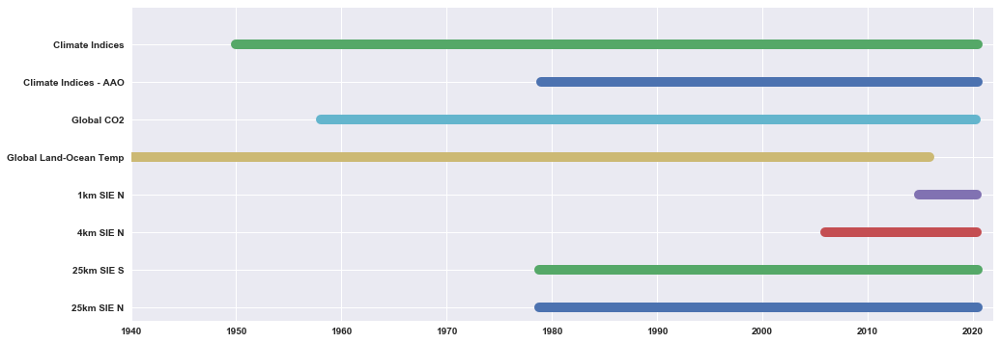

In [117]:
# Times of data availability
# möchte die Farbpalette noch ändern

#sn.barplot(x=range(9),y=y,palette='YlGnBu')
plt.figure(figsize=(16,6))
color = ['deepskyblue','palegreen','darkorange','plum','lemonchiffon','paleturquoise','b','lightgreen','bisque',\
         'b','rosybrown','mediumblue','slategray']
for i,j in enumerate(y):
    plt.plot(tsdata[j],[i,i], linewidth=10.0)
    
plt.yticks(range(9),y);
plt.xlim(lims[0],lims[1])
plt.savefig('figures/Dataavailability.png')

In [118]:
# welche plots möchte ich machen?
    # Karte Arctis mit den jeweiligen Regionen
    # heatmap
    # Scatterplot/scattermatrix
    # Autocorrelation of variables?
    # Average SIE +/- boundaries like in towards data science

## Sea ice extent and area

### 25 km resolution monthly data 
**Monthly data - range for Northern and Southern Hemispheric sea ice extent and ice covered area**

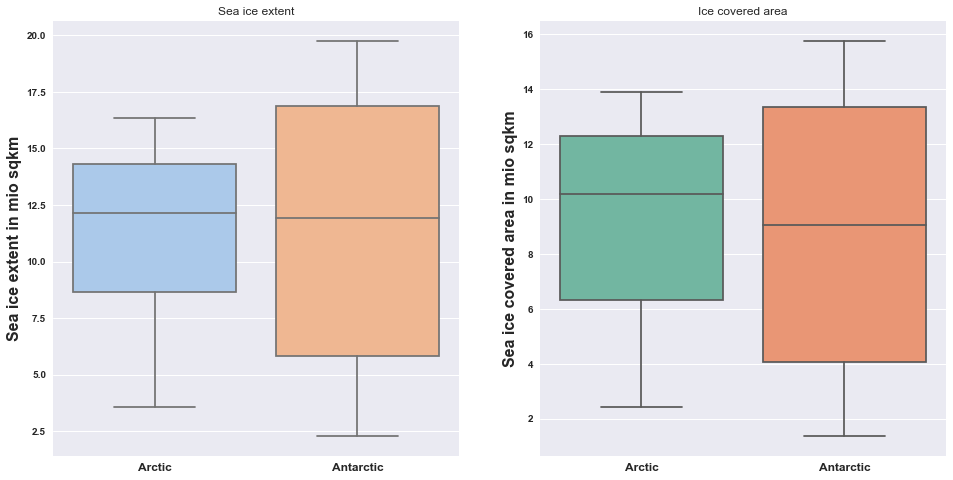

In [119]:
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
ax = sn.boxplot(x='variable',y='value', palette='pastel',\
                data=pd.melt(SIE_Mon[['Extent_N','Extent_S']]))

ax.set_xlabel('')
ax.set_ylabel('Sea ice extent in mio sqkm',fontsize=16)
plt.xticks([0,1],['Arctic','Antarctic'],fontsize= 12)
plt.title('Sea ice extent')

fig.add_subplot(122)
ax = sn.boxplot(x='variable',y='value', palette='Set2',\
                data=pd.melt(SIE_Mon[['Area_N','Area_S']]))

ax.set_xlabel('')
ax.set_ylabel('Sea ice covered area in mio sqkm',fontsize=16)
plt.xticks([0,1],['Arctic','Antarctic'],fontsize= 12)
plt.title('Ice covered area')
plt.savefig('figures/SIE/SIE_Mon_boxplot.png')

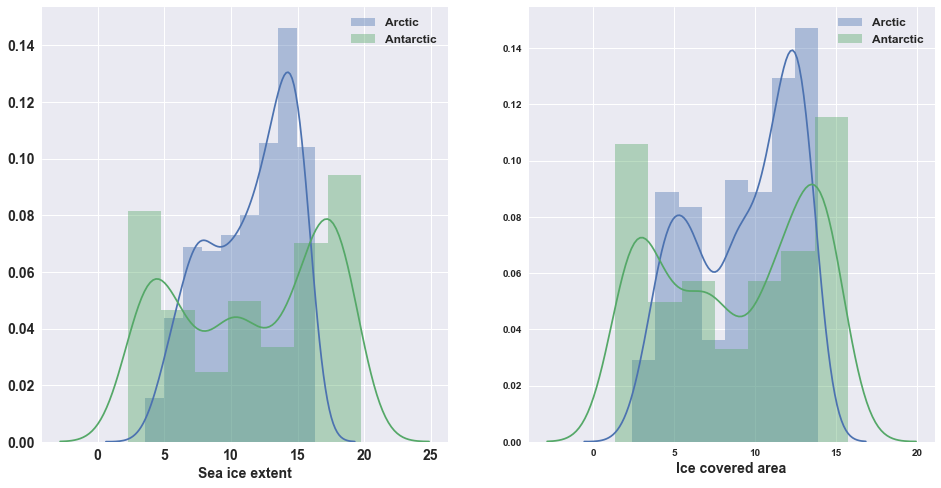

In [120]:
# weiter ausbauen, möchte hier beide Hemispheren übereinander+SIE und ICA nebeneinander!
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
sn.distplot(SIE_Mon.Extent_N,label='Arctic')
sn.distplot(SIE_Mon.Extent_S,label='Antarctic')
plt.xlabel('Sea ice extent',fontsize= 14)
plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)
plt.legend(fontsize= 12)
fig.add_subplot(122)
sn.distplot(SIE_Mon.Area_N,label='Arctic')
sn.distplot(SIE_Mon.Area_S,label='Antarctic')
plt.xlabel('Ice covered area',fontsize= 14)
plt.legend(fontsize= 12)
plt.savefig('figures/SIE/distribution_plots_SIE_ICA.png')

<Figure size 1152x864 with 0 Axes>

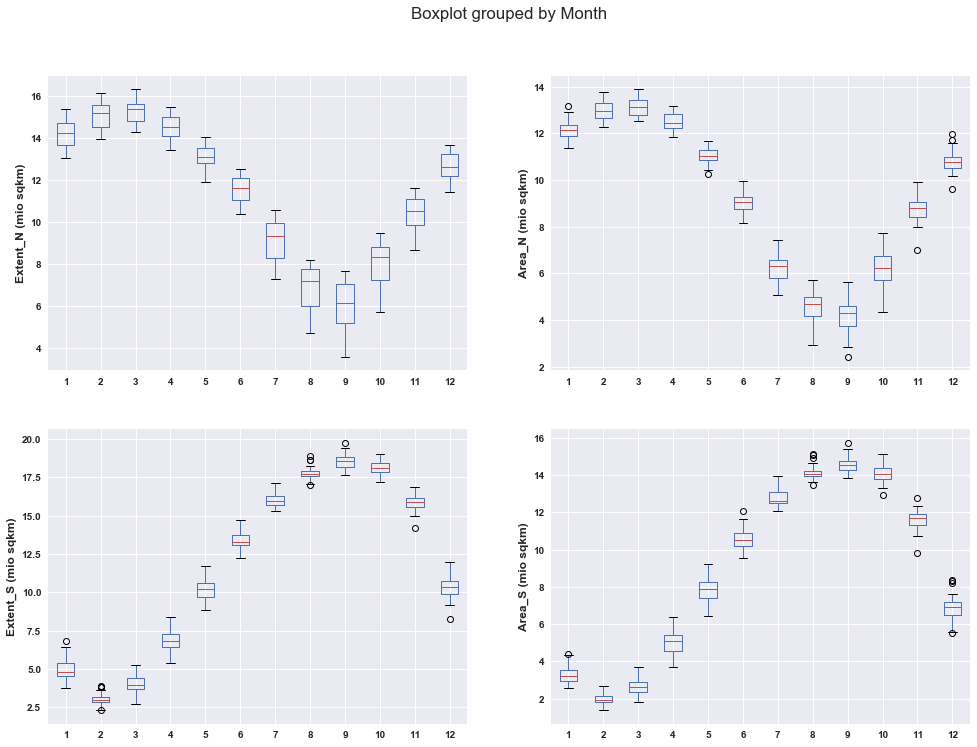

In [121]:
# prüfe wie ich fontsize ändern kann
# monthly values
cols = ['Extent_N','Area_N','Extent_S','Area_S']
plt.figure(figsize=(16,12))
fig, axes = plt.subplots(2,2,figsize=(16,12))

for i,j in enumerate(cols):
    ax = SIE_Mon.boxplot(column=[j], by='Month',ax=axes.flatten()[i]);
    ax.set_xlabel('')
    ax.set_ylabel(j+' (mio sqkm)',fontsize=12)
    ax.set_title('')
   # plt.xticks(fontsize= 18)
   # plt.yticks(fontsize= 18)
plt.savefig('figures/SIE/Monthly_boxplots_outliers.png')  

<Figure size 1152x864 with 0 Axes>

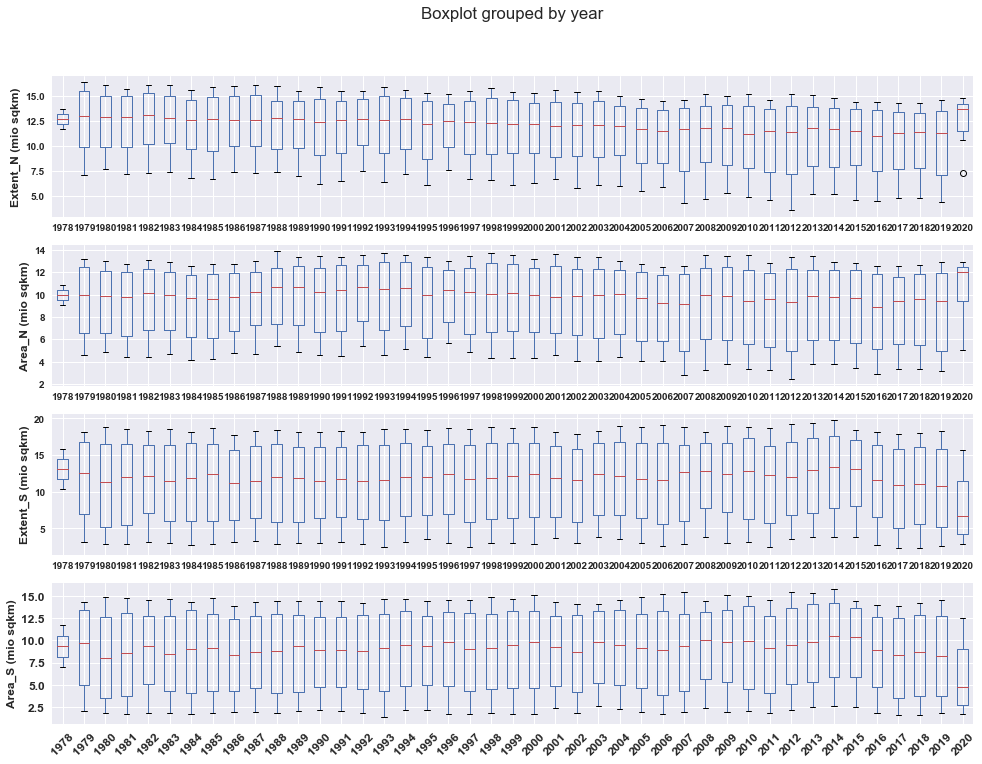

In [122]:
# yearly values
# improve plot: skip last and first year, improve axis description
cols = ['Extent_N','Area_N','Extent_S','Area_S']
plt.figure(figsize=(16,12))
fig, axes = plt.subplots(4,1,figsize=(16,12))

for i,j in enumerate(cols):
    ax = SIE_Mon.boxplot(column=[j], by='year',ax=axes.flatten()[i]);
    ax.set_xlabel('')
    ax.set_ylabel(j+' (mio sqkm)',fontsize=12)
    ax.set_title('')
plt.xticks(fontsize= 12,rotation=45)
plt.yticks(fontsize= 12)
plt.savefig('figures/SIE/Yearly_boxplots_outliers.png')

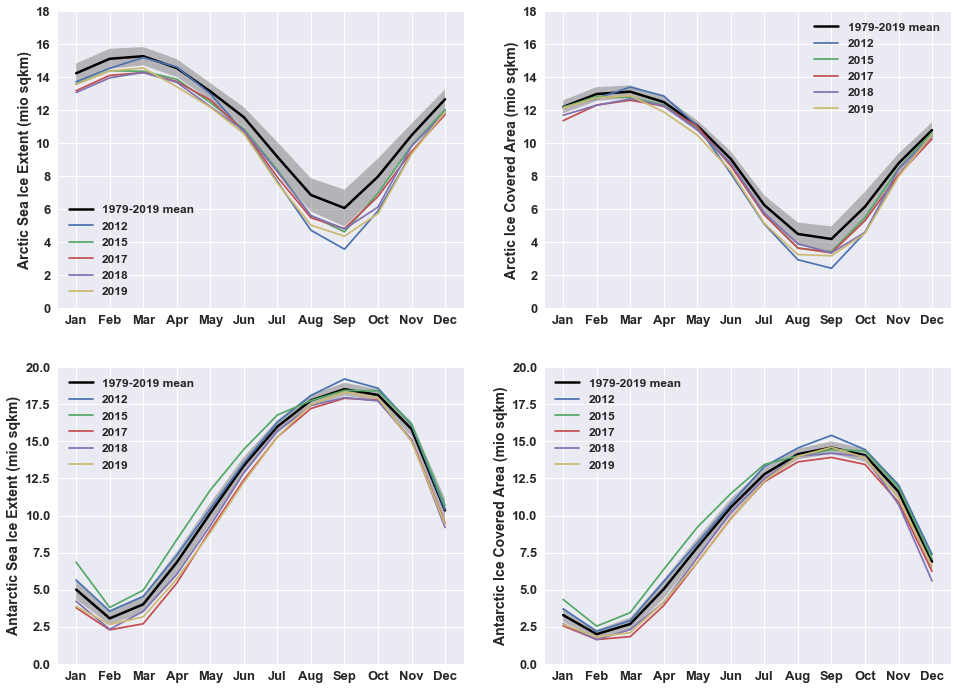

In [123]:
# Long term seasonal cycle plus most recent years
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
cols   = ['Extent_N','Area_N','Extent_S','Area_S']
names  = ['Arctic Sea Ice Extent (mio sqkm)','Arctic Ice Covered Area (mio sqkm)',\
          'Antarctic Sea Ice Extent (mio sqkm)','Antarctic Ice Covered Area (mio sqkm)']

fig  = plt.figure(figsize=(16,12))

for i,j in enumerate(cols):
    LTMean = SIE_Mon[j].loc[(SIE_Mon.year>1978) & (SIE_Mon.year<2020)].groupby(SIE_Mon.Month)
    fig.add_subplot(221+i)
    
    # plot long term average plus standard deviation in gray
    plt.plot(months,LTMean.mean(), label='1979-2019 mean',color='k',linewidth=2.5)
    plt.fill_between(months, LTMean.mean()-LTMean.std(), LTMean.mean()+LTMean.std(),facecolor='gray',alpha=0.5)
    #plt.fill_between(months, LTMean.min(), LTMean.max(),facecolor='gray',alpha=0.5)
    
    for t in [2012,2015,2017,2018,2019]:
        # add most recent years
        plt.plot(months,SIE_Mon[j].loc[(SIE_Mon.year==t)], label=str(t))
    
    if i<2:
        plt.ylim(0, 18)
    else:
        plt.ylim(0, 20)
        
    plt.legend(fontsize=12)
    plt.tick_params(axis='both', which='major', labelsize=13)
    plt.ylabel(names[i],fontsize=14)
    
plt.savefig('figures/SIE/SIE_ICA_NSIDC_Style_LT.png')  

**Findings:**
* Southern Ocean sea ice extent and ice covered area vary stronger in area than Northern Hemisphere distributions do.  
* In the Southern Ocean, there are more outliers than in the Arctic Ocean.
* Arctic sea ice extent and ice covered area are skewed.
* Antarctic sea ice extent and ice covered area have two maxima.
* Arctic SIE and ICA has been mostly below long term average - standard deviation in summer months
* In the Antarctic, recent years SIE and ICA varies around the long term mean

**Monthly data - temporal evolution of sea ice extent**

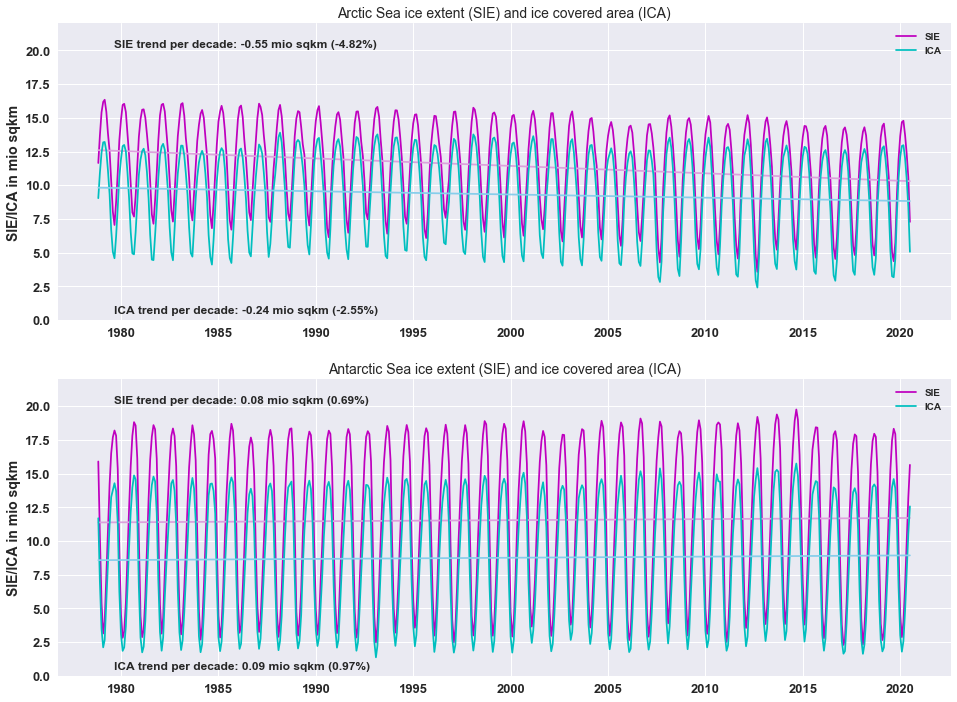

In [124]:
plt.figure(figsize=(16,12))

for i in range(211,213):
    plt.subplot(i)
    if i == 211:
        name1 = 'Extent_N'
        name2 = 'Area_N'
        titel = 'Arctic Sea ice extent (SIE) and ice covered area (ICA)'
    else:    
        name1='Extent_S'
        name2='Area_S'
        titel = 'Antarctic Sea ice extent (SIE) and ice covered area (ICA)'
        
    plt.plot(SIE_Mon.Datetime,SIE_Mon[name1], color = 'm',label='SIE')
    # calculate linear trend with poly1d and plot it
    lreg = np.poly1d(np.polyfit(np.arange(len(SIE_Mon.Month)), SIE_Mon[name1], 1))
    plt.plot(SIE_Mon.Datetime, lreg(np.arange(len(SIE_Mon.Month))),color='plum');
    
    # print Trend in sqkm per decade (=>*12*10*1000000) into figure
    txt = 'SIE trend per decade: ' + str((lreg.c[0]*12*10).round(2)) +' mio sqkm ('+ \
            str((lreg.c[0]*12*10/SIE_Mon[name1].mean()*100).round(2)) +'%)'
    plt.text(SIE_Mon.Datetime.iloc[10],20.2,txt,fontsize=12)
        
    plt.plot(SIE_Mon.Datetime,SIE_Mon[name2], color = 'c',label='ICA')
    lreg = np.poly1d(np.polyfit(np.arange(len(SIE_Mon.Month)), SIE_Mon[name2], 1))
    plt.plot(SIE_Mon.Datetime, lreg(np.arange(len(SIE_Mon.Month))),color='skyblue');
    
    # print Trend in sqkm per decade (=>*12*10*1000000) into figure
    txt = 'ICA trend per decade: ' + str((lreg.c[0]*12*10).round(2)) +' mio sqkm ('+ \
             str((lreg.c[0]*12*10/SIE_Mon[name2].mean()*100).round(2)) +'%)'
    plt.text(SIE_Mon.Datetime.iloc[10],0.5,txt,fontsize=12)
    plt.legend()
    
    plt.title(titel,fontsize=14)
    plt.xlabel('')
    plt.ylabel('SIE/ICA in mio sqkm',fontsize=14)
    plt.xticks(fontsize= 13)
    plt.yticks(fontsize= 13)
    plt.ylim(0, 22)

plt.savefig('figures/SIE/SIE_Mon_ts.png')

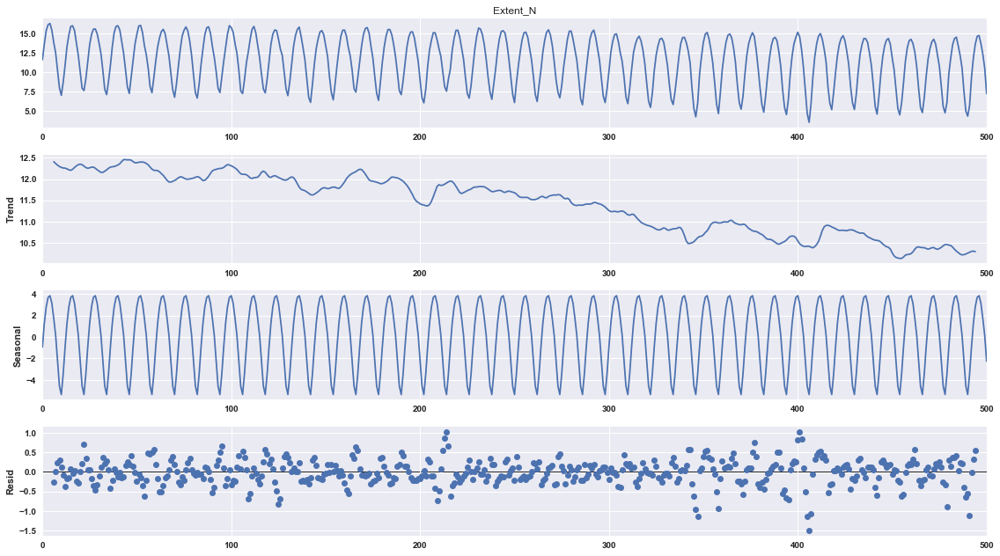

In [125]:
# set index to datetime and the axis will become data
# make plot better!
result = seasonal_decompose(SIE_Mon['Extent_N'],model='additive',period=12)
result.plot()
plt.show()

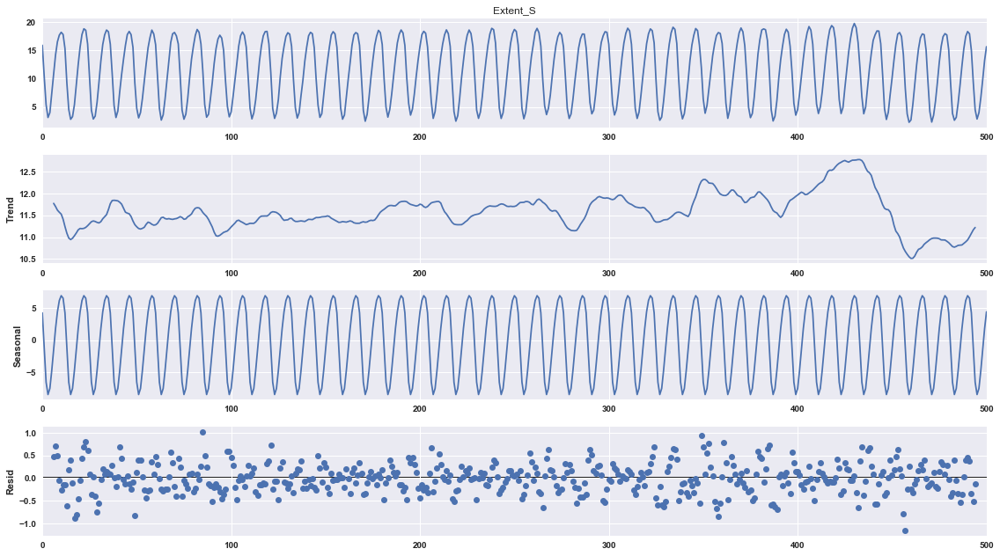

In [126]:
# set index to datetime and the axis will become data
# make plot better!
result = seasonal_decompose(SIE_Mon['Extent_S'],model='additive',period=12)
result.plot()
plt.show()

In [127]:
result.resid.describe()

count    489.000000
mean      -0.000728
std        0.329589
min       -1.155504
25%       -0.218675
50%       -0.007191
75%        0.204043
max        1.019912
Name: resid, dtype: float64

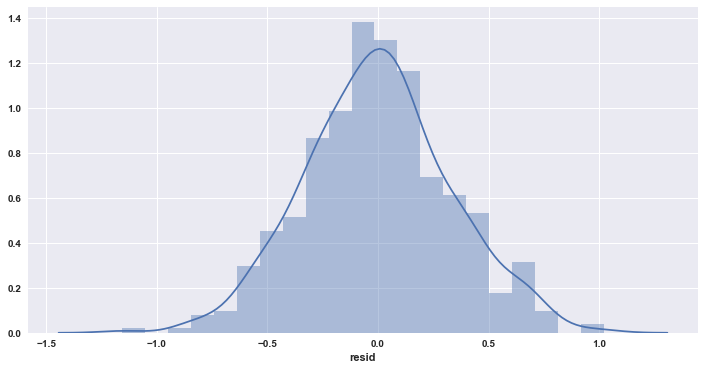

In [128]:
plt.figure(figsize=(12,6))
sn.distplot(result.resid)

Extent_N
Lamda: 1.595452


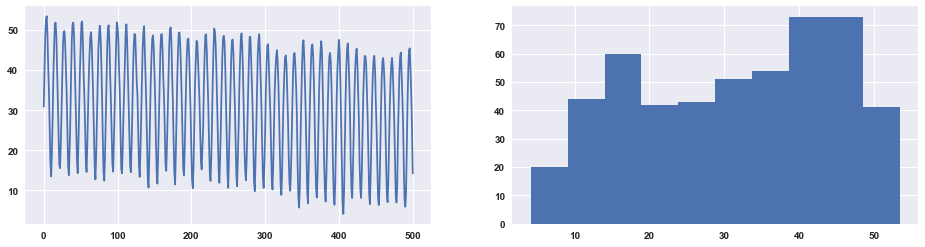

Area_N
Lamda: 1.333981


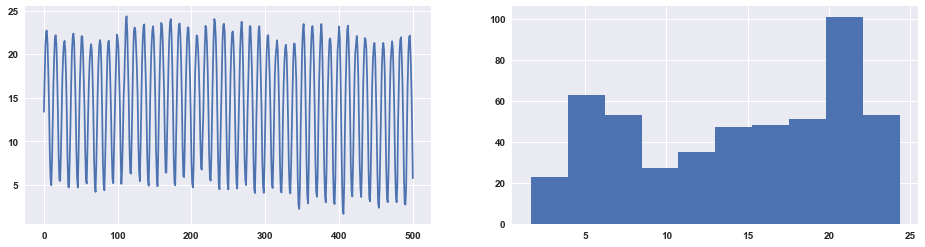

Extent_S
Lamda: 0.849843


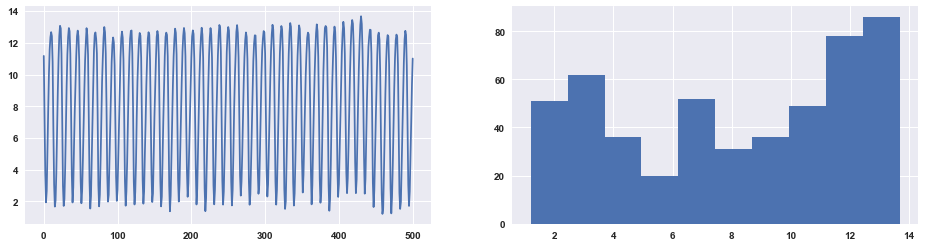

Area_S
Lamda: 0.751445


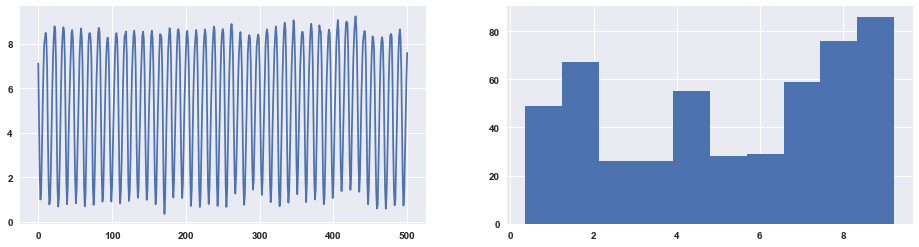

In [129]:
# boxcox transformation
for i in cols:
    plt.figure(figsize=(16,4))
    new_data, lam = boxcox(SIE_Mon[i])
    print(i)
    print('Lamda: %f' %lam)
    plt.figure(1)
    plt.subplot(121)
    plt.plot(new_data)
    plt.subplot(122)
    plt.hist(new_data)
    plt.show()

**Findings:**
* Northern Hemisphere: 
    * ICA is notably smaller than SIE, in particular in summer and winter
    * recently, the discrepancies between min und max ICA and SIE decreases
    * that indicates that (remaining) ice becomes compacter
* Southern Hemisphere:
    * ICA and SIE are very close together during summer minimum
    * That indicates that summer sea ice is quite compact
    * Winter differences are much larger 
    * That indicates that ice spreads more loose than in summer
    * to identify: is the winter maximum discrepancy increasing? Hence, is ice loosing compactness over winter? If yes: For what reason? Wind?
    
**Boxcox:**
* Extent_N: Lamda = 1.60 
* Area_N: Lamda = 1.33 -> no transform
* Extent_S: Lamda = 0.85 -> no transform
* Area_S: Lamda = 0.75 -> no transform or square root transform

**Remove Seasonal cycle and trend**

 
-0.004601 x + 12.6
 
-0.00198 x + 9.815
 
0.0006609 x + 11.38
 
0.0007094 x + 8.579


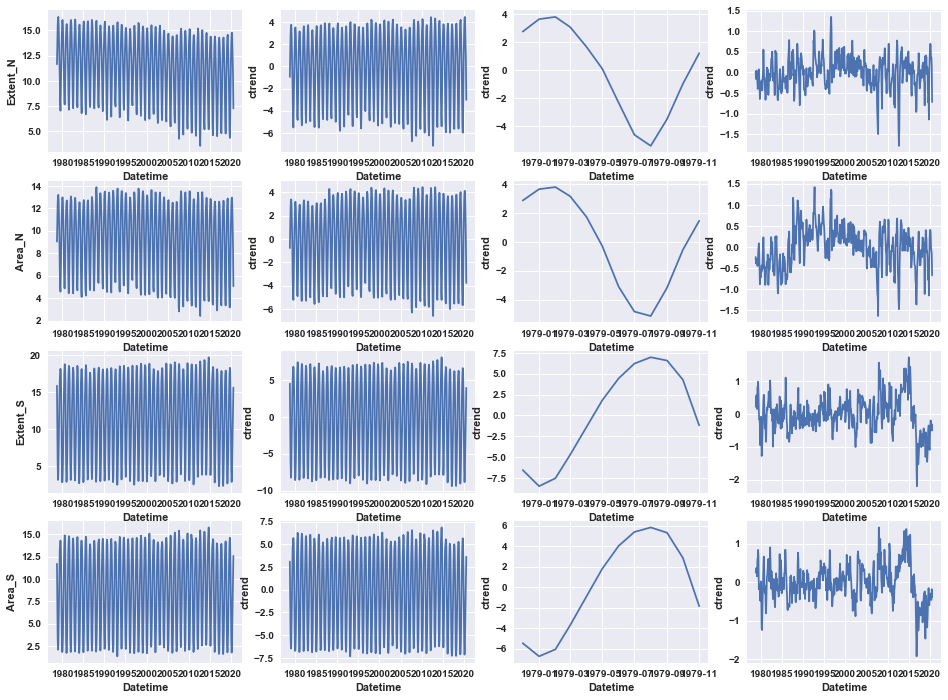

In [130]:
# calculate trend from seasonal cycled data
cols = ['Extent_N','Area_N','Extent_S','Area_S']
plt.figure(figsize=(16,12))
count = 1
# dummy frame
df_trnd = SIE_Mon[['Datetime','Month']].copy()
df_trnd['ctrend'] = 0

for i,j in enumerate(cols):
    name    = j+'cleaned'
    #SIE_Mon[name] = 0
    lreg    = np.poly1d(np.polyfit(np.arange(len(SIE_Mon.Month)), SIE_Mon[j], 1))
    print(lreg)
    lregts  = lreg(np.arange(len(SIE_Mon.Month)))
    
    # data cleaned by trend
    df_trnd['ctrend'] = SIE_Mon[j]-lregts 
    
    # original data
    plt.subplot(4,4,count)
    ax = sn.lineplot(SIE_Mon.Datetime,SIE_Mon[j])
    
    # detrended data
    plt.subplot(4,4,count+1)
    ax = sn.lineplot(SIE_Mon.Datetime,df_trnd['ctrend'])
    
    # calc average seasonal cycle
    SIESeas_AVG = df_trnd.groupby('Month').mean()
 
    for k in range(1,13):
        df_trnd['ctrend'][df_trnd.Month==k] = df_trnd['ctrend'][df_trnd.Month==k] - SIESeas_AVG['ctrend'][k];

    # seasonal cycle
    plt.subplot(4,4,count+2)
    ax = sn.lineplot(SIE_Mon.Datetime,SIESeas_AVG['ctrend'])
    
    # data without seasonal cycle and (linear) trend
    plt.subplot(4,4,count+3)
    ax = sn.lineplot(SIE_Mon.Datetime,df_trnd['ctrend'])
    
    count +=4


**Findings:**
* There seems to be a frequency left in the cleaned data (or jumps?), in particular in ICA
* Is there a data shift in the Southern Ocean Data? 

**-> Have a look at data descriptions and check literature to proof!!!**

**Anomaly plot with linear trend for N&S sea ice extent and ice covered area**

In [131]:
Monthly_AVG = SIE_Mon.groupby('Month').mean()

 
-0.004558 x + 1.14
 
-0.001913 x + 0.4781
 
0.0005641 x - 0.141
 
0.000598 x - 0.1495


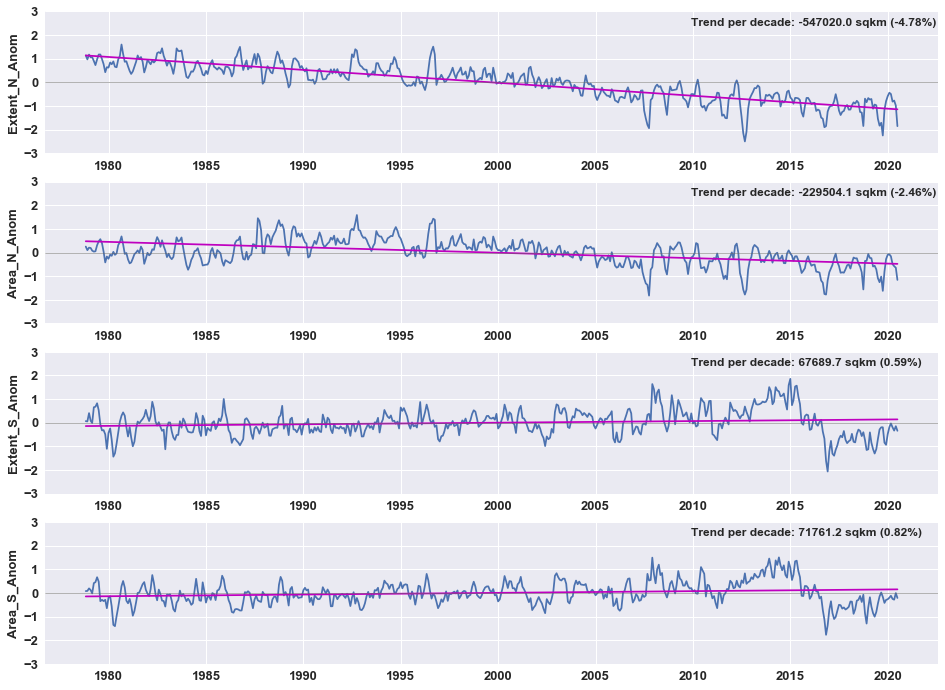

In [132]:
# create new entries in data frame and plot anomalies
cols = ['Extent_N','Area_N','Extent_S','Area_S']
plt.figure(figsize=(16,12))
count  = 411

for i in cols:
    name = i+'_Anom'
    SIE_Mon[name] = 0
    # create anomalies according to monthly climatology
    for j in range(1,13):
        SIE_Mon[name][SIE_Mon.Month==j] = SIE_Mon[i][SIE_Mon.Month==j] - Monthly_AVG[i][j];
    
    # plot anomalies
    plt.subplot(count)
    
    ax = sn.lineplot(SIE_Mon.Datetime,SIE_Mon[name])
    
    # calculate linear trend with poly1d and plot it
    lreg = np.poly1d(np.polyfit(np.arange(len(SIE_Mon.Month)), SIE_Mon[name], 1))
    print(lreg)
    sn.lineplot(SIE_Mon.Datetime, lreg(np.arange(len(SIE_Mon.Month))),color='m');
    
    # print Trend in sqkm per decade (=>*12*10*1000000) into figure
    txt = 'Trend per decade: ' + str((lreg.c[0]*12*10*1000000).round(1)) +' sqkm ('+ \
          str((lreg.c[0]*12*10/SIE_Mon[i].mean()*100).round(2)) +'%)'
    plt.text(SIE_Mon.Datetime.iloc[-128],2.4,txt,fontsize=12)
    
    plt.axhline(y=0,linewidth=0.5, color='dimgray')
    plt.xlabel('')
    plt.ylabel(name,fontsize= 13)
    plt.xticks(fontsize= 13)
    plt.yticks(fontsize= 13)
    plt.ylim(-3, 3)
    count += 1
    
plt.savefig('figures/SIE/SIE_Mon_anom_ts.png')
  

<Figure size 1152x864 with 0 Axes>

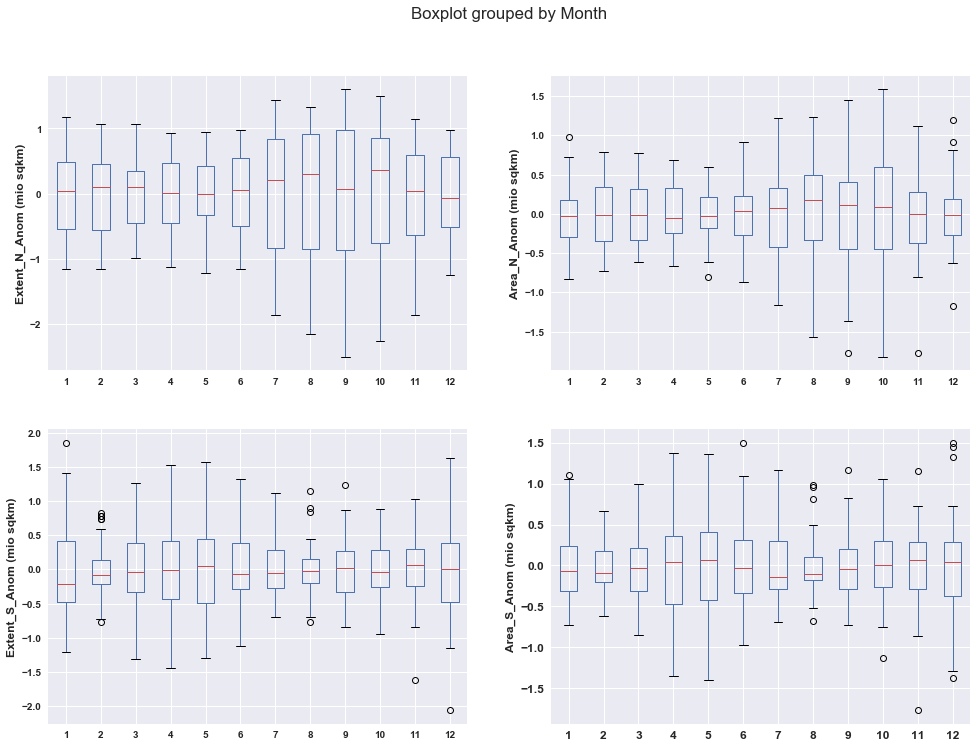

In [133]:
# monthly values
cols = ['Extent_N_Anom','Area_N_Anom','Extent_S_Anom','Area_S_Anom']
plt.figure(figsize=(16,12))
fig, axes = plt.subplots(2,2,figsize=(16,12))

for i,j in enumerate(cols):
    ax = SIE_Mon.boxplot(column=[j], by='Month',ax=axes.flatten()[i]);
    ax.set_xlabel('')
    ax.set_ylabel(j+' (mio sqkm)',fontsize=12)
    ax.set_title('')
    plt.xticks(fontsize= 12)
    plt.yticks(fontsize= 12)
plt.savefig('figures/SIE/Monthly_boxplots_outliers_anoms.png')  

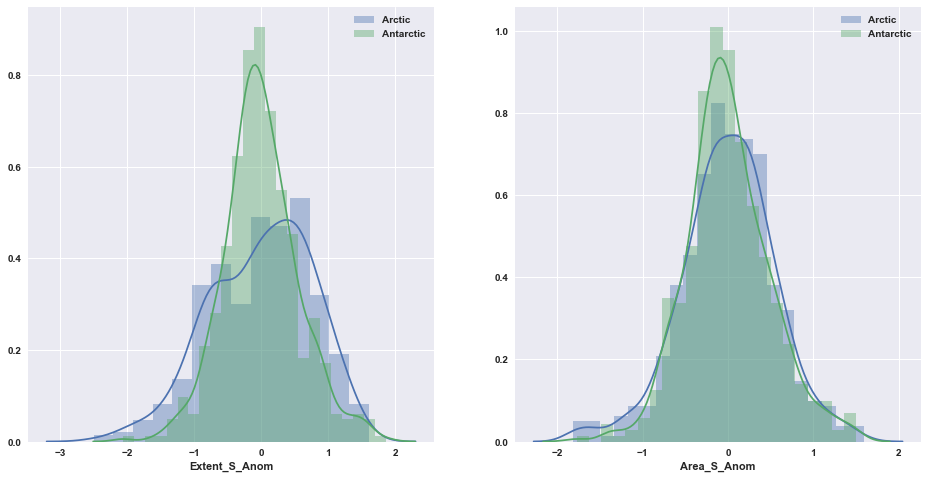

In [134]:
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
sn.distplot(SIE_Mon.Extent_N_Anom,label='Arctic')
sn.distplot(SIE_Mon.Extent_S_Anom,label='Antarctic')
plt.legend()
fig.add_subplot(122)
sn.distplot(SIE_Mon.Area_N_Anom,label='Arctic')
sn.distplot(SIE_Mon.Area_S_Anom,label='Antarctic')
plt.legend()
plt.savefig('figures/SIE/distribution_plots_SIE_ICA_anoms.png')

**Seasonal cycle**

In [135]:
# barplot für norhtern und southern hemisphere in 2x2 subplot und linien in einem plot mit unterschiedlichen Farben?
SeasCycle = SIE_Mon.groupby('Month').mean()
SeasCycle

,year,data-type_N,Extent_N,Area_N,Extent_S,Area_S,Extent_N_Anom,Area_N_Anom,Extent_S_Anom,Area_S_Anom
Month,,,,,,,,,,
1,1999.5,1.00000,14.233810,12.202143,4.993333,3.279048,-4.271715e-15,5.921189e-16,1.046782e-15,7.401487e-16
2,1999.5,1.02381,15.118095,12.987381,3.058333,1.994048,1.987828e-15,1.395709e-15,-2.220446e-16,-2.643388e-17
3,1999.5,1.02381,15.272857,13.128333,4.010714,2.681190,-2.960595e-16,-2.241593e-15,5.392512e-16,2.960595e-16
4,1999.5,1.02381,14.544524,12.490000,6.835952,5.035000,-3.637302e-15,-3.383537e-16,-5.709718e-16,-9.939139e-16
5,1999.5,1.02381,13.128810,11.056905,10.152619,7.846667,-2.114711e-15,-6.344132e-16,1.522592e-15,2.727977e-15
6,1999.5,1.02381,11.559286,9.031905,13.367143,10.557619,1.268826e-16,-5.075305e-16,-2.030122e-15,4.652363e-16
7,1999.5,1.02381,9.131190,6.216667,15.990476,12.783810,2.389623e-15,-1.268826e-16,5.455953e-15,-1.480297e-15
8,1999.0,1.00000,6.860732,4.494512,17.767073,14.140976,1.234785e-15,3.141119e-16,4.852487e-15,-1.516402e-15
9,1999.0,1.00000,6.068293,4.187317,18.524634,14.583902,-8.448526e-16,1.581391e-15,-2.339592e-15,1.559728e-15


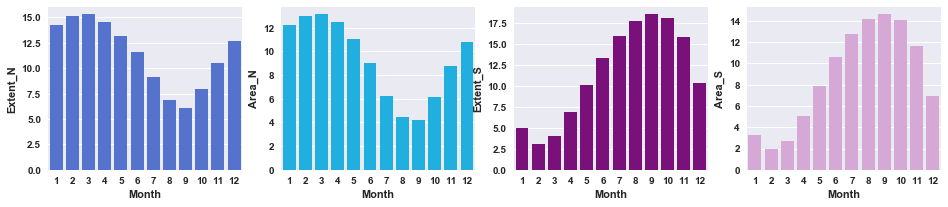

In [136]:
# barplot Monthly averaged SIE and ICA
fig = plt.figure(figsize=(16, 3))
color = ['royalblue','deepskyblue','darkmagenta' ,'plum']
cols = ['Extent_N','Area_N','Extent_S','Area_S']
for i,j in enumerate(cols):
    fig.add_subplot(141+i)
    sn.barplot(SeasCycle.index,SeasCycle[j],color=color[i])
plt.savefig('figures/SIE/Seasonal_cycle_barplot.png')

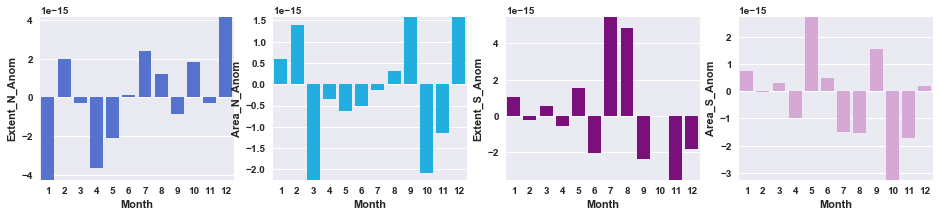

In [137]:
# barplot Monthly averaged anomalies of SIE and ICA
fig = plt.figure(figsize=(16, 3))
color = ['royalblue','deepskyblue','darkmagenta' ,'plum']
colsa = ['Extent_N_Anom','Area_N_Anom','Extent_S_Anom','Area_S_Anom']
for i,j in enumerate(colsa):
    fig.add_subplot(141+i)
    sn.barplot(SeasCycle.index,SeasCycle[j],color=color[i])
plt.savefig('figures/SIE/Seasonal_cycle_barplot_anoms.png')    

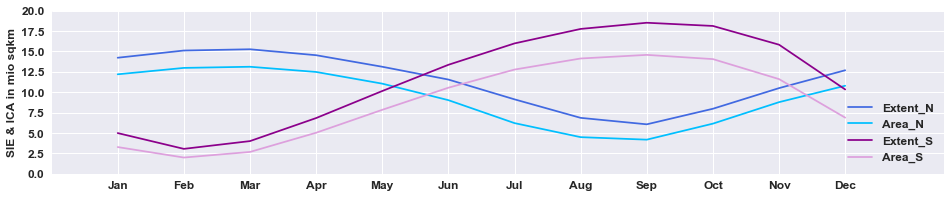

In [138]:
fig = plt.figure(figsize=(16, 3))

months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

for i,j in enumerate(cols):
    sn.lineplot(SeasCycle.index,SeasCycle[j],color=color[i],label=j);
plt.ylim(0,20)
plt.xlim(0,13.5)
plt.xlabel('')
plt.ylabel('SIE & ICA in mio sqkm', fontsize=12)
plt.xticks(SeasCycle.index,months,fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='lower right',fontsize=12);
plt.savefig('figures/SIE/Seasonal_cycle_lineplot.png')

**Seasonal Trends**

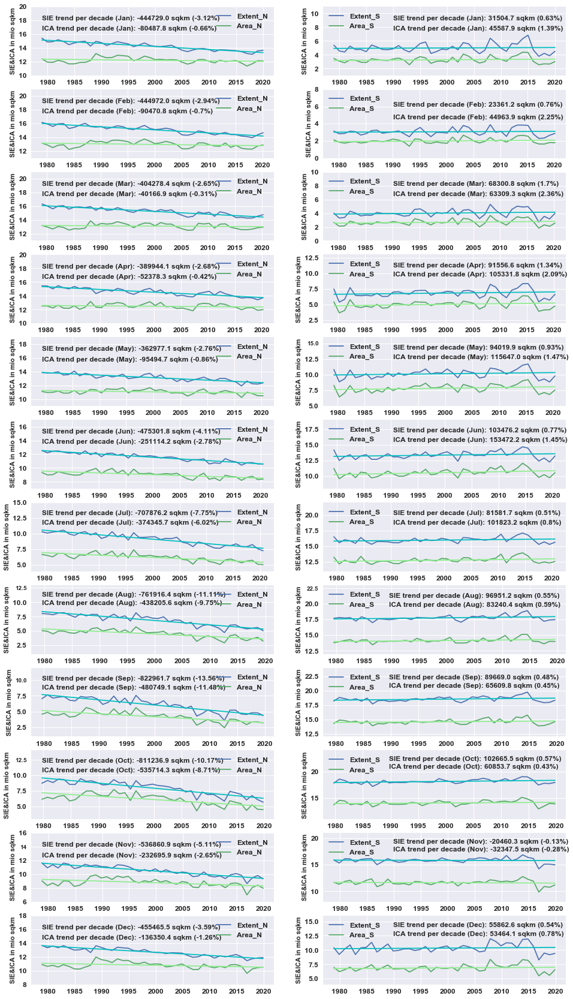

In [139]:
SeasDataMon = SIE_Mon.groupby('Month')
hemis = ['N','S']
count  = 1
reg_trend_A_SIE = []
reg_trend_AA_SIE = []
reg_trend_A_ICA = []
reg_trend_AA_ICA = []
plt.figure(figsize=(16,30))

for k in range(1,13):
    for i,j in enumerate(hemis):

        name1 = 'Extent_'+j
        name2 = 'Area_'+j
        data  = SeasDataMon.get_group(k)
        pos1  = 'upper right' if i==0 else 'upper left'
        posmin = np.floor(np.min(data[name2]))
        posmax = np.ceil(np.max(data[name1]))
        posx   = 0 if i==0 else -31
    
        plt.subplot(12,2,count)
        
        ax   = sn.lineplot(data.Datetime,data[name1], label=name1)
        ax   = sn.lineplot(data.Datetime,data[name2],label=name2)
    
        # calculate linear trend with poly1d and plot it
        lreg1 = np.poly1d(np.polyfit(np.arange(len(data.Month)), data[name1], 1))
        lreg2 = np.poly1d(np.polyfit(np.arange(len(data.Month)), data[name2], 1))
        sn.lineplot(data.Datetime, lreg1(np.arange(len(data.Month))),color='c');
        sn.lineplot(data.Datetime, lreg2(np.arange(len(data.Month))),color='lightgreen');
    
        # print Trend in sqkm per decade (=>*12*10*1000000) into figure
        txt1 = 'SIE trend per decade ('+months[k-1]+'): '  + str((lreg1.c[0]*10*1000000).round(1)) +' sqkm ('+ \
              str((lreg1.c[0]*10/data[name1].mean()*100).round(2)) +'%)'
        txt2 = 'ICA trend per decade ('+months[k-1]+'): ' + str((lreg2.c[0]*10*1000000).round(1)) +' sqkm ('+ \
              str((lreg2.c[0]*10/data[name2].mean()*100).round(2)) +'%)'
        
        if i == 0:
            reg_trend_A_SIE.append(lreg1.c[0]*10/data[name1].mean()*100)
            reg_trend_A_ICA.append(lreg2.c[0]*10/data[name2].mean()*100)
        else:
            reg_trend_AA_SIE.append(lreg1.c[0]*10/data[name1].mean()*100)
            reg_trend_AA_ICA.append(lreg2.c[0]*10/data[name2].mean()*100)
            
        plt.text(data.Datetime.iloc[posx],posmax+2.0,txt1,fontsize=12)
        plt.text(data.Datetime.iloc[posx],posmax+0.5,txt2,fontsize=12)
        plt.ylabel('SIE&ICA in mio sqkm')
        plt.xlabel('')
        plt.xticks(fontsize= 12)
        plt.yticks(fontsize= 12)
        count += 1
        plt.ylim(posmin-1, posmax+4)
        plt.legend(loc=pos1,fontsize=12);
        #plt.savefig('figures/SIE/Mon/'+"%2.2d"%(k)+'_'+j+'MonTrend.png')
#plt.savefig('figures/SIE/SIE25All_MonTrend.png')    

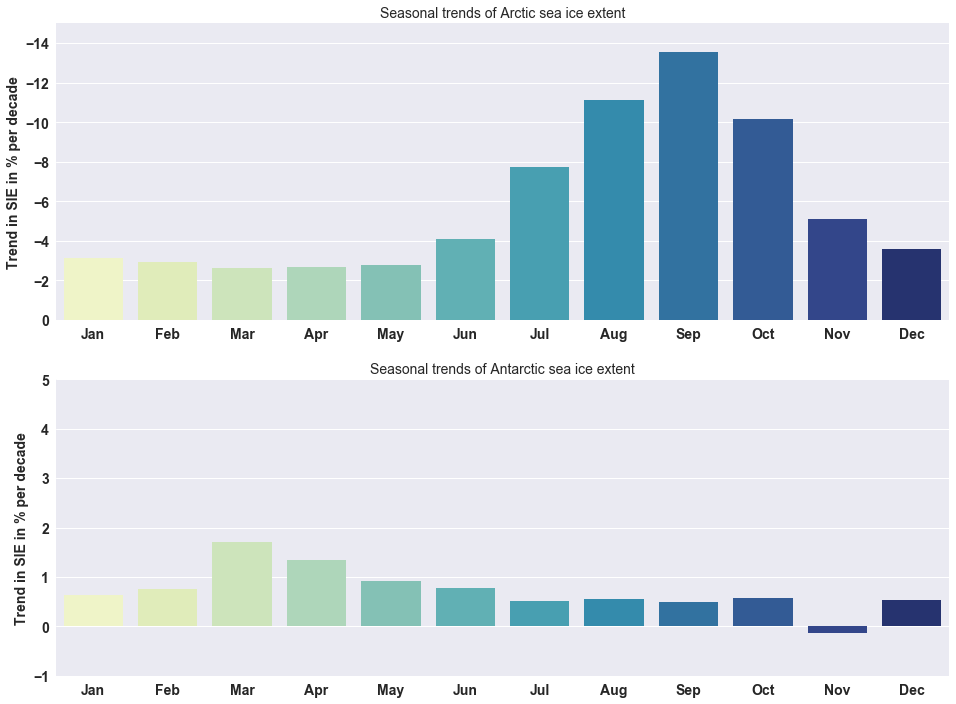

In [140]:
# plot trends in % as barplot
fig = plt.figure(figsize=(16,12))
fig.add_subplot(211)
sn.barplot(months,reg_trend_A_SIE,palette='YlGnBu')
plt.xticks(fontsize=14);
plt.yticks(fontsize=14);
plt.ylim(0,-15)
plt.ylabel('Trend in SIE in % per decade',fontsize=14);
plt.title('Seasonal trends of Arctic sea ice extent',fontsize=14)
fig.add_subplot(212)
sn.barplot(months,reg_trend_AA_SIE,palette='YlGnBu')
plt.xticks(fontsize=14);
plt.yticks(fontsize=14);
plt.ylim(-1,5)
plt.title('Seasonal trends of Antarctic sea ice extent',fontsize=14)
plt.ylabel('Trend in SIE in % per decade',fontsize=14);
plt.savefig('figures/SIE/SIE25km_MonTrends_percent.png',dpi=200)

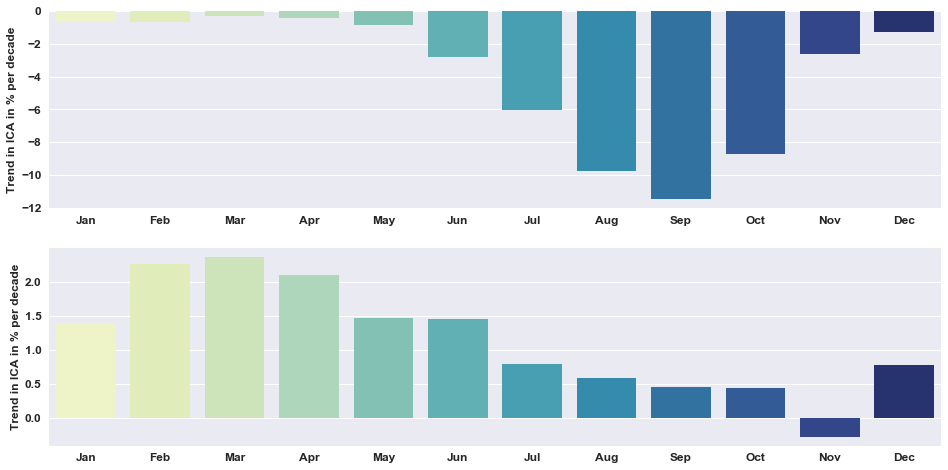

In [141]:
# plot trends in % as barplot
fig = plt.figure(figsize=(16,8))
fig.add_subplot(211)
sn.barplot(months,reg_trend_A_ICA,palette='YlGnBu')
plt.xticks(fontsize=12);
plt.yticks(fontsize=12);
plt.ylabel('Trend in ICA in % per decade',fontsize=12);
fig.add_subplot(212)
sn.barplot(months,reg_trend_AA_ICA,palette='YlGnBu')
plt.xticks(fontsize=12);
plt.yticks(fontsize=12);
plt.ylabel('Trend in ICA in % per decade',fontsize=12);
plt.savefig('figures/SIE/ICA25km_MonTrends_percent.png')

**Autocorrelation**

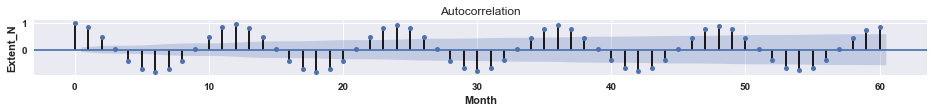

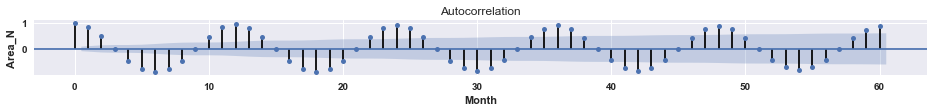

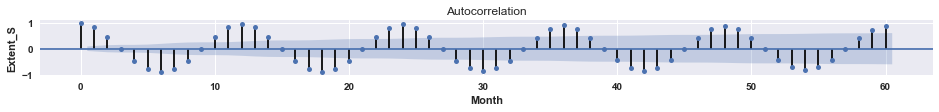

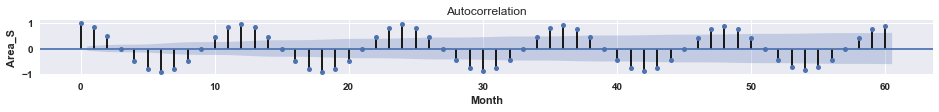

In [142]:
colus = ['Extent_N','Area_N','Extent_S','Area_S']
matplotlib.rc('figure',figsize=(16, 1)) 
for i,j in enumerate(colus):
    plot_acf(SIE_Mon[j], lags=60)
    plt.ylabel(j)
    plt.xlabel('Month')
    #plt.savefig('figures/SIE/SIE25km_autocorrelation_'+j+'.png')


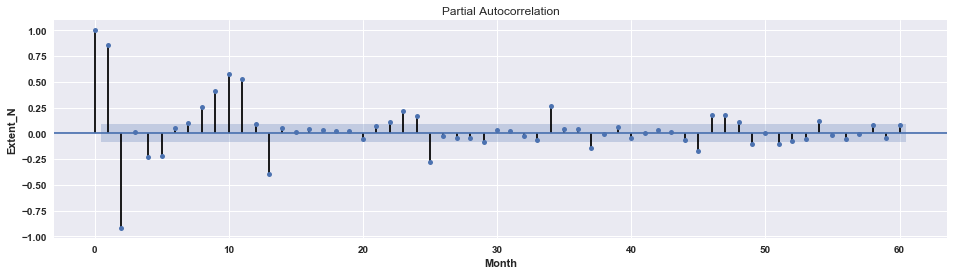

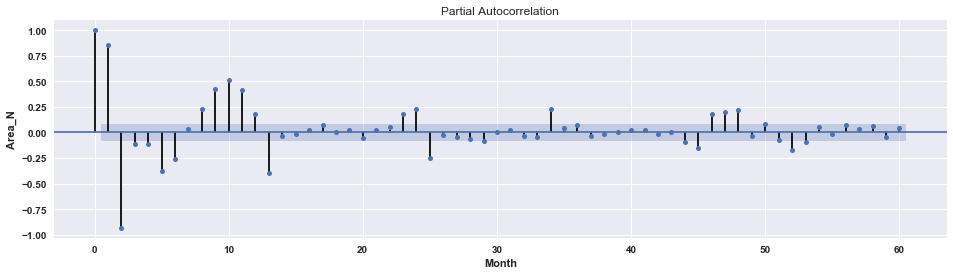

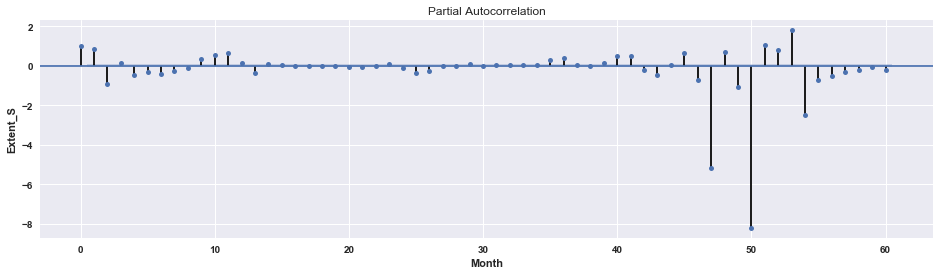

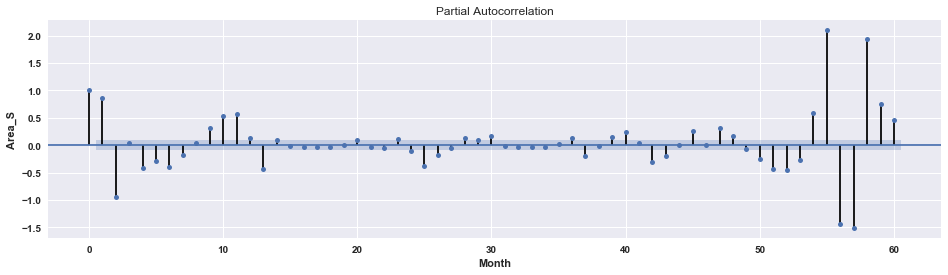

In [143]:
colus = ['Extent_N','Area_N','Extent_S','Area_S']
matplotlib.rc('figure',figsize=(16, 4)) 
for i,j in enumerate(colus):
    ax = plot_pacf(SIE_Mon[j], lags=60)
    plt.ylabel(j)
    plt.xlabel('Month')
    #plt.savefig('figures/SIE/SIE25km_partial_autocorrelation_'+j+'.png')
matplotlib.rc('figure',figsize=(16, 9)) 

**Correlation bewteen northern and southern hemisphere sie and ica**

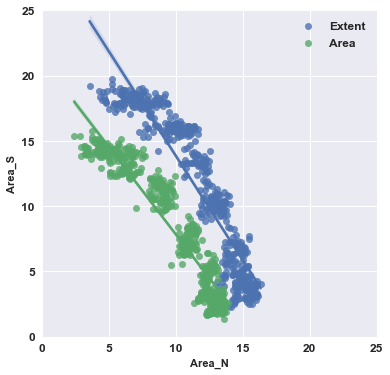

In [144]:
# make subplots out of these two
fig = plt.figure(figsize=(6,6))

sn.regplot(x='Extent_N', y='Extent_S', data=SIE_Mon,label='Extent')
sn.regplot(x='Area_N', y='Area_S', data=SIE_Mon,label='Area')
    
plt.xticks(fontsize= 12)
plt.yticks(fontsize= 12)
plt.ylim(0, 25)
plt.xlim(0, 25)
plt.legend(fontsize=12)    
#plt.savefig('figures/SIE/North-South_correlation.png')  


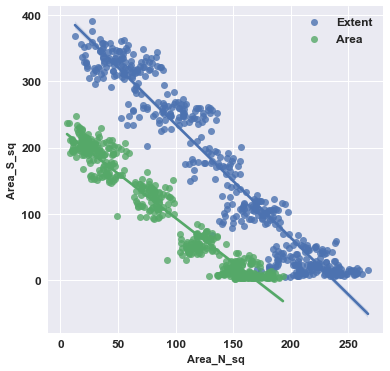

In [145]:
fig = plt.figure(figsize=(6,6))
SIE_Mon['Extent_N_sq'] = (SIE_Mon.Extent_N)**2
SIE_Mon['Extent_S_sq'] = (SIE_Mon.Extent_S)**2
SIE_Mon['Area_N_sq'] = (SIE_Mon.Area_N)**2
SIE_Mon['Area_S_sq'] = (SIE_Mon.Area_S)**2
sn.regplot(x='Extent_N_sq', y='Extent_S_sq', data=SIE_Mon,label='Extent')
sn.regplot(x='Area_N_sq', y='Area_S_sq', data=SIE_Mon,label='Area')
    
plt.xticks(fontsize= 12)
plt.yticks(fontsize= 12)

plt.legend(fontsize=12)    
#plt.savefig('figures/SIE/North-South_squared_correlation.png')  

* It seems that there are ~4 classes -> seasons?

**Calculate ICA/SIE**

In [146]:
SIE_Mon['ICA_SIE_N_relation'] = SIE_Mon.Area_N/SIE_Mon.Extent_N
SIE_Mon['ICA_SIE_S_relation'] = SIE_Mon.Area_S/SIE_Mon.Extent_S
SIE_Mon[['ICA_SIE_N_relation','ICA_SIE_S_relation']].head()

,ICA_SIE_N_relation,ICA_SIE_S_relation
0,0.775966,0.735220
1,0.797366,0.670192
2,0.805321,0.642593
3,0.814586,0.671975
4,0.808446,0.665000


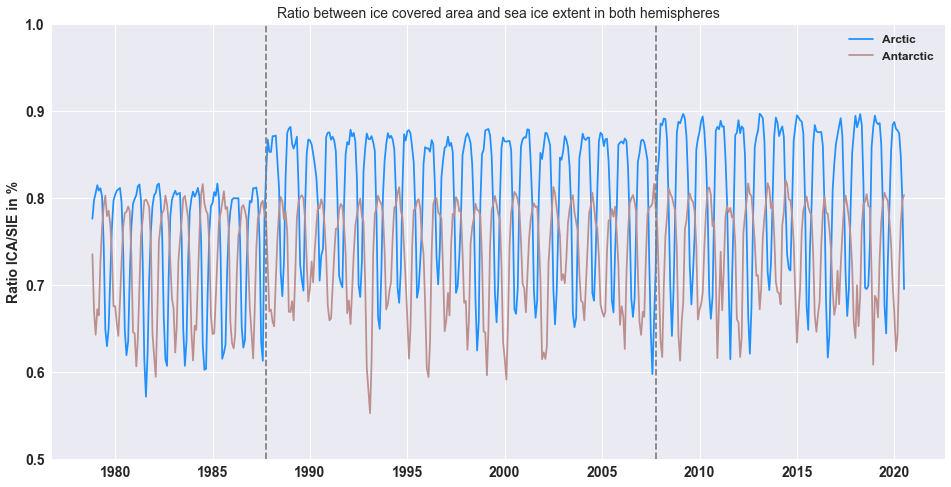

In [147]:
plt.figure(figsize=(16,8))
sn.lineplot(SIE_Mon.Datetime,SIE_Mon['ICA_SIE_N_relation'],color = 'dodgerblue',label='Arctic')
sn.lineplot(SIE_Mon.Datetime,SIE_Mon['ICA_SIE_S_relation'],color = 'rosybrown',label='Antarctic')
    
plt.legend(fontsize= 12)
    
plt.title('Ratio between ice covered area and sea ice extent in both hemispheres',fontsize=14)
plt.xlabel('')
plt.ylabel('Ratio ICA/SIE in %',fontsize=14)
plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)
plt.ylim(0.5, 1)
plt.axvline(SIE_Mon.Datetime.loc[(SIE_Mon.year==1987) & (SIE_Mon.Month==10)],linestyle='--',color='gray')
plt.axvline(SIE_Mon.Datetime.loc[(SIE_Mon.year==2007) & (SIE_Mon.Month==10)],linestyle='--',color='gray')
plt.savefig('figures/SIE/Ration_ICA_SIE_Mon_ts.png')



This looks very strange. It seems that there are two jumps in the northern hemisphere data. 
* Check if these jumps correlate with sensor changes
* Check if first jump correlates with changes from every-other data before 1988 and daily data afterwards
* Southern Ocean data seem to be clean here

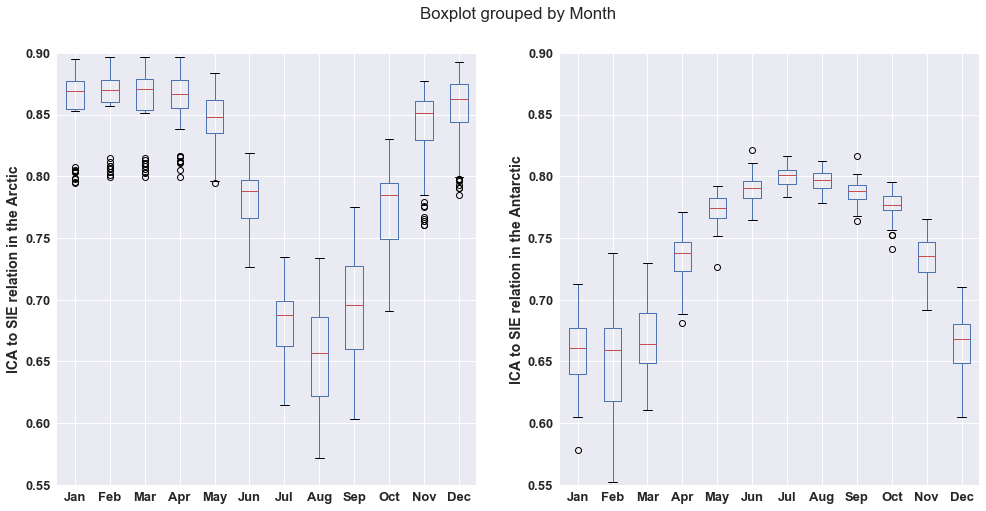

In [148]:
# monthly values
cols_ratio = ['ICA_SIE_N_relation','ICA_SIE_S_relation']
fig, axes = plt.subplots(1,2,figsize=(16,8))

for i,j in enumerate(cols_ratio):
    if i ==0:
        ylabels = 'ICA to SIE relation in the Arctic'
    else:
        ylabels = 'ICA to SIE relation in the Antarctic'
        
    ax = SIE_Mon.boxplot(column=[j], by='Month',ax=axes.flatten()[i]);
    ax.set_xlabel('')
    ax.set_xticks(range(1,13))
    ax.set_xticklabels(months,fontsize=13)
    axes[i].set_ylim(0.55, 0.9) 
    ax.tick_params(axis='both', which='major', labelsize=13)
    ax.set_ylabel(ylabels,fontsize=14)
    ax.set_title('')

plt.savefig('figures/SIE/Ratio_ICA_SIE_boxplots_outliers.png')  

### 1-4 km resolution SIE data

**High resolution sea ice extent ranges for individual Arctic regions, monthly data**

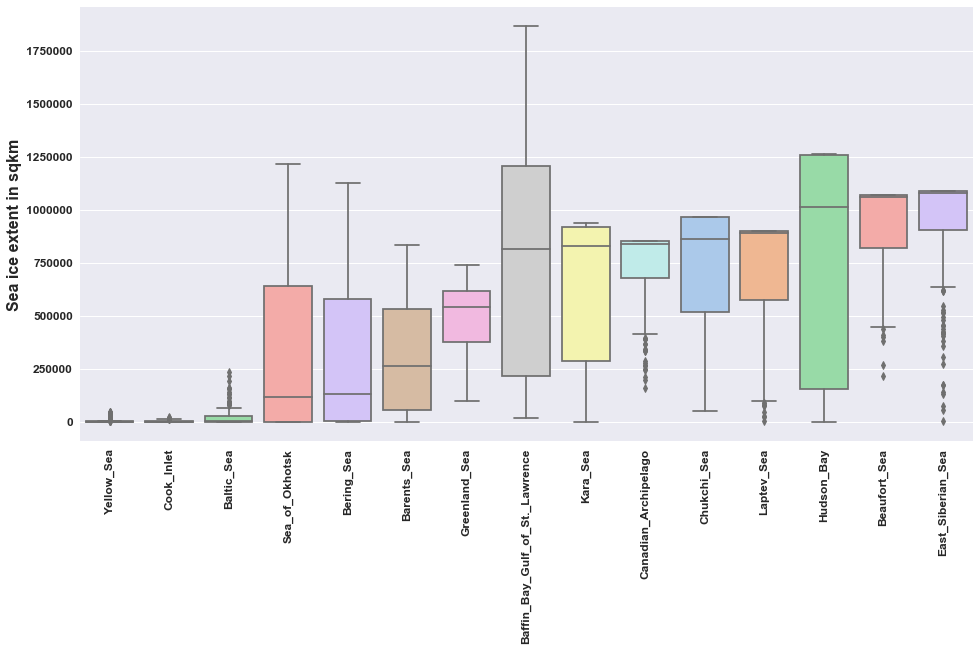

In [149]:
plt.figure(figsize=(16,8))
# make a copy of data frame in order to delete regions with high sea ice extent and yyyyddd and to sort data
df_sie_4km_Mon_copy = pd.DataFrame.copy(df_sie_4km_Mon)
df_sie_4km_Mon_copy.drop(['yyyyddd','Northern_Hemisphere','Central_Arctic'],inplace=True, axis=1)
sorted_index        = df_sie_4km_Mon_copy.median().sort_values().index
df_sie_4km_Mon_copy = df_sie_4km_Mon_copy[sorted_index]

# create a boxplot
ax = sn.boxplot(x="variable",y="value",palette='pastel',data=pd.melt(df_sie_4km_Mon_copy))
ax.set_xlabel('')
ax.set_ylabel('Sea ice extent in sqkm', fontsize=16)
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)
plt.savefig('figures/SIE/SIE_4kmRes_boxplot.png')

0 Northern_Hemisphere
1 Central_Arctic


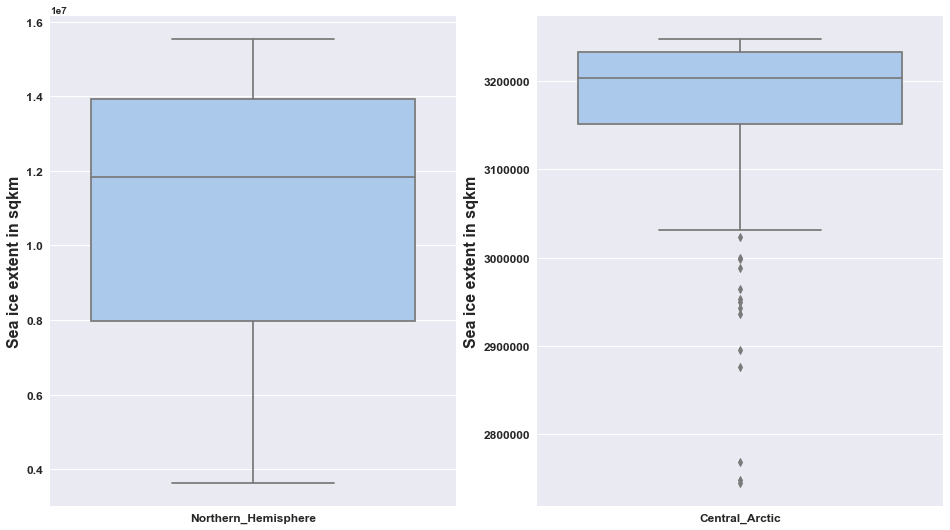

In [150]:
# create a boxplot for entire Artic and central Arctic
plt.figure(figsize=(16,9))

region = ['Northern_Hemisphere','Central_Arctic']
for i,j in enumerate(region):
    print(i,j)
    plt.subplot(121+i)
    ax = sn.boxplot(x="variable",y="value",palette='pastel',data=pd.melt(df_sie_4km_Mon[[j]]))
    ax.set_xlabel('')
    ax.set_ylabel('Sea ice extent in sqkm', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
plt.savefig('figures/SIE/SIE_4kmRes_boxplot_Arc_cArc.png')

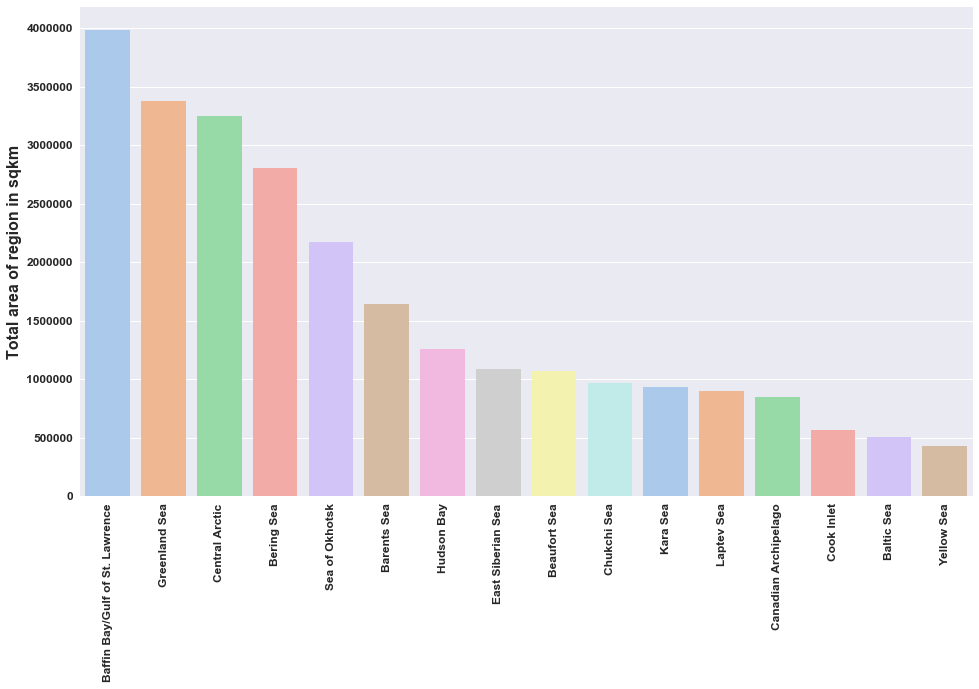

In [151]:
# Ocean areas, sorted boxplot
OceanAreas_copy = pd.DataFrame.copy(OceanAreas)
OceanAreas_copy.drop(OceanAreas_copy.index[0],axis=0,inplace=True) 
OceanAreas_copy.sort_values(by='OceanArea',ascending=False,inplace=True)

plt.figure(figsize=(16,9))
ax = sn.barplot(x=OceanAreas_copy['Region Name'], y= OceanAreas_copy.OceanArea, palette='pastel')
ax.set_xlabel('');
ax.set_ylabel('Total area of region in sqkm',fontsize=16);
plt.xticks(fontsize= 12, rotation=90)
plt.yticks(fontsize= 12)
plt.savefig('figures/SIE/Ocean_areas_barplot.png')

In [152]:
df_sie_4km_Mon.columns

Index(['Datetime', 'yyyyddd', 'Northern_Hemisphere', 'Beaufort_Sea',
       'Chukchi_Sea', 'East_Siberian_Sea', 'Laptev_Sea', 'Kara_Sea',
       'Barents_Sea', 'Greenland_Sea', 'Baffin_Bay_Gulf_of_St._Lawrence',
       'Canadian_Archipelago', 'Hudson_Bay', 'Central_Arctic', 'Bering_Sea',
       'Baltic_Sea', 'Sea_of_Okhotsk', 'Yellow_Sea', 'Cook_Inlet'],
      dtype='object')

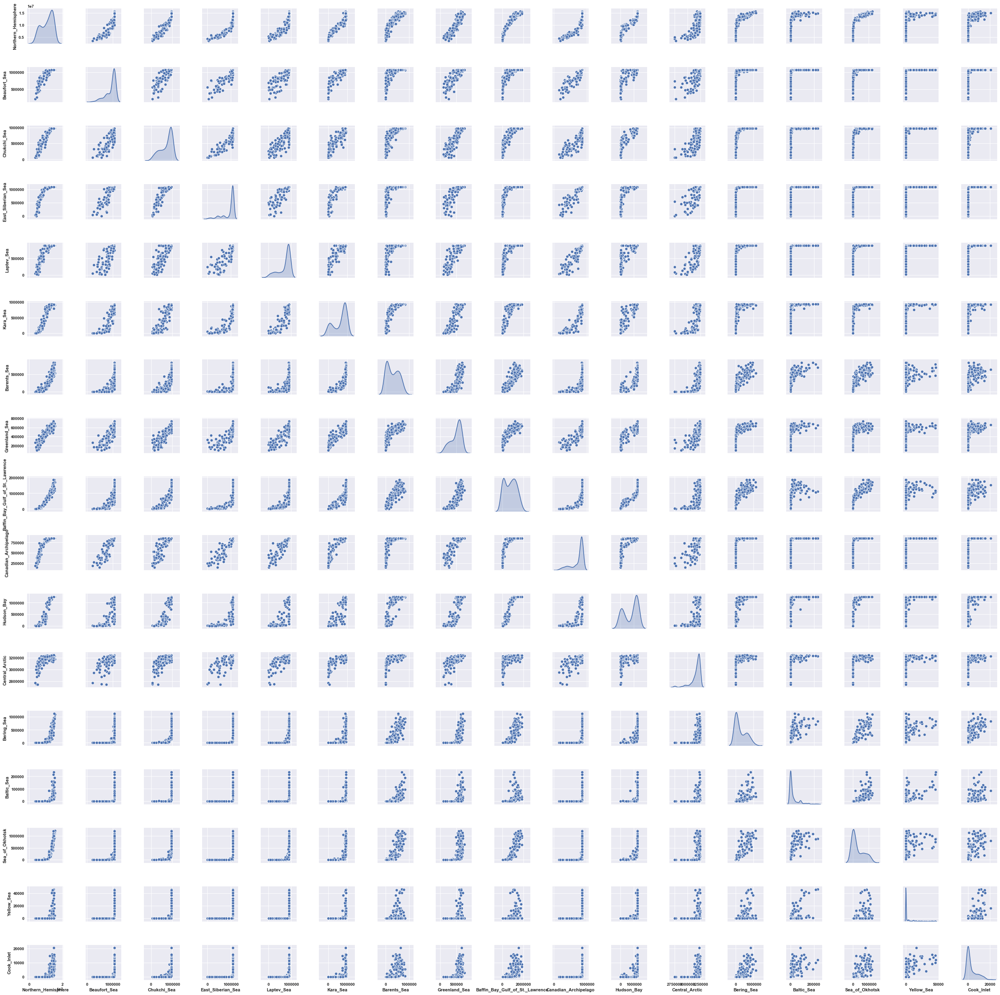

In [153]:
nums_col = ['Northern_Hemisphere', 'Beaufort_Sea', 'Chukchi_Sea','East_Siberian_Sea', 'Laptev_Sea', 'Kara_Sea', \
            'Barents_Sea','Greenland_Sea', 'Baffin_Bay_Gulf_of_St._Lawrence','Canadian_Archipelago', \
            'Hudson_Bay', 'Central_Arctic', 'Bering_Sea','Baltic_Sea', 'Sea_of_Okhotsk', 'Yellow_Sea', \
            'Cook_Inlet']
sn.pairplot(df_sie_4km_Mon.loc[:,nums_col],palette='bright',diag_kind='kde', height=2)
plt.savefig('figures/SIE/SIE4km_pairplot_all.png')

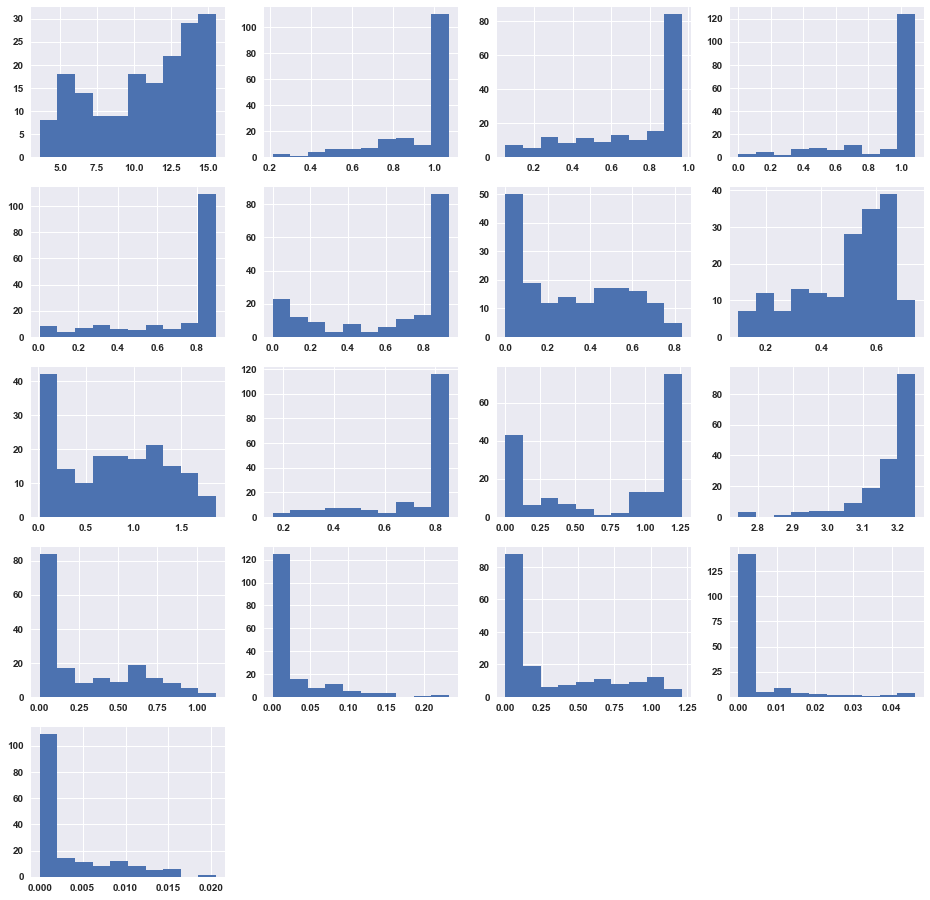

In [154]:
#Histogram in mio sqkm
plt.figure(figsize=(16,16))
reg_trend = []
reg_trend1 = []
for i,j in enumerate(nums_col):
    plt.subplot(5,4,i+1)
    plt.hist(df_sie_4km_Mon[j]/1000000)
    lreg = np.poly1d(np.polyfit(np.arange(len(df_sie_4km_Mon[j])), df_sie_4km_Mon[j], 1))
    txt  = 'SIE trend per decade: ' + str((lreg.c[0]*12*10).round(1)) +' sqkm ('+ \
              str((lreg.c[0]*12*10/df_sie_4km_Mon[j][df_sie_4km_Mon[j] != 0].mean()*100).round(2)) +'%)'
    reg_trend.append(lreg.c[0]*12*10/df_sie_4km_Mon[j][df_sie_4km_Mon[j] != 0].mean()*100)
    reg_trend1.append(lreg.c[0]*12)

#plt.savefig('figures/SIE/SIE4km_hist_allReg.png')

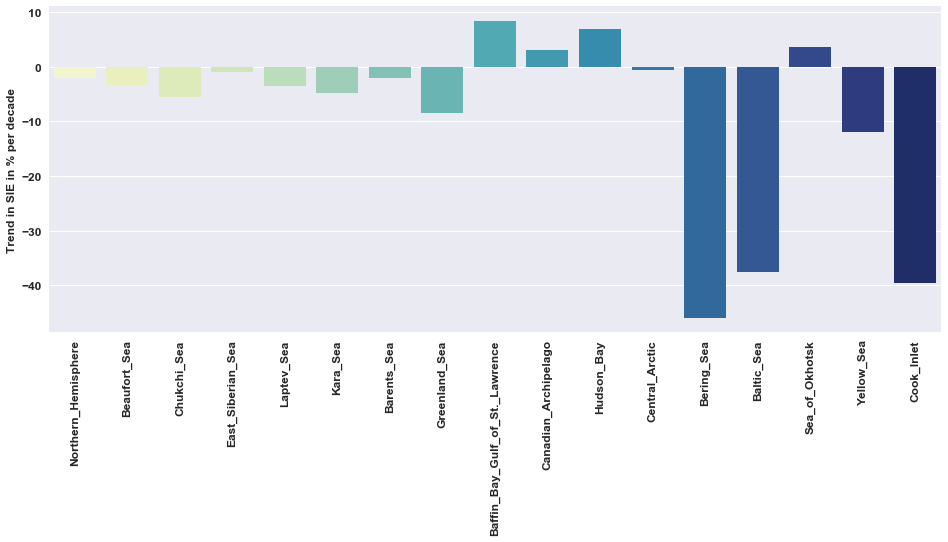

In [155]:
# trends in percent are calculated by eliminating no ice occurence (is needed for Baltic sea for example)
plt.figure(figsize=(16,6))
sn.barplot(nums_col,reg_trend,palette='YlGnBu')
plt.xticks(rotation=90,fontsize=12);
plt.yticks(fontsize=12);
plt.ylabel('Trend in SIE in % per decade',fontsize=12);
plt.savefig('figures/SIE/SIE4km_RegTrends_percent.png')

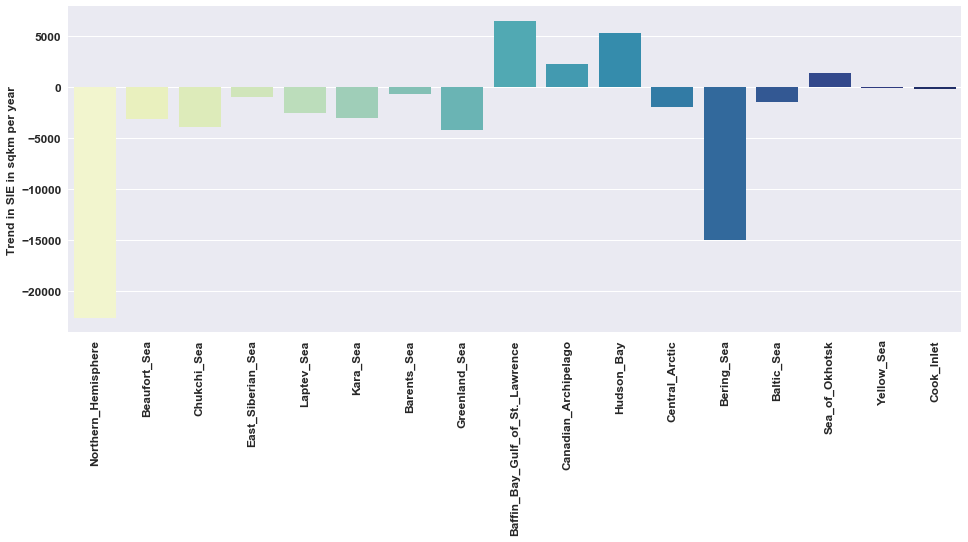

In [156]:
plt.figure(figsize=(16,6))
sn.barplot(nums_col,reg_trend1,palette='YlGnBu')
plt.xticks(rotation=90,fontsize=12);
plt.yticks(fontsize=12);
plt.ylabel('Trend in SIE in sqkm per year',fontsize=12);
#plt.savefig('figures/SIE/SIE4km_RegTrends_perYear.png')

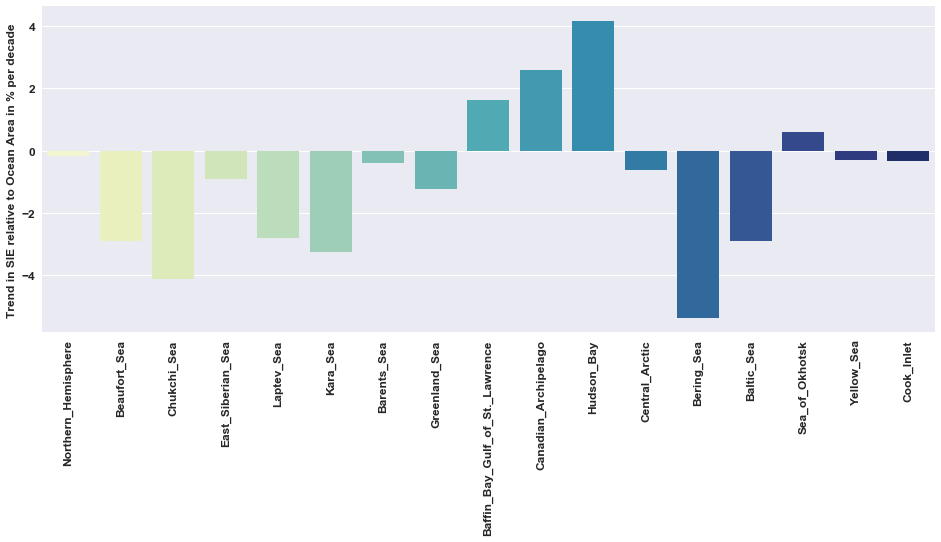

In [157]:
plt.figure(figsize=(16,6))
sn.barplot(nums_col,(reg_trend1/OceanAreas.OceanArea)*10*100,palette='YlGnBu')
plt.xticks(rotation=90,fontsize=12);
plt.yticks(fontsize=12);
plt.ylabel('Trend in SIE relative to Ocean Area in % per decade',fontsize=12);
plt.savefig('figures/SIE/SIE4km_RegTrends_perYear_relOceanArea.png')

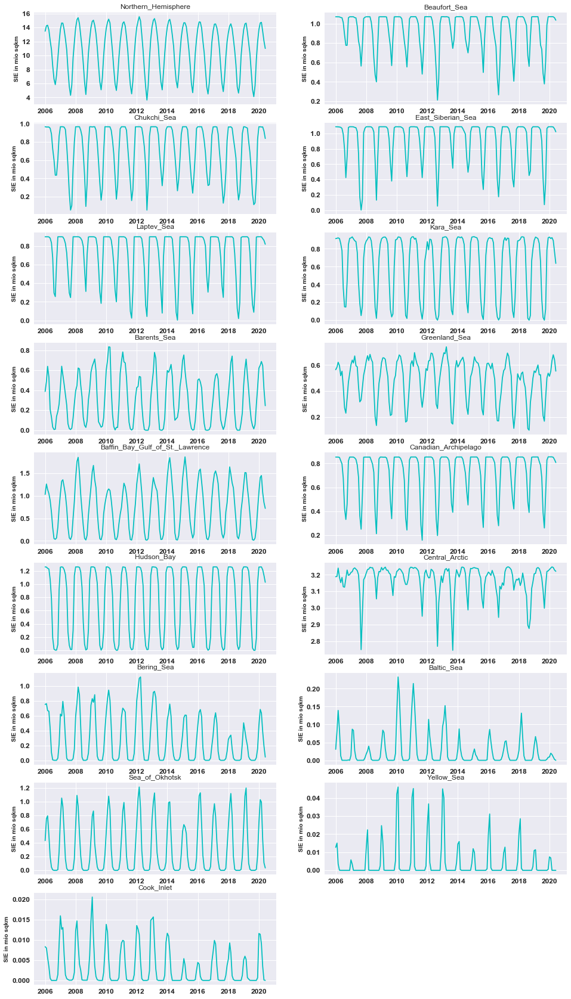

In [158]:
plt.figure(figsize=(16,30))

for i,j in enumerate(nums_col):
    plt.subplot(9,2,i+1)
    sn.lineplot(df_sie_4km_Mon.Datetime,df_sie_4km_Mon[j]/1000000, color = 'c')
    plt.xlabel('')
    plt.ylabel('SIE in mio sqkm',fontsize=10)
    plt.title(j)
    plt.xticks(fontsize= 12)
    plt.yticks(fontsize= 12)
   # plt.ylim(0, 20)

#plt.savefig('figures/SIE/SIE4km_Mon_ts.png')

In [159]:
df_sie_4km_Mon.columns[2:19]

Index(['Northern_Hemisphere', 'Beaufort_Sea', 'Chukchi_Sea',
       'East_Siberian_Sea', 'Laptev_Sea', 'Kara_Sea', 'Barents_Sea',
       'Greenland_Sea', 'Baffin_Bay_Gulf_of_St._Lawrence',
       'Canadian_Archipelago', 'Hudson_Bay', 'Central_Arctic', 'Bering_Sea',
       'Baltic_Sea', 'Sea_of_Okhotsk', 'Yellow_Sea', 'Cook_Inlet'],
      dtype='object')

In [160]:
# create anomalies
start      = pd.to_datetime('1981/1/1')
end        = pd.to_datetime('2010/12/1')
Ice_columns = df_sie_4km_Mon.columns[2:19]

IceDataClim          = df_sie_4km_Mon.copy()
IceDataClim['Month'] = pd.to_numeric(IceDataClim['Datetime'].dt.strftime('%m'))
IceDataClimAvg       = IceDataClim.groupby('Month').mean()
df_sie_4km_Mon['Month']  = pd.to_numeric(df_sie_4km_Mon['Datetime'].dt.strftime('%m'))

for i in Ice_columns: 
    nvar = i +'_anom'
    df_sie_4km_Mon[nvar] = 0
    print(i)       
    for t in range(1,13):
        df_sie_4km_Mon[nvar][df_sie_4km_Mon.Month==t] = df_sie_4km_Mon[i][df_sie_4km_Mon.Month==t]\
        -IceDataClimAvg[i][t]

Northern_Hemisphere
Beaufort_Sea
Chukchi_Sea
East_Siberian_Sea
Laptev_Sea
Kara_Sea
Barents_Sea
Greenland_Sea
Baffin_Bay_Gulf_of_St._Lawrence
Canadian_Archipelago
Hudson_Bay
Central_Arctic
Bering_Sea
Baltic_Sea
Sea_of_Okhotsk
Yellow_Sea
Cook_Inlet


In [161]:
df_sie_4km_Mon['Hudson_Bay'][df_sie_4km_Mon.Month==t]

11     9.128770e+05
23     1.127519e+06
35     1.062999e+06
47     9.475615e+05
59     7.050118e+05
71     9.421351e+05
83     1.131530e+06
95     1.178924e+06
107    1.226811e+06
119    1.065588e+06
131    9.276047e+05
143    1.117521e+06
155    1.213291e+06
167    1.020198e+06
Name: Hudson_Bay, dtype: float64

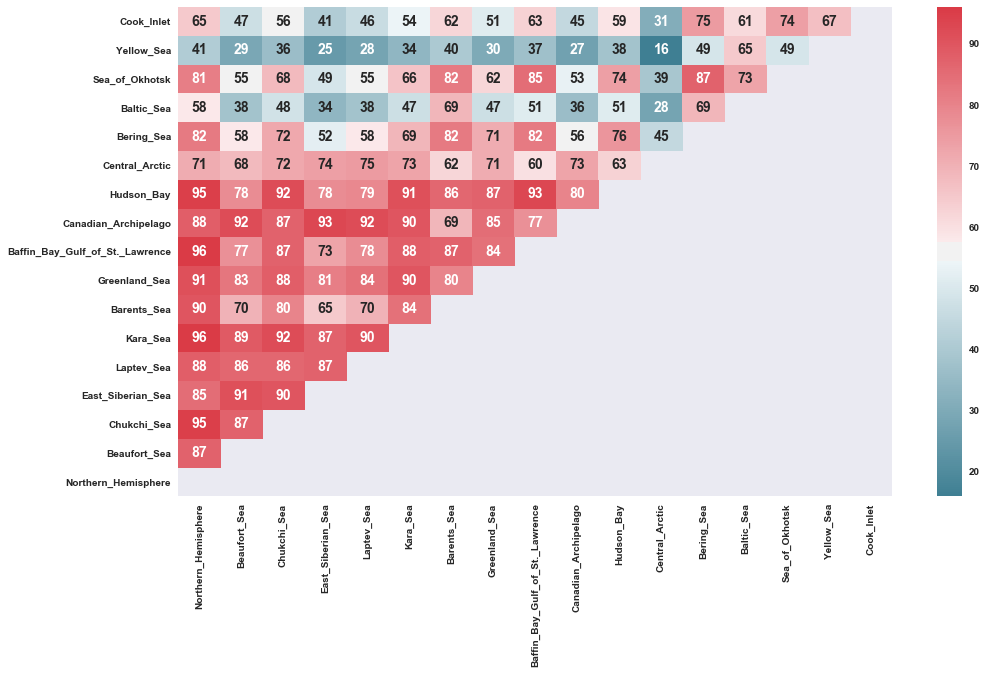

In [162]:
# correlelogramm
# hier möchte ich auch nochmal mit den ANomalies gucken!!!
cmap  = sn.diverging_palette(220, 10, as_cmap=True) 
X_dum = pd.get_dummies(df_sie_4km_Mon[nums_col]).copy()
mask  = np.triu(X_dum.corr()) 
ax    = sn.heatmap(round(X_dum.corr()*100,0),
                  annot = True,
                  mask  = mask,
                  cmap  = cmap)
ax.set_ylim((0,17))
plt.savefig('figures/SIE/SIE4km_correlogram.png')

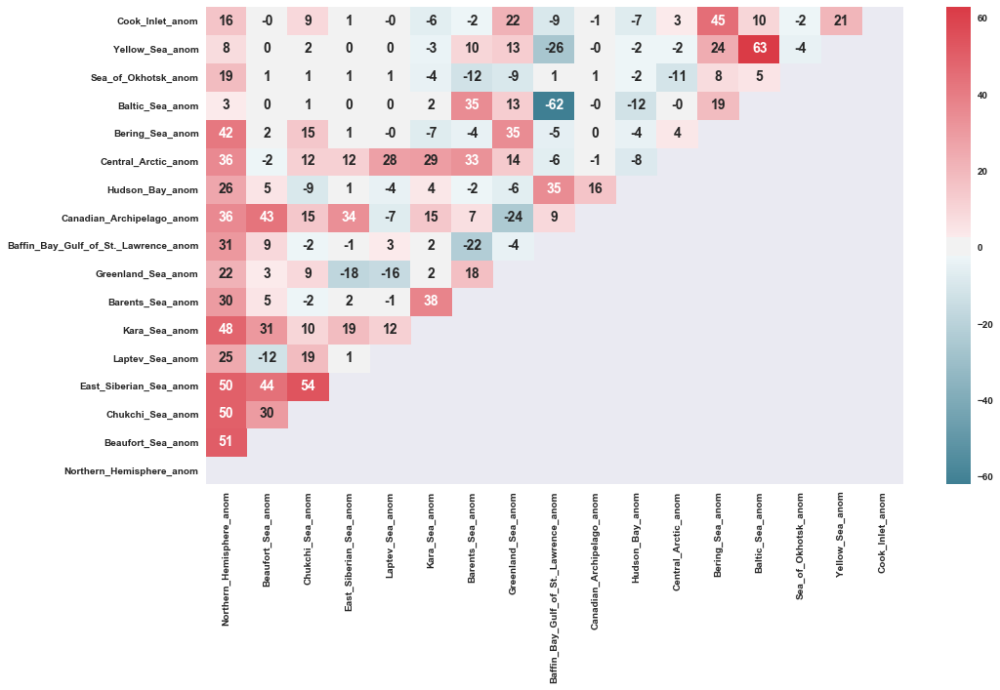

In [163]:
# correlelogramm
# hier möchte ich auch nochmal mit den ANomalies gucken!!!
cmap  = sn.diverging_palette(220, 10, as_cmap=True) 
X_dum = pd.get_dummies(df_sie_4km_Mon[df_sie_4km_Mon.columns[20:]]).copy()
mask  = np.triu(X_dum.corr()) 
ax    = sn.heatmap(round(X_dum.corr()*100,0),
                  annot = True,
                  mask  = mask,
                  cmap  = cmap)
ax.set_ylim((0,17))
plt.savefig('figures/SIE/SIE4km_correlogram_anoms.png')

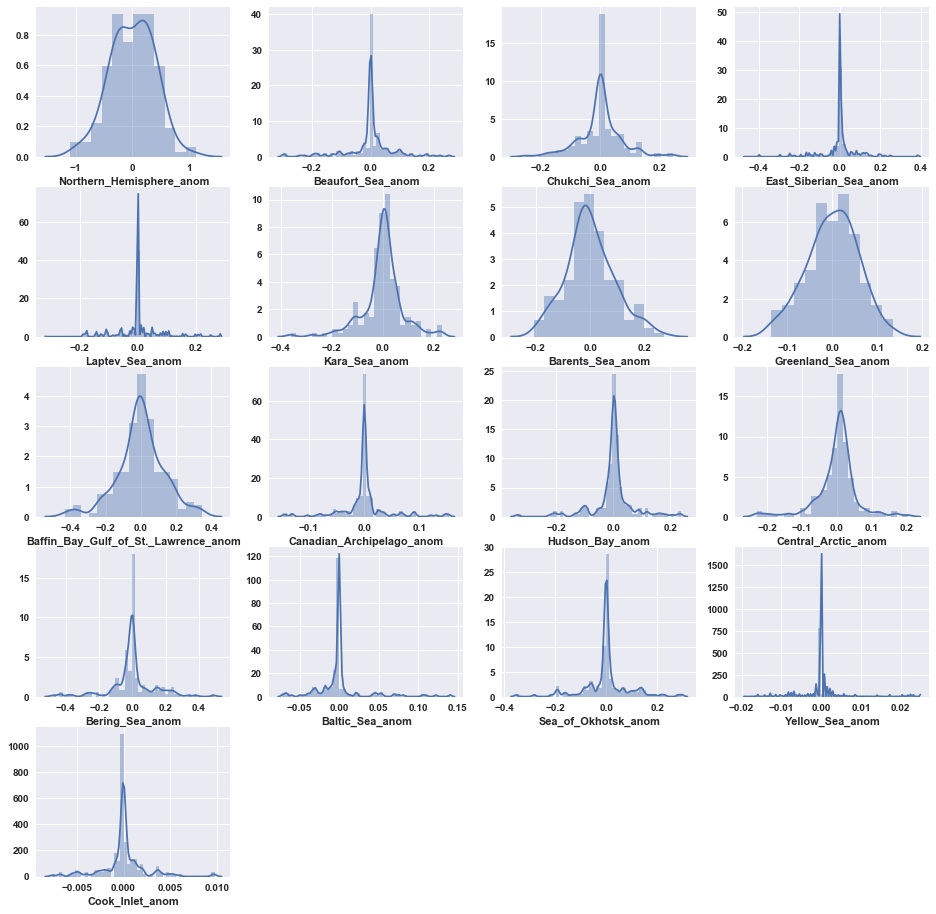

In [164]:
#Histogram in mio sqkm
plt.figure(figsize=(16,16))
for i,j in enumerate(df_sie_4km_Mon.columns[20:]):
    plt.subplot(5,4,i+1)
    sn.distplot(df_sie_4km_Mon[j]/1000000)

#plt.savefig('figures/SIE/SIE4km_hist_allReg_anoms.png')

**Findings:**
* The amount of sea ice extent varies from close to 0 to >3.2 mio sqkm for the different regions.
* However, also the region size varies strongly.

### Global Carbon

In [165]:
global_carbon.columns

Index(['Year', 'Month', 'Decimal_Date', 'Datetime', 'CO2_(ppm)',
       'SeasAdjstd_CO2_(ppm)', 'CO2_Fit_(ppm)', 'SeasAdjstd_CO2_Fit_(ppm)',
       'CO2_(ppm)_filled', 'SeasAdjstd_CO2_(ppm)_filled'],
      dtype='object')

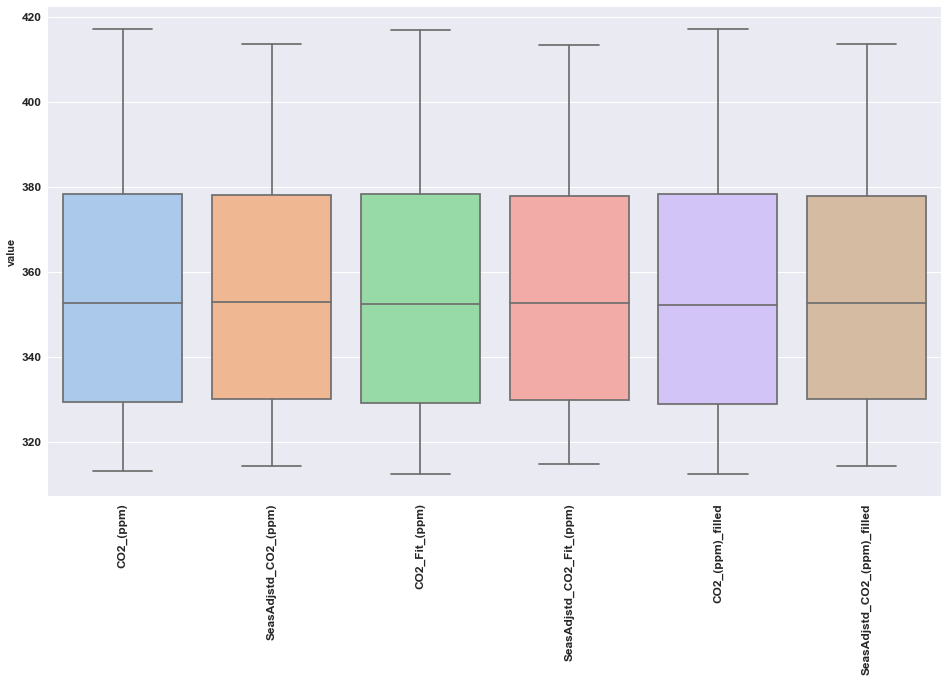

In [166]:
num_cols = ['CO2_(ppm)', 'SeasAdjstd_CO2_(ppm)', 'CO2_Fit_(ppm)','SeasAdjstd_CO2_Fit_(ppm)','CO2_(ppm)_filled', \
            'SeasAdjstd_CO2_(ppm)_filled']
ax = sn.boxplot(x='variable',y='value', palette='pastel',\
                data=pd.melt(global_carbon[num_cols]))
ax.set_xlabel('')
#ax.set_ylabel('Sea ice extent in mio sqkm',fontsize=16)
plt.xticks(fontsize= 12,rotation=90)
plt.yticks(fontsize= 12)
plt.savefig('figures/Carbon/Carbon_boxplot.png')

<Figure size 1152x864 with 0 Axes>

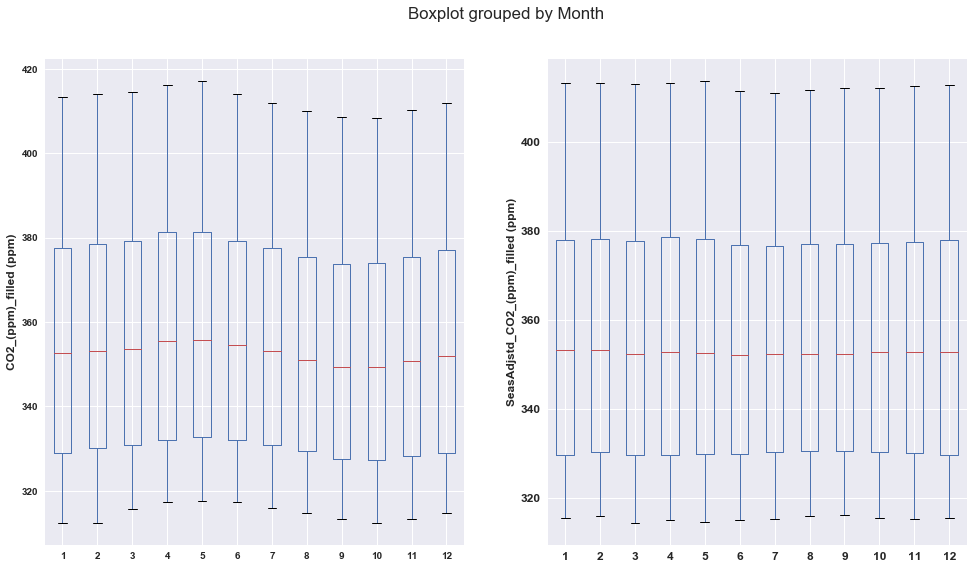

In [167]:
plt.figure(figsize=(16,12))
fig, axes = plt.subplots(1,2,figsize=(16,9))

for i,j in enumerate(num_cols[-2:]):
    ax = global_carbon.boxplot(column=[j], by='Month',ax=axes.flatten()[i]);
    ax.set_xlabel('')
    ax.set_ylabel(j+' (ppm)',fontsize=12)
    ax.set_title('')
    plt.xticks(fontsize= 12)
    plt.yticks(fontsize= 12)
#plt.savefig('figures/Carbon/CO2_Monthly_boxplots_outliers.png')  

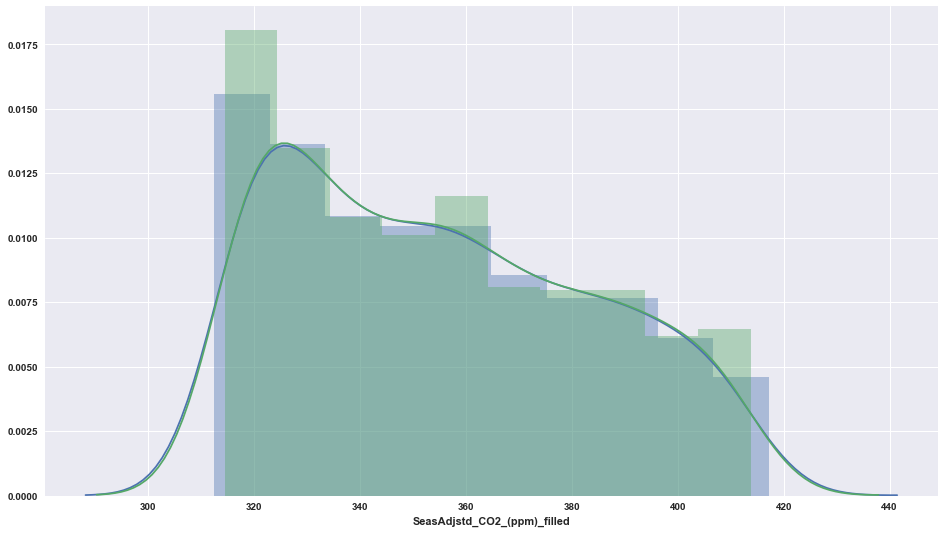

In [168]:
sn.distplot(global_carbon['CO2_(ppm)_filled'])
sn.distplot(global_carbon['SeasAdjstd_CO2_(ppm)_filled'])
#plt.savefig('figures/Carbon/CO2_hist.png') 

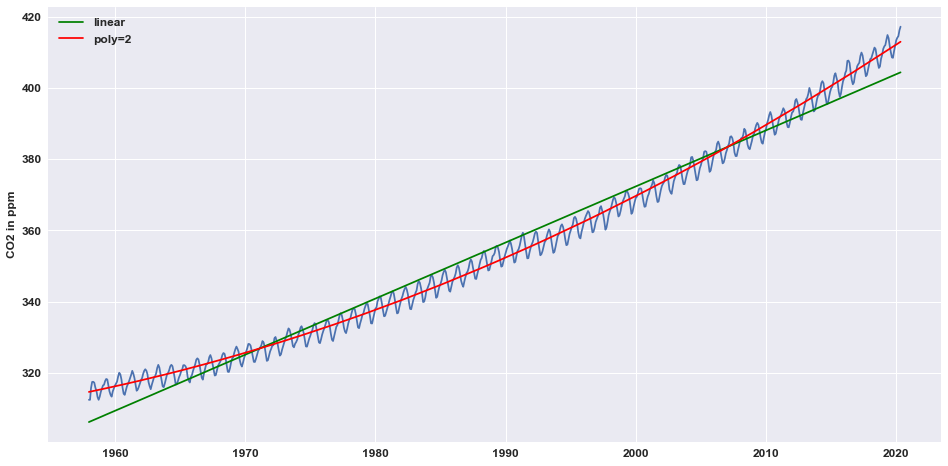

In [169]:
plt.figure(figsize=(16,8))
sn.lineplot(global_carbon.Datetime,global_carbon['CO2_(ppm)_filled'])
lreg1 = np.poly1d(np.polyfit(np.arange(len(global_carbon.Datetime)-2), \
                            global_carbon['CO2_(ppm)_filled'].loc[2:], 1))
sn.lineplot(global_carbon.Datetime, lreg1(np.arange(len(global_carbon.Datetime))),color='g',label='linear');

lreg2 = np.poly1d(np.polyfit(np.arange(len(global_carbon.Datetime)-2), \
                            global_carbon['CO2_(ppm)_filled'].loc[2:], 2))
sn.lineplot(global_carbon.Datetime, lreg2(np.arange(len(global_carbon.Datetime))),color='r',label='poly=2');
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('',fontsize=12)
plt.ylabel('CO2 in ppm',fontsize=12)
plt.legend(fontsize=12);
plt.savefig('figures/Carbon/CO2_ts_with_trend.png') 

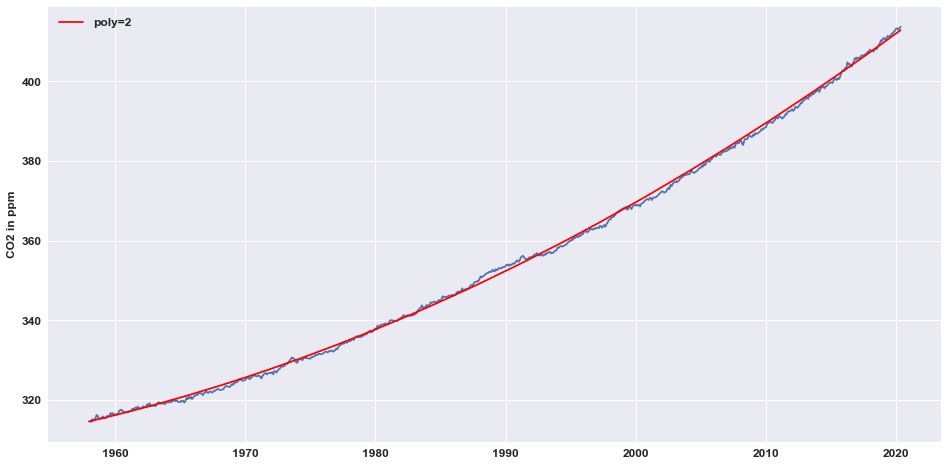

In [170]:
plt.figure(figsize=(16,8))
sn.lineplot(global_carbon.Datetime,global_carbon['SeasAdjstd_CO2_(ppm)_filled'])
lreg2 = np.poly1d(np.polyfit(np.arange(len(global_carbon.Datetime)-2), \
                            global_carbon['SeasAdjstd_CO2_(ppm)_filled'].loc[2:], 2))
sn.lineplot(global_carbon.Datetime, lreg2(np.arange(len(global_carbon.Datetime))),color='r',label='poly=2');
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('',fontsize=12)
plt.ylabel('CO2 in ppm',fontsize=12)
plt.legend(fontsize=12);
#plt.savefig('figures/Carbon/CO2_SeasAdj_ts_with_trend.png') 

(350, 360)

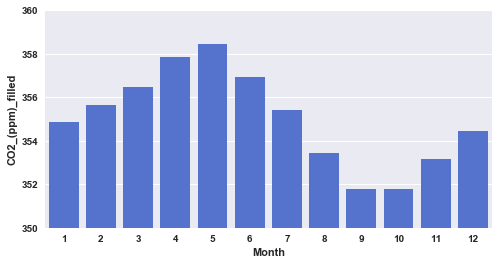

In [171]:
SeasCycleCO2 = global_carbon.groupby('Month').mean()
fig = plt.figure(figsize=(8, 4))

sn.barplot(SeasCycleCO2.index,SeasCycleCO2['CO2_(ppm)_filled'],color='royalblue')
plt.ylim(350,360)
#plt.savefig('figures/Carbon/CO2_Seasonal_cycle_barplot.png') 

**Anomalies**

In [172]:
# create anomalies
start      = pd.to_datetime('1981/1/1')
end        = pd.to_datetime('2010/12/1')
CO2Col     = 'CO2_(ppm)_filled'

CO2Clim          = global_carbon.copy()
CO2Clim['Month'] = pd.to_numeric(CO2Clim['Datetime'].dt.strftime('%m'))
CO2ClimAvg       = CO2Clim.groupby('Month').mean()

nvar = 'CO2_(ppm)_filled_anom'
global_carbon[nvar] = 0
   
for t in range(1,13):
    global_carbon[nvar][global_carbon.Month==t] = global_carbon[CO2Col][global_carbon.Month==t]-CO2ClimAvg[CO2Col][t]


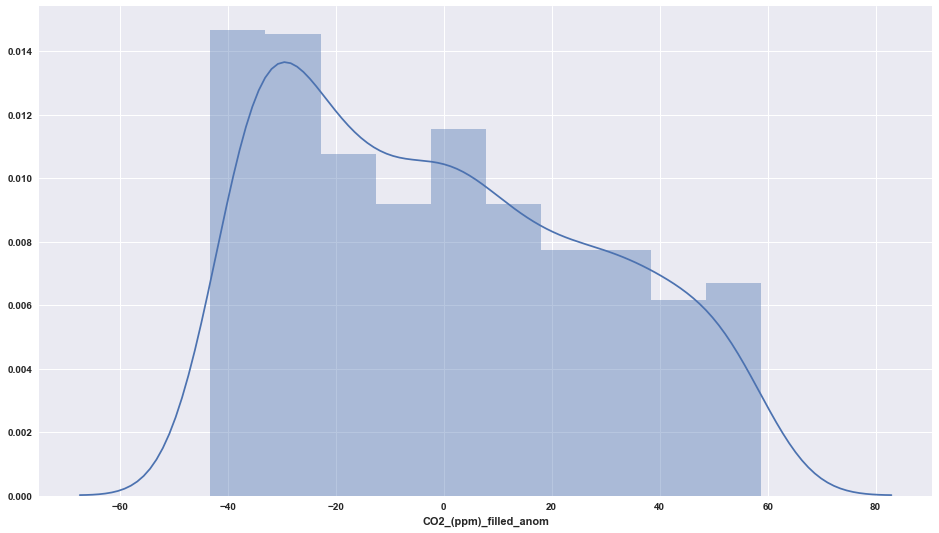

In [173]:
sn.distplot(global_carbon['CO2_(ppm)_filled_anom'])

### Climate indices

In [174]:
clim_indices_Mon.columns

Index(['Year', 'Month', 'Datetime', 'AOI', 'NAO', 'PNA', 'AAO', 'SCAND'], dtype='object')

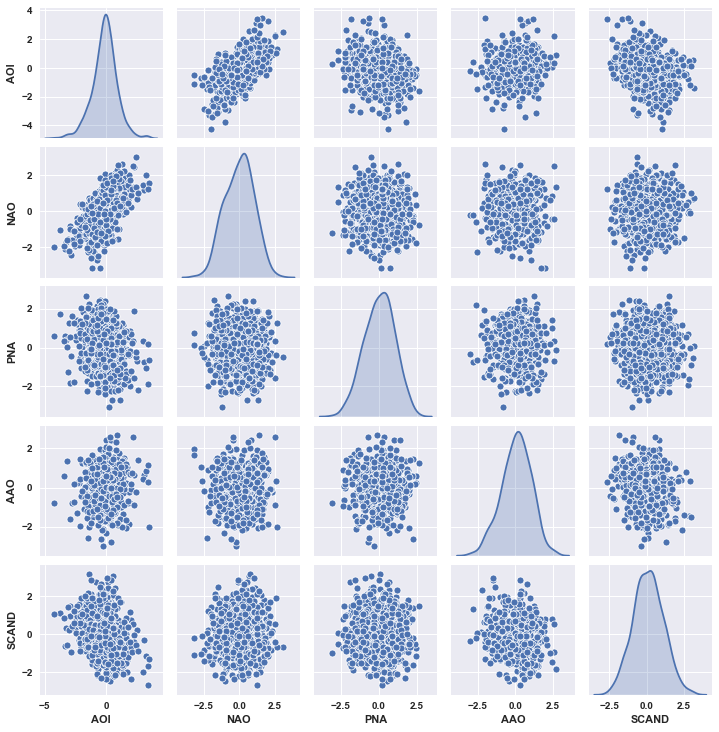

In [175]:
num_cols = [ 'AOI', 'NAO', 'PNA', 'AAO', 'SCAND']
sn.pairplot(clim_indices_Mon.loc[:,num_cols],palette='seismic', diag_kind="kde", height=2)
plt.savefig('figures/Index/Pairplot_AllIndicesMon')

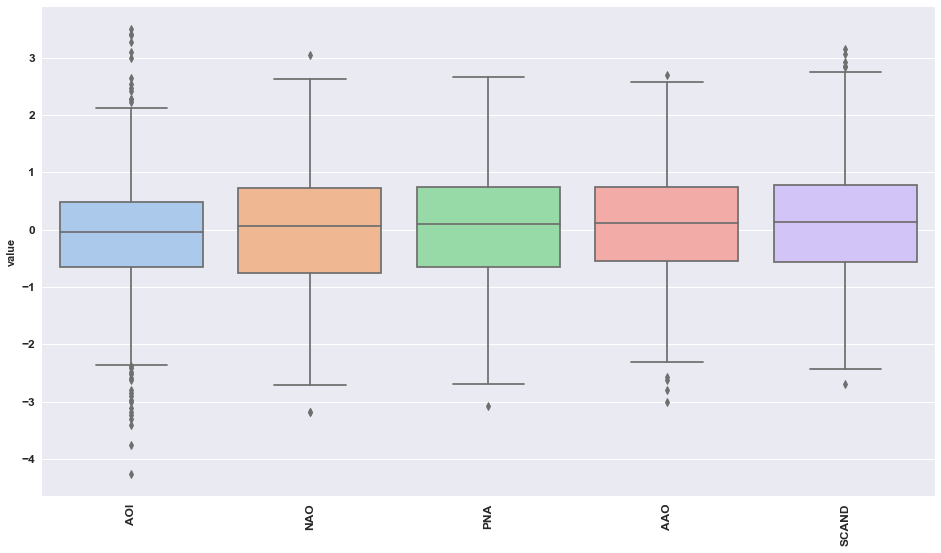

In [176]:
# create a boxplot
clim_indices_Mon_copy = pd.DataFrame.copy(clim_indices_Mon.loc[:,num_cols])

ax = sn.boxplot(x="variable",y="value",palette='pastel',data=pd.melt(clim_indices_Mon_copy))
ax.set_xlabel('')
#ax.set_ylabel('', fontsize=16)
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)
plt.savefig('figures/Index/All_Mon_Indices_boxplot.png')

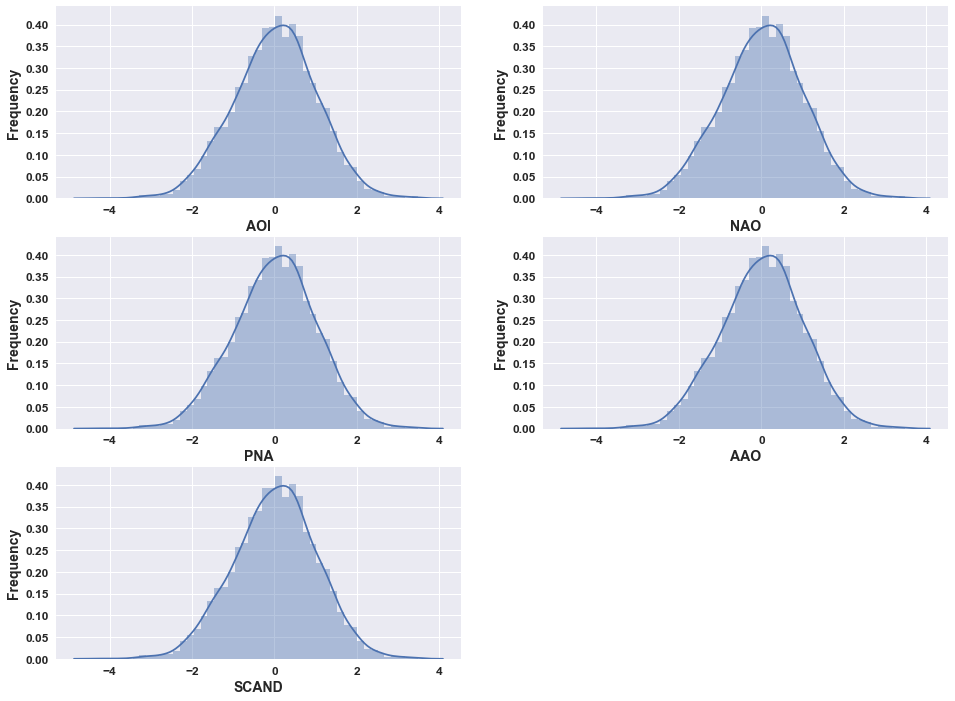

In [177]:
#schöner machen mit sn!
fig = plt.figure(figsize=(16,12))
for i,j in enumerate(num_cols):
    fig.add_subplot(321+i)
    ax = sn.distplot(clim_indices_Mon_copy)
    ax.set_xlabel(j,fontsize=14);
    ax.set_ylabel('Frequency',fontsize=14);
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#plt.savefig('figures/Index/All_Indices_hist.png')

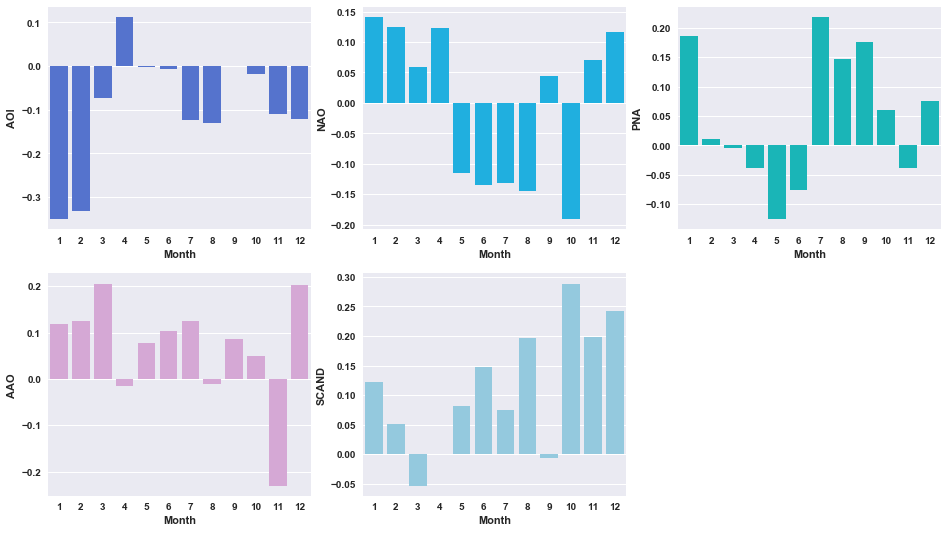

In [178]:
# monthly distribution
fig          = plt.figure(figsize=(16, 9))
color        = ['royalblue','deepskyblue','darkturquoise' ,'plum','skyblue']
SeasCycleInd = clim_indices_Mon.groupby('Month').mean()

for i,j in enumerate(num_cols):
    fig.add_subplot(231+i)
    sn.barplot(SeasCycleInd.index,SeasCycleInd[j],color=color[i])
#plt.savefig('figures/Index/Seasonal_cycle_barplot.png') 

In [179]:
SeasCycleInd

,Year,AOI,NAO,PNA,AAO,SCAND
Month,,,,,,
1,1985.0,-0.349561,0.141625,0.186281,0.119311,0.121408
2,1985.0,-0.332474,0.124135,0.011781,0.125913,0.050563
3,1985.0,-0.071921,0.059064,-0.004446,0.205788,-0.053380
4,1985.0,0.113172,0.122863,-0.037446,-0.016078,0.000282
5,1985.0,-0.002487,-0.114317,-0.124655,0.078517,0.081549
6,1985.0,-0.006559,-0.134501,-0.076499,0.104267,0.147042
7,1985.0,-0.123321,-0.131848,0.218821,0.124065,0.075070
8,1984.5,-0.129073,-0.143985,0.146068,-0.011220,0.197286
9,1984.5,-0.000364,0.044807,0.175158,0.086881,-0.006571


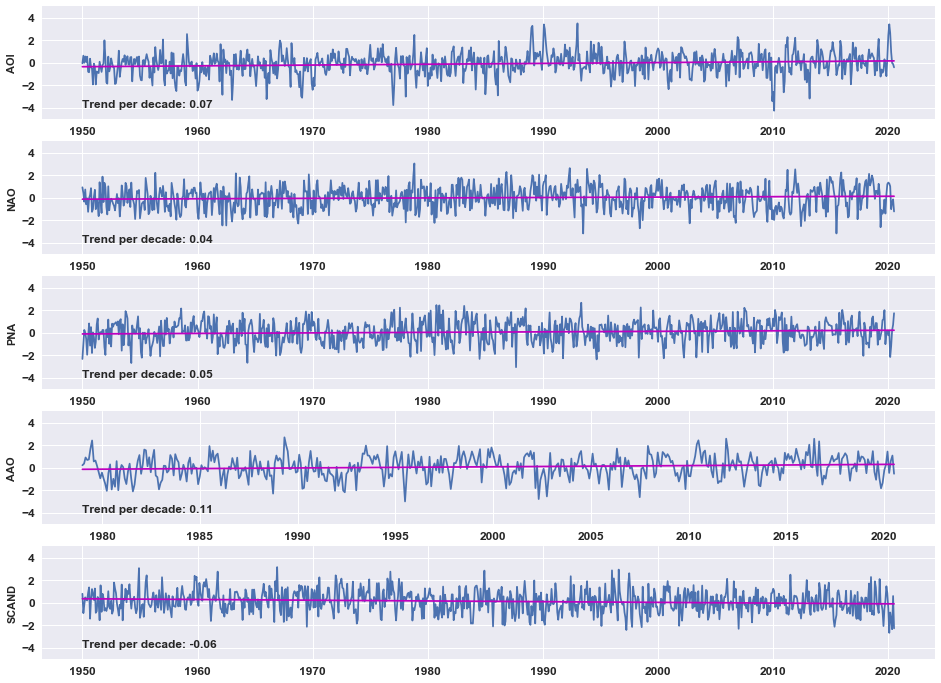

In [180]:
plt.figure(figsize=(16,12))

for i,j in enumerate(num_cols):
    
    if j == 'AAO':
        # acoount for different start year in AAO data
        indexs = clim_indices_Mon[(clim_indices_Mon['Year']==1979)]
        start  = indexs.index[0]
    else:
        start = 0
       
    plt.subplot(511+i)
    ax = sn.lineplot(clim_indices_Mon.Datetime[start:],clim_indices_Mon[j][start:])
    
    # calculate linear trend with poly1d and plot it
    lreg = np.poly1d(np.polyfit(np.arange(len(clim_indices_Mon.Month[start:])), clim_indices_Mon[j][start:], 1))
    sn.lineplot(clim_indices_Mon.Datetime[start:], lreg(np.arange(len(clim_indices_Mon.Month[start:]))),color='m');
        
    # print Trend in sqkm per decade (=>*12*10*1000000) into figure
    txt = 'Trend per decade: ' + str((lreg.c[0]*12*10).round(2))
    plt.text(clim_indices_Mon.Datetime.iloc[start],-4,txt,fontsize=12)
    
    plt.xlabel('')
    plt.xticks(fontsize= 12)
    plt.yticks(fontsize= 12)
    plt.ylim(-5, 5)
    start = 0
    
plt.savefig('figures/Index/All_indices_anom_ts.png')

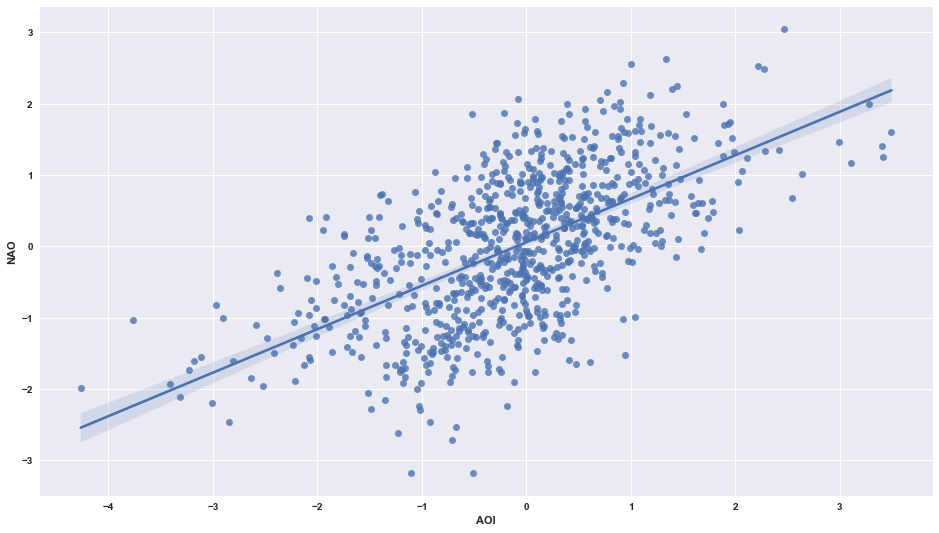

In [181]:
sn.regplot(x='AOI',y = 'NAO', data= clim_indices_Mon)

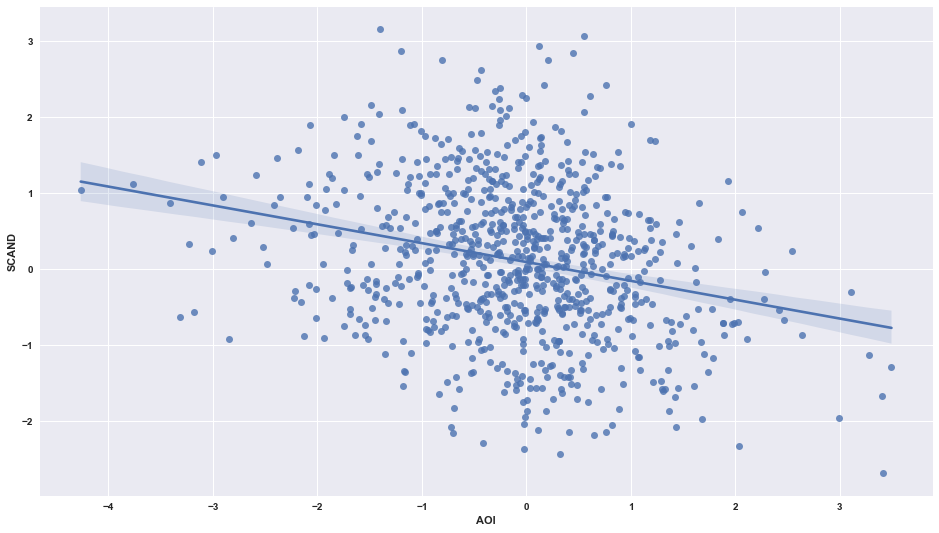

In [182]:
sn.regplot(x='AOI',y = 'SCAND', data= clim_indices_Mon)

### Global temperatures

In [183]:
global_LaOT.columns

Index(['dt', 'Datetime', 'LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp',
       'LandMaxTempSdev', 'LandMinTemp', 'LandMinTempSdev',
       'LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev', 'Month',
       'LandAvgTemp_anom', 'LandAvgTempSdev_anom', 'LandMaxTemp_anom',
       'LandMaxTempSdev_anom', 'LandMinTemp_anom', 'LandMinTempSdev_anom',
       'LandAndOceanAvgTemp_anom', 'LandAndOceanAvgTempSdev_anom'],
      dtype='object')

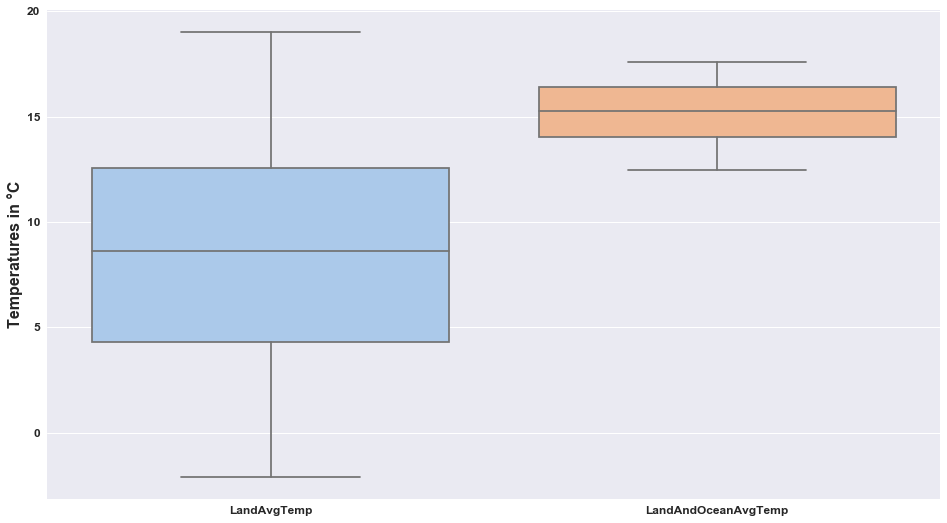

In [184]:
ax = sn.boxplot(x='variable',y='value', palette='pastel',\
                data=pd.melt(global_LaOT[['LandAvgTemp','LandAndOceanAvgTemp']]));#,'OceanTemp_proxy'
ax.set_xlabel('')
ax.set_ylabel('Temperatures in °C',fontsize=16)
plt.xticks(fontsize= 12)
plt.yticks(fontsize= 12)
plt.savefig('figures/MET/Global_LandAndOceanTEmps_boxplot.png')

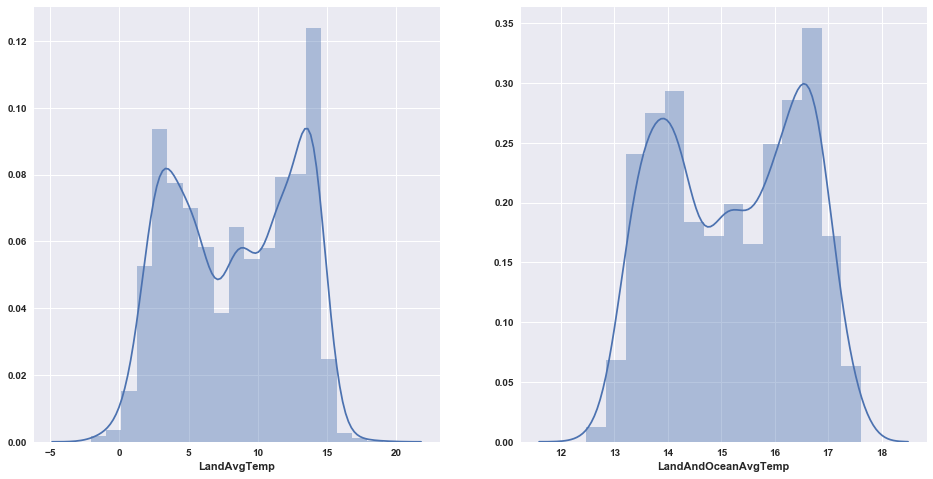

In [185]:
# weiter ausbauen, möchte hier beide Hemispheren übereinander+SIE und ICA nebeneinander!
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
sn.distplot(global_LaOT.LandAvgTemp)
fig.add_subplot(122)
sn.distplot(global_LaOT.LandAndOceanAvgTemp)

plt.savefig('figures/MET/distribution_plots_Global_LandAndOceanTemps.png')

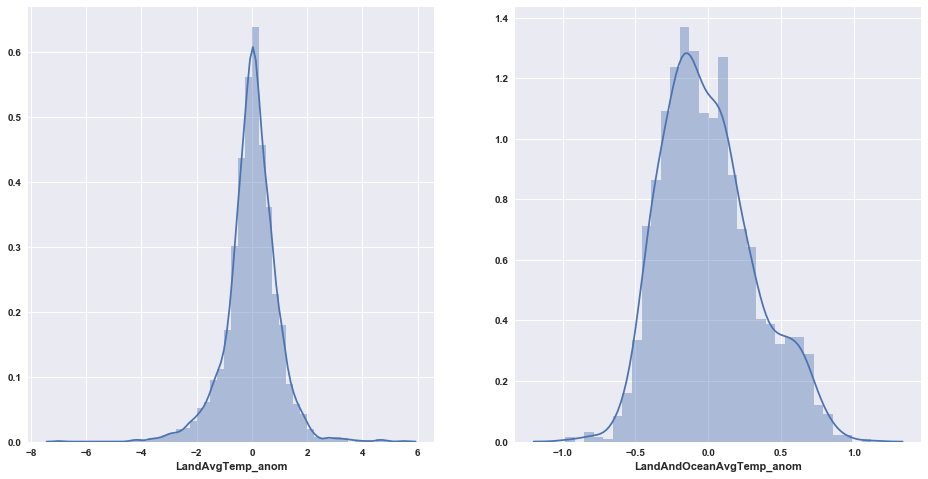

In [186]:
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
sn.distplot(global_LaOT.LandAvgTemp_anom)
fig.add_subplot(122)
sn.distplot(global_LaOT.LandAndOceanAvgTemp_anom)

plt.savefig('figures/MET/distribution_plots_Global_LandAndOceanTemps_anoms.png')

### CMIP5 Model predictions

Text(0.5, 1.0, 'Ice covered area')

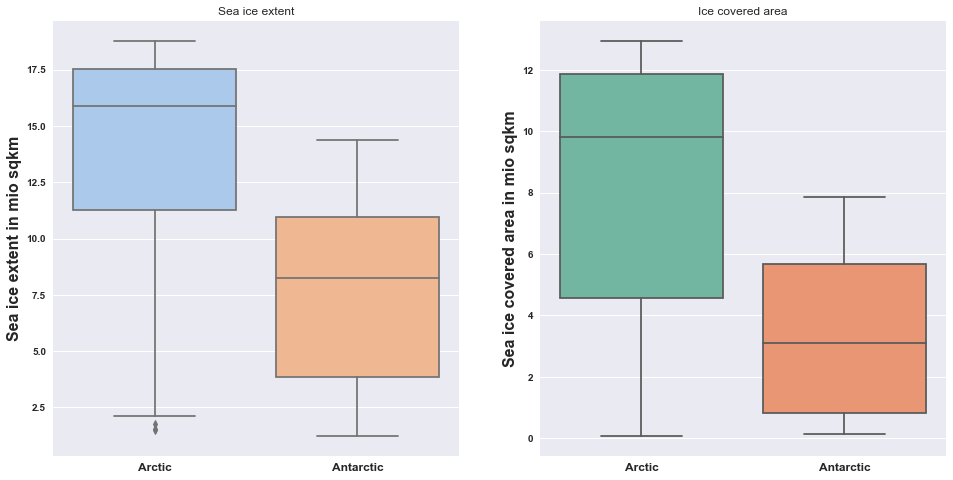

In [187]:
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
ax = sn.boxplot(x='variable',y='value', palette='pastel',\
                data=pd.melt(CMIP5[['RCP26_Extent_N','RCP26_Extent_S']]))

ax.set_xlabel('')
ax.set_ylabel('Sea ice extent in mio sqkm',fontsize=16)
plt.xticks([0,1],['Arctic','Antarctic'],fontsize= 12)
plt.title('Sea ice extent')

fig.add_subplot(122)
ax = sn.boxplot(x='variable',y='value', palette='Set2',\
                data=pd.melt(CMIP5[['RCP26_Area_N','RCP26_Area_S']]))

ax.set_xlabel('')
ax.set_ylabel('Sea ice covered area in mio sqkm',fontsize=16)
plt.xticks([0,1],['Arctic','Antarctic'],fontsize= 12)
plt.title('Ice covered area')

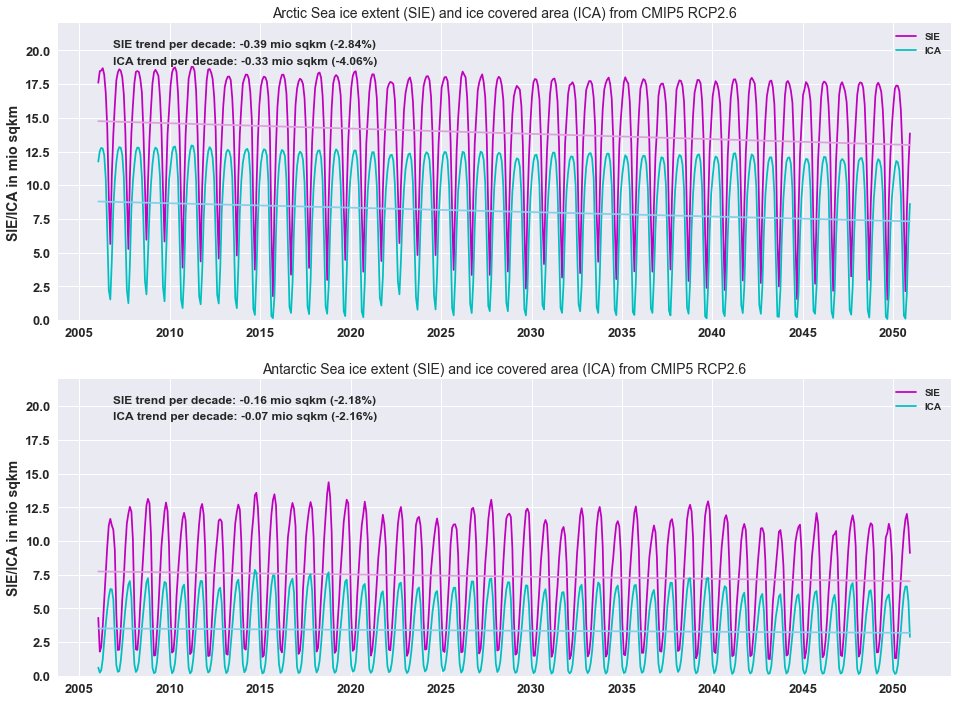

In [188]:
plt.figure(figsize=(16,12))

for i in range(211,213):
    plt.subplot(i)
    if i == 211:
        name1 = 'RCP26_Extent_N'
        name2 = 'RCP26_Area_N'
        titel = 'Arctic Sea ice extent (SIE) and ice covered area (ICA) from CMIP5 RCP2.6'
    else:    
        name1='RCP26_Extent_S'
        name2='RCP26_Area_S'
        titel = 'Antarctic Sea ice extent (SIE) and ice covered area (ICA) from CMIP5 RCP2.6'
        
    plt.plot(CMIP5.Datetime,CMIP5[name1], color = 'm',label='SIE')
    # calculate linear trend with poly1d and plot it
    lreg = np.poly1d(np.polyfit(np.arange(len(CMIP5.Datetime)), CMIP5[name1], 1))
    plt.plot(CMIP5.Datetime, lreg(np.arange(len(CMIP5.Datetime))),color='plum');
    
    # print Trend in sqkm per decade (=>*12*10*1000000) into figure
    txt = 'SIE trend per decade: ' + str((lreg.c[0]*12*10).round(2)) +' mio sqkm ('+ \
            str((lreg.c[0]*12*10/CMIP5[name1].mean()*100).round(2)) +'%)'
    plt.text(CMIP5.Datetime.iloc[10],20.2,txt,fontsize=12)
        
    plt.plot(CMIP5.Datetime,CMIP5[name2], color = 'c',label='ICA')
    lreg = np.poly1d(np.polyfit(np.arange(len(CMIP5.Datetime)), CMIP5[name2], 1))
    plt.plot(CMIP5.Datetime, lreg(np.arange(len(CMIP5.Datetime))),color='skyblue');
    
    # print Trend in sqkm per decade (=>*12*10*1000000) into figure
    txt = 'ICA trend per decade: ' + str((lreg.c[0]*12*10).round(2)) +' mio sqkm ('+ \
             str((lreg.c[0]*12*10/CMIP5[name2].mean()*100).round(2)) +'%)'
    plt.text(CMIP5.Datetime.iloc[10],19,txt,fontsize=12)
    plt.legend()
    
    plt.title(titel,fontsize=14)
    plt.xlabel('')
    plt.ylabel('SIE/ICA in mio sqkm',fontsize=14)
    plt.xticks(fontsize= 13)
    plt.yticks(fontsize= 13)
    plt.ylim(0, 22)


# Feature Engineering
___

## Averaged air temperature, wind and sea level pressure 

In a first attempt, meterological data are averaged over the entire area from 55-90°N for the Arctic and 55-90°S for the Antarctic. However, it may be more reasonable to change these limits to, e.g.,
* 60-90°N as 60° is the (politically) official degree for beginning of polar regions
* 55 or 60°N to ~80°N, as I am mostly interested in the marginal ice zone area
* 55 or 60°S to ~80°S, as I am only interested in Temperature over the Ocean


**Time**

In [189]:
DatetimeNCM = []                           
for i in range(len(timeM)):
    DatetimeNCM.append(dt.date(1800, 1, 1) + dt.timedelta(hours=timeM[i]))


**Air temperature**

In [190]:
#Sea level Pressure medians and means 55°-90°
#for i in range(len())
TairMavg      = TairM.mean(axis=(1,2))
TairMmedian   = np.median(TairM,axis=(1,2))
TairMAAavg    = TairMAA.mean(axis=(1,2))
TairAAmedian  = np.median(TairMAA,axis=(1,2))

**Wind components and wind speed**

In [191]:
# Arctic Wind speed
WNDM   = np.sqrt(UWNDM**2+VWNDM**2)

# Antarctic Wind speed
WNDMAA = np.sqrt(UWNDMAA**2+VWNDMAA**2)
WNDMAA.shape

(870, 15, 144)

In [192]:
print('Wind speeds in the Arctic: \n', WNDM.min(),WNDM.mean(),WNDM.max(),' m/s')
print('Wind speeds in the Antarctic: \n', WNDMAA.min(),WNDMAA.mean(),WNDMAA.max(),' m/s')

Wind speeds in the Arctic: 
 0.0019619938 2.8432171 18.096022  m/s
Wind speeds in the Antarctic: 
 0.0029050766 5.6764717 21.217554  m/s


In [193]:
#meridional medians and means 55°-90°
VWNDMavg      = VWNDM.mean(axis=(1,2))
VWNDMmedian   = np.median(VWNDM,axis=(1,2))
VWNDMAAavg    = VWNDMAA.mean(axis=(1,2))
VWNDMAAmedian = np.median(VWNDMAA,axis=(1,2))

#zonal medians and means 55°-90°
UWNDMavg      = UWNDM.mean(axis=(1,2))
UWNDMmedian   = np.median(UWNDM,axis=(1,2))
UWNDMAAavg    = UWNDMAA.mean(axis=(1,2))
UWNDMAAmedian = np.median(UWNDMAA,axis=(1,2))

#Wind speed medians and means 55°-90°
WNDMavg       = WNDM.mean(axis=(1,2))
WNDMmedian    = np.median(WNDM,axis=(1,2))
WNDMAAavg     = WNDMAA.mean(axis=(1,2))
WNDMAAmedian  = np.median(WNDMAA,axis=(1,2))

**Sea level pressure**

In [194]:
#Sea level Pressure medians and means 55°-90°
SLPavg      = SLPM.mean(axis=(1,2))
SLPmedian   = np.median(SLPM,axis=(1,2))
SLPMAAavg   = SLPMAA.mean(axis=(1,2))
SLPAAmedian = np.median(SLPM,axis=(1,2))

**Merging data into a Frame**

In [195]:
dataMetM = {'Datetime':pd.to_datetime(DatetimeNCM),
            'TairAvgA':TairMavg,'TairMedA':TairMmedian,'TairAvgAA':TairMAAavg,'TairMedAA':TairAAmedian,
            'UWNDavgA':UWNDMavg,'UWNDMedA':UWNDMmedian,'UWNDavgAA':UWNDMAAavg,'UWNDMedAA':UWNDMAAmedian,
            'VWNDavgA':VWNDMavg,'VWNDMedA':VWNDMmedian,'VWNDavgAA':VWNDMAAavg,'VWNDMedAA':VWNDMAAmedian,
            'WNDavgA':WNDMavg,'WNDMedA':WNDMmedian,'WNDavgAA':WNDMAAavg,'WNDMedAA':WNDMAAmedian,
            'SLPavgA':SLPavg,'SLPMedA':SLPmedian,'SLPavgAA':SLPMAAavg,'SLPMedAA':SLPAAmedian}
MetDataM = pd.DataFrame(dataMetM)
MetDataM['Month'] = pd.to_numeric(MetDataM['Datetime'].dt.strftime('%m'))
MetDataM.head()

,Datetime,TairAvgA,TairMedA,TairAvgAA,TairMedAA,UWNDavgA,UWNDMedA,UWNDavgAA,UWNDMedAA,VWNDavgA,...,VWNDMedAA,WNDavgA,WNDMedA,WNDavgAA,WNDMedAA,SLPavgA,SLPMedA,SLPavgAA,SLPMedAA,Month
0,1948-01-01,-24.307953,-30.222258,-5.953207,-1.537252,0.037759,0.121615,0.553742,0.357098,-0.039501,...,-0.029998,3.018137,2.379920,1.859594,1.342643,1012.127441,1014.254456,996.507874,1014.254456,1
1,1948-02-01,-24.201136,-29.507236,-12.764184,-7.215858,1.100910,1.158795,0.006060,-0.100515,0.680843,...,0.410175,3.173003,2.794444,3.502930,3.259789,1012.859497,1011.709351,1005.598816,1011.709351,2
2,1948-03-01,-20.953388,-26.140484,-20.909794,-14.687735,0.978754,0.755486,0.286512,0.721777,0.527388,...,0.257906,2.891818,2.459795,5.220158,4.933241,1009.915833,1009.632874,1011.623169,1009.632874,3
3,1948-04-01,-13.618118,-15.882826,-26.147331,-25.206833,0.515808,0.462002,0.656388,1.080670,0.195292,...,0.290501,2.376216,2.129335,5.973824,5.881996,1014.205322,1014.231689,1011.524658,1014.231689,4
4,1948-05-01,-1.825657,-3.161451,-28.852810,-28.718870,0.017279,0.123389,1.148701,1.461292,-0.042140,...,0.209840,2.066130,2.049531,5.919637,5.885874,1016.405334,1016.331238,1007.011475,1016.331238,5


In [196]:
MetDataM.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 870 entries, 0 to 869
Data columns (total 22 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Datetime   870 non-null    datetime64[ns]
 1   TairAvgA   870 non-null    float32       
 2   TairMedA   870 non-null    float32       
 3   TairAvgAA  870 non-null    float32       
 4   TairMedAA  870 non-null    float32       
 5   UWNDavgA   870 non-null    float32       
 6   UWNDMedA   870 non-null    float32       
 7   UWNDavgAA  870 non-null    float32       
 8   UWNDMedAA  870 non-null    float32       
 9   VWNDavgA   870 non-null    float32       
 10  VWNDMedA   870 non-null    float32       
 11  VWNDavgAA  870 non-null    float32       
 12  VWNDMedAA  870 non-null    float32       
 13  WNDavgA    870 non-null    float32       
 14  WNDMedA    870 non-null    float32       
 15  WNDavgAA   870 non-null    float32       
 16  WNDMedAA   870 non-null    float32       
 1

**Calculate Anomalies**

In [197]:
MetDataM.columns

Index(['Datetime', 'TairAvgA', 'TairMedA', 'TairAvgAA', 'TairMedAA',
       'UWNDavgA', 'UWNDMedA', 'UWNDavgAA', 'UWNDMedAA', 'VWNDavgA',
       'VWNDMedA', 'VWNDavgAA', 'VWNDMedAA', 'WNDavgA', 'WNDMedA', 'WNDavgAA',
       'WNDMedAA', 'SLPavgA', 'SLPMedA', 'SLPavgAA', 'SLPMedAA', 'Month'],
      dtype='object')

In [198]:
# anomalies (substract 1981-2010 average)
start      = pd.to_datetime('1981/1/1')
end        = pd.to_datetime('2010/12/1')
Met_columns = ['TairAvgA', 'TairMedA', 'TairAvgAA', 'TairMedAA','UWNDavgA', 'UWNDMedA', 'UWNDavgAA', \
               'UWNDMedAA', 'VWNDavgA','VWNDMedA', 'VWNDavgAA', 'VWNDMedAA', 'WNDavgA', 'WNDMedA', 'WNDavgAA',\
               'WNDMedAA', 'SLPavgA', 'SLPMedA', 'SLPavgAA', 'SLPMedAA']

MetDataClim          = MetDataM.copy()
MetDataClim['Month'] = pd.to_numeric(MetDataClim['Datetime'].dt.strftime('%m'))
MetDataClimAvg       = MetDataClim.groupby('Month').mean()

for i in Met_columns: 
    nvar = i +'_anom'
    MetDataM[nvar] = 0
    print(i)       
    for t in range(1,13):
        MetDataM[nvar][MetDataM.Month==t] = MetDataM[i][MetDataM.Month==t]-MetDataClimAvg[i][t]


TairAvgA
TairMedA
TairAvgAA
TairMedAA
UWNDavgA
UWNDMedA
UWNDavgAA
UWNDMedAA
VWNDavgA
VWNDMedA
VWNDavgAA
VWNDMedAA
WNDavgA
WNDMedA
WNDavgAA
WNDMedAA
SLPavgA
SLPMedA
SLPavgAA
SLPMedAA


In [199]:
MetDataM.head()

,Datetime,TairAvgA,TairMedA,TairAvgAA,TairMedAA,UWNDavgA,UWNDMedA,UWNDavgAA,UWNDMedAA,VWNDavgA,...,VWNDavgAA_anom,VWNDMedAA_anom,WNDavgA_anom,WNDMedA_anom,WNDavgAA_anom,WNDMedAA_anom,SLPavgA_anom,SLPMedA_anom,SLPavgAA_anom,SLPMedAA_anom
0,1948-01-01,-24.307953,-30.222258,-5.953207,-1.537252,0.037759,0.121615,0.553742,0.357098,-0.039501,...,-0.093913,-0.048639,-0.593380,-0.788636,-1.623948,-1.776546,-1.251770,0.506165,2.449219,0.506165
1,1948-02-01,-24.201136,-29.507236,-12.764184,-7.215858,1.100910,1.158795,0.006060,-0.100515,0.680843,...,0.147646,0.264144,-0.370924,-0.322867,-1.446342,-1.421690,-1.386230,-2.754395,7.294556,-2.754395
2,1948-03-01,-20.953388,-26.140484,-20.909794,-14.687735,0.978754,0.755486,0.286512,0.721777,0.527388,...,-0.007338,-0.046816,-0.309652,-0.397682,-0.919744,-1.036861,-5.090332,-5.765076,8.528076,-5.765076
3,1948-04-01,-13.618118,-15.882826,-26.147331,-25.206833,0.515808,0.462002,0.656388,1.080670,0.195292,...,-0.123758,-0.203375,-0.262247,-0.264175,-0.615966,-0.508175,-1.534424,-1.922974,5.244873,-1.922974
4,1948-05-01,-1.825657,-3.161451,-28.852810,-28.718870,0.017279,0.123389,1.148701,1.461292,-0.042140,...,-0.413889,-0.502609,-0.060671,0.080457,-0.612597,-0.322270,0.906189,0.400513,-0.894836,0.400513


In [200]:
MetDataM.describe()

,TairAvgA,TairMedA,TairAvgAA,TairMedAA,UWNDavgA,UWNDMedA,UWNDavgAA,UWNDMedAA,VWNDavgA,VWNDMedA,...,VWNDavgAA_anom,VWNDMedAA_anom,WNDavgA_anom,WNDMedA_anom,WNDavgAA_anom,WNDMedAA_anom,SLPavgA_anom,SLPMedA_anom,SLPavgAA_anom,SLPMedAA_anom
count,870.000000,870.000000,870.000000,870.000000,870.000000,870.000000,870.000000,870.000000,870.000000,870.000000,...,8.700000e+02,870.000000,8.700000e+02,8.700000e+02,870.000000,8.700000e+02,870.000000,870.000000,870.000000,870.000000
mean,-9.548238,-12.456474,-21.368803,-18.933069,0.267652,0.302876,0.503228,0.686363,0.046002,0.133612,...,-5.480887e-10,0.000000,2.850061e-08,-8.769419e-09,0.000000,-7.015535e-08,-0.000002,0.000005,-0.000002,0.000005
std,10.872470,12.046623,8.439397,10.599417,0.560132,0.571056,0.634618,0.663007,0.309192,0.346684,...,2.286600e-01,0.364890,3.990833e-01,4.751254e-01,0.687866,7.505033e-01,2.852396,3.252358,4.481618,3.252358
min,-28.044123,-33.074280,-34.885227,-36.662899,-1.352115,-1.375805,-1.663506,-1.799165,-0.923321,-0.705499,...,-8.500425e-01,-1.171642,-9.731925e-01,-1.249230e+00,-1.808832,-1.776546e+00,-10.430237,-11.739380,-12.236938,-11.739380
25%,-20.053864,-24.221746,-28.551820,-28.071453,-0.123997,-0.107458,0.075378,0.256307,-0.171207,-0.116278,...,-1.449722e-01,-0.237888,-2.810273e-01,-3.413191e-01,-0.512907,-5.077512e-01,-1.682312,-1.934296,-3.114380,-1.934296
50%,-11.345180,-13.136124,-23.615740,-22.381579,0.282692,0.317801,0.506533,0.692825,0.042443,0.115808,...,-3.815594e-03,0.011558,-2.808070e-02,-3.034115e-02,-0.008920,-2.807415e-02,-0.019867,-0.039154,-0.322876,-0.039154
75%,1.438606,0.742085,-13.495467,-8.142211,0.668954,0.682433,0.952621,1.112300,0.250291,0.365245,...,1.518299e-01,0.244931,2.650548e-01,2.922130e-01,0.479376,4.918429e-01,1.649933,1.947281,2.800247,1.947281
max,7.476805,5.220167,-5.183101,-0.938867,2.011552,2.220335,2.344576,2.826293,1.180487,1.292340,...,7.166386e-01,1.198680,1.815248e+00,2.010954e+00,2.047205,2.439967e+00,9.714783,12.098511,17.768433,12.098511


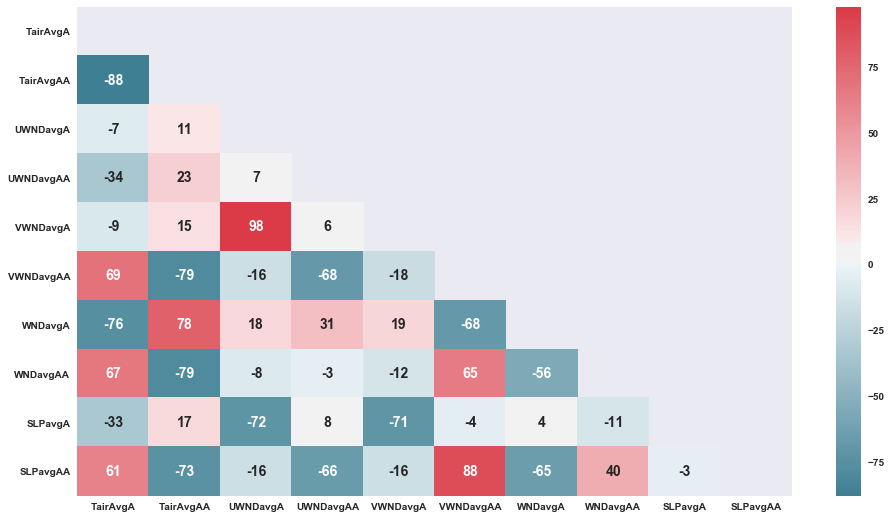

In [201]:
# correlelogramm
cols  = ['TairAvgA',  'TairAvgAA', 'UWNDavgA',  'UWNDavgAA',  'VWNDavgA','VWNDavgAA',  'WNDavgA', 'WNDavgAA',
        'SLPavgA',  'SLPavgAA']
cmap  = sn.diverging_palette(220, 10, as_cmap=True) 
X_dum = pd.get_dummies(MetDataM[cols]).copy()
mask  = np.triu(X_dum.corr()) 
ax    = sn.heatmap(round(X_dum.corr()*100,0),
                  annot = True,
                  mask  = mask,
                  cmap  = cmap)
#ax.set_ylim((0,17))
plt.savefig('figures/MET/MET_Data_correlelogramm_avg.png')

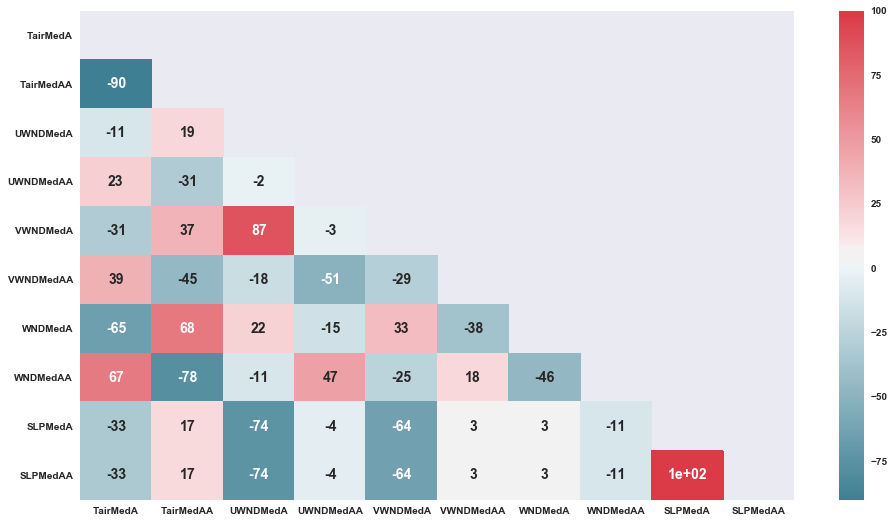

In [202]:
# correlelogramm
cols  = ['TairMedA',  'TairMedAA', 'UWNDMedA',  'UWNDMedAA',  'VWNDMedA','VWNDMedAA',  'WNDMedA', 'WNDMedAA',
        'SLPMedA',  'SLPMedAA']

X_dum = pd.get_dummies(MetDataM[cols]).copy()
mask  = np.triu(X_dum.corr()) 
ax    = sn.heatmap(round(X_dum.corr()*100,0),
                  annot = True,
                  mask  = mask,
                  cmap  = cmap)
#ax.set_ylim((0,17))
#plt.savefig('figures/MET/MET_Data_correlelogramm_median.png')

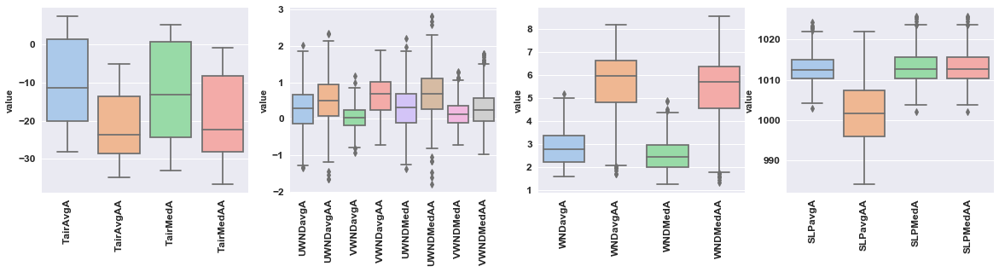

In [203]:
# create a boxplot
num_cols = [['TairAvgA',  'TairAvgAA','TairMedA','TairMedAA'],\
            ['UWNDavgA',  'UWNDavgAA',  'VWNDavgA','VWNDavgAA', \
             'UWNDMedA',  'UWNDMedAA',  'VWNDMedA','VWNDMedAA'], \
            ['WNDavgA', 'WNDavgAA', 'WNDMedA', 'WNDMedAA'],\
            ['SLPavgA',  'SLPavgAA','SLPMedA',  'SLPMedAA']]
plt.figure(figsize=(20,4))
for i,j in enumerate(num_cols):
    plt.subplot(1,4,i+1)
    ax = sn.boxplot(x="variable",y="value",palette='pastel',data=pd.melt(MetDataM[j]))
    ax.set_xlabel('')
    #ax.set_ylabel('', fontsize=16)
    plt.xticks(fontsize=12,rotation=90)
    plt.yticks(fontsize=12)
plt.savefig('figures/MET/All_Vars_boxplot.png')

In [204]:
# seasonal cycle of averaged data north, south
# how to group by month without having column month (out of datetime)

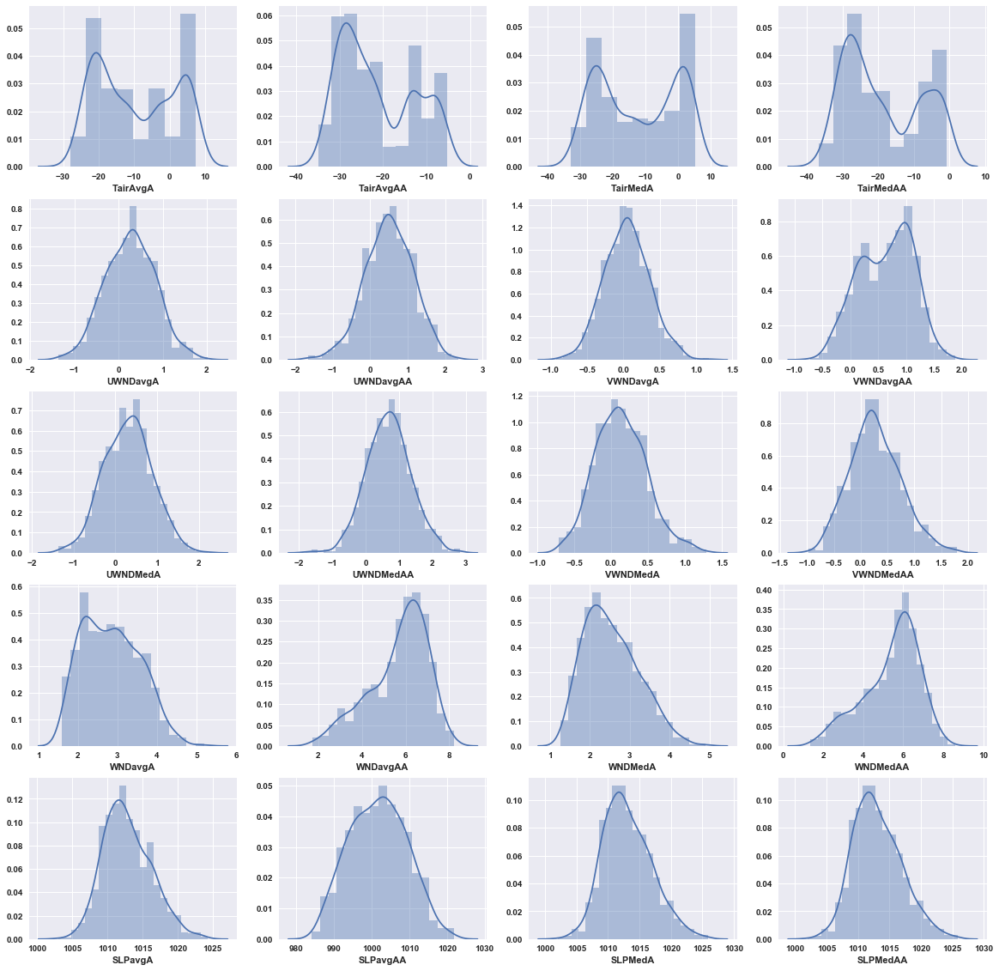

In [205]:
#Histogram in 
nums_col = [y for x in num_cols for y in x]

plt.figure(figsize=(20,20))
var_trend = []
for i,j in enumerate(nums_col):
    plt.subplot(5,4,i+1)
    #plt.hist(MetDataM[j])
    sn.distplot(MetDataM[j])
    plt.xlabel(j)
    
    lreg = np.poly1d(np.polyfit(np.arange(len(MetDataM[j])), MetDataM[j], 1))
  #  txt  = 'SIE trend per decade: ' + str((lreg.c[0]*12*10).round(1)) +' sqkm ('+ \
            #  str((lreg.c[0]*12*10/df_sie_4km_Mon[j].mean()*100).round(2)) +'%)'
    var_trend.append(lreg.c[0]*12*10)
    
#plt.savefig('figures/MET/Met_hist_all.png')

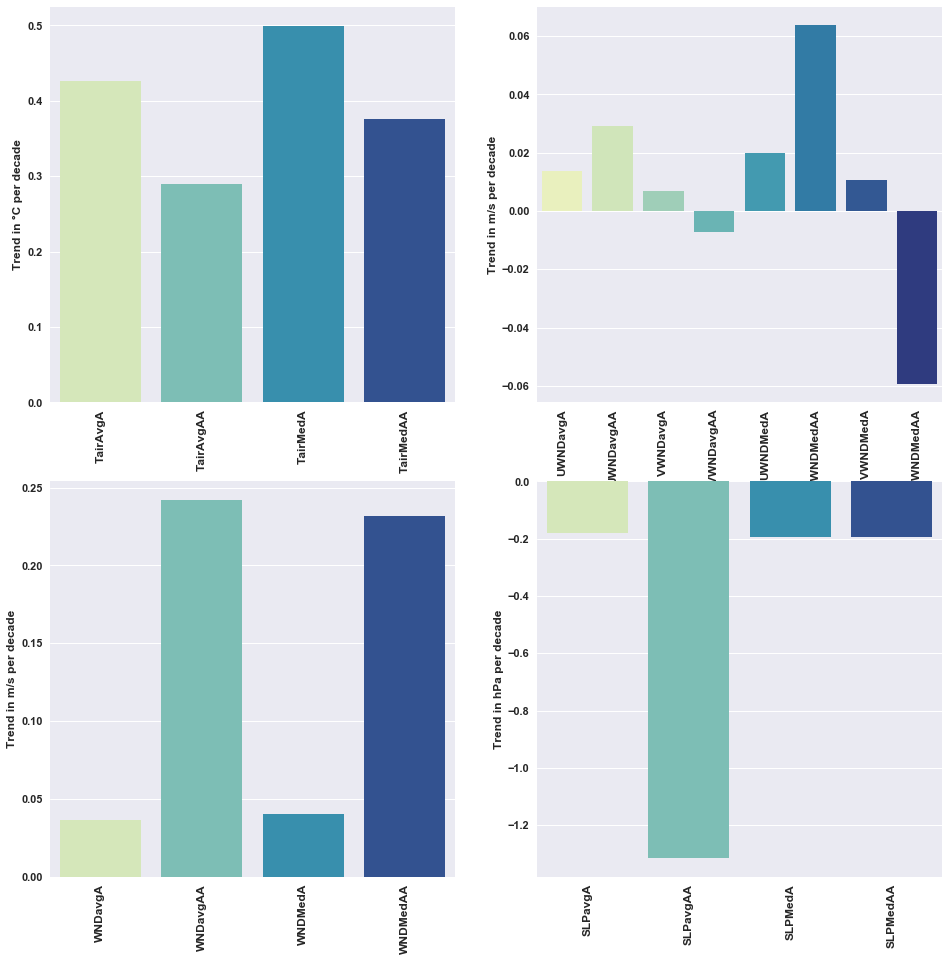

In [206]:
# Trend in percent
plt.figure(figsize=(16,16))
pos1 = 0
pos2 = 0
unit = ['°C','m/s','m/s','hPa']
for i,j in enumerate(num_cols):
    
    plt.subplot(2,2,i+1)
    pos2 += len(j)
    sn.barplot(j,var_trend[pos1:pos2],palette='YlGnBu') 
    pos1 += len(j)
    plt.xticks(rotation=90,fontsize=12);
    plt.yticks(fontsize=11);
    plt.ylabel('Trend in '+ unit[i]+ ' per decade',fontsize=12);
    plt.savefig('figures/MET/Met_allTrends_percent.png')

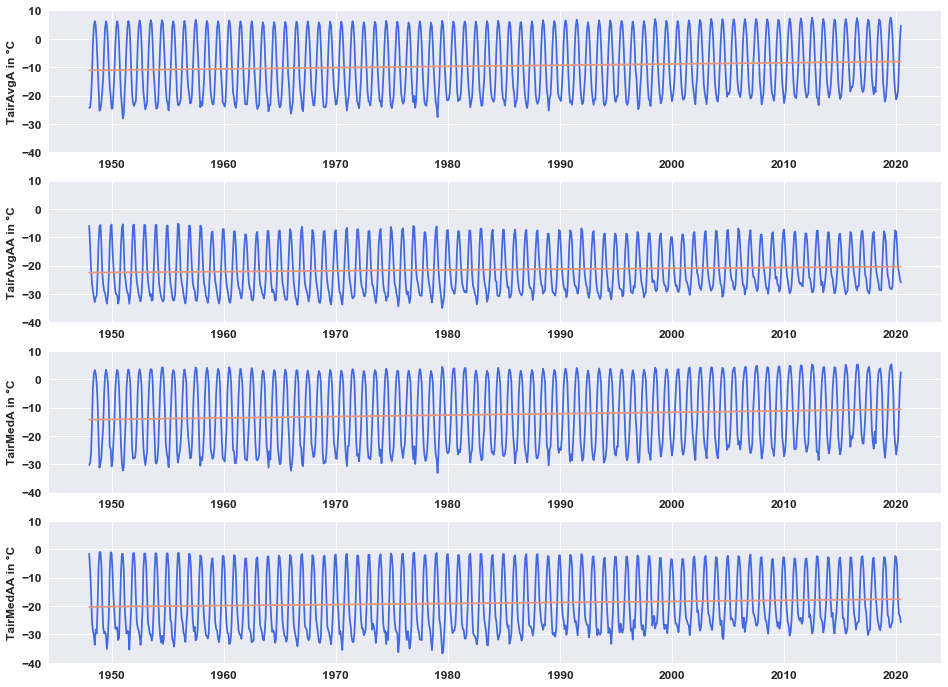

In [207]:
#plot air Temperature time series
plt.figure(figsize=(16,12))
for i,j in enumerate(num_cols[0]):
    plt.subplot(4,1,i+1)
    sn.lineplot(MetDataM.Datetime,MetDataM[j], color = 'royalblue')
    lreg = np.poly1d(np.polyfit(np.arange(len(MetDataM[j])), MetDataM[j], 1))
    sn.lineplot(MetDataM.Datetime, lreg(np.arange(len(MetDataM[j]))),color='darksalmon');
    plt.xlabel('')
    plt.ylabel(j+' in °C',fontsize=12)
    plt.xticks(fontsize= 12)
    plt.yticks(fontsize= 12)
    plt.ylim(-40, 10)
    #plt.savefig('figures/MET/Met_allSeasCycle_Trends_ts.png')

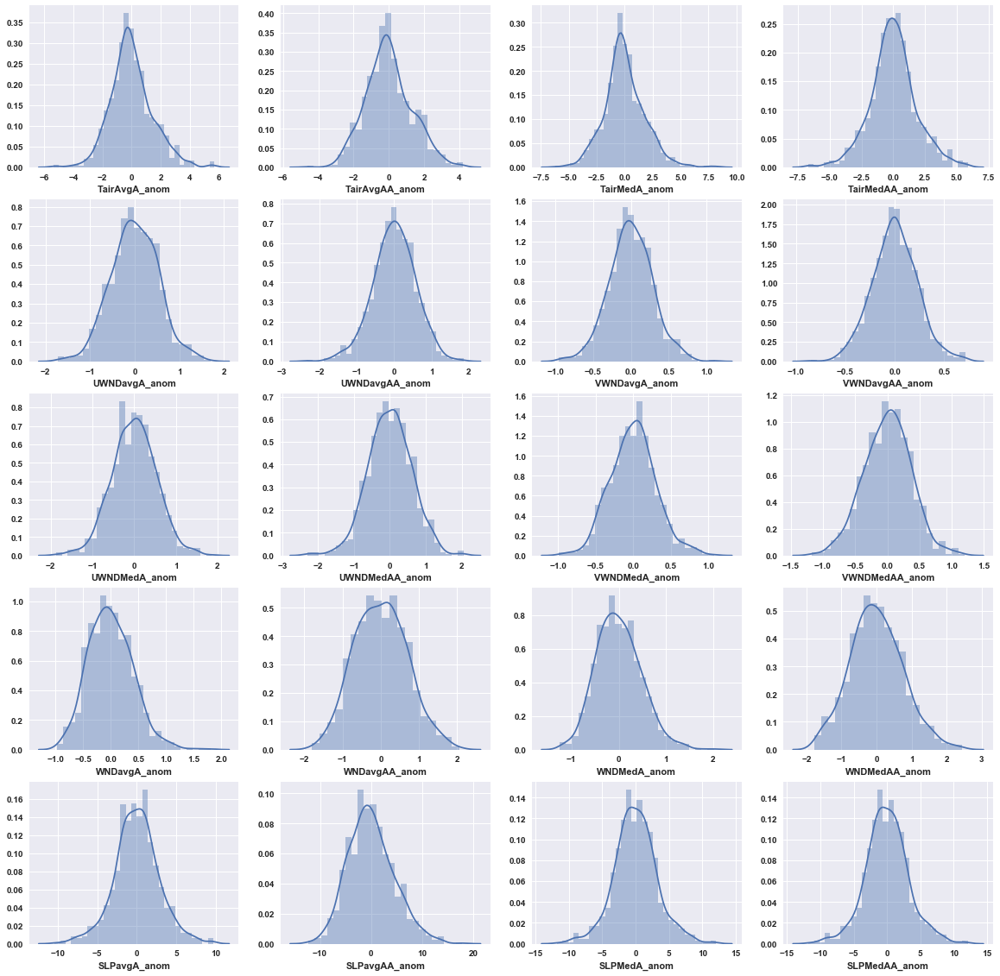

In [208]:
#Histogram in mio sqkm
num_cols = [['TairAvgA_anom',  'TairAvgAA_anom','TairMedA_anom','TairMedAA_anom'],\
            ['UWNDavgA_anom',  'UWNDavgAA_anom',  'VWNDavgA_anom','VWNDavgAA_anom', \
             'UWNDMedA_anom',  'UWNDMedAA_anom',  'VWNDMedA_anom','VWNDMedAA_anom'], \
            ['WNDavgA_anom', 'WNDavgAA_anom', 'WNDMedA_anom', 'WNDMedAA_anom'],\
            ['SLPavgA_anom',  'SLPavgAA_anom','SLPMedA_anom',  'SLPMedAA_anom']]
nums_col = [y for x in num_cols for y in x]

plt.figure(figsize=(20,20))
var_trend = []
for i,j in enumerate(nums_col):
    plt.subplot(5,4,i+1)
    #plt.hist(MetDataM[j])
    sn.distplot(MetDataM[j])
    plt.xlabel(j)
    
    lreg = np.poly1d(np.polyfit(np.arange(len(MetDataM[j])), MetDataM[j], 1))
  #  txt  = 'SIE trend per decade: ' + str((lreg.c[0]*12*10).round(1)) +' sqkm ('+ \
            #  str((lreg.c[0]*12*10/df_sie_4km_Mon[j].mean()*100).round(2)) +'%)'
    var_trend.append(lreg.c[0]*12*10)
    
#plt.savefig('figures/MET/Met_hist_all_anoms.png')

**Summary:**
* Overall mean and median air temperatures are increasing in both hemispheres
* Arctic temperature increase is stronger than Antarctic increase
* Wind speeds increases in both hemispheres
* Wind speed in southern hemisphere has stronger increase than those in northern hemisphere
* zonal wind increases in both hemispheres => stronger westerly winds
* meridional wind increases in northern => stronger northward wind
* meridional wind decreases in southern hemisphere => stronger southward wind
* Sea level pressure shows slightly negative trend

## Season

In [209]:
# add season: s,f,w,sp
seasNH = {1:'w',2:'w',3:'w',
          4:'sp',5:'sp',6:'sp',
          7:'s',8:'s',9:'s',
          10:'f',11:'f',12:'f'}

seasSH = {7:'w',8:'w',9:'w',
          10:'sp',11:'sp',
          12:'s',1:'s',2:'s',
          3:'f',4:'f',5:'f',6:'f',}

SIE_Mon['Season_N'] = [seasNH.get(SIE_Mon.Month[i]) for i in range(len(SIE_Mon.Month))]
SIE_Mon['Season_S'] = [seasSH.get(SIE_Mon.Month[i]) for i in range(len(SIE_Mon.Month))]

## Time lags

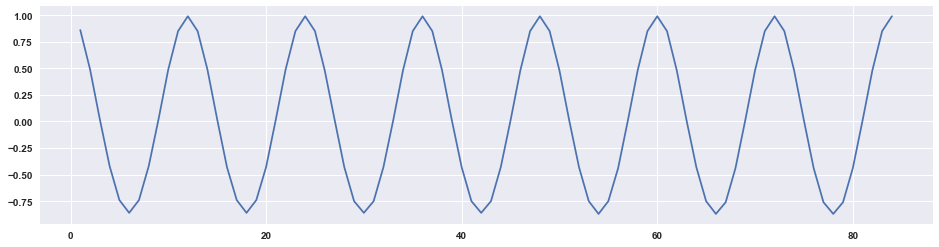

In [210]:
# add area and southern hemisphere

lags = 12*7   # 12 month * 7 years
var  = 'Extent_N'
df   = SIE_Mon.copy()
corrShift = []

for i in range(1,lags+1):
    label = 'lag_' + str(i)
    df[label] = SIE_Mon[var].shift(i)
    corrShift.append(df[label].corr(SIE_Mon[var]).round(2))

plt.figure(figsize=(16,4))    
plt.plot(range(1,lags+1),corrShift)
#df.tail()

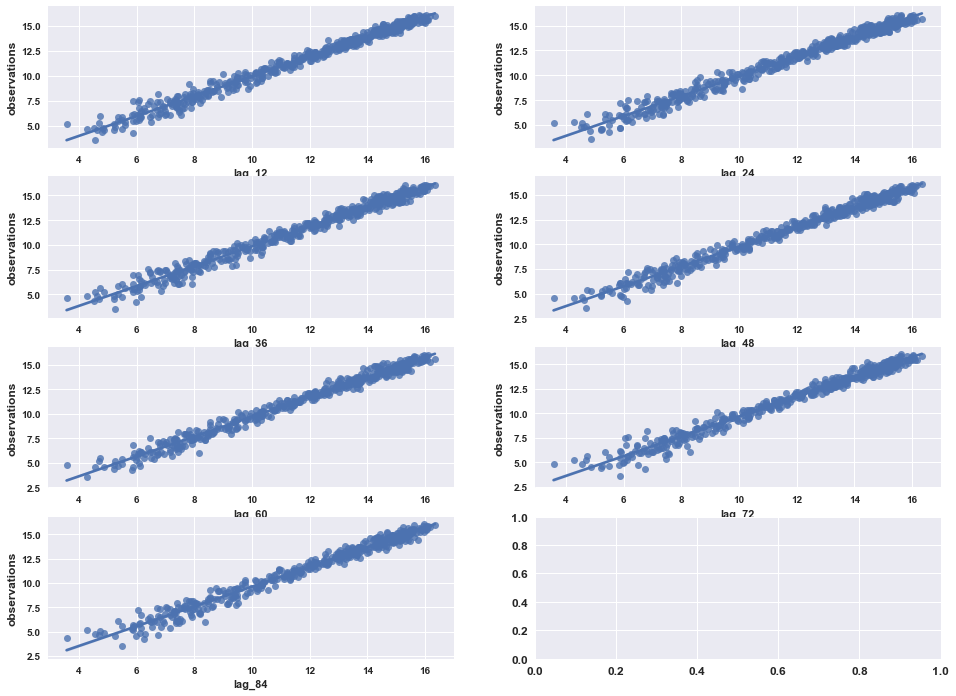

In [211]:
fix,axes = plt.subplots(4,2,figsize=(16,12))

for i,j in enumerate(range(12,lags+1,12)):
    label = 'lag_' + str(j)
    ax = sn.regplot(x=df[label],y=SIE_Mon[var],ax=axes.flatten()[i])
    ax.set_xlabel(label)
    ax.set_ylabel('observations',fontsize=12)
    ax.set_title('')
    plt.xticks(fontsize= 12)
    plt.yticks(fontsize= 12)
    #sn.regplot(x='Extent_N', y='Extent_S', data=SIE_Mon,label='Extent')

In [212]:
SIE_Mon['SIE_lag1'] = df.lag_1
SIE_Mon['SIE_lag12'] = df.lag_12
SIE_Mon['SIE_lag24'] = df.lag_24
SIE_Mon['SIE_lag36'] = df.lag_36
SIE_Mon['SIE_lag72'] = df.lag_72
SIE_Mon['SIE_lag84'] = df.lag_84

In [213]:
(SIE_Mon['Extent_N']-SIE_Mon['SIE_lag12']).describe()

count    489.000000
mean      -0.052781
std        0.436919
min       -1.590000
25%       -0.320000
50%       -0.060000
75%        0.210000
max        1.640000
dtype: float64

## Moving average

In [214]:
# 2. create moving average
width = 3
lag1 = SIE_Mon['Extent_N'].shift(1)
lag3 = SIE_A_Mon['Extent_N'].shift(width-1) #???
window = lag3.rolling(window=width)
means = window.mean()
#page80

## Merging all monthly data

In [215]:
# Use for met data averages (using median values may be tested later)

In [216]:
# define start and end time of common data frame
start = tsdates['Climate Indices - AAO'][0]
end   = tsdates['Global Land-Ocean Temp'][1]

In [217]:
print('start: ', start)
print('end: ', end)

start:  1979-01-01 00:00:00
end:  2015-12-01 00:00:00


In [218]:
global_LaOT.columns

Index(['dt', 'Datetime', 'LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp',
       'LandMaxTempSdev', 'LandMinTemp', 'LandMinTempSdev',
       'LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev', 'Month',
       'LandAvgTemp_anom', 'LandAvgTempSdev_anom', 'LandMaxTemp_anom',
       'LandMaxTempSdev_anom', 'LandMinTemp_anom', 'LandMinTempSdev_anom',
       'LandAndOceanAvgTemp_anom', 'LandAndOceanAvgTempSdev_anom'],
      dtype='object')

### 25 km resolution data

#### Arctic
**Data including trend and seasonal cycle**

In [219]:
# Arctic variables, keep ts for the moment
Arctic_SIE     = ['Datetime','Month','year','Extent_N', 'Area_N']
Arctic_Indices = ['Datetime','AOI', 'NAO', 'PNA', 'SCAND']
Arctic_Met     = ['Datetime','TairAvgA','UWNDavgA', 'VWNDavgA','WNDavgA','SLPavgA']
Arctic_Met_median = ['Datetime','TairMedA', 'UWNDMedA','VWNDMedA','WNDMedA','SLPMedA']
Global_Temps   = ['Datetime', 'LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp','LandMaxTempSdev', \
                  'LandMinTemp','LandMinTempSdev','LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev']

In [220]:
# Merge Arctic and global data into one data frame
df0 = SIE_Mon[Arctic_SIE].loc[(SIE_Mon.Datetime>=start)&(SIE_Mon.Datetime<=end)]
df1 = global_carbon[['Year', 'Month', 'Datetime','CO2_(ppm)_filled']].loc[(global_carbon.Datetime>=start)&(global_carbon.Datetime<=end)]
df2 = clim_indices_Mon[Arctic_Indices].loc[(clim_indices_Mon.Datetime>=start)&(clim_indices_Mon.Datetime<=end)]
df3 = global_LaOT[Global_Temps].loc[(global_LaOT.Datetime>=start)&(global_LaOT.Datetime<=end)]
df4 = MetDataM[Arctic_Met].loc[(MetDataM.Datetime>=start)&(MetDataM.Datetime<=end)]
dfs25A = [df0,df4, df1, df2, df3]
df25A  = reduce(lambda left,right: pd.merge(left,right,how='outer',on='Datetime'), dfs25A)
df25A.head()

,Datetime,Month_x,year,Extent_N,Area_N,TairAvgA,UWNDavgA,VWNDavgA,WNDavgA,SLPavgA,...,PNA,SCAND,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev
0,1979-01-01,1,1979,15.41,12.41,-24.072439,-0.251774,-0.250840,2.791999,1018.222229,...,-0.69,0.53,2.679,0.083,8.071,0.125,-2.625,0.100,13.630,0.048
1,1979-02-01,2,1979,16.18,13.18,-27.585587,0.175868,0.081880,2.790222,1016.234497,...,-1.82,0.19,2.841,0.089,8.525,0.076,-2.759,0.147,13.768,0.047
2,1979-03-01,3,1979,16.34,13.21,-20.623926,-0.674127,-0.516901,4.451401,1019.253906,...,0.38,0.75,5.474,0.102,11.331,0.187,-0.129,0.272,14.565,0.051
3,1979-04-01,4,1979,15.45,12.53,-14.537789,-0.297129,-0.405142,2.125489,1021.269104,...,0.09,0.22,8.455,0.078,14.273,0.258,2.623,0.303,15.391,0.046
4,1979-05-01,5,1979,13.86,11.11,-4.110590,-0.555199,-0.360322,2.394206,1016.774292,...,1.35,-0.38,11.199,0.149,17.139,0.198,5.712,0.212,16.076,0.058


In [221]:
drop_cols = ['Year','Month_y']
df25A.drop(drop_cols,inplace=True,axis=1)
df25A.tail()

,Datetime,Month_x,year,Extent_N,Area_N,TairAvgA,UWNDavgA,VWNDavgA,WNDavgA,SLPavgA,...,PNA,SCAND,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev
439,2015-08-01,8,2015,5.60,3.63,5.362584,-0.305651,-0.252461,2.138165,1013.876038,...,0.078863,0.87,14.755,0.072,20.699,0.110,9.005,0.170,17.589,0.057
440,2015-09-01,9,2015,4.62,3.42,0.391969,1.028248,0.345252,2.234752,1010.954163,...,-0.918130,1.09,12.999,0.079,18.845,0.088,7.199,0.229,17.049,0.058
441,2015-10-01,10,2015,6.97,5.49,-6.413876,0.669057,0.260425,2.635985,1010.220398,...,1.775000,0.62,10.801,0.102,16.450,0.059,5.232,0.115,16.290,0.062
442,2015-11-01,11,2015,9.85,8.48,-13.761205,1.128499,0.467782,3.420283,1009.005066,...,-0.192740,-0.40,7.433,0.119,12.892,0.093,2.157,0.106,15.252,0.063
443,2015-12-01,12,2015,12.04,10.64,-18.569761,0.185454,0.001824,3.826658,1008.679382,...,0.777120,0.08,5.518,0.100,10.725,0.154,0.287,0.099,14.774,0.062


In [222]:
df25A.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444 entries, 0 to 443
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Datetime                 444 non-null    datetime64[ns]
 1   Month_x                  444 non-null    int64         
 2   year                     444 non-null    int64         
 3   Extent_N                 444 non-null    float64       
 4   Area_N                   444 non-null    float64       
 5   TairAvgA                 444 non-null    float32       
 6   UWNDavgA                 444 non-null    float32       
 7   VWNDavgA                 444 non-null    float32       
 8   WNDavgA                  444 non-null    float32       
 9   SLPavgA                  444 non-null    float32       
 10  CO2_(ppm)_filled         444 non-null    float64       
 11  AOI                      444 non-null    float64       
 12  NAO                      444 non-nul

In [223]:
continuous_var = list(df25A.select_dtypes(['int64','float64','float32','bool']).columns.values)
continuous_var.remove('year')
continuous_var.remove('Month_x')
continuous_var

['Extent_N',
 'Area_N',
 'TairAvgA',
 'UWNDavgA',
 'VWNDavgA',
 'WNDavgA',
 'SLPavgA',
 'CO2_(ppm)_filled',
 'AOI',
 'NAO',
 'PNA',
 'SCAND',
 'LandAvgTemp',
 'LandAvgTempSdev',
 'LandMaxTemp',
 'LandMaxTempSdev',
 'LandMinTemp',
 'LandMinTempSdev',
 'LandAndOceanAvgTemp',
 'LandAndOceanAvgTempSdev']

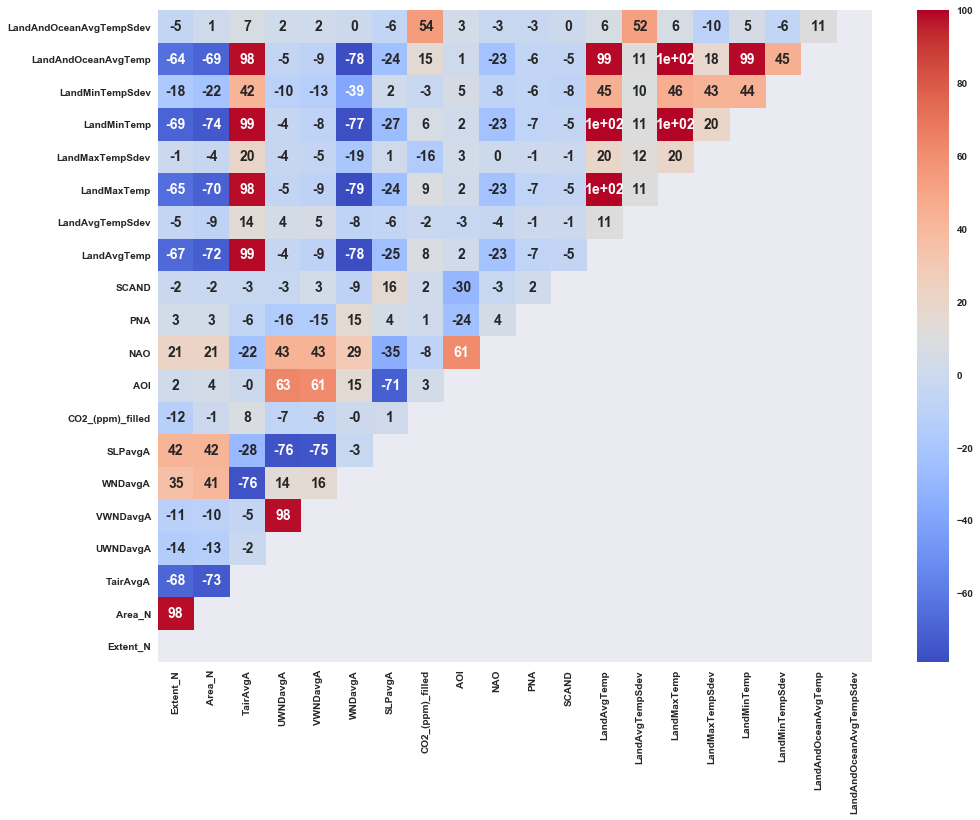

In [224]:
plt.figure(figsize=(16,12))
X_dum = pd.get_dummies(df25A[continuous_var].copy())
mask  = np.triu(X_dum.corr())
ax    = sn.heatmap(round(X_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap='coolwarm')
ax.set_ylim((0,20))
plt.savefig('figures/Arctic_correlogram.png')

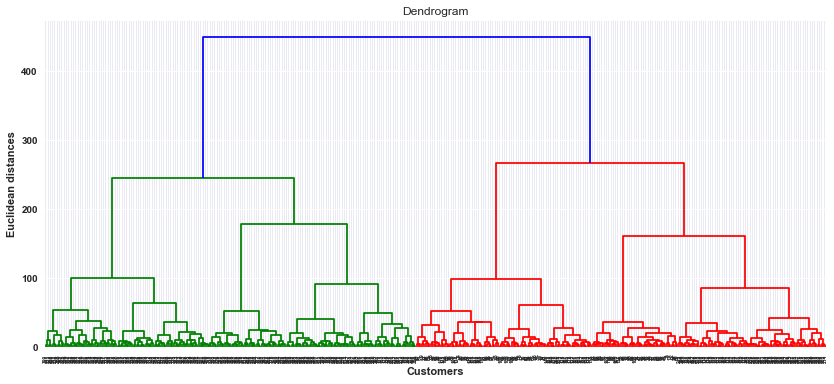

In [225]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(14,6))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
dendrogram = sch.dendrogram(sch.linkage(df25A[continuous_var], method='ward'))


**Data cleaned for seasonal cycle**

In [226]:
# Arctic variables, keep ts for the moment
#Arctic_SIE     = ['Datetime','Month','year', 'Extent_N_Anom', 'Area_N_Anom']
#Arctic_Indices = ['Datetime','AOI', 'NAO', 'PNA', 'SCAND']
#Arctic_Met     = ['Datetime','TairAvgA_anom','UWNDavgA_anom', 'VWNDavgA_anom','WNDavgA_anom','SLPavgA_anom']
#Arctic_Met_median = ['Datetime','TairMedA_anom', 'UWNDMedA_anom','VWNDMedA_anom','WNDMedA_anom','SLPMedA_anom']
#Global_Temps   = ['Datetime', 'LandAvgTemp_anom', 'LandAvgTempSdev_anom', 'LandMaxTemp_anom','LandMaxTempSdev_anom', \
#                  'LandMinTemp_anom','LandMinTempSdev_anom','LandAndOceanAvgTemp_anom', \
#                  'LandAndOceanAvgTempSdev_anom']

In [227]:
Monthly_AVG_df = df25A.groupby('Month_x').mean()
Monthly_AVG_df

,year,Extent_N,Area_N,TairAvgA,UWNDavgA,VWNDavgA,WNDavgA,SLPavgA,CO2_(ppm)_filled,AOI,...,PNA,SCAND,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev
Month_x,,,,,,,,,,,,,,,,,,,,,
1,1997,14.347838,12.253243,-22.111908,0.374298,0.154112,3.712153,1012.669067,365.501892,-0.110459,...,0.492645,0.080270,3.359270,0.082946,8.781432,0.109703,-1.937892,0.097081,13.928216,0.058351
2,1997,15.232432,13.047027,-21.953730,0.406153,0.161424,3.524959,1013.810242,366.294324,-0.127288,...,0.157806,0.091081,3.899892,0.098459,9.583432,0.096432,-1.683243,0.094784,14.195108,0.060432
3,1997,15.381622,13.178919,-19.167143,0.244853,0.017667,3.213551,1014.806396,367.160270,0.040132,...,0.256625,-0.001892,6.016514,0.079162,11.912784,0.103189,0.229297,0.115405,14.831000,0.059189
4,1997,14.664324,12.544865,-12.115137,-0.020060,-0.150324,2.765229,1015.720825,368.549730,0.156648,...,0.177983,-0.100541,9.067270,0.076027,14.987243,0.131838,3.188459,0.167162,15.667486,0.057946
5,1997,13.245405,11.117297,-2.991873,-0.147134,-0.175852,2.168308,1015.359314,369.175135,0.067188,...,-0.090053,-0.095405,11.865514,0.081351,17.718351,0.145811,6.035243,0.168649,16.416459,0.057324
6,1997,11.685676,9.108108,3.965309,0.149344,-0.007734,2.081878,1011.605286,368.543514,-0.021557,...,-0.214650,-0.067838,13.993838,0.093405,19.805459,0.143405,8.195216,0.142486,17.018568,0.059459
7,1997,9.310541,6.327838,6.563412,0.339462,0.086086,2.160647,1010.349915,366.995946,-0.127695,...,0.403540,0.041351,14.827811,0.098892,20.584649,0.114649,9.146081,0.145946,17.298054,0.060081
8,1997,7.021622,4.599595,5.072644,0.463725,0.136100,2.272729,1010.241516,364.943784,-0.019871,...,0.062511,-0.011892,14.389027,0.091081,20.199757,0.121135,8.715757,0.150081,17.223486,0.058919
9,1997,6.224324,4.294595,-0.901165,0.539107,0.155016,2.638993,1010.809204,363.232973,0.024789,...,0.067385,-0.012973,12.584757,0.081973,18.383432,0.124676,6.928270,0.158514,16.628649,0.058027


In [228]:
df25A.columns

Index(['Datetime', 'Month_x', 'year', 'Extent_N', 'Area_N', 'TairAvgA',
       'UWNDavgA', 'VWNDavgA', 'WNDavgA', 'SLPavgA', 'CO2_(ppm)_filled', 'AOI',
       'NAO', 'PNA', 'SCAND', 'LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp',
       'LandMaxTempSdev', 'LandMinTemp', 'LandMinTempSdev',
       'LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev'],
      dtype='object')

In [229]:
cols = ['Extent_N','Area_N','TairAvgA','UWNDavgA', 'VWNDavgA', 'WNDavgA', 'SLPavgA', 'CO2_(ppm)_filled',\
        'LandAvgTemp', 'LandMaxTemp','LandMinTemp', 'LandAndOceanAvgTemp']
df25Aanom = df25A[['Datetime', 'Month_x', 'year', 'AOI','NAO', 'PNA', 'SCAND']].copy()

for i in cols:
    name = i+'_Anom'
    df25Aanom[name] = 0
    # create anomalies according to monthly climatology
    for j in range(1,13):
        df25Aanom[name][df25A.Month_x==j] = df25A[i][df25A.Month_x==j] - Monthly_AVG_df[i][j];
        
df25Aanom.head()

,Datetime,Month_x,year,AOI,NAO,PNA,SCAND,Extent_N_Anom,Area_N_Anom,TairAvgA_Anom,UWNDavgA_Anom,VWNDavgA_Anom,WNDavgA_Anom,SLPavgA_Anom,CO2_(ppm)_filled_Anom,LandAvgTemp_Anom,LandMaxTemp_Anom,LandMinTemp_Anom,LandAndOceanAvgTemp_Anom
0,1979-01-01,1,1979,-2.23280,-1.38,-0.69,0.53,1.062162,0.156757,-1.960531,-0.626072,-0.404952,-0.920154,5.553162,-29.271892,-0.680270,-0.710432,-0.687108,-0.298216
1,1979-02-01,2,1979,-0.69671,-0.67,-1.82,0.19,0.947568,0.132973,-5.631857,-0.230285,-0.079543,-0.734737,2.424255,-29.534324,-1.058892,-1.058432,-1.075757,-0.427108
2,1979-03-01,3,1979,-0.81414,0.78,0.38,0.75,0.958378,0.031081,-1.456783,-0.918981,-0.534569,1.237850,4.447510,-29.200270,-0.542514,-0.581784,-0.358297,-0.266000
3,1979-04-01,4,1979,-1.15680,-1.71,0.09,0.22,0.785676,-0.014865,-2.422652,-0.277069,-0.254818,-0.639739,5.548279,-29.669730,-0.612270,-0.714243,-0.565459,-0.276486
4,1979-05-01,5,1979,-0.25009,-1.03,1.35,-0.38,0.614595,-0.007297,-1.118717,-0.408066,-0.184470,0.225897,1.414978,-29.705135,-0.666514,-0.579351,-0.323243,-0.340459


In [230]:
df25Aanom.tail()

,Datetime,Month_x,year,AOI,NAO,PNA,SCAND,Extent_N_Anom,Area_N_Anom,TairAvgA_Anom,UWNDavgA_Anom,VWNDavgA_Anom,WNDavgA_Anom,SLPavgA_Anom,CO2_(ppm)_filled_Anom,LandAvgTemp_Anom,LandMaxTemp_Anom,LandMinTemp_Anom,LandAndOceanAvgTemp_Anom
439,2015-08-01,8,2015,-0.68902,-0.76036,0.078863,0.87,-1.421622,-0.969595,0.289940,-0.769376,-0.388561,-0.134564,3.634521,34.056216,0.365973,0.499243,0.289243,0.365514
440,2015-09-01,9,2015,-0.16451,-0.64846,-0.918130,1.09,-1.604324,-0.874595,1.293135,0.489142,0.190236,-0.404240,0.144958,34.267027,0.414243,0.461568,0.270730,0.420351
441,2015-10-01,10,2015,-0.25006,0.43723,1.775000,0.62,-1.202162,-0.818378,2.779579,0.361407,0.193209,-0.444285,-1.752747,34.950811,0.876892,0.867838,0.854946,0.554676
442,2015-11-01,11,2015,1.94500,1.74380,-0.192740,-0.40,-0.755135,-0.398649,2.676255,0.757487,0.377862,0.020237,-3.262024,35.445405,0.772838,0.739270,0.881649,0.520514
443,2015-12-01,12,2015,1.44410,2.24360,0.777120,0.08,-0.734595,-0.219459,1.715504,-0.153826,-0.089924,0.117254,-3.329773,35.695676,1.163351,1.008757,1.166000,0.660027


In [231]:
# Merge Arctic and global data into one data frame
#df0 = SIE_Mon[Arctic_SIE].loc[(SIE_Mon.Datetime>=start)&(SIE_Mon.Datetime<=end)]
#df1 = global_carbon[['Year', 'Month', 'Datetime', 'SeasAdjstd_CO2_(ppm)_filled']].loc[(global_carbon.Datetime>=start)&(global_carbon.Datetime<=end)]
#df2 = clim_indices_Mon[Arctic_Indices].loc[(clim_indices_Mon.Datetime>=start)&(clim_indices_Mon.Datetime<=end)]
#df3 = global_LaOT[Global_Temps].loc[(global_LaOT.Datetime>=start)&(global_LaOT.Datetime<=end)]
#df4 = MetDataM[Arctic_Met].loc[(MetDataM.Datetime>=start)&(MetDataM.Datetime<=end)]
#dfs25Aanom = [df0,df4, df1, df2, df3]
#df25Aanom  = reduce(lambda left,right: pd.merge(left,right,how='outer',on='Datetime'), dfs25Aanom)
#df25Aanom.head()

In [232]:
#drop_cols = ['Year','Month_y']
#df25Aanom.drop(drop_cols,inplace=True,axis=1)
#df25Aanom.tail()

In [233]:
df25Aanom.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444 entries, 0 to 443
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Datetime                  444 non-null    datetime64[ns]
 1   Month_x                   444 non-null    int64         
 2   year                      444 non-null    int64         
 3   AOI                       444 non-null    float64       
 4   NAO                       444 non-null    float64       
 5   PNA                       444 non-null    float64       
 6   SCAND                     444 non-null    float64       
 7   Extent_N_Anom             444 non-null    float64       
 8   Area_N_Anom               444 non-null    float64       
 9   TairAvgA_Anom             444 non-null    float32       
 10  UWNDavgA_Anom             444 non-null    float32       
 11  VWNDavgA_Anom             444 non-null    float32       
 12  WNDavgA_Anom          

In [234]:
continuous_var = list(df25Aanom.select_dtypes(['int64','float64','float32','bool']).columns.values)
continuous_var.remove('year')
continuous_var.remove('Month_x')
continuous_var

['AOI',
 'NAO',
 'PNA',
 'SCAND',
 'Extent_N_Anom',
 'Area_N_Anom',
 'TairAvgA_Anom',
 'UWNDavgA_Anom',
 'VWNDavgA_Anom',
 'WNDavgA_Anom',
 'SLPavgA_Anom',
 'CO2_(ppm)_filled_Anom',
 'LandAvgTemp_Anom',
 'LandMaxTemp_Anom',
 'LandMinTemp_Anom',
 'LandAndOceanAvgTemp_Anom']

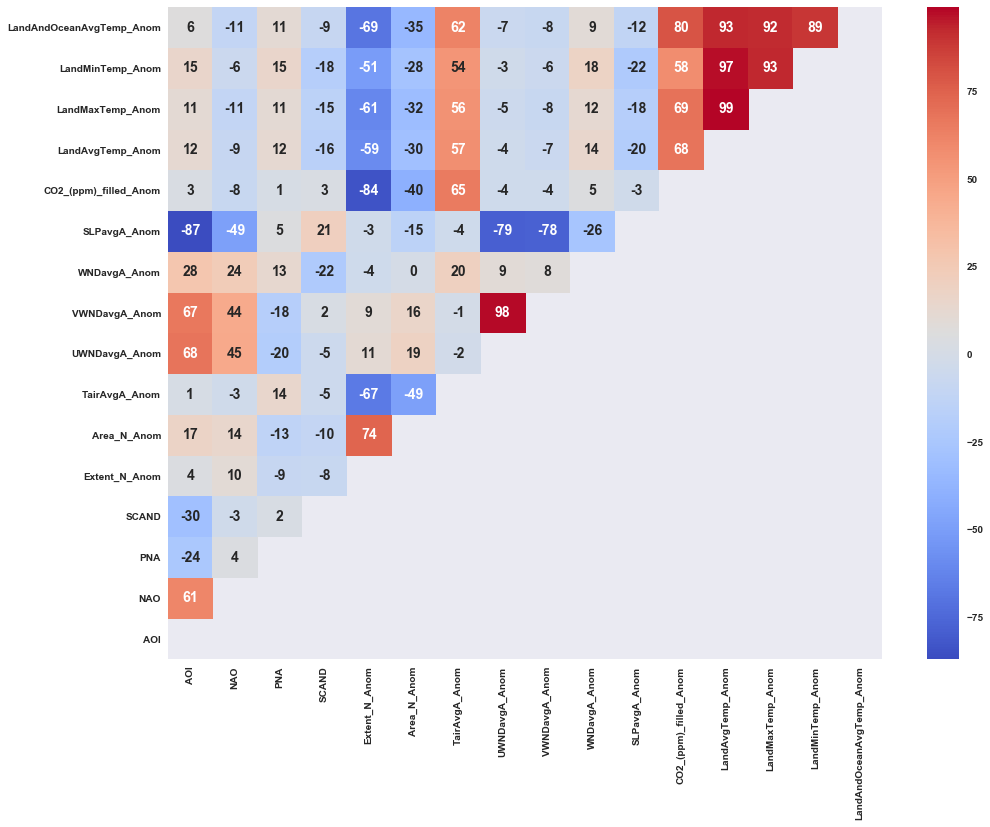

In [235]:
plt.figure(figsize=(16,12))
X_dum = pd.get_dummies(df25Aanom[continuous_var].copy())
mask  = np.triu(X_dum.corr())
ax    = sn.heatmap(round(X_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap='coolwarm')
ax.set_ylim((0,16))
plt.savefig('figures/ArcticAnoms_correlogram.png')

**Residuals only, Arctic (no seasonal cycle, detrended)**

In [236]:
cols = ['Extent_N','Area_N','TairAvgA','UWNDavgA', 'VWNDavgA', 'WNDavgA', 'SLPavgA', 'CO2_(ppm)_filled',\
        'LandAvgTemp', 'LandMaxTemp','LandMinTemp', 'LandAndOceanAvgTemp']
df25Aresiduals = df25A[['Datetime', 'Month_x', 'year', 'AOI','NAO', 'PNA', 'SCAND']].copy()

for i in cols:
    name    = i+'_resid'
    resultN = seasonal_decompose(df25A[i],model='additive',period=12)
    df25Aresiduals[name] = resultN.resid

df25Aresiduals.head(10)

,Datetime,Month_x,year,AOI,NAO,PNA,SCAND,Extent_N_resid,Area_N_resid,TairAvgA_resid,UWNDavgA_resid,VWNDavgA_resid,WNDavgA_resid,SLPavgA_resid,CO2_(ppm)_filled_resid,LandAvgTemp_resid,LandMaxTemp_resid,LandMinTemp_resid,LandAndOceanAvgTemp_resid
0,1979-01-01,1,1979,-2.232800,-1.38,-0.69,0.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1979-02-01,2,1979,-0.696710,-0.67,-1.82,0.19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1979-03-01,3,1979,-0.814140,0.78,0.38,0.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1979-04-01,4,1979,-1.156800,-1.71,0.09,0.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1979-05-01,5,1979,-0.250090,-1.03,1.35,-0.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1979-06-01,6,1979,0.933160,1.60,-1.64,0.19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1979-07-01,7,1979,0.038511,0.83,0.99,-1.45,0.228203,0.312505,1.312639,0.456978,0.213196,0.015557,-1.395277,0.108635,-0.221644,-0.169580,-0.237579,-0.080729
7,1979-08-01,8,1979,-0.684130,0.96,0.70,0.38,0.261409,0.432956,0.870475,-0.386238,-0.137360,0.386264,0.629773,0.511656,-0.101727,-0.145000,-0.070353,-0.038973
8,1979-09-01,9,1979,-0.045949,1.01,1.28,-1.41,0.080958,0.280549,-0.064249,-0.545985,-0.251182,0.348607,0.580569,0.050846,0.092126,0.083264,0.140805,0.013328
9,1979-10-01,10,1979,-1.243400,-0.30,1.53,1.26,-0.146461,-0.112819,-1.503146,-0.273932,-0.143212,-0.096524,0.691272,-0.104339,0.091543,0.174415,0.040502,0.007604


In [237]:
df25Aresiduals.tail(10)

,Datetime,Month_x,year,AOI,NAO,PNA,SCAND,Extent_N_resid,Area_N_resid,TairAvgA_resid,UWNDavgA_resid,VWNDavgA_resid,WNDavgA_resid,SLPavgA_resid,CO2_(ppm)_filled_resid,LandAvgTemp_resid,LandMaxTemp_resid,LandMinTemp_resid,LandAndOceanAvgTemp_resid
434,2015-03-01,3,2015,1.83740,1.449700,-0.229880,0.39,-0.121010,-0.013583,0.886045,0.689884,0.417044,0.368852,-4.184498,-0.011272,0.280059,0.241053,0.300928,0.030922
435,2015-04-01,4,2015,1.21570,0.725350,-0.150240,-1.49,0.142451,0.189125,0.665866,0.420663,0.211665,0.065867,-2.093691,0.477293,-0.213150,-0.285074,-0.168356,-0.049273
436,2015-05-01,5,2015,0.76276,0.145520,-0.157840,-2.15,0.154962,0.206220,-1.563206,0.080659,-0.043844,-0.142657,-0.354397,0.415638,-0.060791,-0.094244,-0.152391,-0.012014
437,2015-06-01,6,2015,0.42704,-0.066822,-0.173070,-1.52,0.152057,0.043859,-0.550198,-0.068502,-0.022588,-0.129372,0.310759,-0.264189,-0.047124,-0.039997,-0.058224,-0.023959
438,2015-07-01,7,2015,-1.10790,-3.179000,0.761160,-1.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
439,2015-08-01,8,2015,-0.68902,-0.760360,0.078863,0.87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
440,2015-09-01,9,2015,-0.16451,-0.648460,-0.918130,1.09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
441,2015-10-01,10,2015,-0.25006,0.437230,1.775000,0.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
442,2015-11-01,11,2015,1.94500,1.743800,-0.192740,-0.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
443,2015-12-01,12,2015,1.44410,2.243600,0.777120,0.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [238]:
df25Aresiduals.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444 entries, 0 to 443
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Datetime                   444 non-null    datetime64[ns]
 1   Month_x                    444 non-null    int64         
 2   year                       444 non-null    int64         
 3   AOI                        444 non-null    float64       
 4   NAO                        444 non-null    float64       
 5   PNA                        444 non-null    float64       
 6   SCAND                      444 non-null    float64       
 7   Extent_N_resid             432 non-null    float64       
 8   Area_N_resid               432 non-null    float64       
 9   TairAvgA_resid             432 non-null    float64       
 10  UWNDavgA_resid             432 non-null    float64       
 11  VWNDavgA_resid             432 non-null    float64       
 12  WNDavgA_

In [239]:
df25Aresiduals.describe()

,Month_x,year,AOI,NAO,PNA,SCAND,Extent_N_resid,Area_N_resid,TairAvgA_resid,UWNDavgA_resid,VWNDavgA_resid,WNDavgA_resid,SLPavgA_resid,CO2_(ppm)_filled_resid,LandAvgTemp_resid,LandMaxTemp_resid,LandMinTemp_resid,LandAndOceanAvgTemp_resid
count,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000
mean,6.500000,1997.000000,-0.010454,0.054885,0.130451,0.001779,0.001455,0.002100,0.002461,0.002612,0.001514,0.000613,-0.015977,0.000881,0.000571,0.000553,0.000098,0.000052
std,3.455947,10.689122,1.021165,1.034737,1.004666,0.984025,0.320305,0.322329,0.844691,0.496606,0.271996,0.378609,2.567557,0.247977,0.255797,0.278602,0.249394,0.084170
min,1.000000,1979.000000,-4.265700,-3.180000,-3.070000,-2.440000,-1.550292,-1.281986,-2.495751,-1.493271,-0.826482,-1.040409,-8.562243,-1.043124,-0.792642,-0.959679,-0.713420,-0.302354
25%,3.750000,1988.000000,-0.550512,-0.685000,-0.500225,-0.652500,-0.178061,-0.185684,-0.538583,-0.312614,-0.169458,-0.247843,-1.692769,-0.157979,-0.162070,-0.185709,-0.147041,-0.057796
50%,6.500000,1997.000000,-0.012058,0.125000,0.197655,-0.020000,0.008973,-0.003155,0.041432,0.004056,0.004674,-0.019690,-0.021565,-0.006434,0.000405,0.008020,0.010227,-0.001805
75%,9.250000,2006.000000,0.585718,0.832807,0.777840,0.622500,0.168067,0.202496,0.533923,0.362486,0.195917,0.256309,1.524644,0.166083,0.170904,0.180940,0.150271,0.055641
max,12.000000,2015.000000,3.495300,2.630000,2.660000,2.930000,1.042867,0.987215,3.119457,1.705682,1.121499,1.519361,8.324177,0.809989,0.778643,0.843500,0.826511,0.247570


In [240]:
continuous_var = list(df25Aresiduals.select_dtypes(['int64','float64','float32','bool']).columns.values)
continuous_var.remove('year')
continuous_var.remove('Month_x')
continuous_var

['AOI',
 'NAO',
 'PNA',
 'SCAND',
 'Extent_N_resid',
 'Area_N_resid',
 'TairAvgA_resid',
 'UWNDavgA_resid',
 'VWNDavgA_resid',
 'WNDavgA_resid',
 'SLPavgA_resid',
 'CO2_(ppm)_filled_resid',
 'LandAvgTemp_resid',
 'LandMaxTemp_resid',
 'LandMinTemp_resid',
 'LandAndOceanAvgTemp_resid']

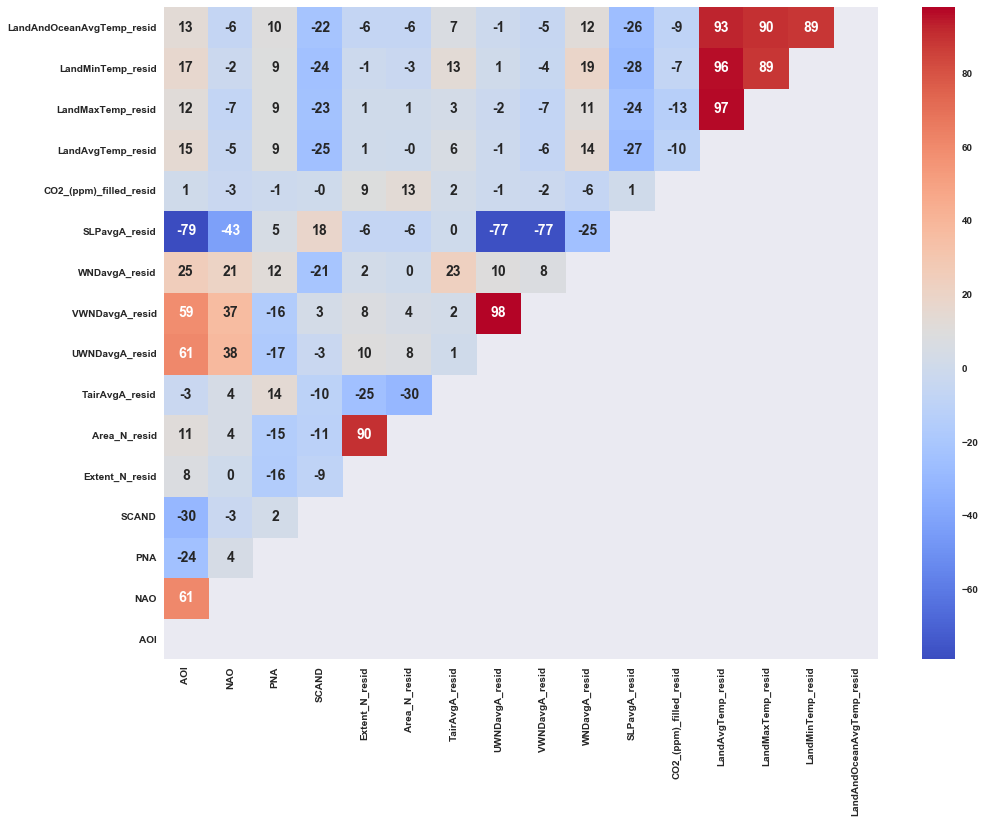

In [241]:
plt.figure(figsize=(16,12))
X_dum = pd.get_dummies(df25Aresiduals[continuous_var].copy())
mask  = np.triu(X_dum.corr())
ax    = sn.heatmap(round(X_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap='coolwarm')
ax.set_ylim((0,16))
plt.savefig('figures/ArcticResiduals_correlogram.png')

#### Antarctic
**Data including trend and seasonal cycle**

In [242]:
# Antarctic variables, keep ts for the moment
AArctic_SIE     = ['Datetime','Month','year','Extent_S', 'Area_S']
AArctic_Indices = ['Datetime','AAO']
AArctic_Met     = ['Datetime','TairAvgAA', 'UWNDavgAA', 'VWNDavgAA','WNDavgAA', 'SLPavgAA']
AArctic_Met_median = ['Datetime','TairMedAA', 'UWNDMedAA','VWNDMedAA','WNDMedAA','SLPMedAA']
Global_Temps   = ['Datetime', 'LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp','LandMaxTempSdev', \
                  'LandMinTemp','LandMinTempSdev','LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev']

In [243]:
# Merge Arctic and global data into one data frame
df0 = SIE_Mon[AArctic_SIE].loc[(SIE_Mon.Datetime>=start)&(SIE_Mon.Datetime<=end)]
df1 = global_carbon[['Year', 'Month', 'Datetime','CO2_(ppm)_filled']].loc[(global_carbon.Datetime>=start)&(global_carbon.Datetime<=end)]
df2 = clim_indices_Mon[AArctic_Indices].loc[(clim_indices_Mon.Datetime>=start)&(clim_indices_Mon.Datetime<=end)]
df3 = global_LaOT[Global_Temps].loc[(global_LaOT.Datetime>=start)&(global_LaOT.Datetime<=end)]
df4 = MetDataM[AArctic_Met].loc[(MetDataM.Datetime>=start)&(MetDataM.Datetime<=end)]
dfs25AA = [df0,df4, df1, df2, df3]
df25AA  = reduce(lambda left,right: pd.merge(left,right,how='outer',on='Datetime'), dfs25AA)
df25AA.head()

,Datetime,Month_x,year,Extent_S,Area_S,TairAvgAA,UWNDavgAA,VWNDavgAA,WNDavgAA,SLPavgAA,...,CO2_(ppm)_filled,AAO,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev
0,1979-01-01,1,1979,5.40,3.47,-6.155746,1.073110,-0.191639,2.616777,989.198730,...,336.23,0.20876,2.679,0.083,8.071,0.125,-2.625,0.100,13.630,0.048
1,1979-02-01,2,1979,3.14,2.11,-14.089021,1.070590,0.334223,5.173589,996.337708,...,336.76,0.35626,2.841,0.089,8.525,0.076,-2.759,0.147,13.768,0.047
2,1979-03-01,3,1979,4.00,2.66,-21.022532,1.549230,0.392057,6.633976,999.539795,...,337.96,0.89918,5.474,0.102,11.331,0.187,-0.129,0.272,14.565,0.051
3,1979-04-01,4,1979,7.49,5.45,-25.575523,1.103536,0.886651,7.301816,1001.450928,...,338.88,0.67758,8.455,0.078,14.273,0.258,2.623,0.303,15.391,0.046
4,1979-05-01,5,1979,10.83,8.30,-28.520868,1.182128,0.599567,6.786183,1002.909607,...,339.47,0.72374,11.199,0.149,17.139,0.198,5.712,0.212,16.076,0.058


In [244]:
drop_cols = ['Year','Month_y']
df25AA.drop(drop_cols,inplace=True,axis=1)

In [245]:
continuous_var = list(df25AA.select_dtypes(['int64','float64','float32','bool']).columns.values)
continuous_var.remove('year')
continuous_var.remove('Month_x')
continuous_var

['Extent_S',
 'Area_S',
 'TairAvgAA',
 'UWNDavgAA',
 'VWNDavgAA',
 'WNDavgAA',
 'SLPavgAA',
 'CO2_(ppm)_filled',
 'AAO',
 'LandAvgTemp',
 'LandAvgTempSdev',
 'LandMaxTemp',
 'LandMaxTempSdev',
 'LandMinTemp',
 'LandMinTempSdev',
 'LandAndOceanAvgTemp',
 'LandAndOceanAvgTempSdev']

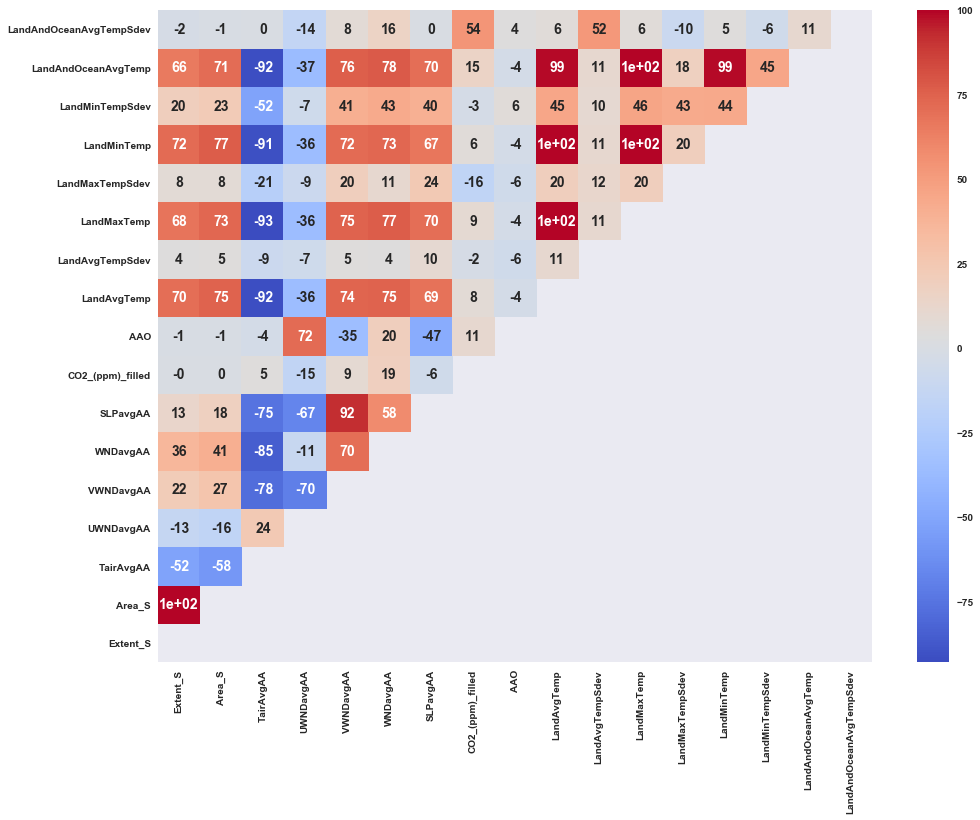

In [246]:
plt.figure(figsize=(16,12))
X_dum = pd.get_dummies(df25AA[continuous_var].copy())
mask  = np.triu(X_dum.corr())
ax    = sn.heatmap(round(X_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap='coolwarm')
ax.set_ylim((0,17))
plt.savefig('figures/Antarctic_correlogram.png')

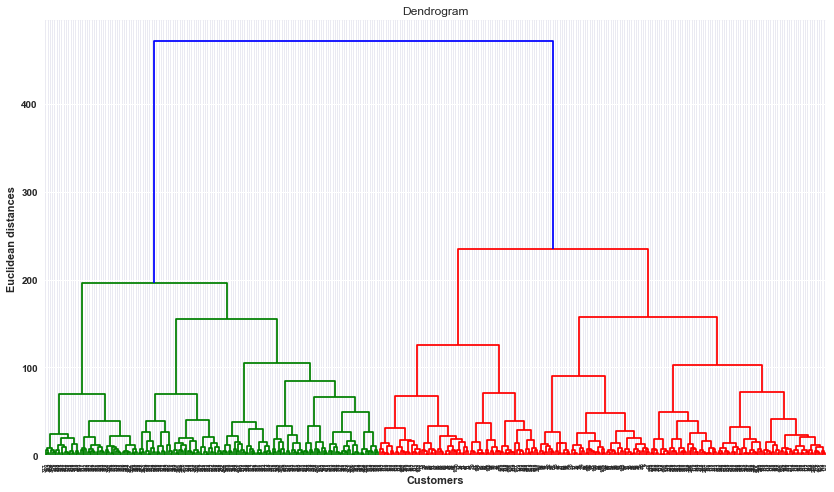

In [247]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(14,8))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
dendrogram = sch.dendrogram(sch.linkage(df25AA[continuous_var], method='ward'))

**Data cleaned for seasonal cycle**

In [248]:
Monthly_AVG_dfAA = df25AA.groupby('Month_x').mean()
Monthly_AVG_dfAA

,year,Extent_S,Area_S,TairAvgAA,UWNDavgAA,VWNDavgAA,WNDavgAA,SLPavgAA,CO2_(ppm)_filled,AAO,LandAvgTemp,LandAvgTempSdev,LandMaxTemp,LandMaxTempSdev,LandMinTemp,LandMinTempSdev,LandAndOceanAvgTemp,LandAndOceanAvgTempSdev
Month_x,,,,,,,,,,,,,,,,,,
1,1997,5.098919,3.345135,-8.036031,0.604982,0.028809,3.907931,992.787170,365.501892,0.077857,3.359270,0.082946,8.781432,0.109703,-1.937892,0.097081,13.928216,0.058351
2,1997,3.122162,2.027568,-13.467574,0.839167,0.277585,5.257486,996.637085,366.294324,0.091725,3.899892,0.098459,9.583432,0.096432,-1.683243,0.094784,14.195108,0.060432
3,1997,4.080811,2.730811,-20.244131,0.831492,0.708653,6.473691,1001.494263,367.160270,0.111816,6.016514,0.079162,11.912784,0.103189,0.229297,0.115405,14.831000,0.059189
4,1997,6.920541,5.109459,-24.546030,0.565567,0.983856,6.988518,1004.090820,368.549730,-0.002321,9.067270,0.076027,14.987243,0.131838,3.188459,0.167162,15.667486,0.057946
5,1997,10.251622,7.926216,-26.597670,0.251406,1.108137,6.907913,1005.564758,369.175135,0.037782,11.865514,0.081351,17.718351,0.145811,6.035243,0.168649,16.416459,0.057324
6,1997,13.443514,10.607568,-27.822096,-0.053654,1.172541,6.814394,1007.441833,368.543514,-0.033961,13.993838,0.093405,19.805459,0.143405,8.195216,0.142486,17.018568,0.059459
7,1997,16.044054,12.829730,-29.502127,0.305148,0.953024,6.858386,1004.840515,366.995946,0.125272,14.827811,0.098892,20.584649,0.114649,9.146081,0.145946,17.298054,0.060081
8,1997,17.795676,14.167027,-29.878542,0.411679,0.887406,7.071102,1004.032837,364.943784,0.025341,14.389027,0.091081,20.199757,0.121135,8.715757,0.150081,17.223486,0.058919
9,1997,18.571892,14.631351,-28.272472,0.403324,0.832120,6.766358,1002.839539,363.232973,-0.056438,12.584757,0.081973,18.383432,0.124676,6.928270,0.158514,16.628649,0.058027


In [249]:
df25AA.columns

Index(['Datetime', 'Month_x', 'year', 'Extent_S', 'Area_S', 'TairAvgAA',
       'UWNDavgAA', 'VWNDavgAA', 'WNDavgAA', 'SLPavgAA', 'CO2_(ppm)_filled',
       'AAO', 'LandAvgTemp', 'LandAvgTempSdev', 'LandMaxTemp',
       'LandMaxTempSdev', 'LandMinTemp', 'LandMinTempSdev',
       'LandAndOceanAvgTemp', 'LandAndOceanAvgTempSdev'],
      dtype='object')

In [250]:
cols = ['Extent_S', 'Area_S', 'TairAvgAA','UWNDavgAA', 'VWNDavgAA', 'WNDavgAA', 'SLPavgAA', 'CO2_(ppm)_filled',\
        'LandAvgTemp', 'LandMaxTemp','LandMinTemp', 'LandAndOceanAvgTemp']
df25AAanom = df25AA[['Datetime', 'Month_x', 'year', 'AAO']].copy()

for i in cols:
    name = i+'_Anom'
    df25AAanom[name] = 0
    # create anomalies according to monthly climatology
    for j in range(1,13):
        df25AAanom[name][df25AA.Month_x==j] = df25AA[i][df25AA.Month_x==j] - Monthly_AVG_dfAA[i][j];
        
df25Aanom.head()

,Datetime,Month_x,year,AOI,NAO,PNA,SCAND,Extent_N_Anom,Area_N_Anom,TairAvgA_Anom,UWNDavgA_Anom,VWNDavgA_Anom,WNDavgA_Anom,SLPavgA_Anom,CO2_(ppm)_filled_Anom,LandAvgTemp_Anom,LandMaxTemp_Anom,LandMinTemp_Anom,LandAndOceanAvgTemp_Anom
0,1979-01-01,1,1979,-2.23280,-1.38,-0.69,0.53,1.062162,0.156757,-1.960531,-0.626072,-0.404952,-0.920154,5.553162,-29.271892,-0.680270,-0.710432,-0.687108,-0.298216
1,1979-02-01,2,1979,-0.69671,-0.67,-1.82,0.19,0.947568,0.132973,-5.631857,-0.230285,-0.079543,-0.734737,2.424255,-29.534324,-1.058892,-1.058432,-1.075757,-0.427108
2,1979-03-01,3,1979,-0.81414,0.78,0.38,0.75,0.958378,0.031081,-1.456783,-0.918981,-0.534569,1.237850,4.447510,-29.200270,-0.542514,-0.581784,-0.358297,-0.266000
3,1979-04-01,4,1979,-1.15680,-1.71,0.09,0.22,0.785676,-0.014865,-2.422652,-0.277069,-0.254818,-0.639739,5.548279,-29.669730,-0.612270,-0.714243,-0.565459,-0.276486
4,1979-05-01,5,1979,-0.25009,-1.03,1.35,-0.38,0.614595,-0.007297,-1.118717,-0.408066,-0.184470,0.225897,1.414978,-29.705135,-0.666514,-0.579351,-0.323243,-0.340459


In [251]:
# Arctic variables, keep ts for the moment
#AArctic_SIE     = ['Datetime','Month','year', 'Extent_S_Anom', 'Area_S_Anom']
#AArctic_Indices = ['Datetime','AAO']
#AArctic_Met     = ['Datetime','TairAvgAA_anom','UWNDavgAA_anom', 'VWNDavgAA_anom','WNDavgAA_anom','SLPavgAA_anom']
#AArctic_Met_median = ['Datetime','TairMedAA_anom', 'UWNDMedAA_anom','VWNDMedAA_anom','WNDMedAA_anom','SLPMedAA_anom']
#Global_Temps   = ['Datetime', 'LandAvgTemp_anom', 'LandAvgTempSdev_anom', 'LandMaxTemp_anom','LandMaxTempSdev_anom', \
#                  'LandMinTemp_anom','LandMinTempSdev_anom','LandAndOceanAvgTemp_anom', \
#                  'LandAndOceanAvgTempSdev_anom']

In [252]:
# Merge Arctic and global data into one data frame
#df0 = SIE_Mon[AArctic_SIE].loc[(SIE_Mon.Datetime>=start)&(SIE_Mon.Datetime<=end)]
#df1 = global_carbon[['Year', 'Month', 'Datetime','SeasAdjstd_CO2_(ppm)_filled']].loc[(global_carbon.Datetime>=start)&(global_carbon.Datetime<=end)]
#df2 = clim_indices_Mon[AArctic_Indices].loc[(clim_indices_Mon.Datetime>=start)&(clim_indices_Mon.Datetime<=end)]
#df3 = global_LaOT[Global_Temps].loc[(global_LaOT.Datetime>=start)&(global_LaOT.Datetime<=end)]
#df4 = MetDataM[AArctic_Met].loc[(MetDataM.Datetime>=start)&(MetDataM.Datetime<=end)]
#dfs25AAanom = [df0,df4, df1, df2, df3]
#df25AAanom  = reduce(lambda left,right: pd.merge(left,right,how='outer',on='Datetime'), dfs25AAanom)
#df25AAanom.head()

In [253]:
#drop_cols = ['Year','Month_y']
#df25AAanom.drop(drop_cols,inplace=True,axis=1)

In [254]:
continuous_var = list(df25AAanom.select_dtypes(['int64','float64','float32','bool']).columns.values)
continuous_var.remove('year')
continuous_var.remove('Month_x')
continuous_var

['AAO',
 'Extent_S_Anom',
 'Area_S_Anom',
 'TairAvgAA_Anom',
 'UWNDavgAA_Anom',
 'VWNDavgAA_Anom',
 'WNDavgAA_Anom',
 'SLPavgAA_Anom',
 'CO2_(ppm)_filled_Anom',
 'LandAvgTemp_Anom',
 'LandMaxTemp_Anom',
 'LandMinTemp_Anom',
 'LandAndOceanAvgTemp_Anom']

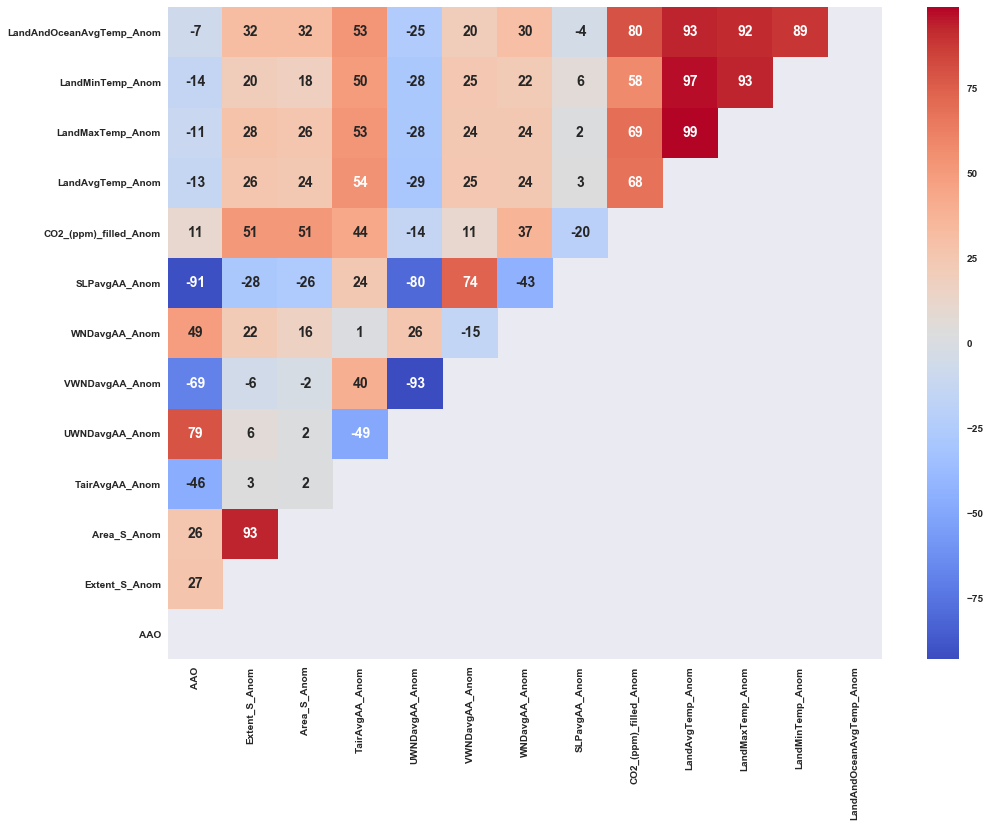

In [255]:
plt.figure(figsize=(16,12))
X_dum = pd.get_dummies(df25AAanom[continuous_var].copy())
mask  = np.triu(X_dum.corr())
ax    = sn.heatmap(round(X_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap='coolwarm')
ax.set_ylim((0,13))
plt.savefig('figures/AntarcticAnoms_correlogram.png')

**Residuals only, Antarctic (no seasonal cycle, detrended)**

In [256]:
cols = ['Extent_S','Area_S','TairAvgAA','UWNDavgAA', 'VWNDavgAA', 'WNDavgAA', 'SLPavgAA', 'CO2_(ppm)_filled',\
        'LandAvgTemp', 'LandMaxTemp','LandMinTemp', 'LandAndOceanAvgTemp']
df25AAresiduals = df25AA[['Datetime', 'Month_x', 'year', 'AAO']].copy()

for i in cols:
    name    = i+'_resid'
    resultS = seasonal_decompose(df25AA[i],model='additive',period=12)
    df25AAresiduals[name] = resultS.resid

df25AAresiduals.head(10)

,Datetime,Month_x,year,AAO,Extent_S_resid,Area_S_resid,TairAvgAA_resid,UWNDavgAA_resid,VWNDavgAA_resid,WNDavgAA_resid,SLPavgAA_resid,CO2_(ppm)_filled_resid,LandAvgTemp_resid,LandMaxTemp_resid,LandMinTemp_resid,LandAndOceanAvgTemp_resid
0,1979-01-01,1,1979,0.20876,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1979-02-01,2,1979,0.35626,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1979-03-01,3,1979,0.89918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1979-04-01,4,1979,0.67758,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1979-05-01,5,1979,0.72374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1979-06-01,6,1979,1.70000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1979-07-01,7,1979,2.41210,0.518985,0.481104,-3.746390,0.655497,-0.335554,0.123006,-3.979362,0.108635,-0.221644,-0.169580,-0.237579,-0.080729
7,1979-08-01,8,1979,0.54553,-0.023573,-0.318919,-1.524736,0.086255,-0.136672,0.060896,2.425337,0.511656,-0.101727,-0.145000,-0.070353,-0.038973
8,1979-09-01,9,1979,0.62946,-0.257392,-0.249035,-0.903621,-0.090429,0.111131,-0.005735,-0.601561,0.050846,0.092126,0.083264,0.140805,0.013328
9,1979-10-01,10,1979,0.15979,-0.113040,-0.197889,-0.572442,0.246690,-0.037446,0.222457,0.119769,-0.104339,0.091543,0.174415,0.040502,0.007604


In [257]:
df25AAresiduals.tail(10)

,Datetime,Month_x,year,AAO,Extent_S_resid,Area_S_resid,TairAvgAA_resid,UWNDavgAA_resid,VWNDavgAA_resid,WNDavgAA_resid,SLPavgAA_resid,CO2_(ppm)_filled_resid,LandAvgTemp_resid,LandMaxTemp_resid,LandMinTemp_resid,LandAndOceanAvgTemp_resid
434,2015-03-01,3,2015,0.773320,-0.061790,-0.041430,0.244743,0.240337,-0.152465,-0.193363,-1.202242,-0.011272,0.280059,0.241053,0.300928,0.030922
435,2015-04-01,4,2015,1.028600,0.607087,0.586023,0.551582,0.475383,-0.100049,0.122531,-2.376022,0.477293,-0.213150,-0.285074,-0.168356,-0.049273
436,2015-05-01,5,2015,0.415580,0.661242,0.646185,0.581051,-0.157248,-0.032068,-1.134972,-0.269642,0.415638,-0.060791,-0.094244,-0.152391,-0.012014
437,2015-06-01,6,2015,0.711340,0.288302,0.304785,-0.673647,-0.232169,0.183712,-0.157573,0.069589,-0.264189,-0.047124,-0.039997,-0.058224,-0.023959
438,2015-07-01,7,2015,1.678000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
439,2015-08-01,8,2015,1.061800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
440,2015-09-01,9,2015,0.542380,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
441,2015-10-01,10,2015,-0.169870,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
442,2015-11-01,11,2015,0.695360,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
443,2015-12-01,12,2015,-0.058907,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [258]:
df25AAresiduals.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444 entries, 0 to 443
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Datetime                   444 non-null    datetime64[ns]
 1   Month_x                    444 non-null    int64         
 2   year                       444 non-null    int64         
 3   AAO                        444 non-null    float64       
 4   Extent_S_resid             432 non-null    float64       
 5   Area_S_resid               432 non-null    float64       
 6   TairAvgAA_resid            432 non-null    float64       
 7   UWNDavgAA_resid            432 non-null    float64       
 8   VWNDavgAA_resid            432 non-null    float64       
 9   WNDavgAA_resid             432 non-null    float64       
 10  SLPavgAA_resid             432 non-null    float64       
 11  CO2_(ppm)_filled_resid     432 non-null    float64       
 12  LandAvgT

In [259]:
df25AAresiduals.describe()

,Month_x,year,AAO,Extent_S_resid,Area_S_resid,TairAvgAA_resid,UWNDavgAA_resid,VWNDavgAA_resid,WNDavgAA_resid,SLPavgAA_resid,CO2_(ppm)_filled_resid,LandAvgTemp_resid,LandMaxTemp_resid,LandMinTemp_resid,LandAndOceanAvgTemp_resid
count,444.000000,444.000000,444.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000
mean,6.500000,1997.000000,0.039906,0.001312,0.001209,-0.003956,-0.000274,0.000157,-0.002161,0.005583,0.000881,0.000571,0.000553,0.000098,0.000052
std,3.455947,10.689122,0.984620,0.324025,0.287689,0.884180,0.530809,0.215418,0.415980,2.916236,0.247977,0.255797,0.278602,0.249394,0.084170
min,1.000000,1979.000000,-3.009700,-0.887554,-0.972148,-3.746390,-1.668575,-0.739952,-1.226241,-7.737830,-1.043124,-0.792642,-0.959679,-0.713420,-0.302354
25%,3.750000,1988.000000,-0.574275,-0.208561,-0.199477,-0.607588,-0.332076,-0.143617,-0.280028,-1.795470,-0.157979,-0.162070,-0.185709,-0.147041,-0.057796
50%,6.500000,1997.000000,0.091107,0.004524,-0.009116,-0.042154,0.022740,0.007269,-0.006645,-0.152719,-0.006434,0.000405,0.008020,0.010227,-0.001805
75%,9.250000,2006.000000,0.717335,0.193936,0.176842,0.553588,0.343940,0.133411,0.266568,1.683731,0.166083,0.170904,0.180940,0.150271,0.055641
max,12.000000,2015.000000,2.690600,0.963279,0.912945,3.109249,1.460509,0.676132,1.178319,8.676638,0.809989,0.778643,0.843500,0.826511,0.247570


In [260]:
continuous_var = list(df25AAresiduals.select_dtypes(['int64','float64','float32','bool']).columns.values)
continuous_var.remove('year')
continuous_var.remove('Month_x')
continuous_var

['AAO',
 'Extent_S_resid',
 'Area_S_resid',
 'TairAvgAA_resid',
 'UWNDavgAA_resid',
 'VWNDavgAA_resid',
 'WNDavgAA_resid',
 'SLPavgAA_resid',
 'CO2_(ppm)_filled_resid',
 'LandAvgTemp_resid',
 'LandMaxTemp_resid',
 'LandMinTemp_resid',
 'LandAndOceanAvgTemp_resid']

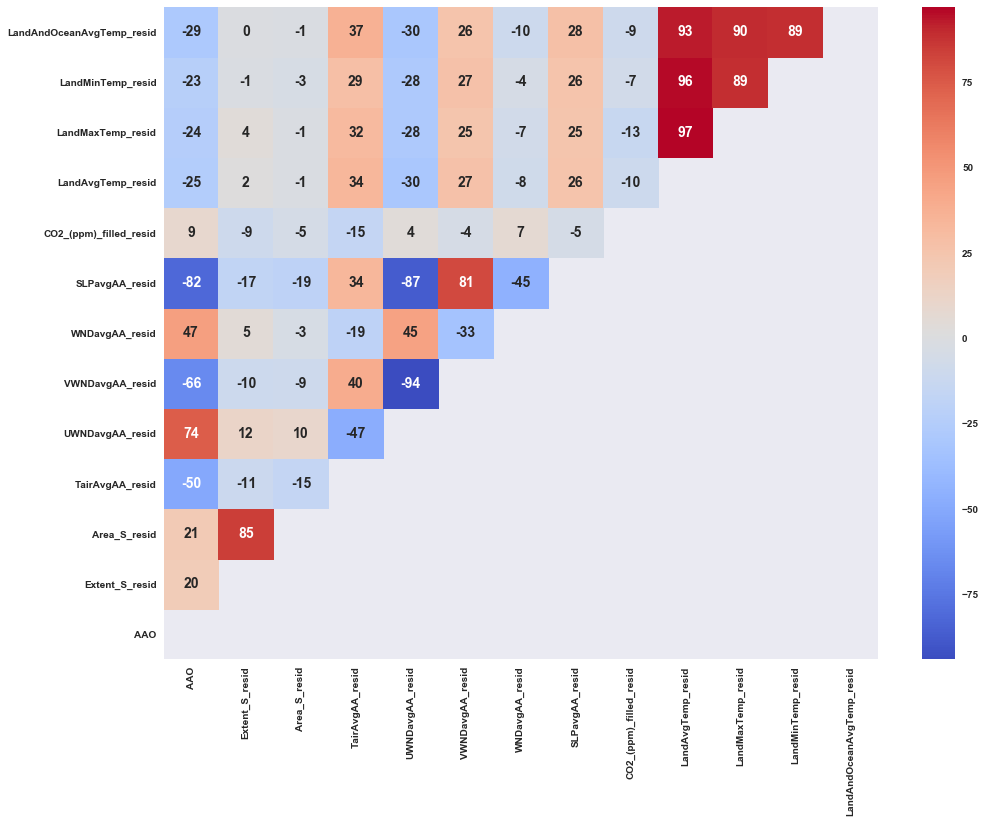

In [261]:
plt.figure(figsize=(16,12))
X_dum = pd.get_dummies(df25AAresiduals[continuous_var].copy())
mask  = np.triu(X_dum.corr())
ax    = sn.heatmap(round(X_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap='coolwarm')
ax.set_ylim((0,13))
plt.savefig('figures/AntarcticResiduals_correlogram.png')

## PCA

In [262]:
# Arctic data
start   = pd.to_datetime('1979/01/01')
end     = pd.to_datetime('2010/12/01')
XA      = list(df25Aanom.select_dtypes(['int64','float64','float32','bool']).columns.values)
XA.remove('Extent_N_Anom')
XA.remove('Area_N_Anom')
XA.remove('Month_x')
XA.remove('year')
YA      = ['Extent_N_Anom','Area_N_Anom']
trainxA = df25Aanom[XA].loc[(df25Aanom.Datetime>=start)&(df25Aanom.Datetime<=end)]
trainyA = df25Aanom[YA].loc[(df25Aanom.Datetime>=start)&(df25Aanom.Datetime<=end)]
testxA  = df25Aanom[XA].loc[(df25Aanom.Datetime>end)]
testyA  = df25Aanom[YA].loc[(df25Aanom.Datetime>end)]

# Antarctic data
XAA      = list(df25AAanom.select_dtypes(['int64','float64','float32','bool']).columns.values)
XAA.remove('Extent_S_Anom')
XAA.remove('Area_S_Anom')
XAA.remove('Month_x')
XAA.remove('year')
YAA      = ['Extent_S_Anom','Area_S_Anom']
trainxAA = df25AAanom[XAA].loc[(df25AAanom.Datetime>=start)&(df25AAanom.Datetime<=end)]
trainyAA = df25AAanom[YAA].loc[(df25AAanom.Datetime>=start)&(df25AAanom.Datetime<=end)]
testxAA  = df25AAanom[XAA].loc[(df25AAanom.Datetime>end)]
testyAA  = df25AAanom[YAA].loc[(df25AAanom.Datetime>end)]

### Arctic

In [263]:
trainxA.columns

Index(['AOI', 'NAO', 'PNA', 'SCAND', 'TairAvgA_Anom', 'UWNDavgA_Anom',
       'VWNDavgA_Anom', 'WNDavgA_Anom', 'SLPavgA_Anom',
       'CO2_(ppm)_filled_Anom', 'LandAvgTemp_Anom', 'LandMaxTemp_Anom',
       'LandMinTemp_Anom', 'LandAndOceanAvgTemp_Anom'],
      dtype='object')

In [264]:
scaler = StandardScaler()
X1 = scaler.fit_transform(trainxA)
df1_scaled = pd.DataFrame(data = X1,columns=trainxA.columns)
pca1 = PCA(n_components=None)
df1_scaled_pca = pca1.fit(df1_scaled)

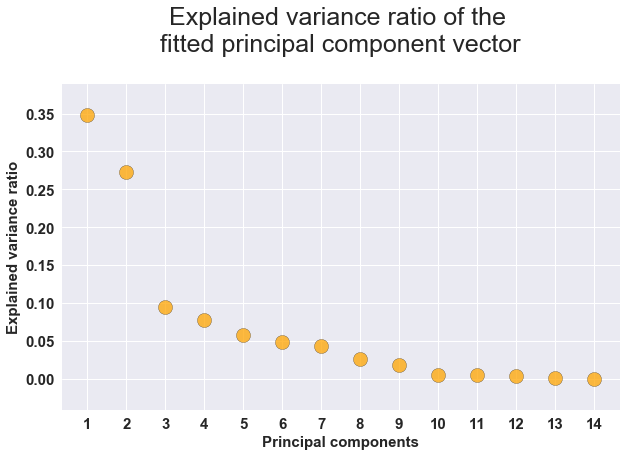

In [265]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(df1_scaled_pca.explained_variance_ratio_))],
            y=df1_scaled_pca.explained_variance_ratio_,
            s=200, alpha=0.75,c='orange',edgecolor='k')
plt.grid(True)
plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=25)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(df1_scaled_pca.explained_variance_ratio_))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

In [266]:
pca_explained_var1 = df1_scaled_pca.explained_variance_ratio_
cum_explaiend_var1 = pca_explained_var1.cumsum()
cum_explaiend_var1

array([0.34830162, 0.62107887, 0.71569635, 0.79290546, 0.85014485,
       0.89814593, 0.94129404, 0.96682966, 0.98476451, 0.98996516,
       0.9948183 , 0.99833245, 0.99959739, 1.        ])

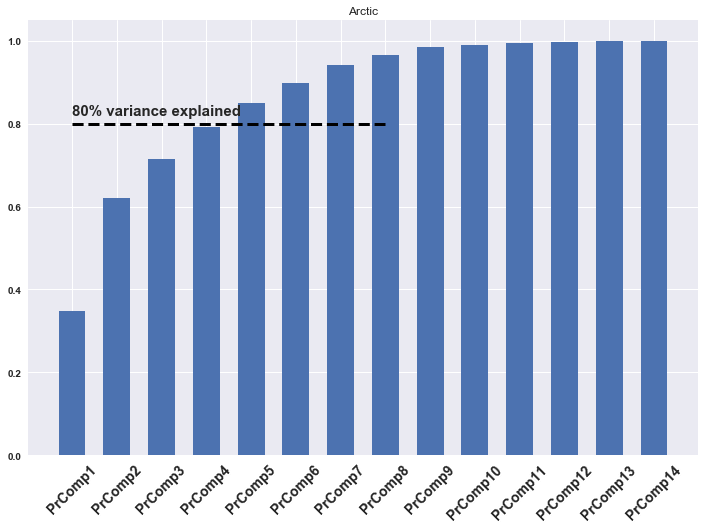

In [267]:
plt.figure(figsize=(12,8))
plt.bar(x=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var1)+1)],height=cum_explaiend_var1,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.xticks(rotation=45)
plt.title('Arctic')
plt.savefig('figures/PCA_arctic.png')
plt.show()

In [268]:
print(pd.DataFrame(pca1.components_,columns=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var1)+1)],\
                   index = df1_scaled.columns))

                           PrComp1   PrComp2   PrComp3   PrComp4   PrComp5  \
AOI                      -0.000982  0.081611 -0.096425  0.076182 -0.307277   
NAO                      -0.464538 -0.318834  0.081948  0.110126  0.005039   
PNA                       0.081475  0.245409  0.399392 -0.485938 -0.003310   
SCAND                     0.167886 -0.277895 -0.619300 -0.606651 -0.254926   
TairAvgA_Anom             0.026169  0.024017 -0.536641  0.121377  0.456095   
UWNDavgA_Anom            -0.194737 -0.593859  0.286472 -0.397487  0.385959   
VWNDavgA_Anom            -0.136235 -0.476932 -0.058755  0.360634 -0.387304   
WNDavgA_Anom             -0.120518  0.141352 -0.179902  0.086842  0.522930   
SLPavgA_Anom             -0.520609  0.359818 -0.083791 -0.245964 -0.234448   
CO2_(ppm)_filled_Anom    -0.223212  0.061898 -0.042563 -0.010740  0.028059   
LandAvgTemp_Anom         -0.514698  0.122151 -0.143344 -0.061183  0.025608   
LandMaxTemp_Anom          0.303039 -0.070683  0.074395  0.030831

### Antarctic

In [269]:
X2 = scaler.fit_transform(trainxAA)
df2_scaled = pd.DataFrame(data = X2,columns=trainxAA.columns)
pca2 = PCA(n_components=None)
df2_scaled_pca = pca2.fit(df2_scaled)

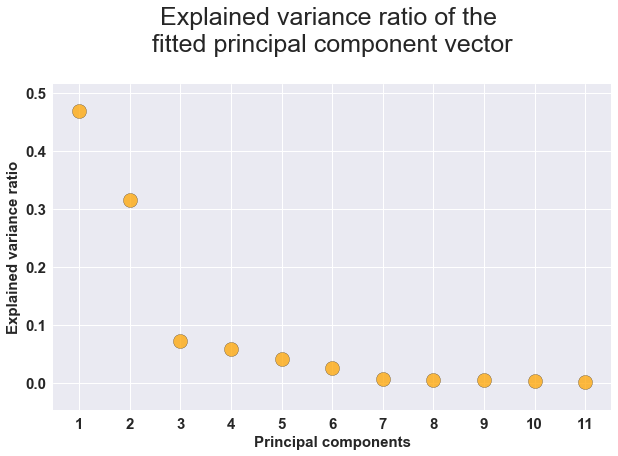

In [270]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(df2_scaled_pca.explained_variance_ratio_))],
            y=df2_scaled_pca.explained_variance_ratio_,
            s=200, alpha=0.75,c='orange',edgecolor='k')
plt.grid(True)
plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=25)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(df2_scaled_pca.explained_variance_ratio_))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

In [271]:
pca_explained_var2 = df2_scaled_pca.explained_variance_ratio_
cum_explaiend_var2 = pca_explained_var2.cumsum()
cum_explaiend_var2

array([0.46906429, 0.78370675, 0.85514561, 0.91328158, 0.95441699,
       0.97936515, 0.98603879, 0.99122893, 0.9958131 , 0.99950366,
       1.        ])

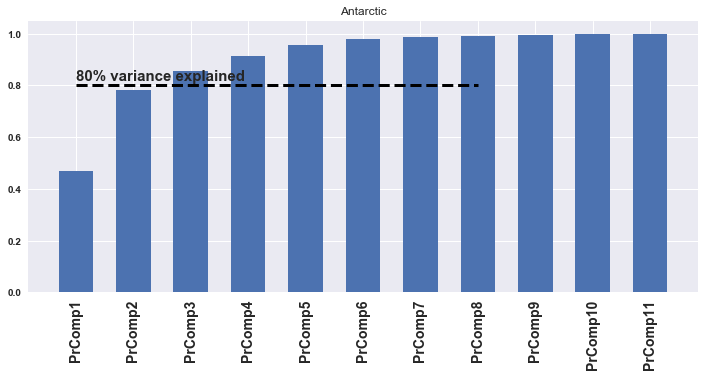

In [272]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var2)+1)],height=cum_explaiend_var2,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.xticks(rotation=90)
plt.title('Antarctic')
plt.savefig('figures/PCA_antarctic.png')
plt.show()

In [273]:
print(pd.DataFrame(pca2.components_,columns=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var2)+1)],\
                   index = df2_scaled.columns))

                           PrComp1   PrComp2   PrComp3   PrComp4   PrComp5  \
AAO                       0.212904 -0.308612  0.280214 -0.251816 -0.016750   
TairAvgAA_Anom           -0.434377  0.052467 -0.373928  0.349124 -0.342572   
UWNDavgAA_Anom           -0.119470  0.081144  0.247890 -0.436311 -0.797466   
VWNDavgAA_Anom            0.101549 -0.793706 -0.012449  0.116270  0.018202   
WNDavgAA_Anom            -0.162264  0.415250  0.188543 -0.166052  0.400442   
SLPavgAA_Anom            -0.472439 -0.196746  0.243688 -0.477711  0.264415   
CO2_(ppm)_filled_Anom    -0.078329 -0.050420 -0.100542 -0.003777 -0.025868   
LandAvgTemp_Anom         -0.157052 -0.054721  0.144565  0.182982 -0.003259   
LandMaxTemp_Anom          0.395521  0.059115 -0.651365 -0.520969  0.028067   
LandMinTemp_Anom          0.551489  0.212779  0.409803  0.222309 -0.119628   
LandAndOceanAvgTemp_Anom -0.022299  0.002251 -0.043586 -0.026579  0.005793   

                           PrComp6   PrComp7   PrComp8   PrComp

### Residuals only

In [274]:
# Arctic data
start   = pd.to_datetime('1979/07/01')
end     = pd.to_datetime('2010/06/01')
XA      = list(df25Aresiduals.select_dtypes(['int64','float64','float32','bool']).columns.values)
XA.remove('Extent_N_resid')
XA.remove('Area_N_resid')
XA.remove('Month_x')
XA.remove('year')
YA      = ['Extent_N_resid','Area_N_resid']
trainxA = df25Aresiduals[XA].loc[(df25Aresiduals.Datetime>=start)&(df25Aresiduals.Datetime<=end)]
trainyA = df25Aresiduals[YA].loc[(df25Aresiduals.Datetime>=start)&(df25Aresiduals.Datetime<=end)]
testxA  = df25Aresiduals[XA].loc[(df25Aresiduals.Datetime>end)]
testyA  = df25Aresiduals[YA].loc[(df25Aresiduals.Datetime>end)]

# Antarctic data
XAA      = list(df25AAresiduals.select_dtypes(['int64','float64','float32','bool']).columns.values)
XAA.remove('Extent_S_resid')
XAA.remove('Area_S_resid')
XAA.remove('Month_x')
XAA.remove('year')
YAA      = ['Extent_S_resid','Area_S_resid']
trainxAA = df25AAresiduals[XAA].loc[(df25AAresiduals.Datetime>=start)&(df25AAresiduals.Datetime<=end)]
trainyAA = df25AAresiduals[YAA].loc[(df25AAresiduals.Datetime>=start)&(df25AAresiduals.Datetime<=end)]
testxAA  = df25AAresiduals[XAA].loc[(df25AAresiduals.Datetime>end)]
testyAA  = df25AAresiduals[YAA].loc[(df25AAresiduals.Datetime>end)]

**Arctic**

In [275]:
trainxA.columns

Index(['AOI', 'NAO', 'PNA', 'SCAND', 'TairAvgA_resid', 'UWNDavgA_resid',
       'VWNDavgA_resid', 'WNDavgA_resid', 'SLPavgA_resid',
       'CO2_(ppm)_filled_resid', 'LandAvgTemp_resid', 'LandMaxTemp_resid',
       'LandMinTemp_resid', 'LandAndOceanAvgTemp_resid'],
      dtype='object')

In [276]:
scaler = StandardScaler()
X1 = scaler.fit_transform(trainxA)
df1_scaled = pd.DataFrame(data = X1,columns=trainxA.columns)
pca1 = PCA(n_components=None)
df1_scaled_pca = pca1.fit(df1_scaled)

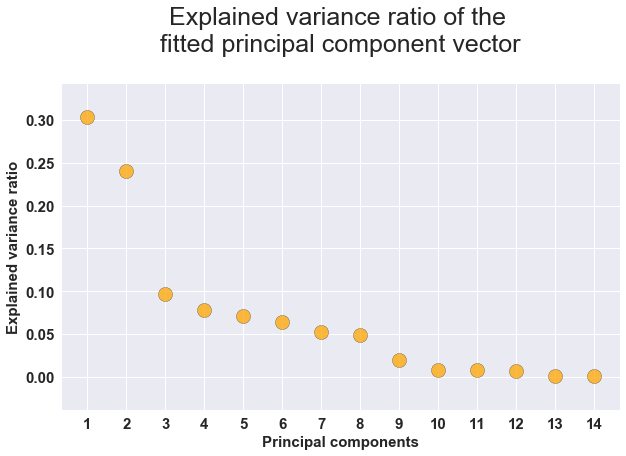

In [277]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(df1_scaled_pca.explained_variance_ratio_))],
            y=df1_scaled_pca.explained_variance_ratio_,
            s=200, alpha=0.75,c='orange',edgecolor='k')
plt.grid(True)
plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=25)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(df1_scaled_pca.explained_variance_ratio_))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

In [278]:
pca_explained_var1 = df1_scaled_pca.explained_variance_ratio_
cum_explaiend_var1 = pca_explained_var1.cumsum()
cum_explaiend_var1

array([0.30337995, 0.54379713, 0.64057903, 0.7189833 , 0.7904002 ,
       0.85448928, 0.90708612, 0.95569198, 0.97533851, 0.98351694,
       0.99121179, 0.99795613, 0.99922781, 1.        ])

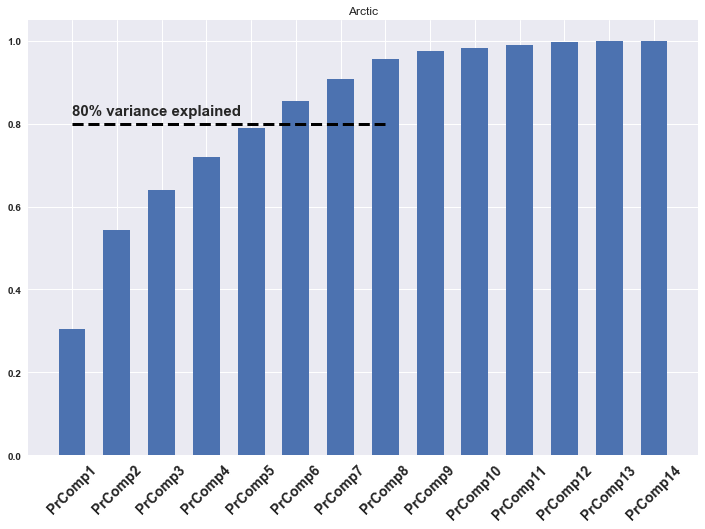

In [279]:
plt.figure(figsize=(12,8))
plt.bar(x=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var1)+1)],height=cum_explaiend_var1,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.xticks(rotation=45)
plt.title('Arctic')
plt.savefig('figures/PCA_arctic_residuals.png')
plt.show()

In [280]:
print(pd.DataFrame(pca1.components_,columns=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var1)+1)],\
                   index = df1_scaled.columns))

                            PrComp1   PrComp2   PrComp3   PrComp4   PrComp5  \
AOI                        0.261466  0.134622  0.019256 -0.174338  0.048777   
NAO                        0.362821  0.288427 -0.140492  0.032256 -0.057678   
PNA                        0.041558  0.248322  0.398866 -0.283330  0.546765   
SCAND                      0.308027  0.014284 -0.540517 -0.626042 -0.251144   
TairAvgA_resid             0.042750  0.297240  0.103368  0.017900 -0.249427   
UWNDavgA_resid            -0.139588 -0.458940 -0.473938 -0.062398  0.546880   
VWNDavgA_resid             0.078547  0.330327 -0.474419  0.641114  0.064565   
WNDavgA_resid             -0.169853 -0.473034  0.118347  0.062413 -0.492489   
SLPavgA_resid              0.531721 -0.403771  0.119509  0.259052  0.138230   
CO2_(ppm)_filled_resid     0.235321 -0.090356  0.094346  0.051222 -0.002368   
LandAvgTemp_resid         -0.502841  0.169775 -0.168245 -0.057846  0.047449   
LandMaxTemp_resid         -0.235363  0.066850 -0.051

**Antarctic**

In [281]:
X2 = scaler.fit_transform(trainxAA)
df2_scaled = pd.DataFrame(data = X2,columns=trainxAA.columns)
pca2 = PCA(n_components=None)
df2_scaled_pca = pca2.fit(df2_scaled)

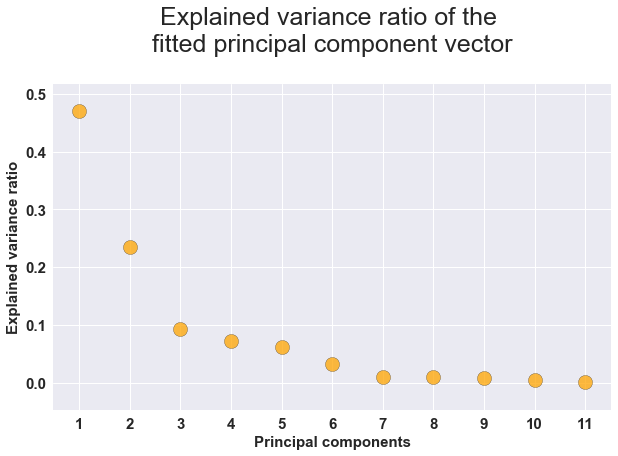

In [282]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(df2_scaled_pca.explained_variance_ratio_))],
            y=df2_scaled_pca.explained_variance_ratio_,
            s=200, alpha=0.75,c='orange',edgecolor='k')
plt.grid(True)
plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=25)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(df2_scaled_pca.explained_variance_ratio_))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

In [283]:
pca_explained_var2 = df2_scaled_pca.explained_variance_ratio_
cum_explaiend_var2 = pca_explained_var2.cumsum()
cum_explaiend_var2

array([0.46997867, 0.70500486, 0.79865482, 0.8703794 , 0.93219821,
       0.96532058, 0.97597143, 0.98551737, 0.99472761, 0.999061  ,
       1.        ])

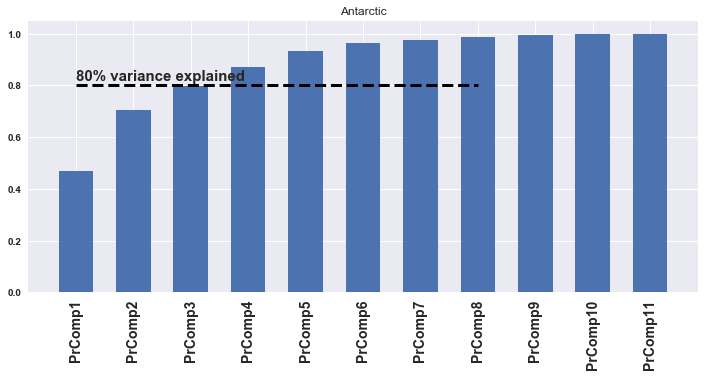

In [284]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var2)+1)],height=cum_explaiend_var2,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.xticks(rotation=90)
plt.title('Antarctic')
plt.savefig('figures/PCA_antarctic_residuals.png')
plt.show()

In [285]:
print(pd.DataFrame(pca2.components_,columns=['PrComp'+str(i) for i in range(1,len(cum_explaiend_var2)+1)],\
                   index = df2_scaled.columns))

                            PrComp1   PrComp2   PrComp3   PrComp4   PrComp5  \
AAO                        0.315140 -0.241249  0.344646 -0.319974  0.184337   
TairAvgAA_resid            0.316028 -0.087726  0.331045 -0.309490  0.260550   
UWNDavgAA_resid           -0.054169  0.271438  0.113543 -0.160852 -0.210995   
VWNDavgAA_resid            0.055597 -0.704334  0.042728 -0.107751 -0.680524   
WNDavgAA_resid            -0.123398  0.536393  0.189449 -0.359287 -0.557971   
SLPavgAA_resid            -0.703062 -0.180159  0.303766 -0.444069  0.263569   
CO2_(ppm)_filled_resid     0.469402  0.124439  0.001846 -0.231574  0.015484   
LandAvgTemp_resid          0.149539  0.054288  0.013518 -0.151818  0.021963   
LandMaxTemp_resid          0.205671  0.143161  0.057624 -0.186820 -0.032486   
LandMinTemp_resid          0.016248  0.071625  0.785680  0.567401 -0.088943   
LandAndOceanAvgTemp_resid  0.000204  0.010305 -0.089144 -0.067410 -0.003602   

                            PrComp6   PrComp7   PrC

# Predictive Modelling
___

## Helping functions

In [359]:
def plotSARIMA(series, model, n_steps,rmse_model=[],savename='',savename2='',region='',variab=''):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    
    data = series.copy()
    data = pd.DataFrame(data)
    print(data.columns)
    data.columns = ['actual']
    print(data.columns)
    data['arima_model'] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data['arima_model'][:s+d] = np.NaN
    
    
    # forecasting on n_steps forward 
    forecast1 = model.predict(start = data.shape[0], end = data.shape[0]+n_steps)
    forecast = data.arima_model.append(forecast1)
    
    # create datetime of propper length
    DatetimeModel = []                           
    for i in range(len(forecast)):
        DatetimeModel.append(dt.date(1978, 11, 1) + relativedelta(months=i))
    DatetimeM = pd.to_datetime(pd.Series(DatetimeModel))
    
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(data['actual'][s+d:], data['arima_model'][s+d:])

    plt.figure(figsize=(15, 7))
    plt.title(region+' '+variab+" Mean Absolute Percentage Error: {0:.2f}%".format(error),fontsize=14)  
    sn.lineplot(DatetimeM,forecast, color='r', label="model")
    
    # if wanted, plot rmse bounds
    if len(rmse_model)>0:
        rmse_model_upper_bound = data.arima_model.copy()#*np.NaN
        rmse_model_lower_bound = data.arima_model.copy()#*np.NaN
        
        rmse_model_lower_bound= rmse_model_lower_bound.append(forecast1-rmse_model[0:len(forecast1)])
        rmse_model_upper_bound= rmse_model_upper_bound.append(rmse_model[0:len(forecast1)]+forecast1)
        plt.fill_between(DatetimeM, rmse_model_upper_bound,rmse_model_lower_bound,facecolor='gray',alpha=0.5)
        
    sn.lineplot(DatetimeM[:len(data.actual)],data.actual, label="actual")
    plt.ylabel('mio sqkm',fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend()
    plt.grid(True);
    
    if len(savename)>0:
        plt.savefig(savename)
        
    # zoom in to predictions
    plt.figure(figsize=(15, 7))
    plt.title(region+' '+variab+' prediction with SARIMA',fontsize=14)  
    sn.lineplot(DatetimeM[len(data.actual)-24:],forecast[len(data.actual)-24:], color='r', label="model")
    
    # if wanted, plot rmse bounds
    if len(rmse_model)>0:
        plt.fill_between(DatetimeM[len(data.actual)-24:], rmse_model_upper_bound[len(data.actual)-24:],\
                         rmse_model_lower_bound[len(data.actual)-24:],facecolor='gray',alpha=0.5)
        
    sn.lineplot(DatetimeM[len(data.actual)-24:len(data.actual)],data.actual[len(data.actual)-24:], label="actual")
   
    plt.ylabel('mio sqkm',fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend()
    plt.grid(True);
    
    if len(savename2)>0:
        plt.savefig(savename2)

Index(['Extent_N'], dtype='object')
Index(['actual'], dtype='object')


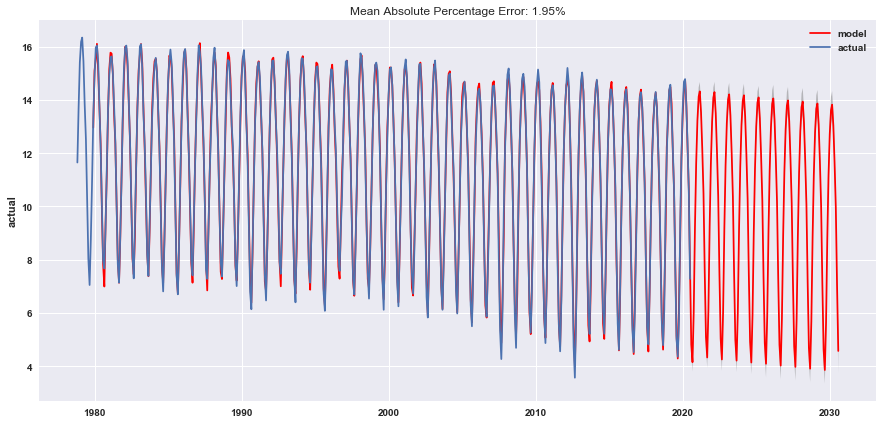

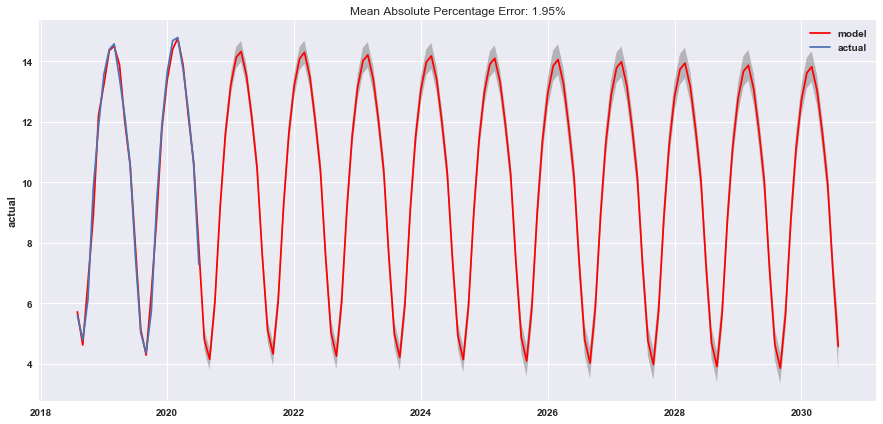

In [287]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh',savefile=None):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        if savefile!=None:
            plt.savefig(savefile)

In [288]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [289]:
def quick_plot(X_trainp,y_trainp,X_testp,y_testp,y_predp,savename=None):
    fig = plt.figure(figsize=(16,9))    
    sn.lineplot(X_trainp,y_trainp,c='g',label='Train')
    sn.lineplot(X_testp,y_predp,c='r',label='Predicted')
    sn.lineplot(X_testp,y_testp,c='b',label='Truth')
    plt.legend()
    txt = 'mean absolute percentage error = %2.2f' %mean_absolute_percentage_error(y_testp,y_predp).round(2)
    plt.text(X_trainp.loc[50],4,txt,fontsize=12)
    print('mean_absolute_percentage_error = ',mean_absolute_percentage_error(y_testp,y_predp).round(2)) 
    if savename != None:
        plt.savefig(savename)

In [290]:
def optimizeSARIMA(data,parameters_list, d, D, s,exog=None,trend=None):
    """
        Return dataframe with parameters and corresponding AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    best_bic = float("inf")
    
    for param in tqdm_notebook(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model=sm.tsa.statespace.SARIMAX(data, exog=exog,order=(param[0], d, param[1]),trend=trend, 
                                            seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        except:
            continue
        bic = model.bic
        # saving best model, AIC and parameters
        if bic < best_bic:
            best_model = model
            best_bic = bic
            best_param = param
        results.append([param, model.bic])
        
    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'bic']
    # sorting in ascending order, the lower BIC is - the better
    result_table = result_table.sort_values(by='bic', ascending=True).reset_index(drop=True)
    
    return result_table

In [291]:
def stats_plots(df_tscv,rmseMod,rmseNaiv,rmseNaivDri,rmseCombi):
    # Fehler plotten
    # a) Monatsweise also wie groupby

    # needs to be improved. used 12 here as I cut first 12 values in walk_foreward
    # need to implements increment, if I make 12 prediction but for every time step again!
    error_stats=['ERRORm', 'ERRORn','ERRORnDri','ERRORcombi']
    # as boxplot
    fig, axes = plt.subplots(2,2,figsize=(16,16))

    for i,j in enumerate(error_stats):
        df_tscv['Month'] = df_tscv['Datetime'].dt.month
        ax = df_tscv.boxplot(column=[j], by='Month',ax=axes.flatten()[i]);
        ax.set_xlabel('')
        ax.set_ylabel(j+' (mio sqkm)',fontsize=12)
        ax.set_title('')
        #axes.set_xticks(range(1,13),months)
        plt.xticks(range(1,13),months,fontsize= 12)
        plt.yticks(fontsize= 12)
    plt.savefig('figures/Models/Monthly_boxplots_trainCV_'+'%3.3d'%n_forecasts+'.png') 

    # as timeseries
    fig = plt.figure(figsize=(16,4))
    plt.plot(df_tscv.Datetime,df_tscv.ERRORm,color='salmon',label='SARIMA')
    plt.plot(df_tscv.Datetime,df_tscv.ERRORn,color='royalblue',label='Naive')
    plt.plot(df_tscv.Datetime,df_tscv.ERRORnDri,color='yellow',label='Naive+Drift')
    plt.plot(df_tscv.Datetime,df_tscv.ERRORcombi,color='green',label='0.5xNaive+0.5*SARIMA Combi')
    #plt.plot(df_tscv.Datetime,df_tscv.ERRORHW,color='cyan',label='Holt-Winters')
    #plt.plot(df_tscv.Datetime,df_tscv.ERRORMM,color='k',label='Multi Model Average')
    plt.legend()
    plt.savefig('figures/Models/TSCV_errors_'+'%3.3d'%n_forecasts+'.png')  
    plt.show()
    
    ## qqplot
    #fig, axes = plt.subplots(1,3,figsize=(16,4))
    residuals = np.array(df_tscv.ERRORm)
    qqplot(residuals,line='r')
    plt.savefig('figures/Models/TSCV_errors_qqplot_'+'%3.3d'%n_forecasts+'.png')
    plt.show()
    
    ## qqplot
    #fig, axes = plt.subplots(1,3,figsize=(16,4))
    residuals = np.array(df_tscv.ERRORcombi)
    qqplot(residuals,line='r')
    plt.savefig('figures/Models/TSCV_errors_qqplot_Combi_Naive_ARIMA'+'%3.3d'%n_forecasts+'.png')
    plt.show()
    
     ## qqplot
    #fig, axes = plt.subplots(1,3,figsize=(16,4))
    #residuals = np.array(df_tscv.ERRORHW)
    #qqplot(residuals,line='r')
    #plt.savefig('figures/Models/TSCV_errors_qqplot_HW'+'%3.3d'%n_forecasts+'.png')
    #plt.show()
    
    # Autocorrelation plots
    for i,j in enumerate(error_stats): 
        tsplot(df_tscv[j], lags=20,savefile='figures/Models/tsplot_'+j+'_%3.3d'%n_forecasts+'.png')
        result = adfuller(df_tscv[j])
        print(j,':')
        print('ADF stats: %f' %result[0])
        print('p-value: %f' %result[1])
        print('Critical values:')
        for key,value in result[4].items():
            print('\t%s: %.3f' %(key,value))
    
    
    # Thiels U plot naive
    THU = [rmseMod[i]/rmseNaiv[i] for i in range(len(rmseMod))]
    fig = plt.figure(figsize=(16,4))
    plt.plot(range(len(THU)),THU,color='green')
    plt.savefig('figures/Models/TheilsU_'+'%3.3d'%n_forecasts+'.png')  
    plt.show()
    print('Thiels U ARIMA/Naive Season: ',np.mean(THU))
    
    # Thiels U plot naive drift
    THU = [rmseMod[i]/rmseNaivDri[i] for i in range(len(rmseMod))]
    fig = plt.figure(figsize=(16,4))
    plt.plot(range(len(THU)),THU,color='green')
    plt.savefig('figures/Models/TheilsU_Drift_'+'%3.3d'%n_forecasts+'.png')  
    plt.show()
    print('Thiels U ARIMA/Naive Season+Drift: ',np.mean(THU))
    
    # Thiels U plot Combi model
    THU = [rmseCombi[i]/rmseNaiv[i] for i in range(len(rmseMod))]
    fig = plt.figure(figsize=(16,4))
    plt.plot(range(len(THU)),THU,color='green')
    plt.savefig('figures/Models/TheilsU_Combi_'+'%3.3d'%n_forecasts+'.png')  
    plt.show()
    print('Thiels U Combi/Naive Season: ',np.mean(THU))
    
      # Thiels U plot HoltWInters
    #THU = [rmseHW[i]/rmseNaiv[i] for i in range(len(rmseMod))]
    #fig = plt.figure(figsize=(16,4))
    #plt.plot(range(len(THU)),THU,color='green')
    #plt.savefig('figures/Models/TheilsU_HW_'+'%3.3d'%n_forecasts+'.png')  
   # plt.show()
    #print('Thiels U HW/Naive: ',np.mean(THU))
    
          # Thiels U plot Combi model
   # THU = [rmseMM[i]/rmseNaiv[i] for i in range(len(rmseMod))]
   # fig = plt.figure(figsize=(16,4))
   # plt.plot(range(len(THU)),THU,color='green')
   # plt.savefig('figures/Models/TheilsU_Drift_'+'%3.3d'%n_forecasts+'.png')  
   # plt.show()
   # print('Thiels U Multi MOdel/Naive: ',np.mean(THU))
    
    #Diebold MAriano test
   # for i in error_stats:
    #    rt = dm_test(df_tscv.Testdata,df_tscv[i],df_tscv.ERRORn)
    #    print('DM of',i,'is: ', rt[0].round(3),' with p = ',rt[1].round(5))

## Split data

In [292]:
# anpassen da ich keinen Datasplit machen will -> brauche ich ier noch weil basemodels darauf hin angepasst waren

In [293]:
X_train, X_test,y_train,y_test = timeseries_train_test_split(SIE_Mon[['Datetime','Month']],\
                                                SIE_Mon,test_size=0.25)
y_train.drop(['Datetime','Month'],axis=1,inplace=True)
y_test.drop(['Datetime','Month'],axis=1,inplace=True)

num      = len(y_test)
num2     = len(y_train)
print(num,num2)

126 375


## Base models

### Prediction using value of 1 month before
**Train data**

mean_absolute_percentage_error =  14.57


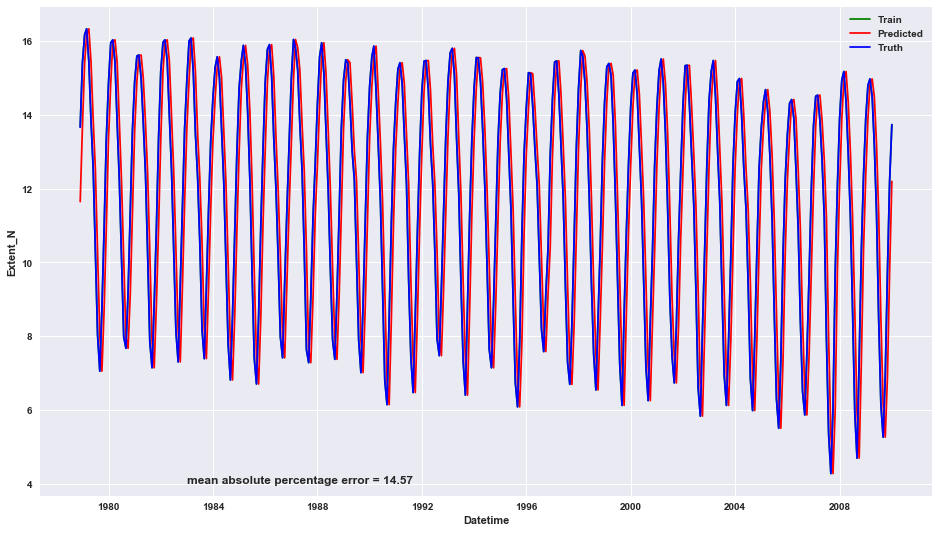

In [294]:
y_pred    = y_train.SIE_lag1.loc[1:] 
X_trainad = X_train.Datetime.loc[1:]
y_trainad = y_train.Extent_N.loc[1:]
quick_plot(X_trainad,y_trainad,X_trainad, y_trainad,y_pred,'figures/Models/Naive_lag1_train.png')

**Test data**

mean_absolute_percentage_error =  19.1


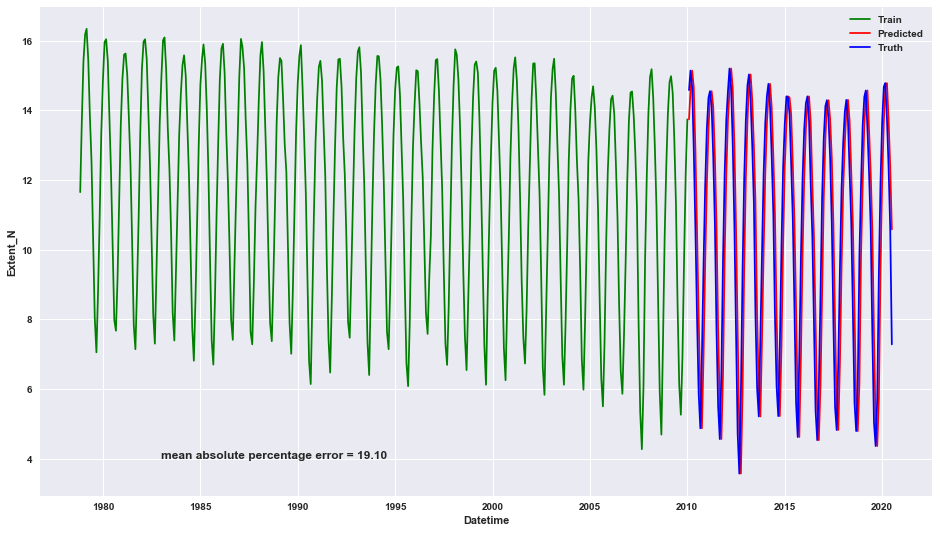

In [295]:
y_pred = y_test.SIE_lag1 
quick_plot(X_train.Datetime,y_train.Extent_N,X_test.Datetime,\
           y_test.Extent_N,y_pred,'figures/Models/Naive_lag1.png')

### Use overall mean value

mean_absolute_percentage_error =  27.37


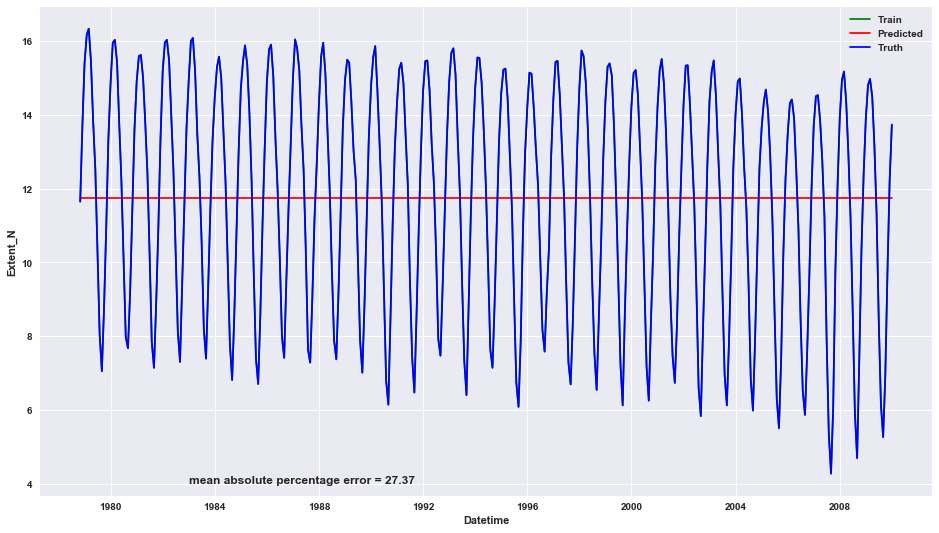

In [296]:
y_pred = [y_train.Extent_N.mean() for _ in range(num2)]
quick_plot(X_train.Datetime,y_train.Extent_N,X_train.Datetime,y_train.Extent_N,y_pred,\
           'figures/Models/Naive_mean_train.png')

In [297]:
y_pred = [y_train.Extent_N.mean() for _ in range(num)]
#quick_plot(X_train.Datetime,y_train.Extent_N,X_test.Datetime,y_test.Extent_N,y_pred,\
#           'figures/Models/Naive_mean.png')
print('mean_absolute_percentage_error test data = ',mean_absolute_percentage_error(y_test.Extent_N,y_pred).round(2)) 

mean_absolute_percentage_error test data =  41.0


### Prediction using value of 12 month ago

mean_absolute_percentage_error =  3.52


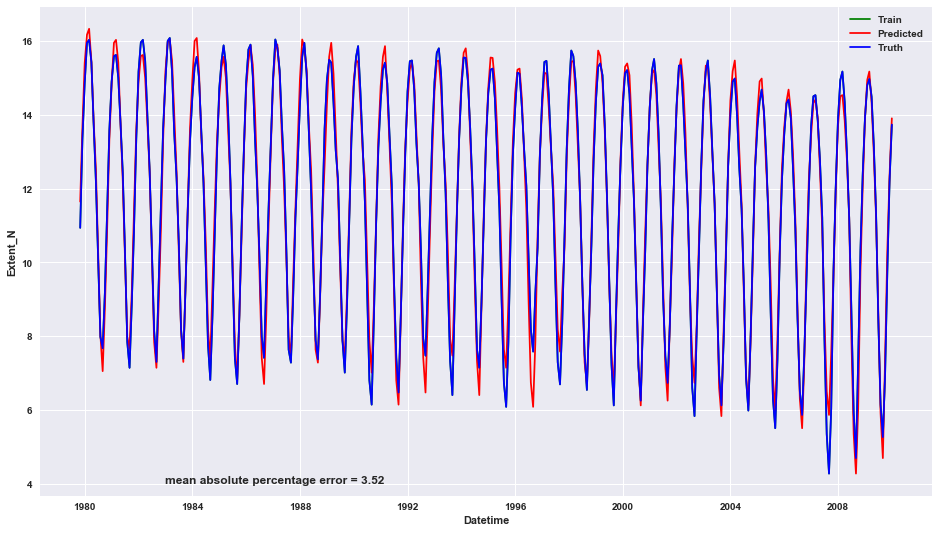

In [298]:
y_pred    = y_train.SIE_lag12.loc[12:] 
X_trainad = X_train.Datetime.loc[12:]
y_trainad = y_train.Extent_N.loc[12:]
quick_plot(X_trainad,y_trainad,X_trainad, y_trainad,y_pred,'figures/Models/Naive_lag12_train.png')

In [299]:
y_pred = y_test.SIE_lag12 
#quick_plot(X_train.Datetime,y_train.Extent_N,X_test.Datetime.loc[12:],\
#           y_test.Extent_N.loc[12:],y_pred,'figures/Models/Naive_lag12.png')
print('mean_absolute_percentage_error test data = ',mean_absolute_percentage_error(y_test.Extent_N,y_pred).round(2))

mean_absolute_percentage_error test data =  4.04


**Walk foreward evaluation of lag12 month approach**

Min:  0.0  Max:  37.24  Mean:  3.67
Min:  0.0  Max:  1.59  Mean:  0.35


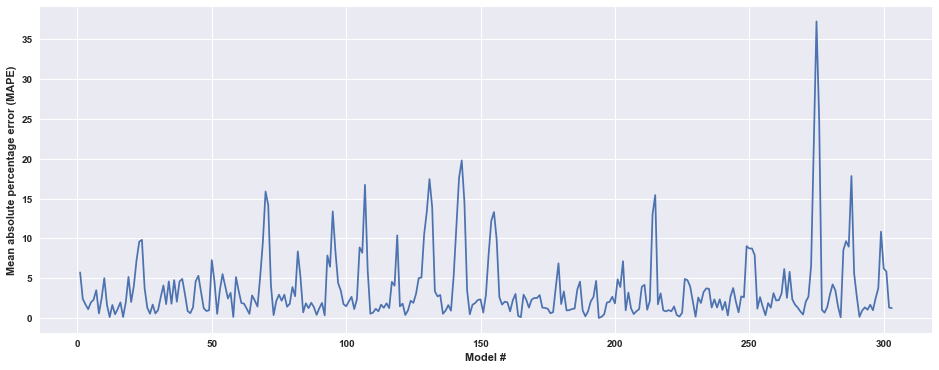

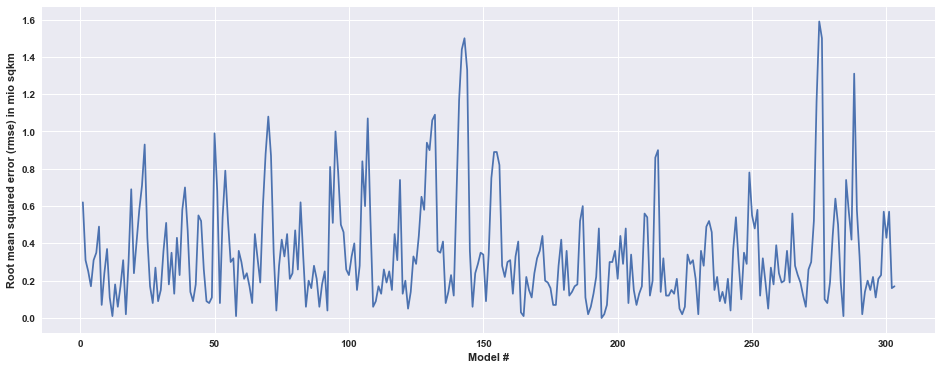

In [300]:
# skip first year as we do not have "predictions"
X       = X_train.Datetime.loc[12:] 
y       = y_train[['Extent_N','SIE_lag12']].loc[12:] 
# define initial (minimum) length of first train set, here 5 years
n_train = 60
n_records = len(X)
mape = []
rmse = []
error = []
for i in range(n_train,n_records):
    xtrain,ytrain,xtest,ytest = X[0:i],y[0:i],X[i:i+1],y[i:i+1]
    mape.append(mean_absolute_percentage_error(ytest.Extent_N,ytest.SIE_lag12))
    rmse.append(np.sqrt(mean_squared_error(ytest.Extent_N,ytest.SIE_lag12)))
    error.append(np.mean(ytest.Extent_N-ytest.SIE_lag12))
print('Min: ',min(mape).round(2),' Max: ' , max(mape).round(2),' Mean: ',np.mean(mape).round(2))
print('Min: ',min(rmse).round(2),' Max: ' , max(rmse).round(2),' Mean: ',np.mean(rmse).round(2))
plt.figure(figsize=(16,6))
plt.plot(range(1,len(mape)+1),mape)
plt.xlabel('Model #')
plt.ylabel('Mean absolute percentage error (MAPE)');
plt.savefig('figures/Models/SIE25_lag12_train_mape_ts.png')

plt.figure(figsize=(16,6))
plt.plot(range(1,len(rmse)+1),rmse)
plt.xlabel('Model #')
plt.ylabel('Root mean squared error (rmse) in mio sqkm');
plt.savefig('figures/Models/SIE25_lag12_train_rmse_ts.png')

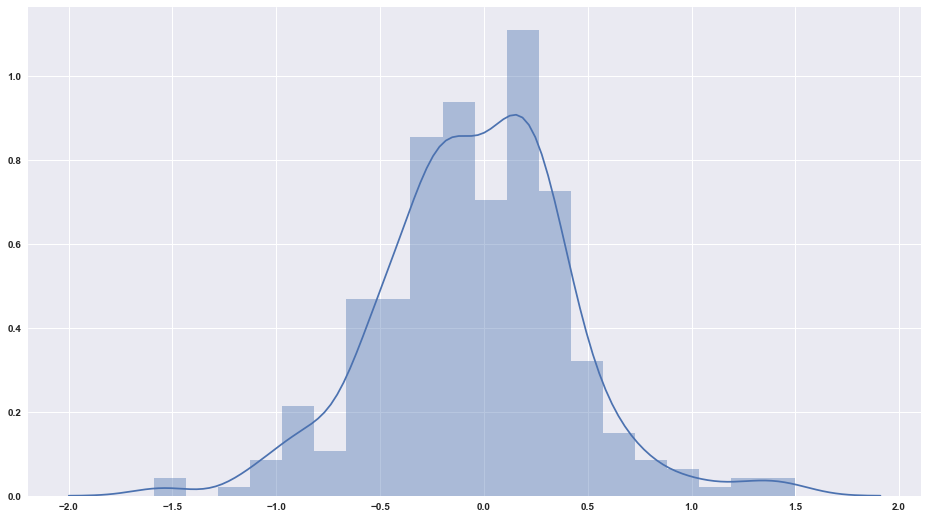

In [301]:
sn.distplot(error)
plt.savefig('figures/Models/SIE25_lag12_train_error_distplot.png')

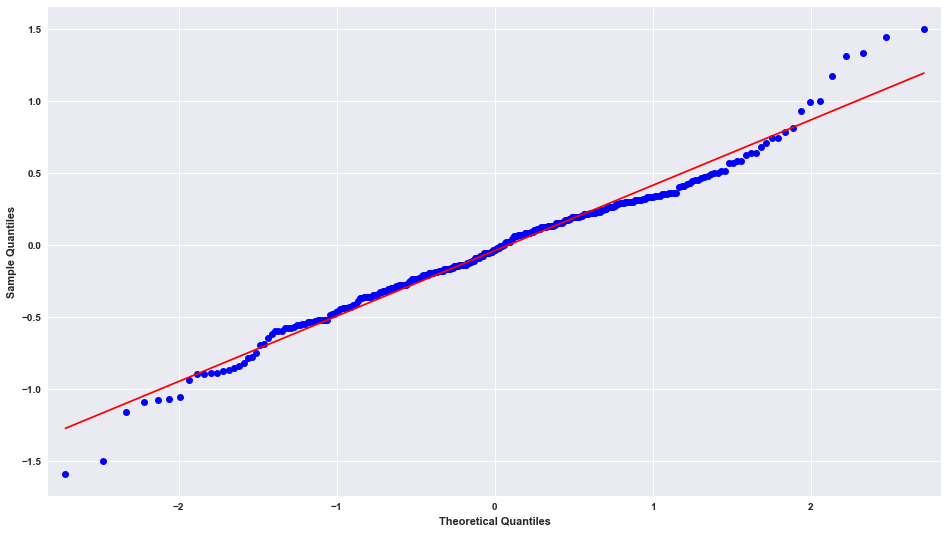

In [302]:
residuals = np.array(error)
qqplot(residuals,line='r')
plt.savefig('figures/Models/SIE25_lag12_train_qqplot_error.png')
plt.show()

ADF stats: -4.705044
p-value: 0.000082
Critical values:
	1%: -3.453
	5%: -2.872
	10%: -2.572


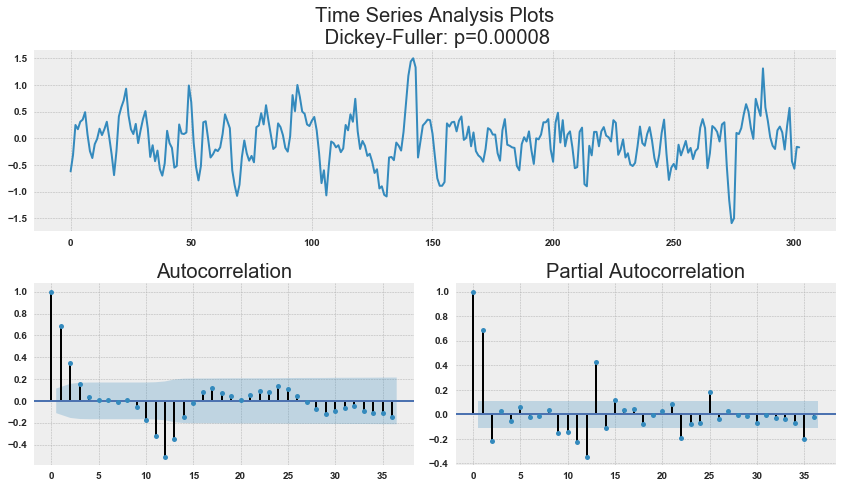

In [303]:
tsplot(error, lags=36)
result = adfuller(error)
print('ADF stats: %f' %result[0])
print('p-value: %f' %result[1])
print('Critical values:')
for key,value in result[4].items():
    print('\t%s: %.3f' %(key,value))
    #Frage: sollte ich die Daten anders beahndeln?

In [304]:
y.describe()

,Extent_N,SIE_lag12
count,363.000000,363.000000
mean,11.715372,11.764793
std,3.089436,3.079782
min,4.270000,4.270000
25%,9.145000,9.170000
50%,12.300000,12.430000
75%,14.505000,14.525000
max,16.090000,16.340000


**Comment:**
* maximum rmse is half as high as SIE sdev
* mean rmse is 1/10 of SIE sdev
* residuals are nearly normally distributed

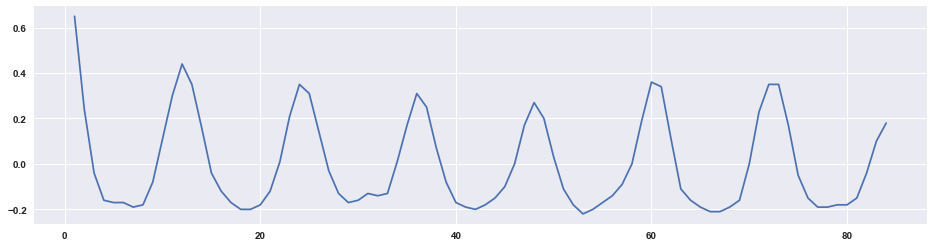

In [305]:
lags = 12*7   # 12 month * 7 years
var  = pd.Series(mape)
df2   = pd.DataFrame()
corrShift = []

for i in range(1,lags+1):
    label = 'lag_' + str(i)
    df2[label] = var.shift(i)
    corrShift.append(df2[label].corr(var).round(2))

plt.figure(figsize=(16,4))    
plt.plot(range(1,lags+1),corrShift)
#df.tail()

0.6452786949908015
0.24091209849248843
-0.039963515939497776
-0.15846271607842832
-0.17316773833567084
-0.17058311677161447
-0.19169508812572986
-0.17625618121197276
-0.07807190529967904
0.10525624699259456
0.299105408567488
0.43668988616364157
0.3477784992509876
0.1569656277007351
-0.03504710700441194
-0.1161805577459084
-0.16744846133353616
-0.19650426053121262
-0.20481040908403658
-0.175983468861578
-0.11982665111208722
0.008826630904903146
0.20750358603863592
0.3468093222411986


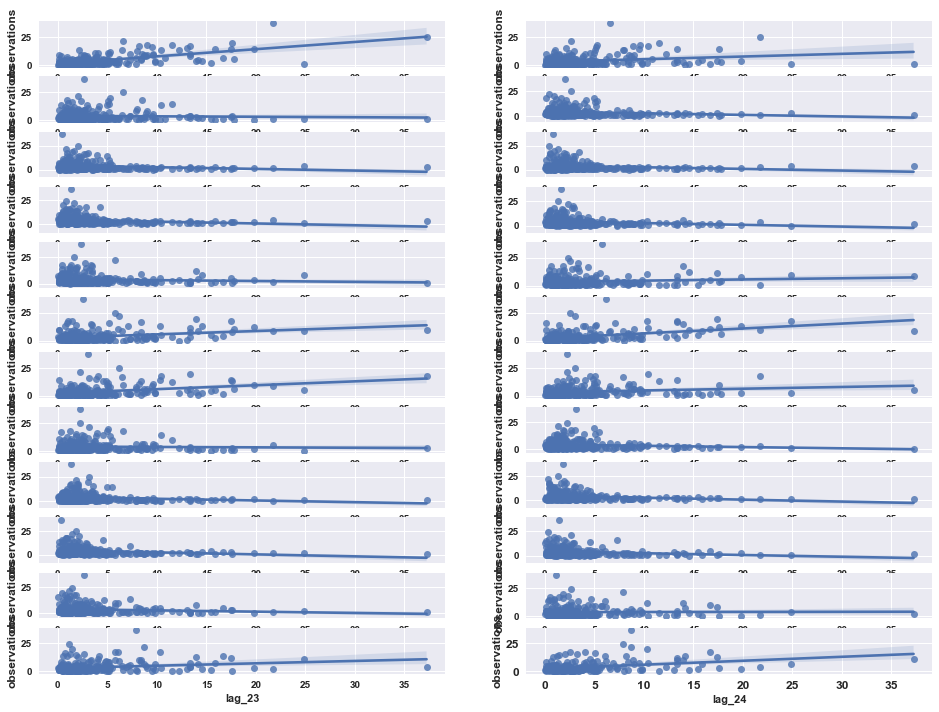

In [306]:
fix,axes = plt.subplots(12,2,figsize=(16,12))

for i,j in enumerate(range(1,25)):
    label = 'lag_' + str(j)
    ax = sn.regplot(x=df2[label],y=var,ax=axes.flatten()[i])
    print(df2[label].corr(var))
    ax.set_xlabel(label)
    ax.set_ylabel('observations',fontsize=12)
    ax.set_title('')
    plt.xticks(fontsize= 12)
    plt.yticks(fontsize= 12)
    #sn.regplot(x='Extent_N', y='Extent_S', data=SIE_Mon,label='Extent')

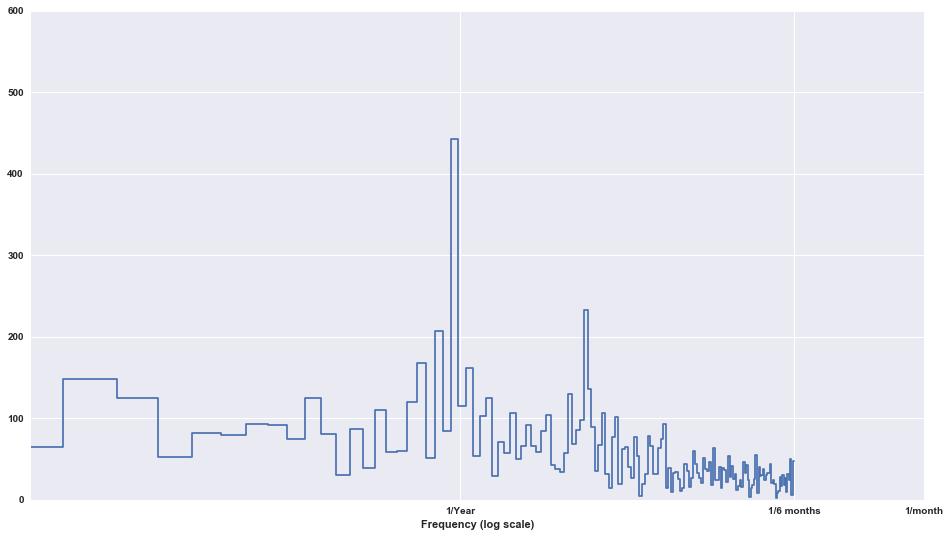

In [307]:
# Überlegen wie ich das interpretieren kann....
fft = tf.signal.rfft(mape)
f_per_dataset = np.arange(0, len(fft))

n_samples_h = len(mape)
month_per_year = 12
years_per_dataset = n_samples_h/(month_per_year)

f_per_year = f_per_dataset/years_per_dataset
plt.step(f_per_year, np.abs(fft))
plt.xscale('log')
plt.ylim(0, 600)
plt.xlim([0.1, max(plt.xlim())])
plt.xticks([1, 6, 12], labels=['1/Year','1/6 months', '1/month'])
_ = plt.xlabel('Frequency (log scale)')

### Prediction using values of 36 month ago

mean_absolute_percentage_error =  3.93


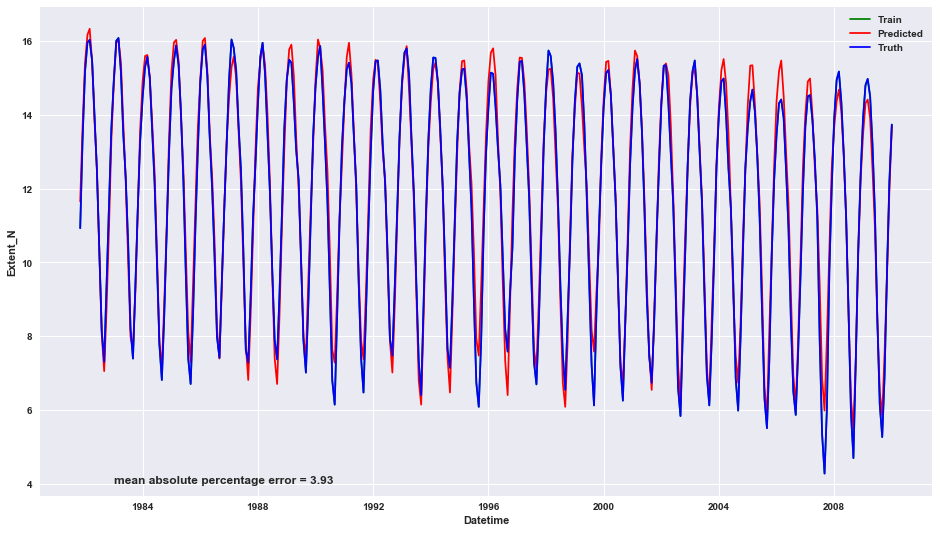

In [308]:
y_pred    = y_train.SIE_lag36.loc[36:] 
X_trainad = X_train.Datetime.loc[36:]
y_trainad = y_train.Extent_N.loc[36:]
quick_plot(X_trainad,y_trainad,X_trainad, y_trainad,y_pred,'figures/Models/Naive_lag36_train.png')

### Holt-Winters

In [309]:
class HoltWinters:
    
    """
    Holt-Winters model with the anomalies detection using Brutlag method
    
    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)
    
    """
    
    
    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor
        
        
    def initial_trend(self):
        sum = 0.0
        for i in range(self.slen):
            sum += float(self.series[i+self.slen] - self.series[i]) / self.slen
        return sum / self.slen  
    
    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series)/self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(sum(self.series[self.slen*j:self.slen*j+self.slen])/float(self.slen))
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += self.series[self.slen*j+i]-season_averages[j]
            seasonals[i] = sum_of_vals_over_avg/n_seasons
        return seasonals   

          
    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBond = []
        self.LowerBond = []
        
        seasonals = self.initial_seasonal_components()
        
        for i in range(len(self.series)+self.n_preds):
            if i == 0: # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i%self.slen])
                
                self.PredictedDeviation.append(0)
                
                self.UpperBond.append(self.result[0] + 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                
                self.LowerBond.append(self.result[0] - 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                continue
                
            if i >= len(self.series): # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m*trend) + seasonals[i%self.slen])
                
                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1]*1.01) 
                
            else:
                val = self.series[i]
                last_smooth, smooth = smooth, self.alpha*(val-seasonals[i%self.slen]) + (1-self.alpha)*(smooth+trend)
                trend = self.beta * (smooth-last_smooth) + (1-self.beta)*trend
                seasonals[i%self.slen] = self.gamma*(val-smooth) + (1-self.gamma)*seasonals[i%self.slen]
                self.result.append(smooth+trend+seasonals[i%self.slen])
                
                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(self.gamma * np.abs(self.series[i] - self.result[i]) 
                                               + (1-self.gamma)*self.PredictedDeviation[-1])
                     
            self.UpperBond.append(self.result[-1] + 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.LowerBond.append(self.result[-1] - 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i%self.slen])

In [310]:
def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=12):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):

        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(predictions, actual)
        errors.append(error)
        
    return np.mean(np.array(errors))

In [311]:
def plotHoltWinters(series, plot_intervals=False, plot_anomalies=False):
    """
        series - dataset with timeseries
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    
    plt.figure(figsize=(20, 10))
    plt.plot(model.result, label = "Model")
    plt.plot(series.values, label = "Actual")
    error = mean_absolute_percentage_error(series.values, model.result[:len(series)])
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    
    if plot_anomalies:
        anomalies = np.array([np.NaN]*len(series))
        anomalies[series.values<model.LowerBond[:len(series)]] = \
            series.values[series.values<model.LowerBond[:len(series)]]
        anomalies[series.values>model.UpperBond[:len(series)]] = \
            series.values[series.values>model.UpperBond[:len(series)]]
        plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    if plot_intervals:
        plt.plot(model.UpperBond, "r--", alpha=0.5, label = "Up/Low confidence")
        plt.plot(model.LowerBond, "r--", alpha=0.5)
        plt.fill_between(x=range(0,len(model.result)), y1=model.UpperBond, 
                         y2=model.LowerBond, alpha=0.2, color = "grey")    
        
    plt.vlines(len(series), ymin=min(model.LowerBond), ymax=max(model.UpperBond), linestyles='dashed')
    plt.axvspan(len(series)-20, len(model.result), alpha=0.3, color='lightgrey')
    plt.grid(True)
    plt.axis('tight')
    plt.legend(loc="best", fontsize=13);

In [312]:
%%time
data = y_train.Extent_N[:-36] # leave some data for testing

# initializing model parameters alpha, beta and gamma
x = [0, 0, 0] 

# Minimizing the loss function 
opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_squared_log_error), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...and train the model with them, forecasting for the next 50 hours
model = HoltWinters(data, slen = 12, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 120, scaling_factor = 3)
model.triple_exponential_smoothing()

0.03413480324375351 0.01980218310445231 0.0
CPU times: user 1.48 s, sys: 14 ms, total: 1.49 s
Wall time: 1.59 s


In [313]:
print(len(model.result))
len(y_train.Extent_N[:-36])

459


339

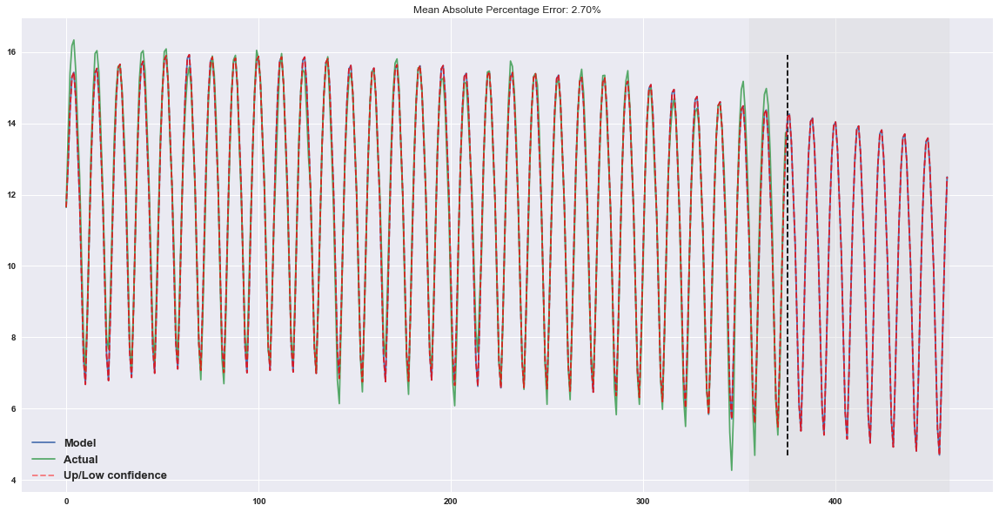

In [314]:
plotHoltWinters(y_train.Extent_N,plot_intervals=True)

### Further tests
**Moving average**

In [315]:
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):

    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 

    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(15,5))
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series<lower_bond] = series[series<lower_bond]
            anomalies[series>upper_bond] = series[series>upper_bond]
            plt.plot(anomalies, "ro", markersize=10)
        
    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)

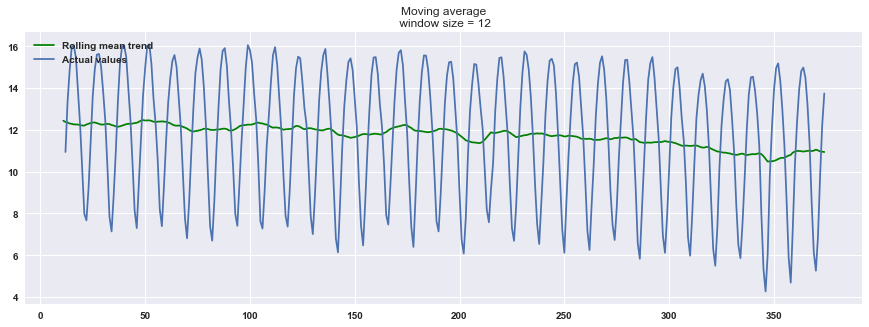

In [316]:
plotMovingAverage(y_train.Extent_N, 12, plot_anomalies=True) 

**Random walk**

**Naive approach with seasonality - last years season**

mean_absolute_percentage_error =  5.7


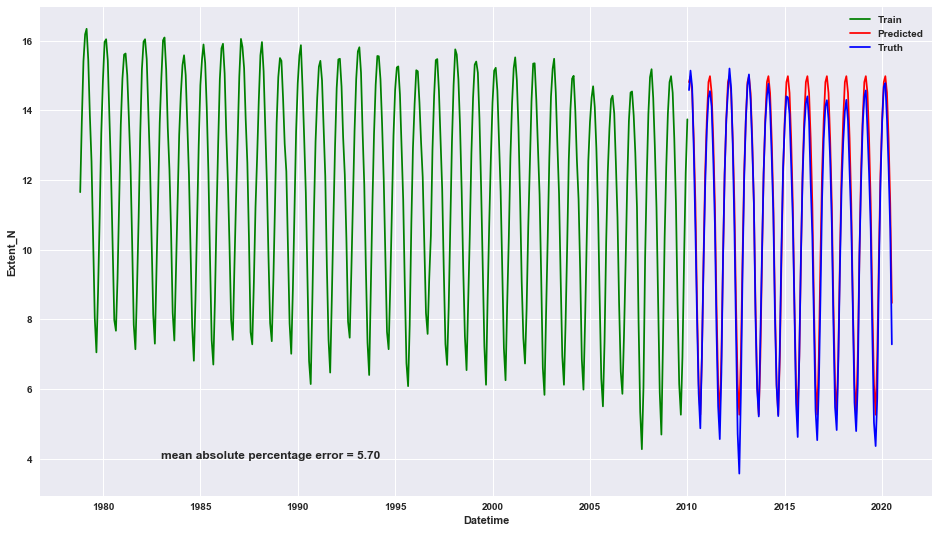

In [317]:
lastM  = list(y_train.Extent_N[-12:])
y_pred =[]
for j in range(num):
    act_val  = lastM[-12]
    y_pred.append(act_val)
    lastM.append(act_val)
quick_plot(X_train.Datetime,y_train.Extent_N,X_test.Datetime,y_test.Extent_N,y_pred,\
           'figures/Models/Naive_season.png')

**Naive approach with seasonality - averaged season**

In [318]:
SeasCyclex = y_train.groupby(X_train['Month']).mean()

mean_absolute_percentage_error =  22.61


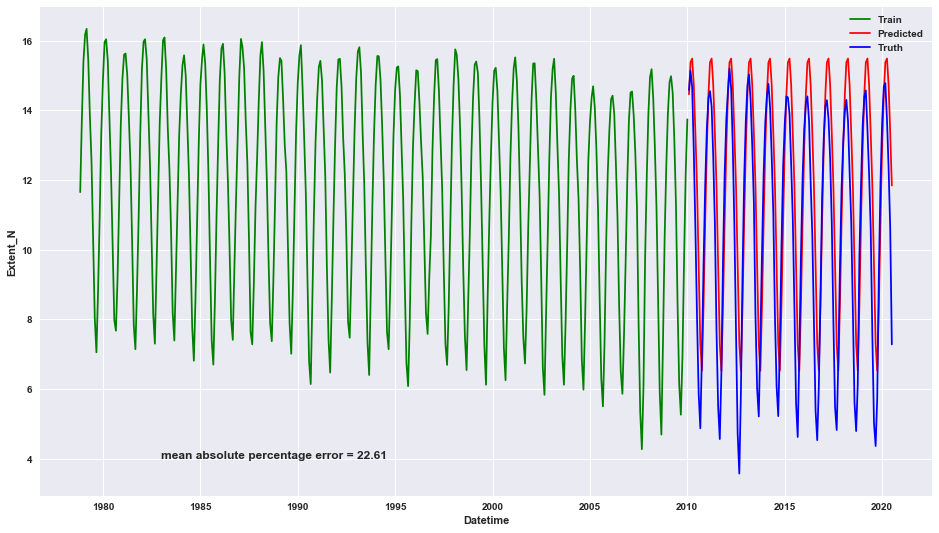

In [319]:
#Achtung, das funktioniert hier nur weil die test daten Anfang des Jahres beginnen!
# hier muss was anderes indikatives für den seasonal cycle hin
lastM  = list(SeasCyclex.Extent_N)
y_pred =[]
for j in range(num):
    act_val  = lastM[-12]
    y_pred.append(act_val)
    lastM.append(act_val)
quick_plot(X_train.Datetime,y_train.Extent_N,X_test.Datetime,y_test.Extent_N,y_pred)

**Naive approach with seasonality and trend**

mean_absolute_percentage_error =  4.04


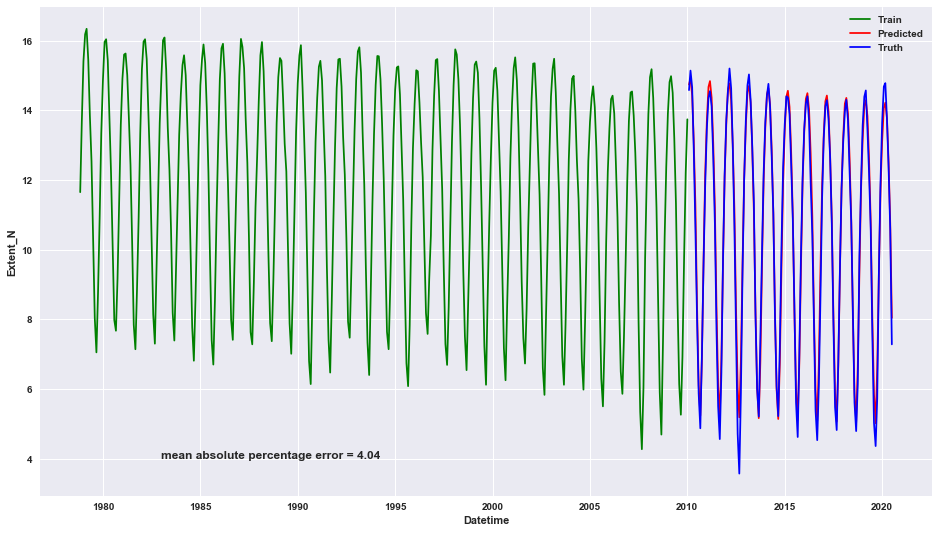

In [320]:
lreg = np.poly1d(np.polyfit(np.arange(num2),y_train['Extent_N'],1))
trend = lreg.c[0]

lastM  = list(y_train.Extent_N[-12:])
y_pred =[]
for j in range(num):
    act_val  = lastM[-12]
    #print(act_val,act_val+act_val*12*trend)
    y_pred.append(act_val+act_val*trend)
    lastM.append(act_val+act_val*trend)
quick_plot(X_train.Datetime,y_train.Extent_N,X_test.Datetime,y_test.Extent_N,y_pred,\
           'figures/Models/Naive_season_trend.png')

## SARIMA

### Identify likely parameters

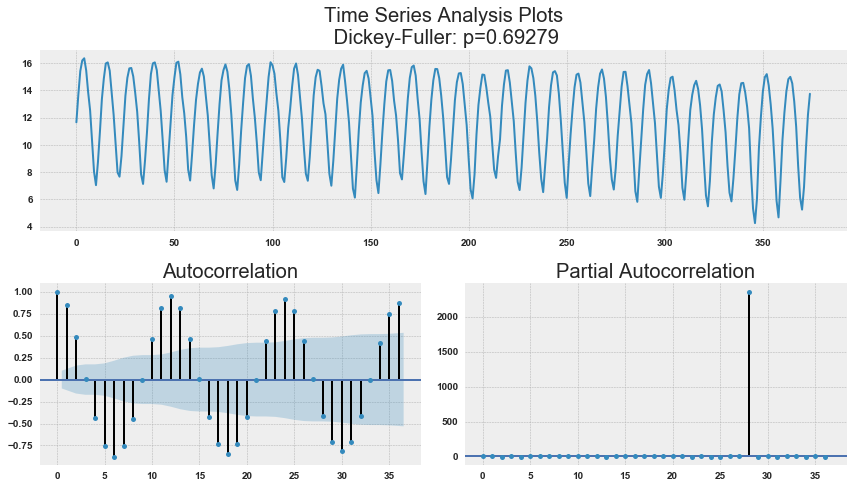

In [443]:
tsplot(y_train.Extent_N, lags=36)

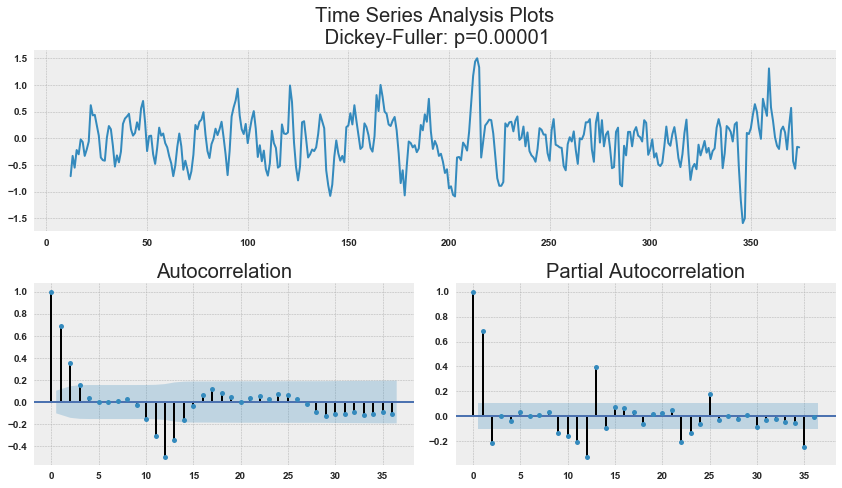

In [444]:
diffseas = y_train.Extent_N - y_train.Extent_N.shift(12)
tsplot(diffseas[12:], lags=36)

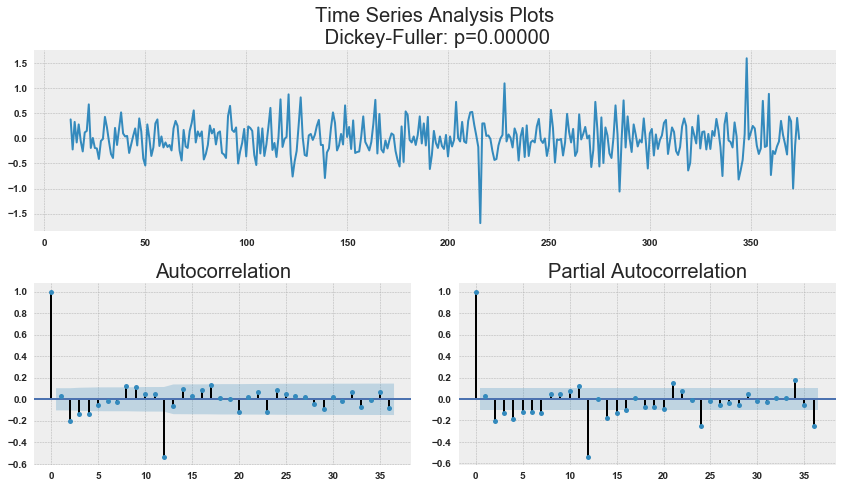

In [445]:
diff = diffseas - diffseas.shift(1)
tsplot(diff[12+1:], lags=36)

### Model evaluation

In [349]:
# Achtung, habe noch nicht entschieden wie ich mit den ersten nn einträgen umgehe!
    
def walk_foreward_evaluation(Xo,yo,n_train,parameters_list,d, D, s, nn=1,steps=12,exog=None,trend=None):
    '''
        Xo       : X Achses of data set, e.g. time or index variable
        yo       : target variable
        n_train  : minimum inital length of train data set
        parameters_list : list of parameters for optimization
        d,D,s    : parameters for SARIMA optimization
        nn       : prediction length, default is nn = 1
        steps    : walking foreward steps
    '''
    
    # initialize variables
    
    mapem,mapen,mapenDri,mapeCombi  = [],[],[],[]
    rmsem,rmsen,rmsenDri,rmseCombi  = [],[],[],[]
    errorm,errorn,errornDri,errorCombi = pd.Series(),pd.Series(),pd.Series(),pd.Series()
    pred_dt,spredm,spredn,sprednDri    = pd.Series(),pd.Series(),pd.Series(),pd.Series()
    spredCombi,stest                   = pd.Series(),pd.Series()
    results_bBic  = []
    
    X             = Xo.loc[12:] 
    y             = yo.loc[12:]
    try:
        exo       = exog.loc[12:]
    except:
        exogen    = exog
    n_records     = len(X)-nn-steps  # ist nicht optimal gelöst glaube ich, nochmal drüber nachdenken
    #n_records     = 124
    count         = 1
    df_cols       = ['Datetime','ERRORm','ERRORn','ERRORnDri','ERRORcombi',\
                     'Prediction_Model','Predition_Naive',\
                     'Predition_NaiveDrift','Predition_Combi',\
                     'Testdata']
    
    # iterate through time series with increasing amount of train data
    for i in range(n_train,n_records,steps):
        
        xtrain,ytrain,xtest,ytest = X[0:i],y[0:i],X[i:i+nn],y[i:i+nn]
        try:
            exogen    = exo[0:i]
        except:
            pass
        
        #print(count)
        
        # walk foreward evaluation for advanced model
        result_tab = optimizeSARIMA(ytrain,parameters_list, d, D, s,exog=exogen)
        p, q, P, Q = result_tab.parameters[0]
        results_bBic.append(result_tab.parameters[0])
        best_model = sm.tsa.statespace.SARIMAX(ytrain,exog=exogen, order=(p, d, q),trend=trend, 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
        predm      = best_model.predict(start=i,end=i+nn-1)
        #plt.plot(xtest,predm,'r+', label='model')
        
        mapem.append(mean_absolute_percentage_error(ytest,predm))
        rmsem.append(np.sqrt(mean_squared_error(ytest,predm)))
        
        #print('errorcals')
        # point-wise errors for each prediction horizon
        errorm = errorm.append(ytest-predm)
        spredm = spredm.append(predm)
        stest  = stest.append(ytest)
        
        #print('errorcals naive 1')
        # walk foreward evaluation for naive model with season only and with drift
        drift      = np.mean(yo-yo.shift(12).loc[12:])
        yoNaive    = yo.shift(12).loc[12:] 
        yoNaiveDri = yo.shift(12).loc[12:]+drift
        #prüfen ob der shift hier richtig ist!!!
        predn      = yoNaive[i:i+nn]
        prednDri   = yoNaiveDri[i:i+nn]
        #plt.plot(xtest,predn,'g-', label='naive model')
        
        #print('errorcals naive 2')
        #Naive model season only
        mapen.append(mean_absolute_percentage_error(ytest,predn))
        rmsen.append(np.sqrt(mean_squared_error(ytest,predn)))
        errorn = errorn.append(ytest-predn)
        spredn = spredn.append(predn)
        
        #Naive model with drift
        mapenDri.append(mean_absolute_percentage_error(ytest,prednDri))
        rmsenDri.append(np.sqrt(mean_squared_error(ytest,prednDri)))
        errornDri = errornDri.append(ytest-prednDri)
        sprednDri = sprednDri.append(prednDri)
        
        #combine naive Season only and ARIMA 
        predCombi = 0.5*predn + 0.5*predm
        mapeCombi.append(mean_absolute_percentage_error(ytest,predCombi))
        rmseCombi.append(np.sqrt(mean_squared_error(ytest,predCombi)))
        errorCombi = errorCombi.append(ytest-predCombi)
        spredCombi = spredCombi.append(predCombi)
        
        
        # Holt-Winters
        # initializing model parameters alpha, beta and gamma
        #xHW = [0, 0, 0] 

        # Minimizing the loss function 
        #opt = minimize(timeseriesCVscore, x0=xHW, 
        #       args=(ytrain, mean_squared_log_error), 
        #       method="TNC", bounds = ((0, 1), (0, 1), (0, 1)))

        # Take optimal values...
       # alpha_final, beta_final, gamma_final = opt.x
        #print(alpha_final, beta_final, gamma_final)

        # ...and train the model with them, forecasting for the next 50 hours
       # modelHW = HoltWinters(data, slen = 12, 
        #            alpha = alpha_final, beta = beta_final, gamma = gamma_final, 
       #             n_preds = nn, scaling_factor = 3)
        #modelHW.triple_exponential_smoothing()
        #predHW  = modelHW.result[-nn:]
       # mapeHW.append(mean_absolute_percentage_error(ytest,predHW))
       # rmseHW.append(np.sqrt(mean_squared_error(ytest,predHW)))
        #errorHW = errorHW.append(ytest-predHW)
       # spredHW = spredHW.append(predHW+ytest-ytest)
        
        
        # Multi model forecast
       # predMM  = (predm+predn+prednDri+predHW)/4.0
       # mapeMM.append(mean_absolute_percentage_error(ytest,predMM))
       # rmseMM.append(np.sqrt(mean_squared_error(ytest,predMM)))
       # errorMM = errorMM.append(ytest-predMM)
       # spredMM = spredMM.append(predMM)
        
        
        pred_dt= pred_dt.append(xtest)
        
        if count%10 == 0:
            print(str(count)+"s iteration done")
        count += 1
    #THU     = rmsem/rmsen
    #print(sum(rmsem)/sum(rmsen),mean(THU))
    nameH   = 'data/CV_Horizon'+'%3.3d'%nn 

    # data frame with errorsvfor each time step 
    df_tscv = pd.concat([pred_dt,errorm,errorn,errornDri,errorCombi,\
                         spredm,spredn,sprednDri,spredCombi,stest],axis=1, ignore_index=False)
    df_tscv.columns = df_cols
    
    
    
    stats_plots(df_tscv,rmsem,rmsen,rmsenDri,rmseCombi)
    
    # convert mape,rmse to data frame
    df_dict = {'MapeM':mapem,'MapeN':mapen,'MapeDri':mapenDri,
               'MapeCombi':mapeCombi,
               'RMSEM':rmsem,'RMSEN':rmsen,'RMSEDri':rmsenDri,
               'RMSECombi':rmseCombi}
    dfObj   = pd.DataFrame(df_dict, columns=['MapeM','MapeN','MapeDri','MapeCombi',\
                                            'RMSEM','RMSEN','RMSEDri','RMSECombi'])
    
    filename = nameH+'_errorStats.csv'
    df_tscv.to_csv(filename, index=False)
    
    filename = nameH+'_rmseStats.csv'
    dfObj.to_csv(filename, index=False)
    
    return df_tscv,dfObj,result_tab

In [313]:
# setting initial values and some bounds for them
ps = range(1,4) #range(6, 11) #10-14 first run
d  = 1 
qs = range(1, 3)  #2-5 fr
Ps = range(1, 3)  #1-3
D  = 1 
Qs = range(2,4)  #2-8 #1,5
s = 12 # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

24


10s iteration done



20s iteration done



30s iteration done


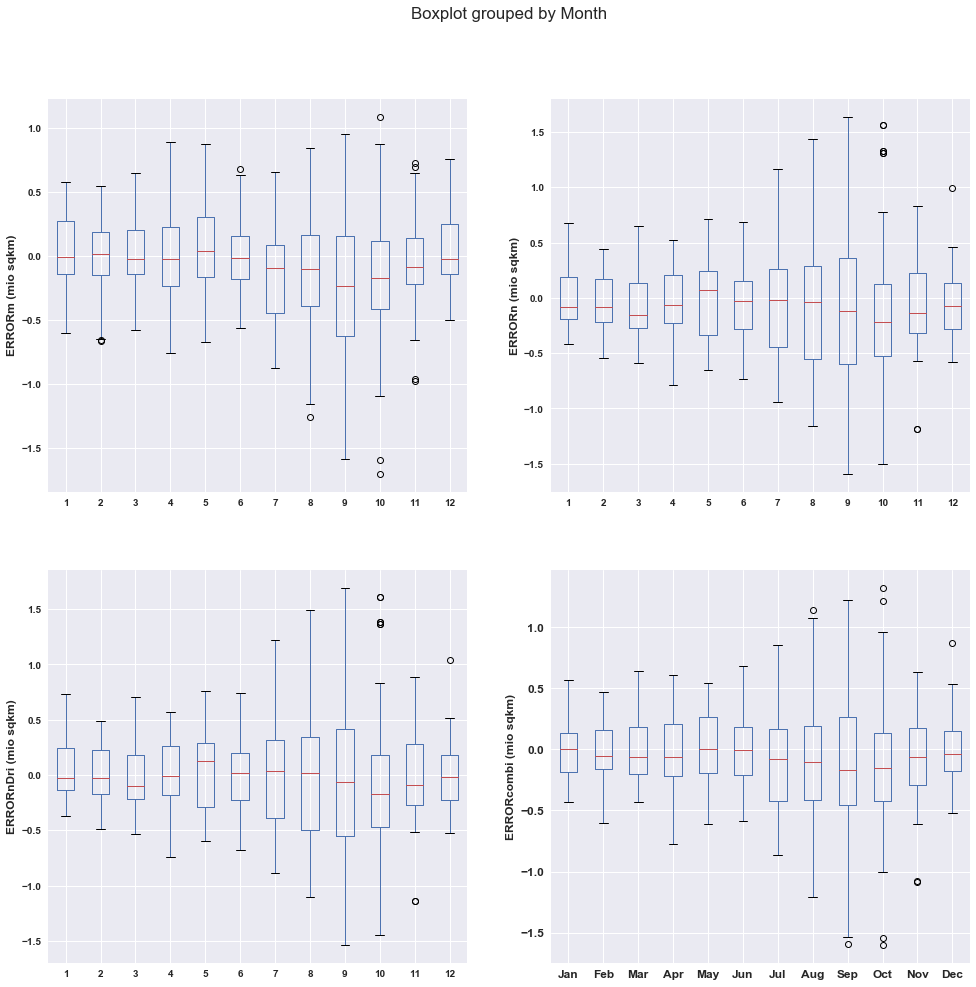

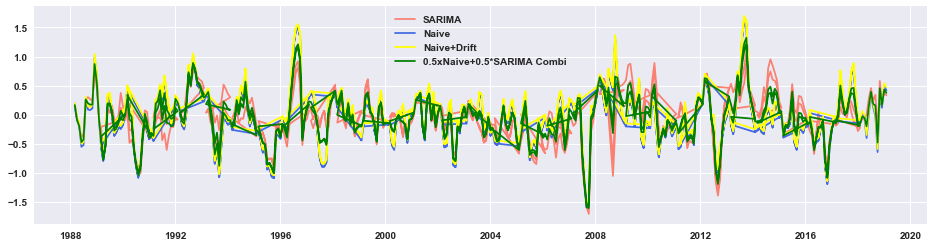

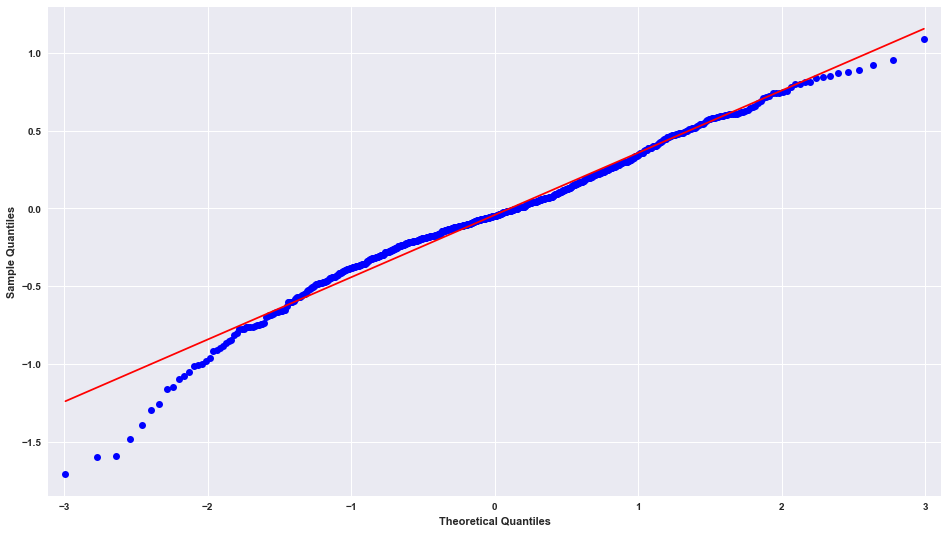

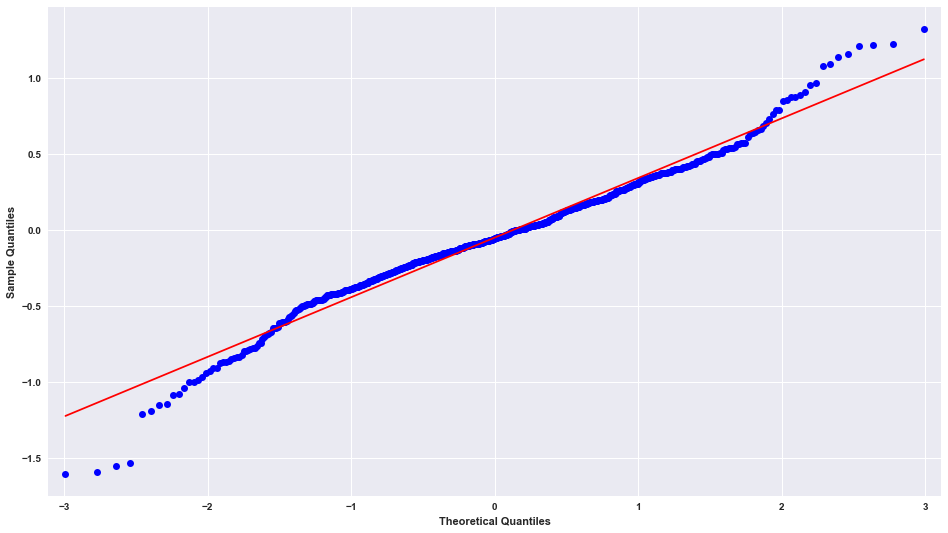

ERRORm :
ADF stats: -3.093588
p-value: 0.027031
Critical values:
	1%: -3.440
	5%: -2.866
	10%: -2.569
ERRORn :
ADF stats: -5.384346
p-value: 0.000004
Critical values:
	1%: -3.440
	5%: -2.866
	10%: -2.569
ERRORnDri :
ADF stats: -5.384346
p-value: 0.000004
Critical values:
	1%: -3.440
	5%: -2.866
	10%: -2.569
ERRORcombi :
ADF stats: -4.478031
p-value: 0.000215
Critical values:
	1%: -3.440
	5%: -2.866
	10%: -2.569


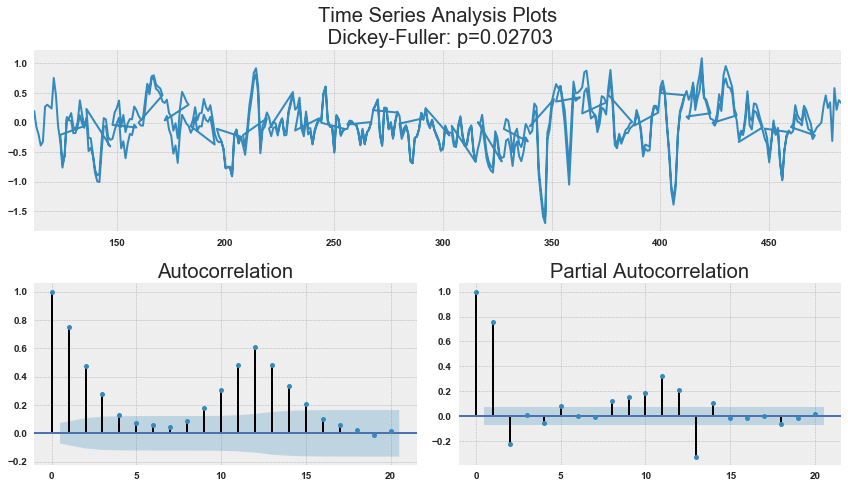

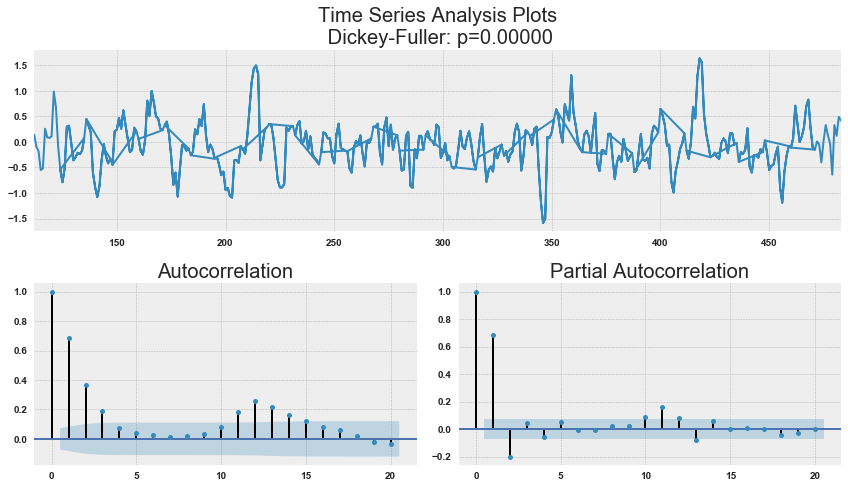

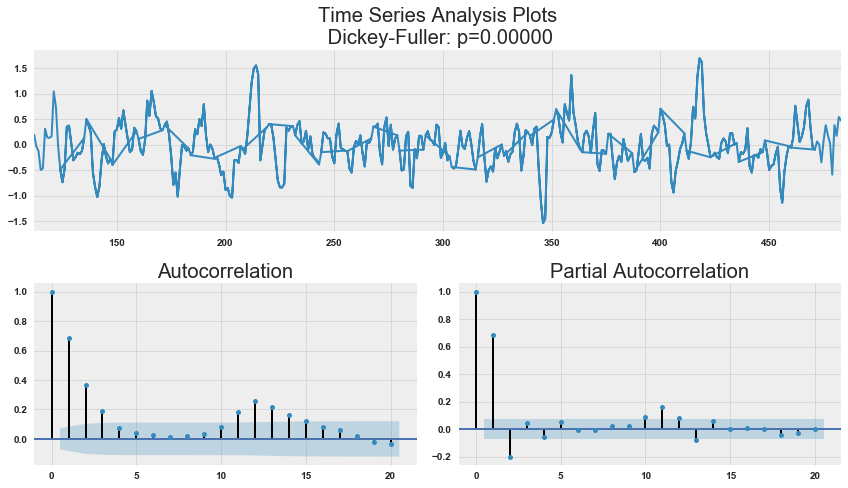

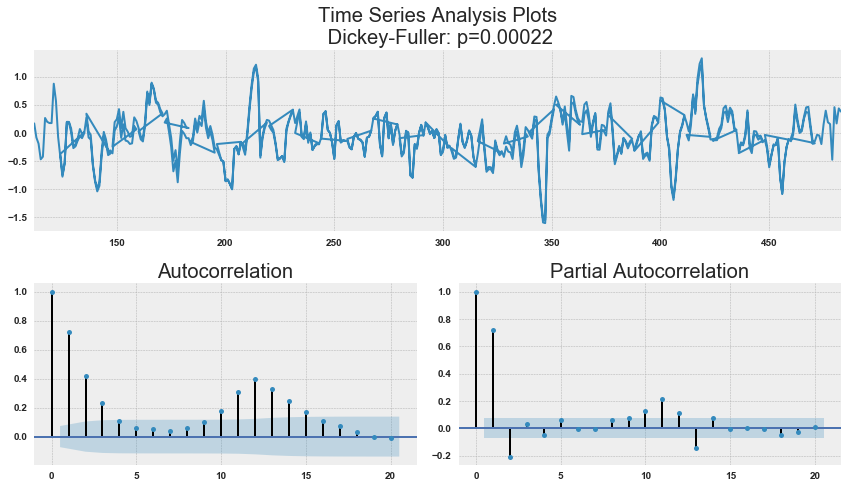

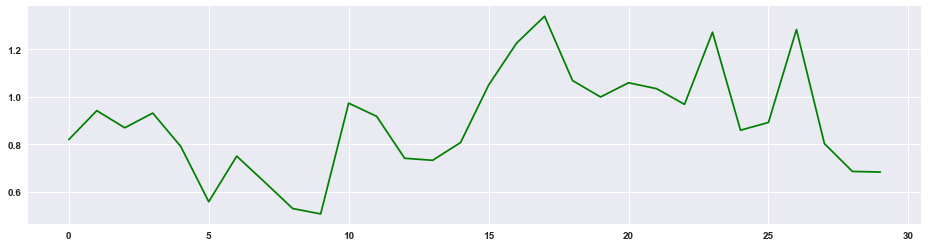

Thiels U ARIMA/Naive Season:  0.8906180659653511


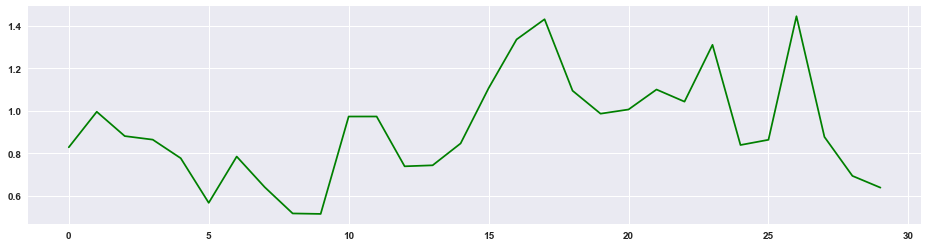

Thiels U ARIMA/Naive Season+Drift:  0.9144900999228817


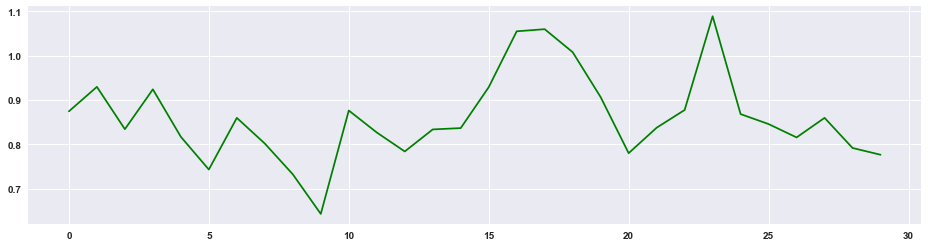

Thiels U Combi/Naive Season:  0.8604422198820987
CPU times: user 2h 31min 33s, sys: 32.2 s, total: 2h 32min 5s
Wall time: 1h 17min 7s


In [314]:
%%time
# hier lebt die eierlegende Wollmilchsau
# try 360 pred with 1 step iteration
# 120, 60 , 24,12 month with 12 steps iteration

X             = SIE_Mon.Datetime
ArimaData     = SIE_Mon.Extent_N

# number of forecast
n_forecasts = 24
# number of data to use for initial run
n_minTrain  = 100
# call crossvalidation function
df_tscv,df_meanerrors,result_tab = walk_foreward_evaluation(X,ArimaData,n_minTrain,parameters_list,d, D, s,\
                                                            n_forecasts,steps=12)

if n_forecasts==360:
    df_tscv360       = df_tscv.copy()
    df_meanerrors360 = df_meanerrors.copy()
    result_tab360    = result_tab.copy() 
elif n_forecasts==120:
    df_tscv120       = df_tscv.copy()
    df_meanerrors120 = df_meanerrors.copy()
    result_tab120    = result_tab.copy() 
elif n_forecasts==60:
    df_tscv60        = df_tscv.copy()
    df_meanerrors60  = df_meanerrors.copy()
    result_tab60     = result_tab.copy() 
elif n_forecasts==24:
    df_tscv24        = df_tscv.copy()
    df_meanerrors24  = df_meanerrors.copy()
    result_tab24     = result_tab.copy() 
elif n_forecasts==12:
    df_tscv12        = df_tscv.copy()
    df_meanerrors12  = df_meanerrors.copy()
    result_tab12     = result_tab.copy() 
elif n_forecasts==6:
    df_tscv6         = df_tscv.copy()
    df_meanerrors6   = df_meanerrors.copy()
    result_tab6      = result_tab.copy() 
elif n_forecasts==1:
    df_tscv1         = df_tscv.copy()
    df_meanerrors1   = df_meanerrors.copy()
    result_tab1      = result_tab.copy() 
else:
    print('No name specified for data frame storage!')
    

In [480]:
df_meanerrors360.describe()

,MapeM,MapeN,MapeDri,MapeCombi,RMSEM,RMSEN,RMSEDri,RMSECombi
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,7.571411,3.936231,3.875298,4.906749,0.812842,0.460727,0.457219,0.538707
std,1.573071,0.027613,0.024312,0.680012,0.155586,0.001917,0.001922,0.066126
min,5.774608,3.899271,3.840990,4.146296,0.644830,0.457228,0.454036,0.470600
25%,6.896606,3.914954,3.855445,4.603024,0.743679,0.459716,0.456027,0.510634
50%,7.285413,3.924502,3.865043,4.760854,0.779637,0.460165,0.456488,0.523277
75%,7.614633,3.970911,3.903932,4.890246,0.810641,0.462390,0.459163,0.537822
max,12.880753,3.978861,3.913612,7.246527,1.343435,0.463660,0.460205,0.767964


In [482]:
df_meanerrors120.describe()

,MapeM,MapeN,MapeDri,MapeCombi,RMSEM,RMSEN,RMSEDri,RMSECombi
count,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000
mean,4.558406,3.921682,3.861036,3.660308,0.506872,0.458358,0.454101,0.425204
std,1.724738,0.521197,0.514140,0.787704,0.141798,0.046488,0.049846,0.055184
min,2.454208,2.838954,2.764836,2.549011,0.320585,0.344604,0.332134,0.314515
25%,2.982830,3.559952,3.523284,3.031077,0.373693,0.425623,0.419447,0.386513
50%,4.242305,3.848484,3.797785,3.434800,0.493179,0.461280,0.459825,0.422314
75%,5.859046,4.258786,4.213422,4.253999,0.608816,0.491815,0.490811,0.455285
max,7.623144,4.808578,4.686589,5.110081,0.753173,0.529299,0.528315,0.529370


In [ ]:
#mapes 4.558406	3.921682	3.861036	3.660308

In [483]:
df_meanerrors60.describe()

,MapeM,MapeN,MapeDri,MapeCombi,RMSEM,RMSEN,RMSEDri,RMSECombi
count,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000
mean,3.826520,3.967052,3.906360,3.418585,0.427638,0.457821,0.453861,0.397873
std,1.425105,0.839609,0.827618,0.832267,0.123644,0.084006,0.087833,0.076898
min,1.687590,2.462888,2.433172,1.973612,0.233809,0.305955,0.298366,0.248596
25%,2.829026,3.337737,3.306455,2.825072,0.339351,0.400149,0.394610,0.361177
50%,3.341064,4.284246,4.197201,3.516931,0.407293,0.485608,0.486182,0.411027
75%,4.823670,4.599043,4.571901,4.065137,0.501679,0.500642,0.498641,0.449140
max,6.377775,5.034628,4.922861,4.494321,0.662414,0.596330,0.596101,0.508007


In [ ]:
#mapes 3.826520	3.967052	3.906360	3.418585

In [484]:
df_meanerrors24.describe()

,MapeM,MapeN,MapeDri,MapeCombi,RMSEM,RMSEN,RMSEDri,RMSECombi
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,3.405596,3.924502,3.865096,3.331621,0.384208,0.442189,0.436069,0.379393
std,1.539352,1.409627,1.435474,1.327208,0.123515,0.135938,0.143737,0.119093
min,1.547437,1.882832,1.823736,1.628672,0.214250,0.245153,0.232915,0.210828
25%,2.425850,3.088497,2.956169,2.317040,0.289081,0.352957,0.331428,0.288754
50%,2.999189,3.481069,3.602466,3.130912,0.361832,0.429120,0.413061,0.375528
75%,4.063745,4.547045,4.457954,3.798660,0.467501,0.499897,0.498972,0.452895
max,7.133525,7.116429,7.100683,6.634342,0.668176,0.755571,0.753891,0.606405


In [ ]:
#mapes 3.405596	3.924502	3.865096	3.331621

In [485]:
df_meanerrors12.describe()

,MapeM,MapeN,MapeDri,MapeCombi,RMSEM,RMSEN,RMSEDri,RMSECombi
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,3.213510,3.883344,3.831000,3.295058,0.350549,0.427874,0.422476,0.362727
std,1.877585,1.841822,1.835034,1.789541,0.149767,0.170173,0.175419,0.156149
min,1.306590,1.405889,1.436847,1.332873,0.160072,0.189385,0.172788,0.185518
25%,1.827130,2.630941,2.730734,2.081638,0.238605,0.315134,0.302727,0.233079
50%,2.611588,3.451239,3.162036,2.762335,0.315945,0.380263,0.354854,0.311363
75%,4.076923,4.939116,4.760659,4.169072,0.471619,0.526448,0.511823,0.449093
max,8.800426,8.525859,8.500250,8.535031,0.777385,0.828291,0.860875,0.762333


In [ ]:
#mapes 3.213510	3.883344	3.831000	3.295058	

In [315]:
error_stats=['ERRORm', 'ERRORn','ERRORnDri','ERRORcombi']
for i in error_stats:
        rt = dm_test(df_tscv.Testdata,df_tscv[i],df_tscv.ERRORn)
        print('DM of',i,'is: ', rt[0].round(3),' with p = ',rt[1].round(5))
        

DM of ERRORm is:  -3.209  with p =  0.00139
DM of ERRORn is:  nan  with p =  nan
DM of ERRORnDri is:  -93.533  with p =  0.0


SyntaxError: An element in the actual_lst, pred1_lst or pred2_lst is not numeric. (<string>)

In [460]:
# number of predictions that shall be made
#n_forecasts = 120
# number of data to use for initial run
#n_minTrain  = 100
# call crossvalidation function
#df_tscv,mapeMod,mapeNaiv,mapeNaivDri,mapeCombi,rmseMod,rmseNaiv,rmseNaivDri,rmseCombi,result_tab = \
#        walk_foreward_evaluation(df25A.Datetime,df25A.Extent_N,n_minTrain,parameters_list,d, D, s,\
#                                 n_forecasts,exog=df25A[['TairAvgA','NAO','UWNDavgA','SLPavgA']])


# make plots
#stats_plots(df_tscv,rmseMod,rmseNaiv,rmseNaivDri)

In [373]:
df_tscv.describe()

,ERRORm,ERRORn,ERRORnDri,ERRORcombi,Prediction_Model,Predition_Naive,Predition_NaiveDrift,Predition_Combi,Testdata,Month
count,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000
mean,-0.184311,-0.041500,0.011281,-0.112905,12.034686,11.891875,11.839094,11.963280,11.850375,6.500000
std,0.362417,0.523544,0.523544,0.412161,2.948115,2.976500,2.976500,2.956792,2.991742,3.459267
min,-1.101650,-1.090000,-1.037219,-1.095825,6.880437,6.080000,6.027219,6.492152,6.080000,1.000000
25%,-0.417134,-0.352500,-0.299719,-0.358541,9.663966,9.227500,9.174719,9.370402,9.227500,3.750000
50%,-0.179057,-0.060000,-0.007219,-0.090312,12.550505,12.565000,12.512219,12.583542,12.500000,6.500000
75%,0.066969,0.282500,0.335281,0.148676,14.828243,14.657500,14.604719,14.724083,14.650000,9.250000
max,0.754905,1.500000,1.552781,1.087848,15.804078,15.960000,15.907219,15.850006,15.960000,12.000000


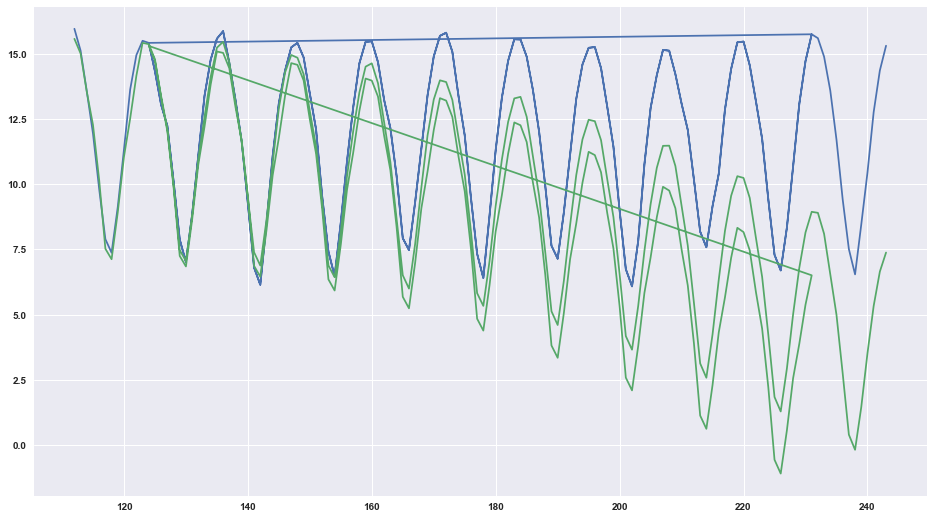

In [380]:
plt.plot(df_tscv.Testdata)
plt.plot(df_tscv.Prediction_Model)

In [439]:
result_table.head()

,parameters,bic
0,"(2, 1, 1, 2)",52.065716
1,"(1, 2, 1, 2)",52.818836
2,"(2, 1, 1, 3)",57.558285
3,"(2, 1, 2, 2)",57.608152
4,"(2, 2, 1, 2)",58.173260


In [322]:
# make a dataframe for all 4 variables
# including rmsem means of each prediction period up to 30 years -> 12*30= 360 = length
rmsem_continous = np.zeros(360)
rmsem_continous[0:12]    = 0.350549 #df_meanerrors12.RMSEM.mean()
rmsem_continous[12:24]   = 0.384208 #df_meanerrors24.RMSEM.mean()
rmsem_continous[24:60]   = 0.427638 #df_meanerrors60.RMSEM.mean()
rmsem_continous[60:120]  = 0.506872 # df_meanerrors120.RMSEM.mean()
rmsem_continous[120:360] = 0.812842 #df_meanerrors360.RMSEM.mean()


array([0.350549, 0.350549, 0.350549, 0.350549, 0.350549, 0.350549,
       0.350549, 0.350549, 0.350549, 0.350549, 0.350549, 0.350549,
       0.384208, 0.384208, 0.384208, 0.384208, 0.384208, 0.384208,
       0.384208, 0.384208, 0.384208, 0.384208, 0.384208, 0.384208,
       0.427638, 0.427638, 0.427638, 0.427638, 0.427638, 0.427638,
       0.427638, 0.427638, 0.427638, 0.427638, 0.427638, 0.427638,
       0.427638, 0.427638, 0.427638, 0.427638, 0.427638, 0.427638,
       0.427638, 0.427638, 0.427638, 0.427638, 0.427638, 0.427638,
       0.427638, 0.427638, 0.427638, 0.427638, 0.427638, 0.427638,
       0.427638, 0.427638, 0.427638, 0.427638, 0.427638, 0.427638,
       0.506872, 0.506872, 0.506872, 0.506872, 0.506872, 0.506872,
       0.506872, 0.506872, 0.506872, 0.506872, 0.506872, 0.506872,
       0.506872, 0.506872, 0.506872, 0.506872, 0.506872, 0.506872,
       0.506872, 0.506872, 0.506872, 0.506872, 0.506872, 0.506872,
       0.506872, 0.506872, 0.506872, 0.506872, 0.506872, 0.506

### SARIMA with exogen parameters

In [345]:
#prepare exogen dataframe
SIE_Mon.tail()
MetDataM.tail()
clim_indices_Mon.tail()

start = SIE_Mon.Datetime[0]
dfmetA  = MetDataM[['Datetime','TairAvgA','UWNDavgA']].loc[MetDataM.Datetime>=start]
dfindiA = clim_indices_Mon[['Datetime','NAO','PNA']].loc[clim_indices_Mon.Datetime>=start]
dfindiA = dfindiA[:-1]
df_pr  = pd.merge(dfmetA,dfindiA,how='outer',on='Datetime')
df_pr.head()

,Datetime,TairAvgA,UWNDavgA,NAO,PNA
0,1978-11-01,-17.311600,1.429440,3.04,-0.49
1,1978-12-01,-22.140715,-0.217783,-1.57,-0.72
2,1979-01-01,-24.072439,-0.251774,-1.38,-0.69
3,1979-02-01,-27.585587,0.175868,-0.67,-1.82
4,1979-03-01,-20.623926,-0.674127,0.78,0.38


In [346]:
df_pr.drop('Datetime',axis=1,inplace=True)
df_pr.head()

,TairAvgA,UWNDavgA,NAO,PNA
0,-17.311600,1.429440,3.04,-0.49
1,-22.140715,-0.217783,-1.57,-0.72
2,-24.072439,-0.251774,-1.38,-0.69
3,-27.585587,0.175868,-0.67,-1.82
4,-20.623926,-0.674127,0.78,0.38


In [351]:
ArimaDataEx   = SIE_Mon.Extent_N[:-1]
X             = SIE_Mon.Datetime[:-1]
exogen        = df_pr
print(len(ArimaDataEx),len(X),len(df_pr.NAO))
ps = range(1,4) #range(6, 11) #10-14 first run
d  = 1 
qs = range(1, 3)  #2-5 fr
Ps = range(1, 3)  #1-3
D  = 1 
Qs = range(2,4)  #2-8 #1,5
s = 12 # season length is still 24

# creating list with all the possible combinations of parameters
parametersex = product(ps, qs, Ps, Qs)
parameters_listex = list(parametersex)
print(len(parameters_listex))
result_tableex = optimizeSARIMA(ArimaDataEx,parameters_listex, d, D, s,exog=exogen)
result_tableex.head(15)    
p, q, P, Q = result_tableex.parameters[0]

500 500 500
48


,parameters,bic
0,"(2, 1, 1, 2)",49.111183
1,"(1, 2, 1, 2)",49.511787
2,"(2, 1, 2, 2)",54.898047
3,"(3, 1, 1, 2)",54.966546
4,"(2, 1, 1, 3)",55.253898
5,"(1, 3, 1, 2)",55.418019
6,"(1, 2, 2, 2)",55.881893
7,"(1, 2, 1, 3)",56.077884
8,"(1, 1, 1, 2)",58.351339
9,"(4, 1, 1, 2)",60.178679


In [352]:
p, q, P, Q = result_tableex.parameters[0]

                                        SARIMAX Results                                        
Dep. Variable:                                Extent_N   No. Observations:                  500
Model:             SARIMAX(2, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood                   9.480
Date:                                 Tue, 11 Aug 2020   AIC                              3.040
Time:                                         10:43:33   BIC                             49.111
Sample:                                              0   HQIC                            21.139
                                                 - 500                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
TairAvgA      -0.0490      0.010     -4.835      0.000      -0.069      -0

ValueError: Out-of-sample operations in a model with a regression component require additional exogenous values via the `exog` argument.

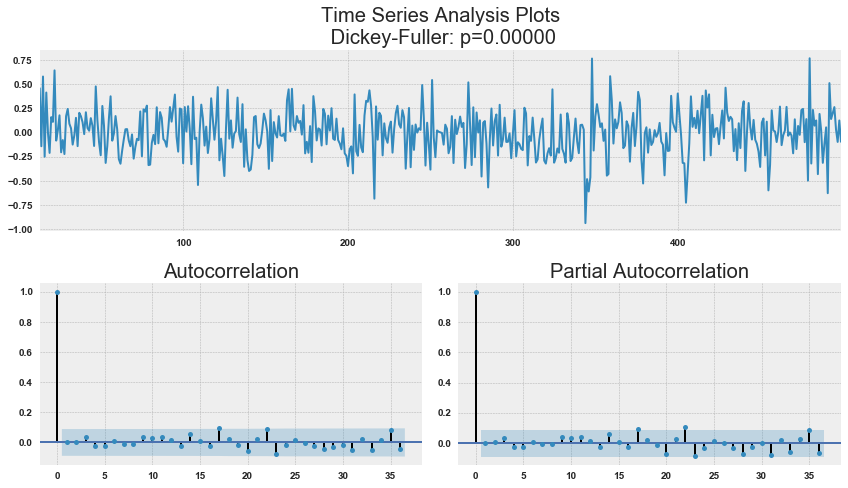

In [354]:
best_model_ex=sm.tsa.statespace.SARIMAX(ArimaDataEx, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s),exog=exogen).fit(disp=-1)
print(best_model_ex.summary())
    
tsplot(best_model_ex.resid[12+1:], lags=36)
plt.savefig('figures/Models/SARIMAx_bestModelACFExtent_N.png')
    
plotSARIMA(ArimaDataEx, best_model_ex, 120);
plt.savefig('figures/Models/SARIMAx_ftExtent_N.png');

**To do:**
* prepare everything for cross validation:
    * adapt Train test split: need exogen parameters after plitting for prediction!
* check if model can be improved by exogen data
* if yes: model exogen parameters by
    * naive forecast
    * SARIMA or other more complex model

In [ ]:
# pred = mod.get_prediction(tr_end,'2018-03-31',exog =target_exog)#
# get some help here:
# https://www.kaggle.com/poiupoiu/how-to-use-sarimax

## VARIMAX

## Linear (and not quite) models

In [462]:
def plotModelResults(model, X_train=X_trainLM, X_test=X_testLM,y_train=y_trainLM, y_test=y_testLM, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscvLM, 
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);
    
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_trainLM.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

### Data preparation

In [463]:
# Creating a copy of the initial datagrame to make various transformations 
dataLM = pd.DataFrame(SIE_Mon[['Datetime','Extent_N']][:-1].copy())
dataLM.columns = ['Datetime','y']

In [464]:
# Adding the lag of the target variable from 12 steps back up to 120 corresponding to 1-10 years
for i in range(12, 121,12):
    dataLM["lag_{}".format(i)] = dataLM.y.shift(i)
    
# Adding one month lag and 6 month lag
dataLM['lag_6'] = dataLM.y.shift(6)
dataLM['lag_1'] = dataLM.y.shift(1)
dataLM.tail()

,Datetime,y,lag_12,lag_24,lag_36,lag_48,lag_60,lag_72,lag_84,lag_96,lag_108,lag_120,lag_6,lag_1
495,2020-02-01,14.68,14.39,13.97,14.12,14.20,14.40,14.42,14.72,14.55,14.36,14.58,5.03,13.65
496,2020-03-01,14.78,14.57,14.30,14.29,14.40,14.37,14.76,15.03,15.20,14.55,15.14,4.36,14.68
497,2020-04-01,13.73,13.43,13.70,13.75,13.68,13.89,14.09,14.30,14.63,14.11,14.66,5.73,14.78
498,2020-05-01,12.36,12.19,12.23,12.63,11.92,12.47,12.70,13.00,13.01,12.68,12.87,9.35,13.73
499,2020-06-01,10.58,10.59,10.78,10.76,10.41,10.88,11.03,11.36,10.67,10.75,10.59,11.90,12.36


In [465]:
dataLM.head(10)

,Datetime,y,lag_12,lag_24,lag_36,lag_48,lag_60,lag_72,lag_84,lag_96,lag_108,lag_120,lag_6,lag_1
0,1978-11-01,11.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1978-12-01,13.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.65
2,1979-01-01,15.41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.67
3,1979-02-01,16.18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.41
4,1979-03-01,16.34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.18
5,1979-04-01,15.45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.34
6,1979-05-01,13.86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.65,15.45
7,1979-06-01,12.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.67,13.86
8,1979-07-01,10.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.41,12.53
9,1979-08-01,8.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.18,10.31


### Linear Regression

#### Simply extent

In [466]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
tscvLM = TimeSeriesSplit(n_splits=10)

In [467]:
yLM = dataLM.dropna().y
XLM = dataLM.dropna().drop(['y','Datetime'], axis=1)

# reserve 30% of data for testing
X_trainLM, X_testLM, y_trainLM, y_testLM = timeseries_train_test_split(XLM, yLM, test_size=0.3)

In [468]:
lr = LinearRegression()
lr.fit(X_trainLM, y_trainLM)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

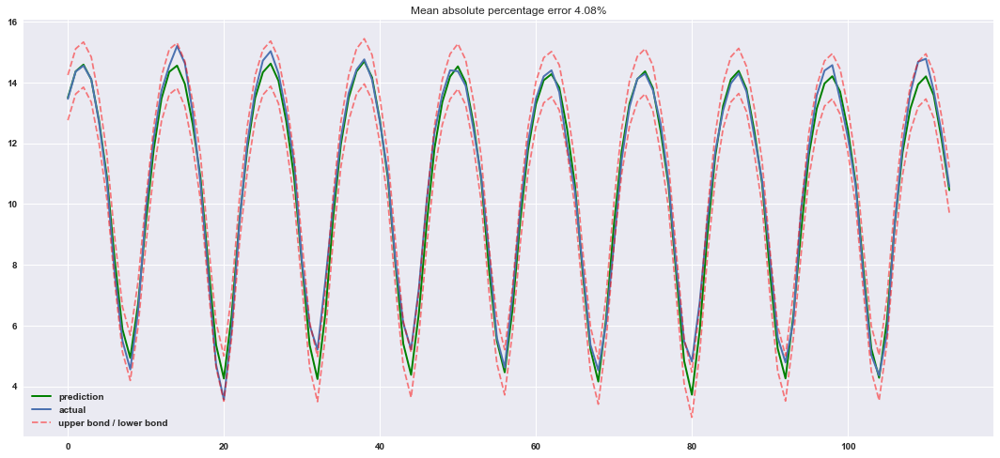

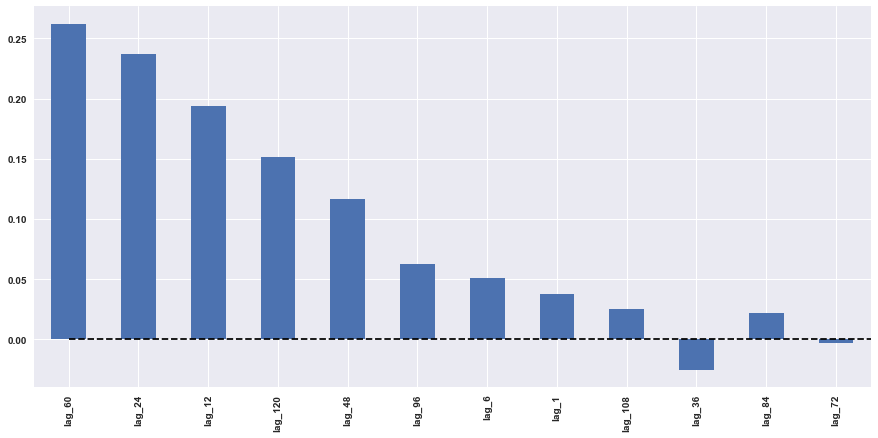

In [469]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

#### With exogen parameters

In [470]:
dfmetAex  = MetDataM[['Datetime','TairAvgA']].loc[MetDataM.Datetime>=start]
dataLM    = pd.merge(dfmetAex,dataLM,how='outer',on='Datetime')


#pd.concat([dataLM,MetDataM['TairAvgA'].loc[MetDataM.Datetime>=start]],axis=1)
dataLM.head()

,Datetime,TairAvgA,y,lag_12,lag_24,lag_36,lag_48,lag_60,lag_72,lag_84,lag_96,lag_108,lag_120,lag_6,lag_1
0,1978-11-01,-17.311600,11.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1978-12-01,-22.140715,13.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.65
2,1979-01-01,-24.072439,15.41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.67
3,1979-02-01,-27.585587,16.18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.41
4,1979-03-01,-20.623926,16.34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.18


In [471]:
yLMex = dataLM.dropna().y
XLMex = dataLM.dropna().drop(['Datetime','y'], axis=1)

# reserve 30% of data for testing
X_trainLM, X_testLM, y_trainLM, y_testLM = timeseries_train_test_split(XLMex, yLMex, test_size=0.3)

In [472]:
X_testLM.shape

(114, 13)

In [473]:
lr = LinearRegression()
lr.fit(X_trainLM, y_trainLM)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

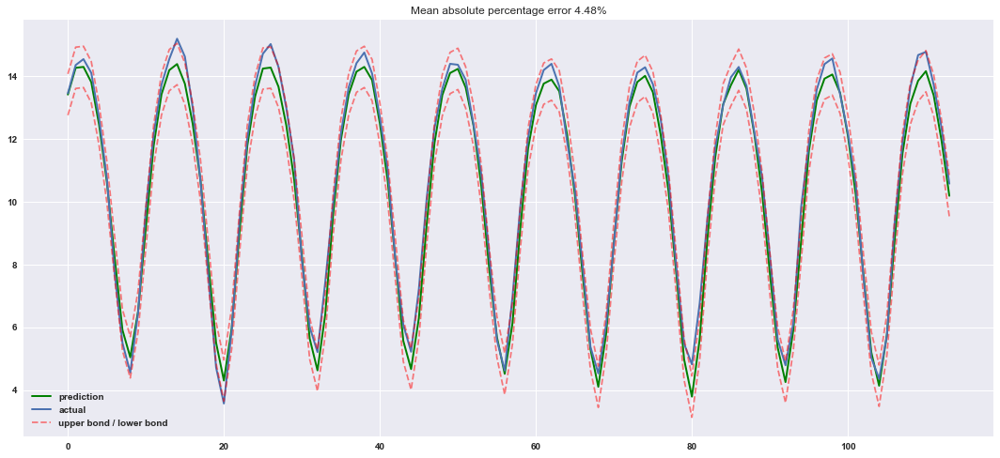

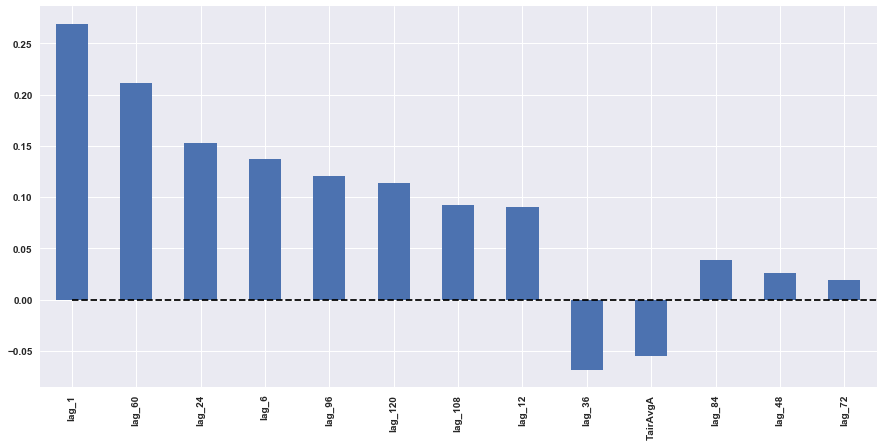

In [474]:
plotModelResults(lr,X_trainLM, X_testLM, y_trainLM, y_testLM, plot_intervals=True)
plotCoefficients(lr)

**To do:**
* try tair with lags
* use other variables like Wind, NAO etc

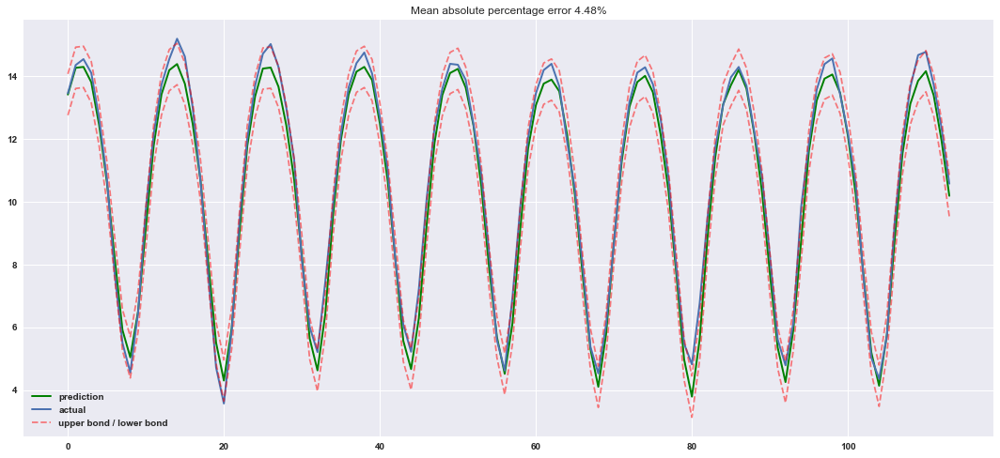

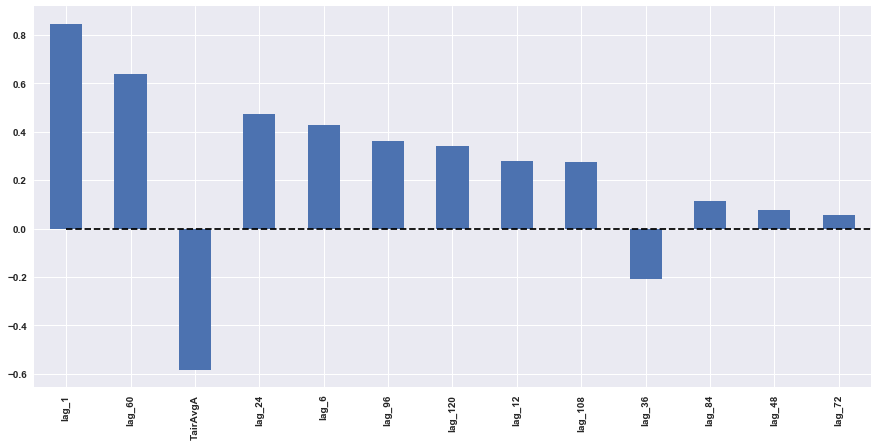

In [475]:
# try a scaled version
X_train_scaled = scaler.fit_transform(X_trainLM)
X_test_scaled = scaler.transform(X_testLM)

lr_scaled = LinearRegression()
lr_scaled.fit(X_train_scaled, y_trainLM)

plotModelResults(lr_scaled, X_train=X_train_scaled, X_test=X_test_scaled,y_train=y_trainLM, y_test=y_testLM, plot_intervals=True)
plotCoefficients(lr_scaled)

That needs further investigations!

### Ridge regression

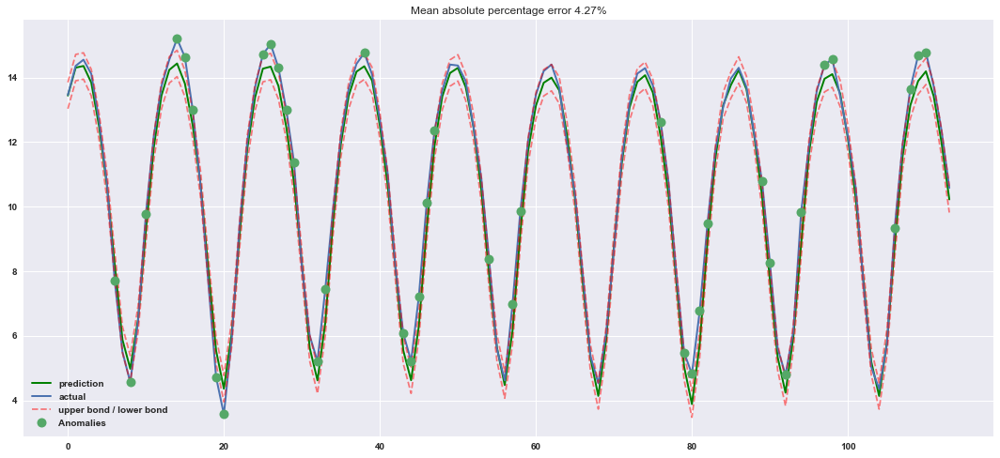

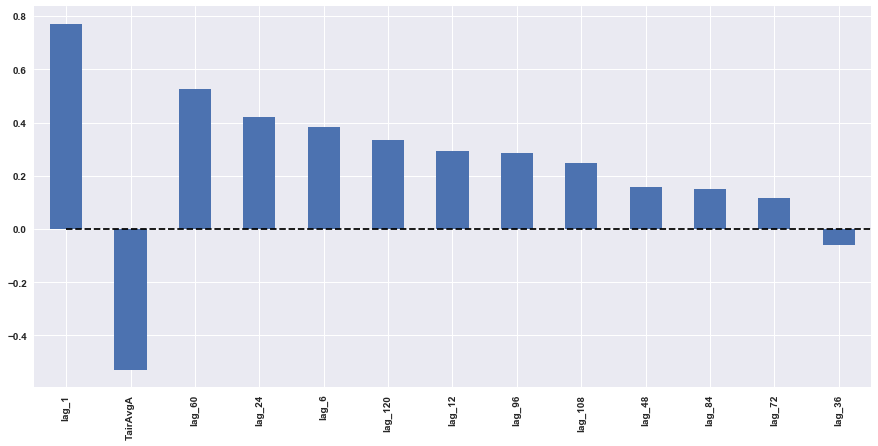

In [476]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscvLM)
ridge.fit(X_train_scaled, y_trainLM)

plotModelResults(ridge, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 y_train=y_trainLM, 
                 y_test=y_testLM,
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

### Lasso regression

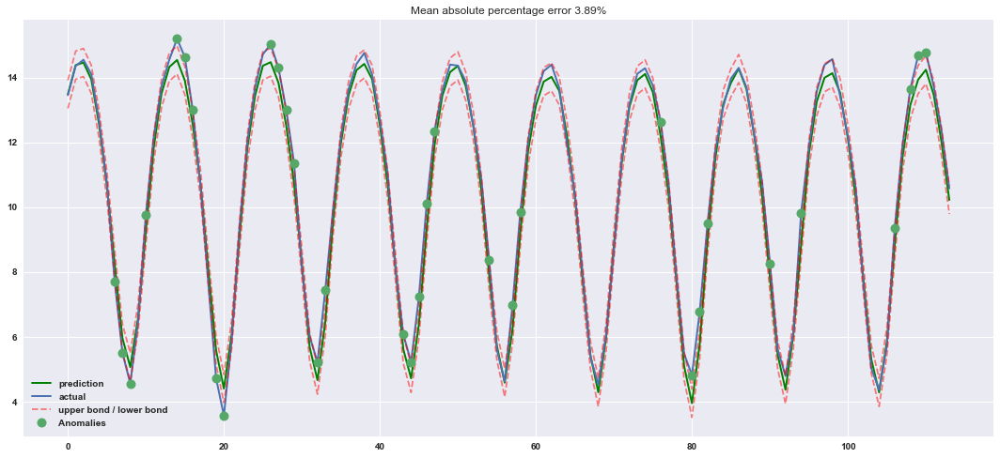

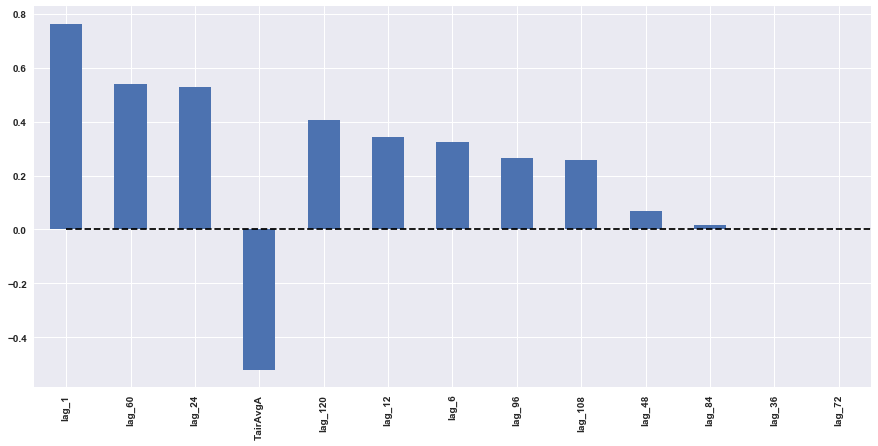

In [477]:
lasso = LassoCV(cv=tscvLM)
lasso.fit(X_train_scaled, y_trainLM)

plotModelResults(lasso, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 y_train=y_trainLM, 
                 y_test=y_testLM,
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

### XGBoost

In [478]:
from xgboost import XGBRegressor 

xgb = XGBRegressor()
xgb.fit(X_train_scaled, y_trainLM)

[13:58:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

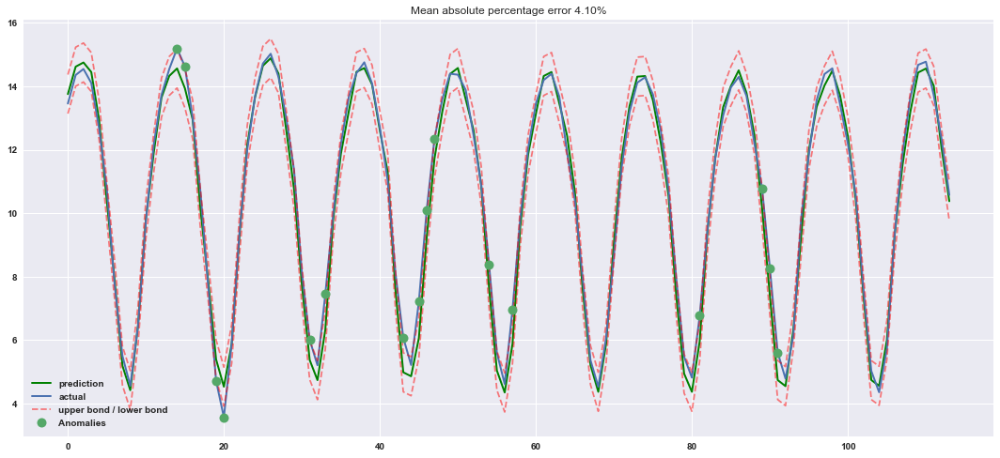

In [479]:
plotModelResults(xgb, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 y_train=y_trainLM, 
                 y_test=y_testLM,
                 plot_intervals=True, plot_anomalies=True)

In [ ]:
# code found here: https://www.kaggle.com/kashnitsky/topic-9-part-1-time-series-analysis-in-python/notebook

* Check all the error intervals
* incoorporate all these models into cross validation
* grid search?

## Model predictions

/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.p

/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


/Users/sandra/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                        SARIMAX Results                                        
Dep. Variable:                                Extent_N   No. Observations:                  501
Model:             SARIMAX(2, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood                  -4.367
Date:                                 Thu, 27 Aug 2020   AIC                             22.734
Time:                                         10:26:08   BIC                             52.066
Sample:                                              0   HQIC                            34.255
                                                 - 501                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8701      0.040     21.807      0.000       0.792       0

NameError: name 'rmsem_continous' is not defined

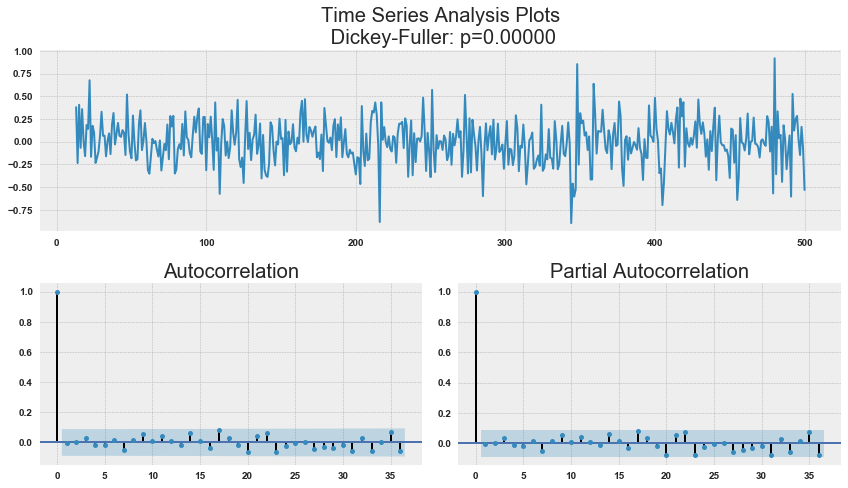

In [321]:
%%time
X             = SIE_Mon.Datetime
cols          = ['Extent_N','Area_N','Extent_S','Area_S']
hemis         = ['Arctic','Arctic','Antarctic','Antarctic']
varabl        = ['Sea ice extent','Ice covered Area','Sea ice extent','Ice covered Area']
pred_Length   = 120
# make dictonary for dfs prediction length -> nein, ein array mit fehler für die ersten Monate, die naächsten und so weiter!

for i in range(4):
    if i == 0:
        ArimaData     = SIE_Mon.Extent_N
        upper_bound   = SIE_Mon.Extent_N#+np.mean(df)
        lower_bound   = SIE_Mon.Extent_N
    elif i == 1:
        ArimaData     = SIE_Mon.Area_N
    elif i == 2:
        ArimaData     = SIE_Mon.Extent_S
    else:
        ArimaData     = SIE_Mon.Area_S
        
    # setting initial values and some bounds for them
    ps = range(1,5) #range(6, 11) #10-14 first run
    d  = 1 
    qs = range(1, 4)  #2-5 fr
    Ps = range(1, 3)  #1-3
    D  = 1 
    Qs = range(2,4)  #2-8 #1,5
    s = 12 # season length is still 24

    # creating list with all the possible combinations of parameters
    parameters = product(ps, qs, Ps, Qs)
    parameters_list = list(parameters)

    result_table = optimizeSARIMA(ArimaData,parameters_list, d, D, s)
    
    p, q, P, Q = result_table.parameters[0]

    best_model=sm.tsa.statespace.SARIMAX(ArimaData, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
    print(best_model.summary())
    
    tsplot(best_model.resid[12+1:], lags=36)
    plt.savefig('figures/Models/SARIMA_bestModelACF'+cols[i]+'.png')
    
    plotSARIMA(ArimaData, best_model, pred_Length,rmsem_continous,\
           savename='figures/Models/SARIMA_Pred_ts'+cols[i]+'.png',\
           savename2='figures/Models/SARIMA_Pred_ts'+cols[i]+'_zoom.png',\
              region = hemis[i], variab=variabl[i]);

Index(['Extent_N'], dtype='object')
Index(['actual'], dtype='object')


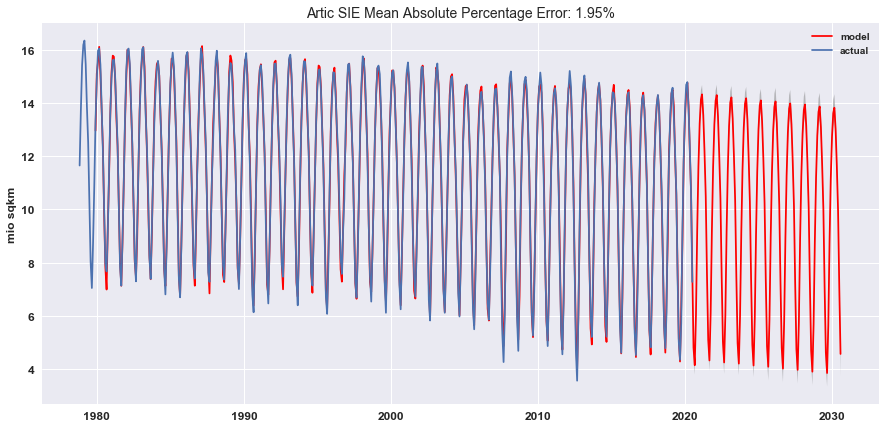

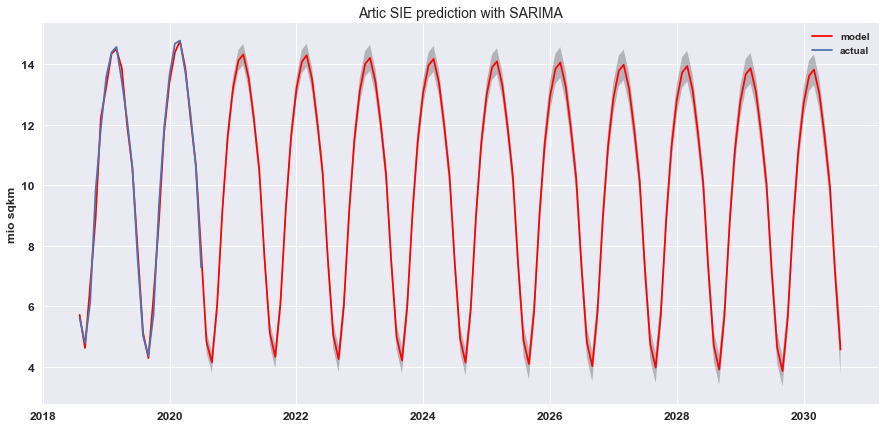

In [360]:
pred_Length   = 120
plotSARIMA(ArimaData, best_model, pred_Length,rmsem_continous,region='Artic',variab='SIE');
    #plt.savefig('figures/Models/SARIMA_ft'+cols[i]+'.png');

# Summary
___

# Outlook
___

* More data cleaning: proof whether abrupt jumps are due to inconsistencies in the data
* Prediction of sea ice using Neural Networks approach
* Consider exogen variables for more precise prediction
* Predict sea ice extent for subregions in the Arctic
* Increase regional investigation by predicting sea ice concentration and displaying regions with sea ice instead of solely sea ice extent for particular areas
